In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
from scipy import stats
import math
import matplotlib.ticker as ticker
import sklearn

In [3]:
sklearn.__version__

'1.0.2'

In [4]:
data_out = pd.read_csv('/content/drive/MyDrive/TFG_Vanesa_Gómez_Martínez/BPtRoster.csv')

In [5]:
data_out.head()

,RecID,PtID,BCaseControlStatus
0,6,199,Case
1,8,194,Case
2,9,56,Control
3,10,201,Case
4,11,107,Control


Eliminamos RecID, ya que el identificador de cada paciente es PtID

In [6]:
data_out.drop(['RecID'], axis=1, inplace=True)


In [7]:
data_out.head()

,PtID,BCaseControlStatus
0,199,Case
1,194,Case
2,56,Control
3,201,Case
4,107,Control


De esta manera, nos quedamos con el ID correspondiente para cada paciente

A continuación, reemplazo a los pacientes Caso por un 1, y a los pacientes Control por un 0, consiguiendo así una variable binaria:

In [8]:
data_out['BCaseControlStatus']=data_out['BCaseControlStatus'].replace(['Case'], 1).replace(['Control'], 0)


In [9]:
data_out.head()

,PtID,BCaseControlStatus
0,199,1
1,194,1
2,56,0
3,201,1
4,107,0


In [10]:
data_out.isnull().values.any()

False

In [11]:
data_out.shape

(203, 2)

Además, no existe ningún valor NaN, por lo que no existen valores perdidos en los pacientes caso y control.

A continuación, uniremos los dos dataframes por su PtID y así crear un único dataframe:

In [12]:
data1=pd.read_csv('/content/drive/MyDrive/TFG_Vanesa_Gómez_Martínez/BTotTestScores.csv', sep=';')

In [13]:
data1.head()

,RecID,PtID,BGVisit1,BGVisit1NotDone,HopVerbNotDone,HopVerbNotDoneReas,HopVerbCompDaysFromEnroll,HopVerbTr1TotCorr,HopVerbTr1NotDone,HopVerbTr2TotCorr,...,FrailtyFirstWalkNotDone,FrailtySecWalkTotTimeMin,FrailtySecWalkTotTimeSec,FrailtySecWalkNotDone,FrailtyPtUsedDev,ReadCardNotDone,ReadCardCompDaysFromEnroll,ReadCardLowLine,ReadCardCorrLens,ReadCardOthVisAid
0,9,199,15500.0,NaN,NaN,NaN,7.0,5.0,NaN,7.0,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/32,1.0,NaN
1,19,56,34800.0,NaN,NaN,NaN,18.0,4.0,NaN,6.0,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/63,NaN,NaN
2,14,201,13400.0,NaN,NaN,NaN,7.0,6.0,NaN,8.0,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/32,NaN,NaN
3,15,107,26700.0,NaN,NaN,NaN,24.0,5.0,NaN,6.0,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/20,1.0,NaN
4,18,47,10900.0,NaN,NaN,NaN,0.0,3.0,NaN,4.0,...,NaN,0.0,5.0,NaN,1.0,NaN,11,20/32,1.0,NaN


In [14]:
data1.drop(['RecID'], axis=1, inplace=True)


In [15]:
data1.head()

,PtID,BGVisit1,BGVisit1NotDone,HopVerbNotDone,HopVerbNotDoneReas,HopVerbCompDaysFromEnroll,HopVerbTr1TotCorr,HopVerbTr1NotDone,HopVerbTr2TotCorr,HopVerbTr2NotDone,...,FrailtyFirstWalkNotDone,FrailtySecWalkTotTimeMin,FrailtySecWalkTotTimeSec,FrailtySecWalkNotDone,FrailtyPtUsedDev,ReadCardNotDone,ReadCardCompDaysFromEnroll,ReadCardLowLine,ReadCardCorrLens,ReadCardOthVisAid
0,199,15500.0,NaN,NaN,NaN,7.0,5.0,NaN,7.0,NaN,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/32,1.0,NaN
1,56,34800.0,NaN,NaN,NaN,18.0,4.0,NaN,6.0,NaN,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/63,NaN,NaN
2,201,13400.0,NaN,NaN,NaN,7.0,6.0,NaN,8.0,NaN,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/32,NaN,NaN
3,107,26700.0,NaN,NaN,NaN,24.0,5.0,NaN,6.0,NaN,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/20,1.0,NaN
4,47,10900.0,NaN,NaN,NaN,0.0,3.0,NaN,4.0,NaN,...,NaN,0.0,5.0,NaN,1.0,NaN,11,20/32,1.0,NaN


A continuación, compilamos las dos bases de datos por el identificador del paciente:

In [16]:
data = data_out.merge(data1, on='PtID')


In [17]:
data.head()

,PtID,BCaseControlStatus,BGVisit1,BGVisit1NotDone,HopVerbNotDone,HopVerbNotDoneReas,HopVerbCompDaysFromEnroll,HopVerbTr1TotCorr,HopVerbTr1NotDone,HopVerbTr2TotCorr,...,FrailtyFirstWalkNotDone,FrailtySecWalkTotTimeMin,FrailtySecWalkTotTimeSec,FrailtySecWalkNotDone,FrailtyPtUsedDev,ReadCardNotDone,ReadCardCompDaysFromEnroll,ReadCardLowLine,ReadCardCorrLens,ReadCardOthVisAid
0,199,1,15500.0,NaN,NaN,NaN,7.0,5.0,NaN,7.0,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/32,1.0,NaN
1,56,0,34800.0,NaN,NaN,NaN,18.0,4.0,NaN,6.0,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/63,NaN,NaN
2,201,1,13400.0,NaN,NaN,NaN,7.0,6.0,NaN,8.0,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/32,NaN,NaN
3,107,0,26700.0,NaN,NaN,NaN,24.0,5.0,NaN,6.0,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/20,1.0,NaN
4,47,1,10900.0,NaN,NaN,NaN,0.0,3.0,NaN,4.0,...,NaN,0.0,5.0,NaN,1.0,NaN,11,20/32,1.0,NaN


In [18]:
print(data.shape)

(201, 81)


A continuación, eliminaremos el PtID, ya que ya no lo necesitamos y no nos aporta ningún tipo de información:

In [19]:

data.drop(['PtID'], axis=1, inplace=True)

In [20]:
data.head()

,BCaseControlStatus,BGVisit1,BGVisit1NotDone,HopVerbNotDone,HopVerbNotDoneReas,HopVerbCompDaysFromEnroll,HopVerbTr1TotCorr,HopVerbTr1NotDone,HopVerbTr2TotCorr,HopVerbTr2NotDone,...,FrailtyFirstWalkNotDone,FrailtySecWalkTotTimeMin,FrailtySecWalkTotTimeSec,FrailtySecWalkNotDone,FrailtyPtUsedDev,ReadCardNotDone,ReadCardCompDaysFromEnroll,ReadCardLowLine,ReadCardCorrLens,ReadCardOthVisAid
0,1,15500.0,NaN,NaN,NaN,7.0,5.0,NaN,7.0,NaN,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/32,1.0,NaN
1,0,34800.0,NaN,NaN,NaN,18.0,4.0,NaN,6.0,NaN,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/63,NaN,NaN
2,1,13400.0,NaN,NaN,NaN,7.0,6.0,NaN,8.0,NaN,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/32,NaN,NaN
3,0,26700.0,NaN,NaN,NaN,24.0,5.0,NaN,6.0,NaN,...,NaN,0.0,3.0,NaN,NaN,NaN,0,20/20,1.0,NaN
4,1,10900.0,NaN,NaN,NaN,0.0,3.0,NaN,4.0,NaN,...,NaN,0.0,5.0,NaN,1.0,NaN,11,20/32,1.0,NaN


Ya tenemos ambos dataframes unidos por PtID, así a continuación podemos empezar a tratar los datos

In [21]:
data.dtypes[0:30]

BCaseControlStatus             int64
BGVisit1                     float64
BGVisit1NotDone              float64
HopVerbNotDone               float64
HopVerbNotDoneReas            object
HopVerbCompDaysFromEnroll    float64
HopVerbTr1TotCorr            float64
HopVerbTr1NotDone            float64
HopVerbTr2TotCorr            float64
HopVerbTr2NotDone            float64
HopVerbTr3NotDone            float64
HopVerbTr3TotCorr            float64
HopVerbTr4NotDone            float64
HopVerbTr4TotCorr            float64
HopVerbNumHits               float64
HopVerbSemRelErr             float64
HopVerbSemUnRelErr           float64
HopVerbNumFalPosErr          float64
HopVerbNumIntr               float64
HopVerbPtEff                  object
SymbDigWNotDone              float64
SymbDigWNotDoneReas           object
SymbDigCompDaysFromEnroll    float64
SymbDigWTotCorr              float64
SymbDigWNumErr               float64
SymbDigWPtEff                 object
SymbDigONotDone              float64
S

In [22]:
data.dtypes[31:61]

TrailMakANotDone              float64
TrailMakANotDoneReas          float64
TrailMakCompDaysFromEnroll      int64
TrailMakATotTime                int64
TrailMakANumErr                 int64
TrailMakAPtEff                 object
TrailMakBNotDone              float64
TrailMakBNotDoneReas           object
TrailMakBTotTime              float64
TrailMakBNumErr               float64
TrailMakBPtEff                 object
GrPegDomHand                   object
GrPegDomNotDone               float64
GrPegDomNotDoneReas            object
GrPegCompDaysFromEnroll       float64
GrPegDomTotTime               float64
GrPegDomNumDrops              float64
GrPegDomPtEff                  object
GrPegNonNotDone               float64
GrPegNonNotDoneReas            object
GrPegNonTotTime               float64
GrPegNonNumDrops              float64
GrPegNonPtEff                  object
BGVisit2                      float64
BGVisit2NotDone               float64
FuncActNotDone                float64
FuncActNotDo

In [23]:
data.dtypes[61:81]

DukeSocNotDoneReasDs           object
DukeSocCompDaysFromEnroll     float64
DukeSocIntScore               float64
DukeSocSatScore               float64
DukeSocTotDSSI                float64
FrailtyNotDone                float64
FrailtyCompDaysFromEnroll     float64
FrailtyFirstWalkTotTimeMin    float64
FrailtyFirstWalkTotTimeSec    float64
FrailtyFirstWalkNotDone       float64
FrailtySecWalkTotTimeMin      float64
FrailtySecWalkTotTimeSec      float64
FrailtySecWalkNotDone         float64
FrailtyPtUsedDev              float64
ReadCardNotDone               float64
ReadCardCompDaysFromEnroll      int64
ReadCardLowLine                object
ReadCardCorrLens              float64
ReadCardOthVisAid             float64
dtype: object

# ***Visualización de datos***

HopVerbNotDoneReas


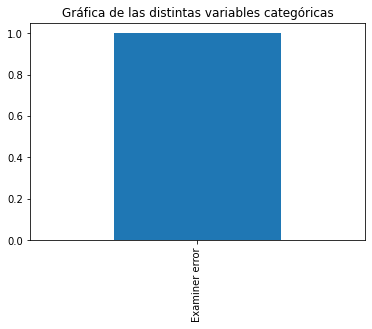

HopVerbPtEff


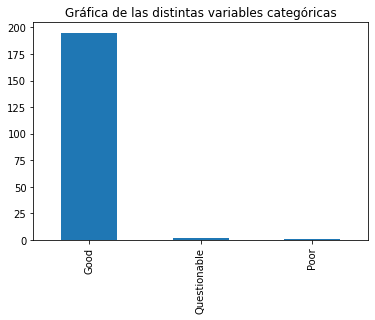

SymbDigWNotDoneReas


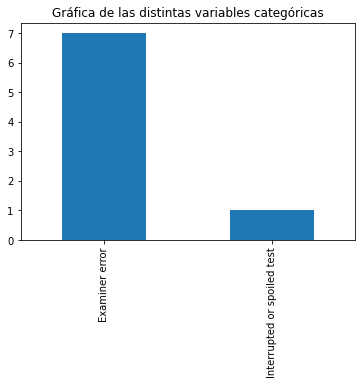

SymbDigWPtEff


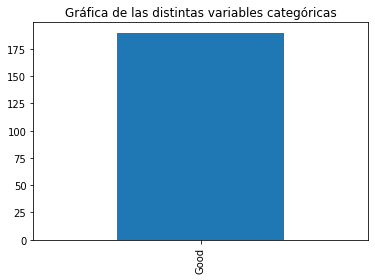

SymbDigONotDoneReas


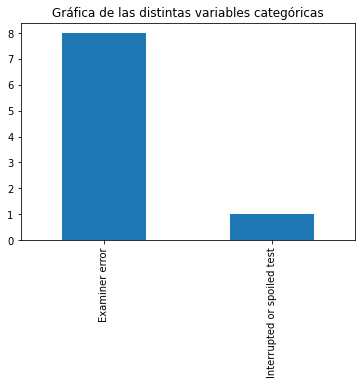

SymbDigOPtEff


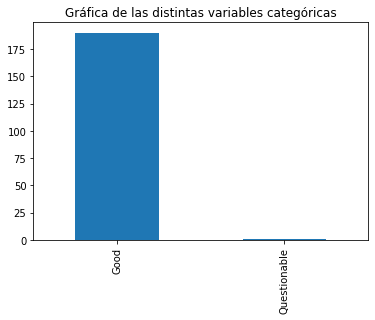

TrailMakAPtEff


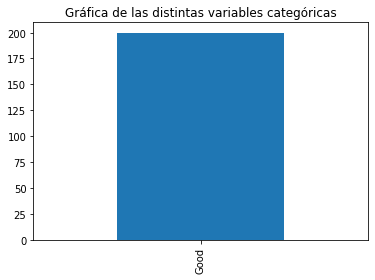

TrailMakBNotDoneReas


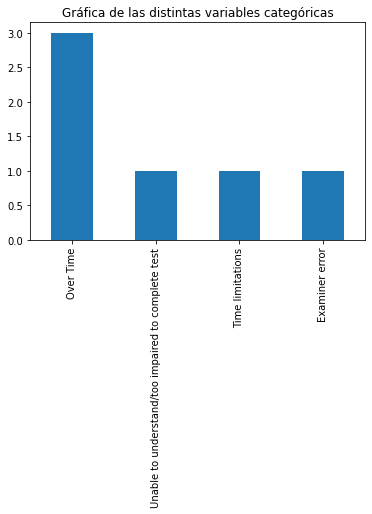

TrailMakBPtEff


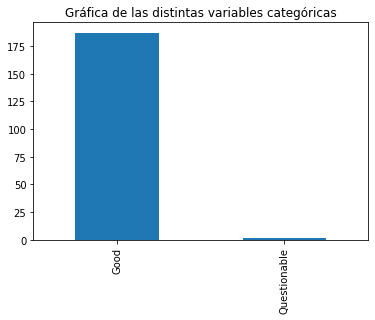

GrPegDomHand


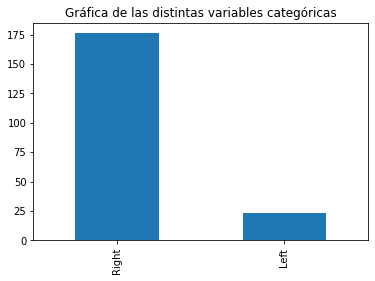

GrPegDomNotDoneReas


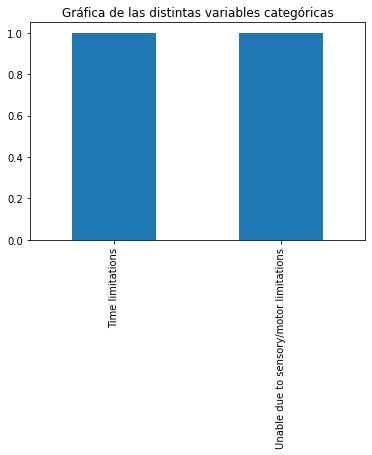

GrPegDomPtEff


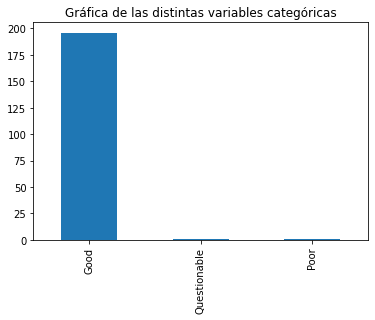

GrPegNonNotDoneReas


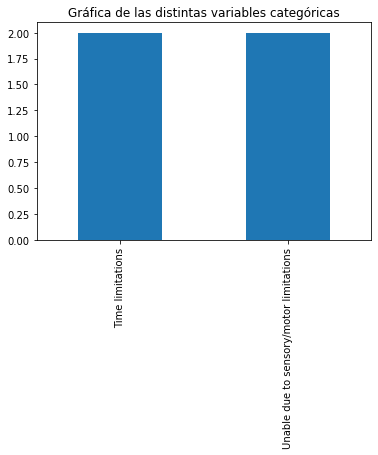

GrPegNonPtEff


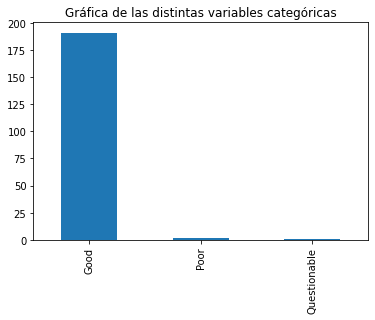

DukeSocNotDoneReasDs


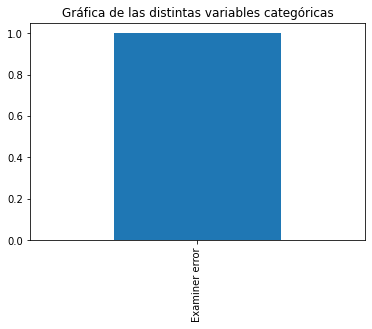

ReadCardLowLine


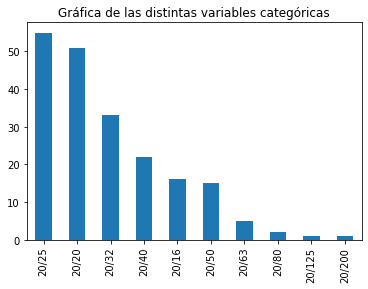

In [ ]:
for i in data:
  if data[i].dtypes=='object':
    data[i].value_counts().plot.bar(title='Gráfica de las distintas variables categóricas')
    print(i)
    plt.show()

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


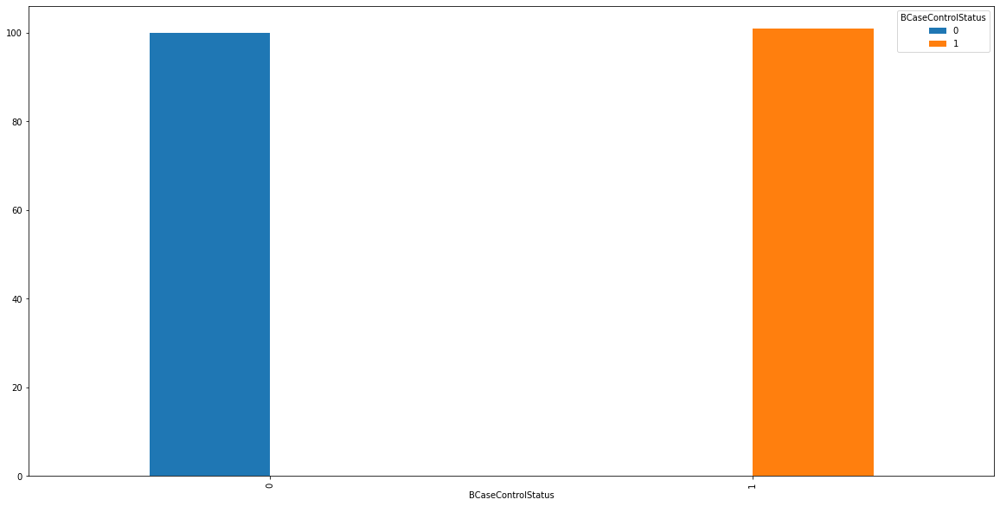

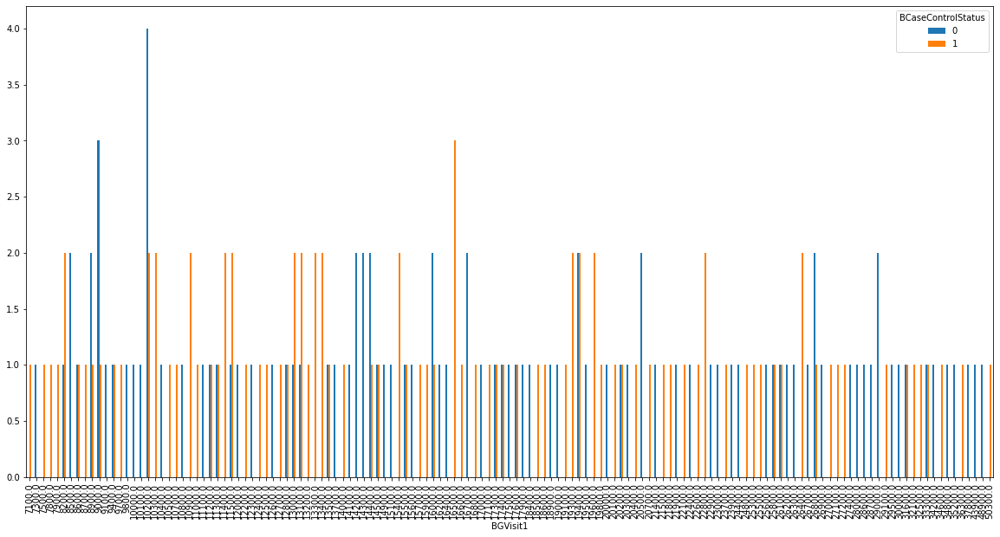

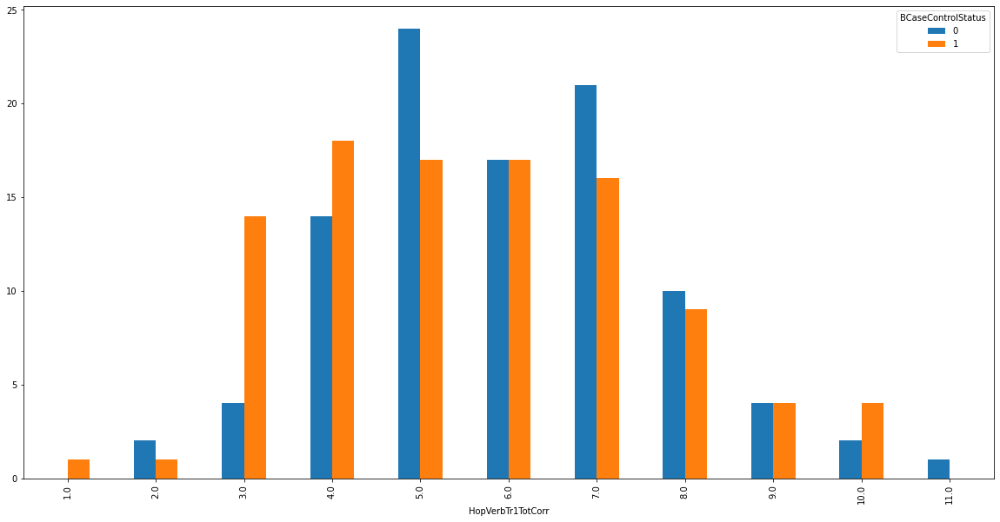

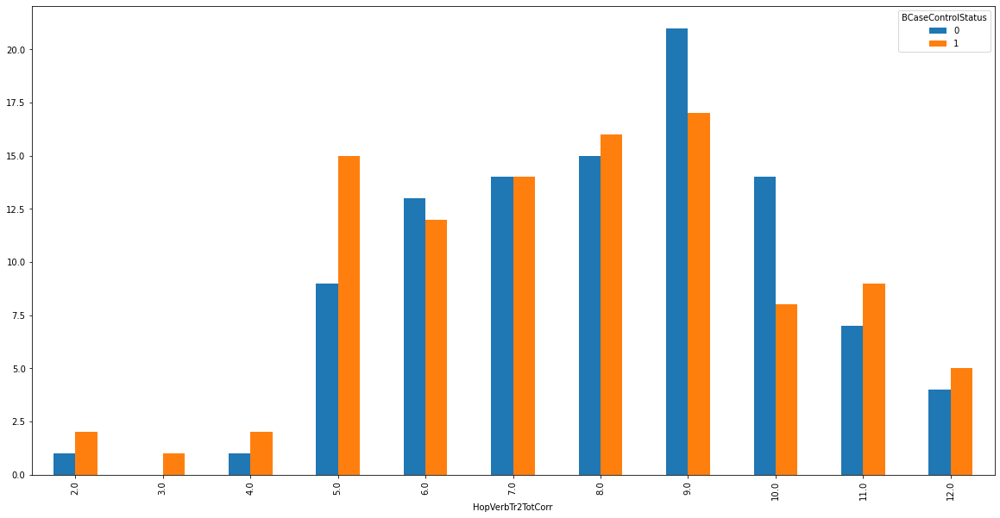

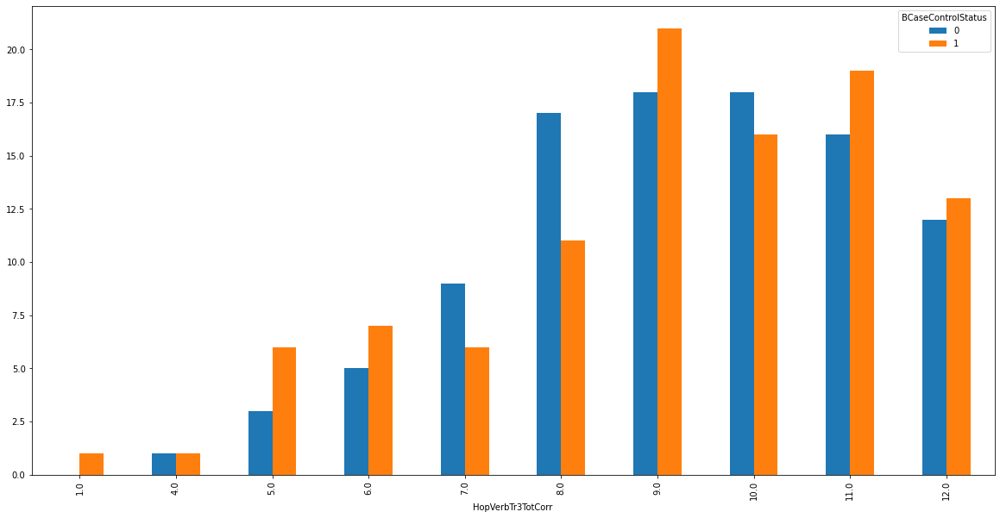

...

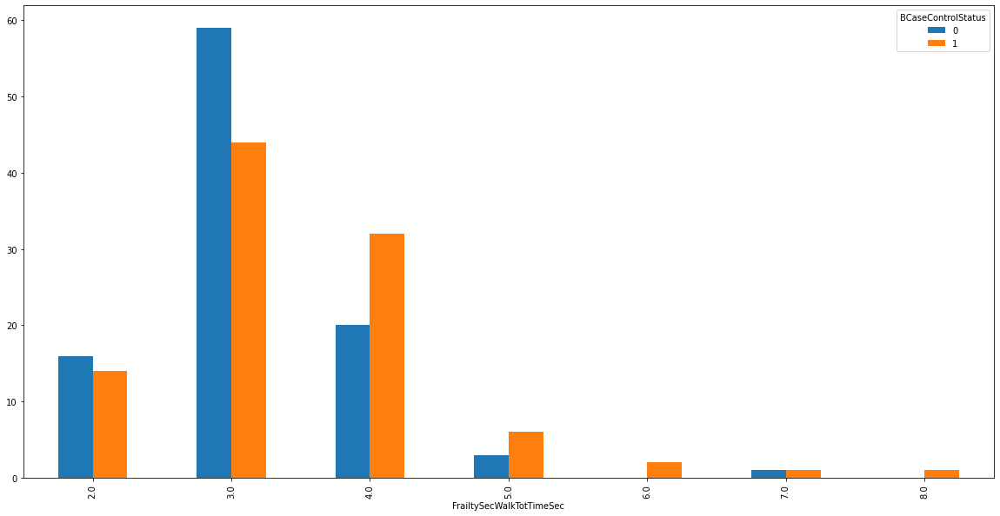

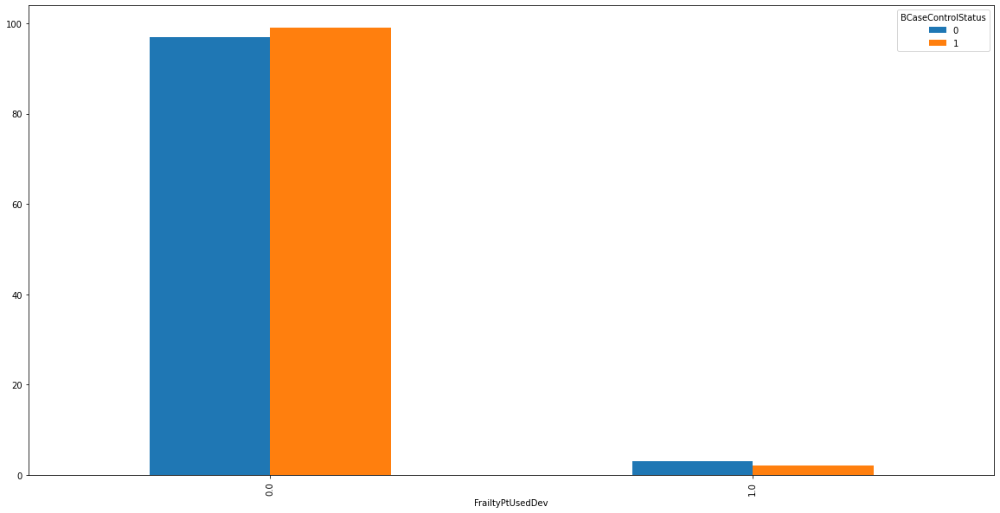

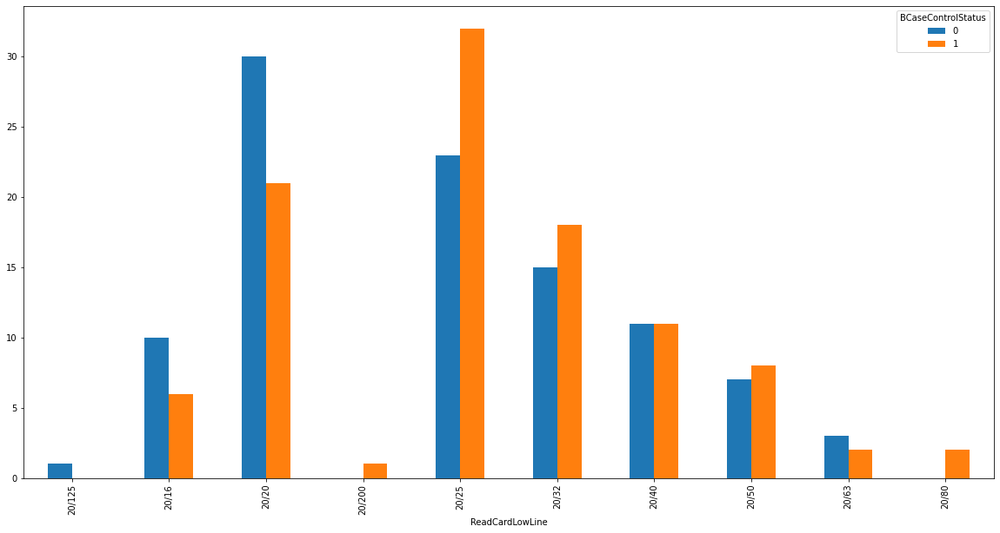

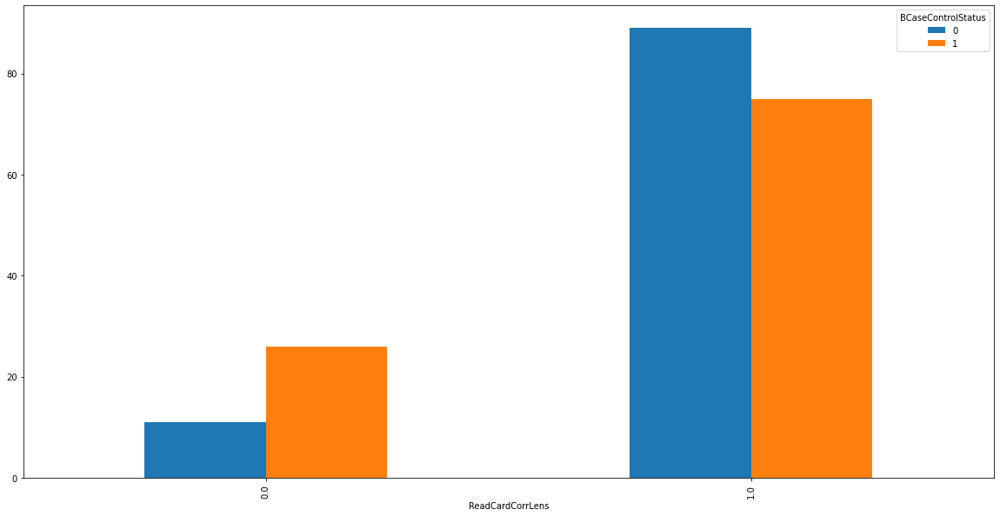

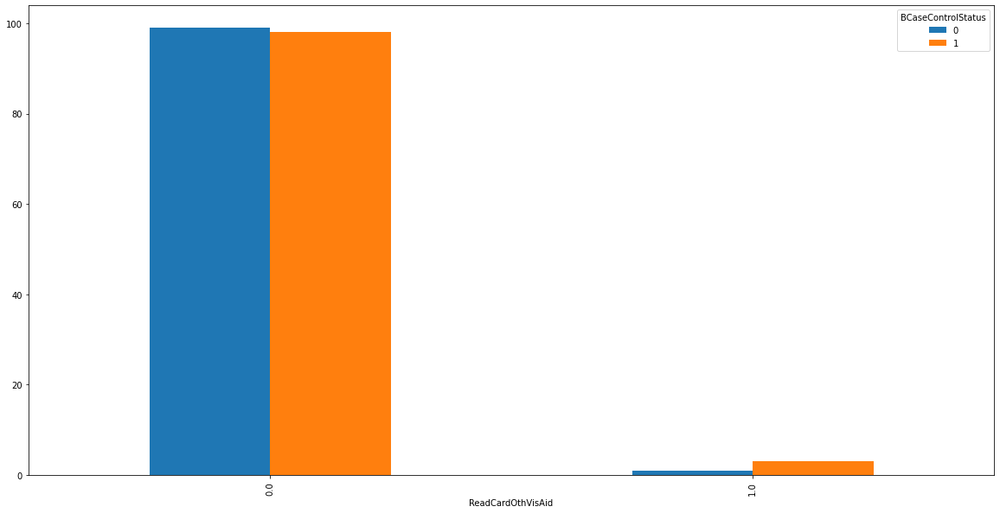

In [ ]:
for i in data:
  # if data[i].dtypes!='object':
  plot=pd.crosstab(index=data[i], columns=data['BCaseControlStatus']).apply(lambda r : r, axis=1).plot(kind='bar')
  plt.rcParams["figure.figsize"] = (20, 10)
  # plt.xlabel('xlabel', fontsize=10)
  # plt.ylabel('ylabel', fontsize=10)
  # plot.get_legend().remove()
  # plt.legend(bbox_to_anchor=(1.05, 1))


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


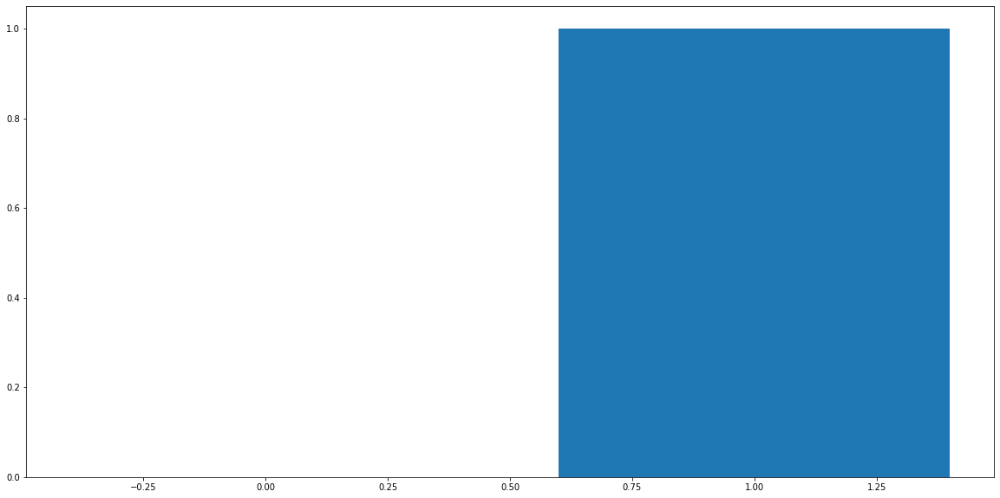

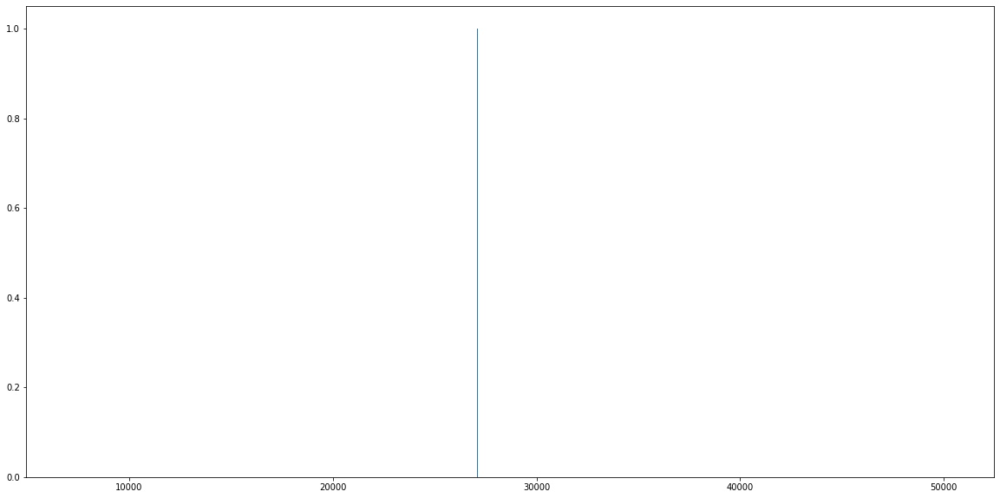

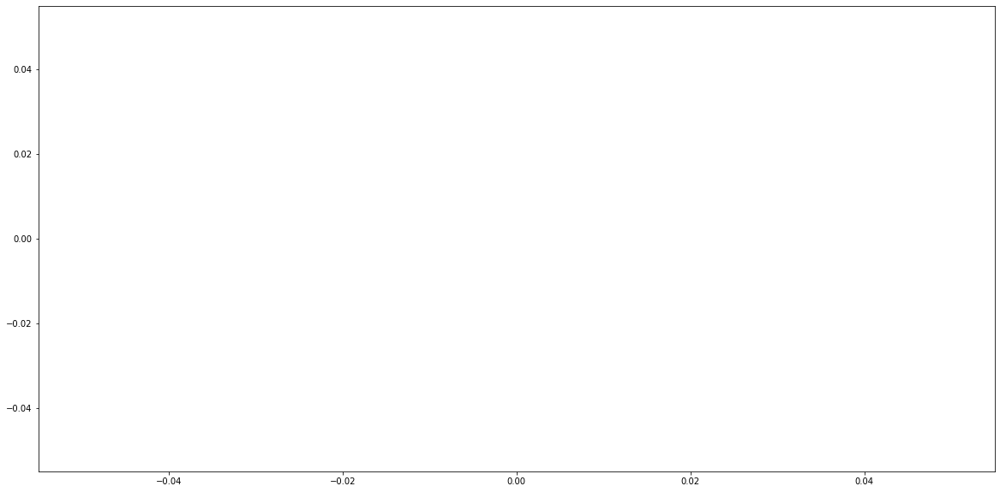

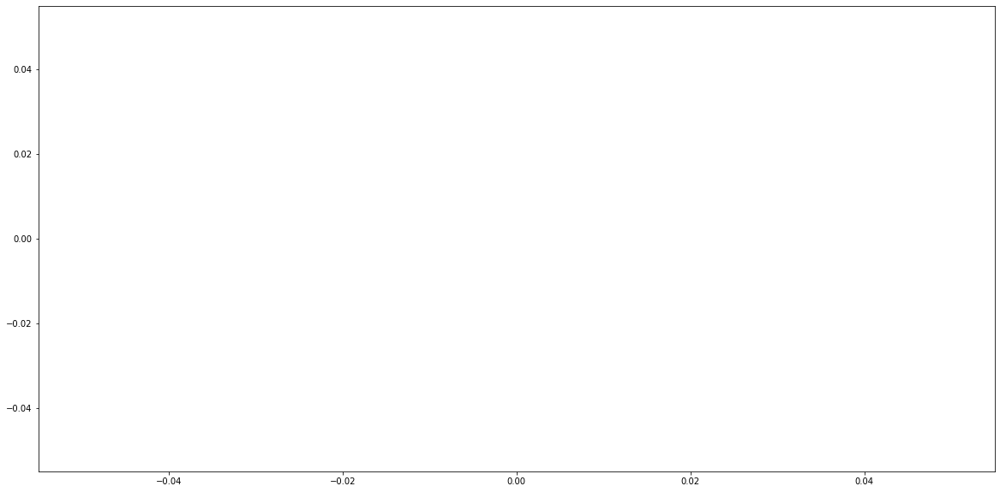

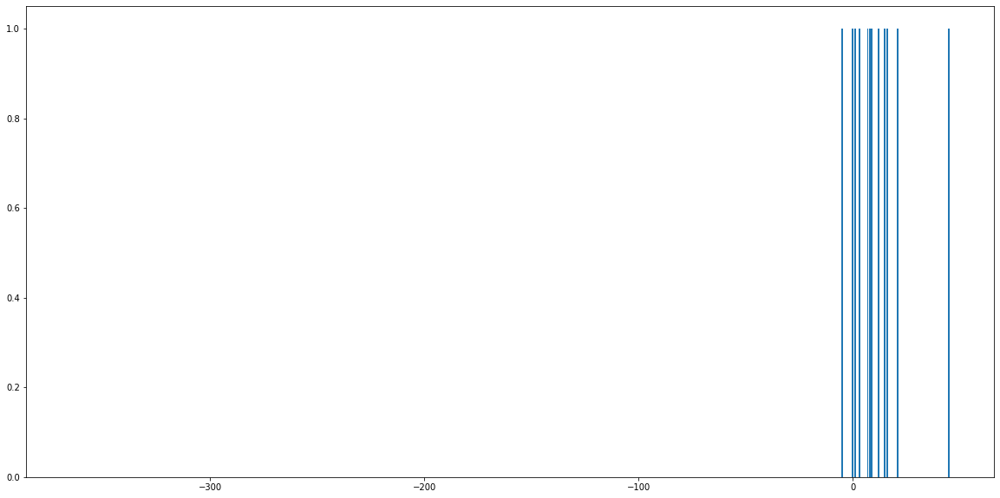

...

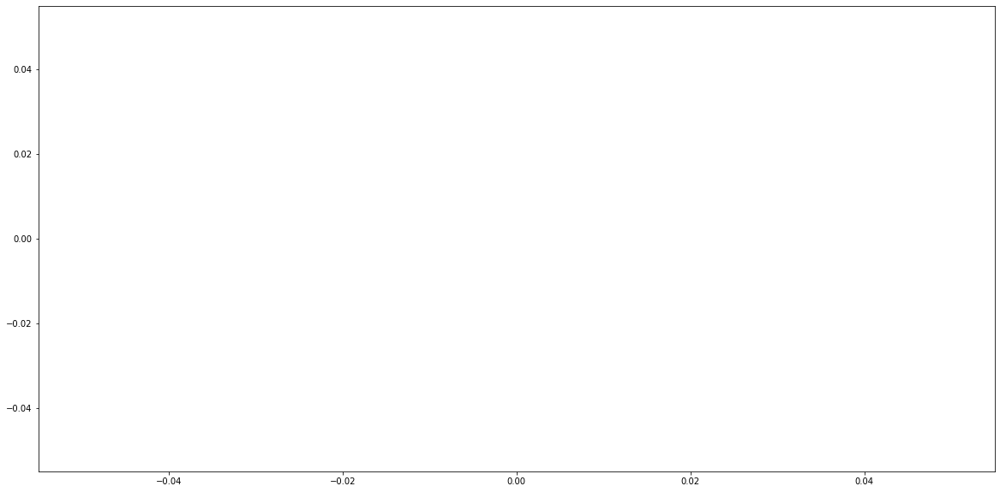

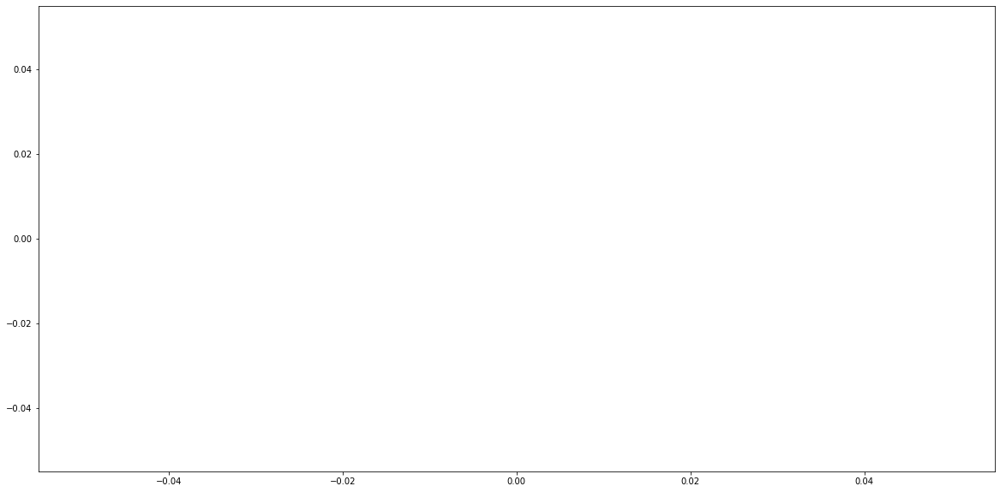

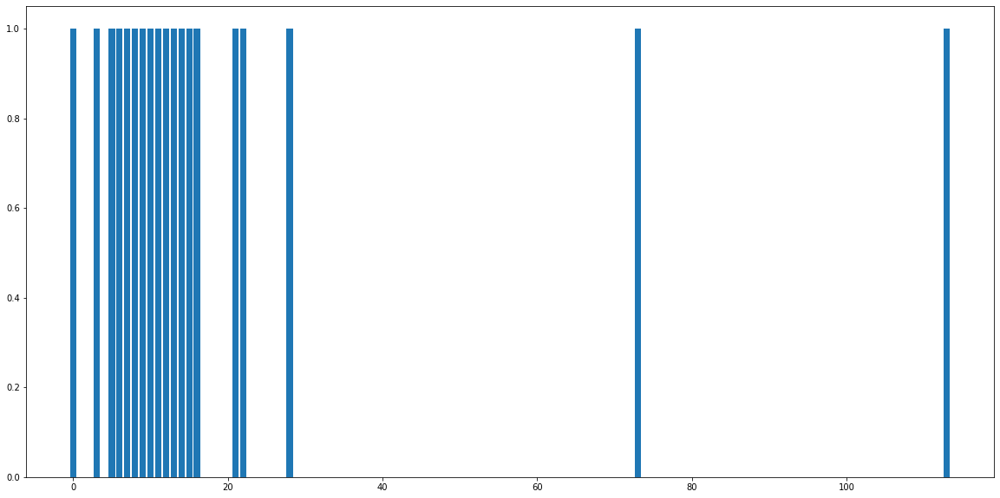

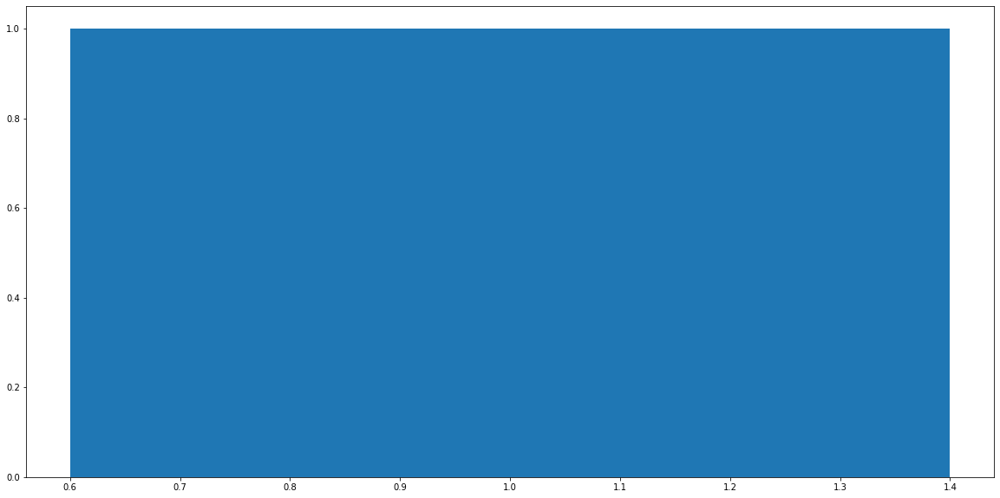

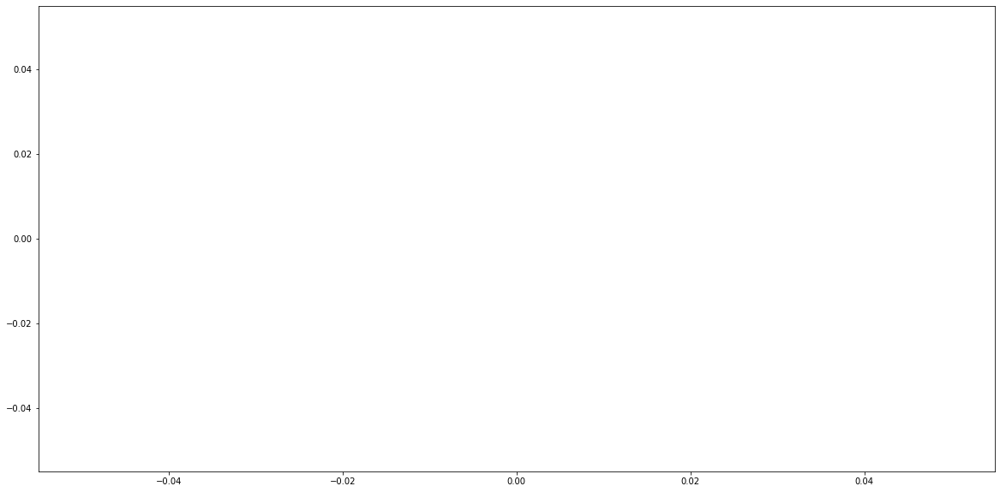

In [ ]:
import matplotlib.pyplot as plt
for i in data:
  if data[i].dtypes!='object':
    fig, ax = plt.subplots()
    ax.bar(data[i], data['BCaseControlStatus'])

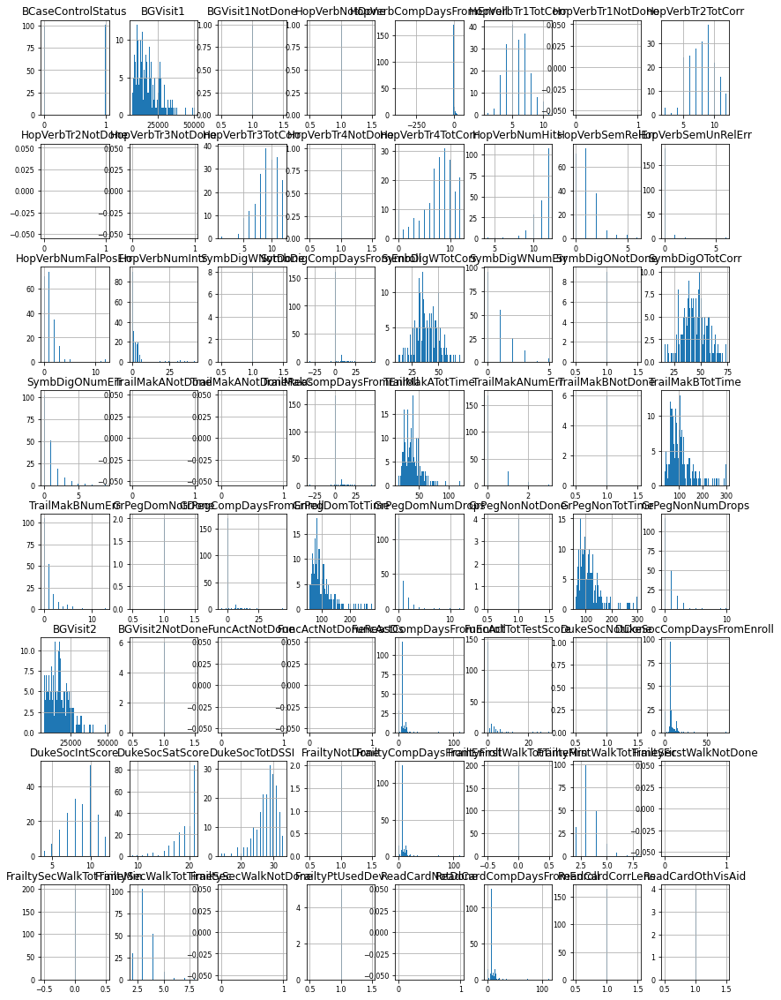

In [ ]:
# Histogram
data.hist(figsize=(14, 20), bins=70, xlabelsize=8, ylabelsize=8); 

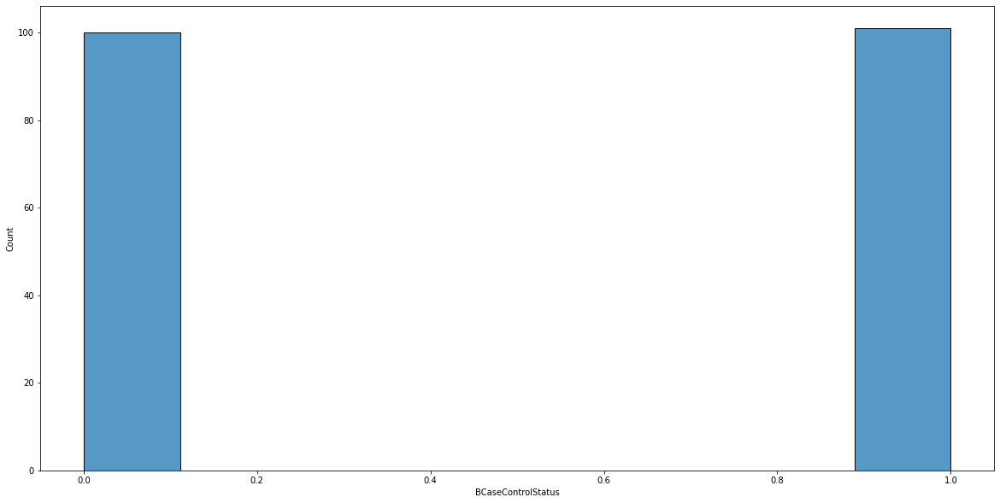

In [ ]:
# Plot the histogram
sns.histplot(data, x="BCaseControlStatus")

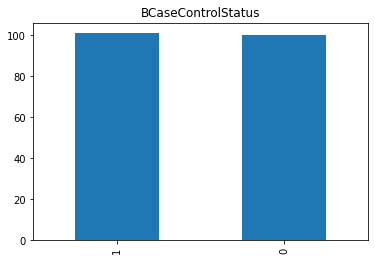

In [ ]:
data['BCaseControlStatus'].value_counts().plot.bar(title="BCaseControlStatus")


Vemos que el número de pacientes control y caso están balanceados

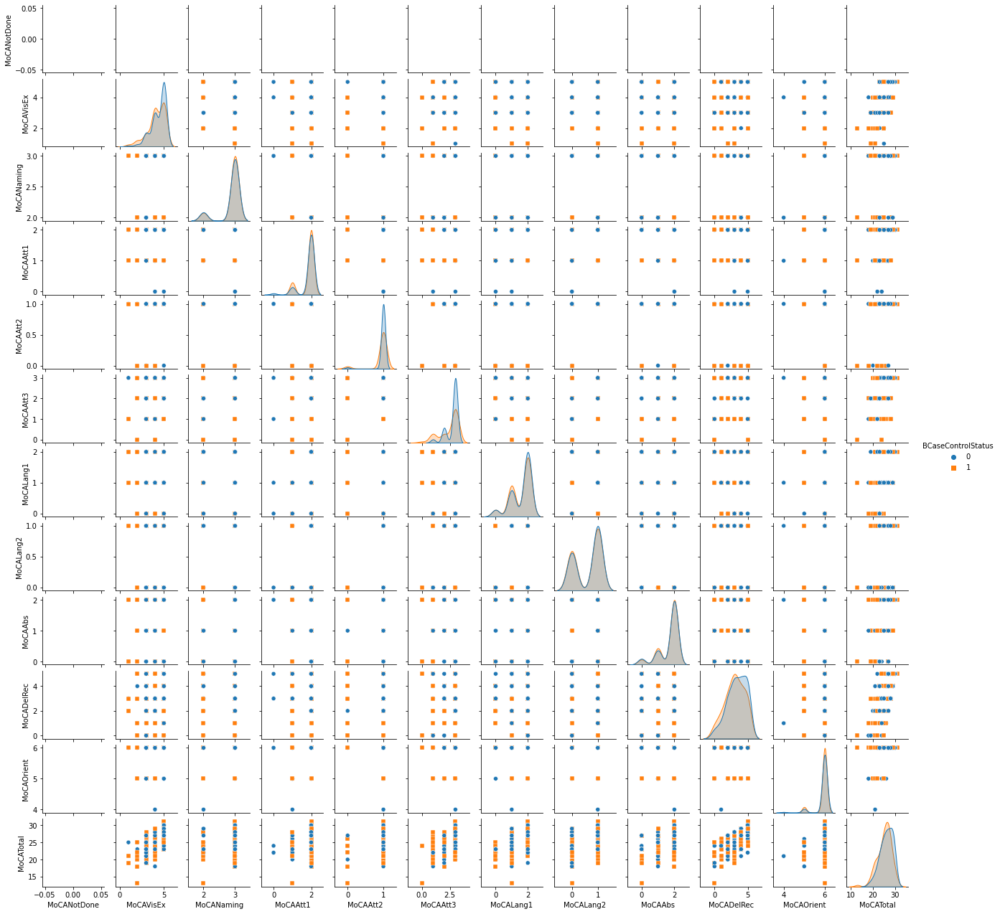

In [ ]:
sns.pairplot(data, hue = 'BCaseControlStatus', markers=["o", "s"], height=1.5)

In [ ]:
data.columns

Index(['BCaseControlStatus', 'BGVisit1', 'HopVerbTr1TotCorr',
       'HopVerbTr2TotCorr', 'HopVerbTr3TotCorr', 'HopVerbTr4TotCorr',
       'HopVerbNumHits', 'HopVerbSemRelErr', 'HopVerbSemUnRelErr',
       'HopVerbNumFalPosErr', 'HopVerbNumIntr', 'SymbDigWTotCorr',
       'SymbDigWNumErr', 'SymbDigOTotCorr', 'SymbDigONumErr',
       'TrailMakATotTime', 'TrailMakANumErr', 'TrailMakBTotTime',
       'TrailMakBNumErr', 'GrPegDomHand', 'GrPegDomTotTime',
       'GrPegDomNumDrops', 'GrPegNonTotTime', 'GrPegNonNumDrops', 'BGVisit2',
       'FuncActTotTestScore', 'DukeSocIntScore', 'DukeSocSatScore',
       'DukeSocTotDSSI', 'FrailtyFirstWalkTotTimeSec',
       'FrailtySecWalkTotTimeSec', 'FrailtyPtUsedDev', 'ReadCardLowLine',
       'ReadCardCorrLens', 'ReadCardOthVisAid'],
      dtype='object')

# ***CÓDIGO GRÁFICAS TFG***

In [ ]:
# print(high.shape,high2.shape)
list_num_features=['BGVisit1', 'HopVerbTr1TotCorr',
       'HopVerbTr2TotCorr', 'HopVerbTr3TotCorr', 'HopVerbTr4TotCorr',
       'HopVerbNumHits', 'HopVerbSemRelErr', 'HopVerbSemUnRelErr',
       'HopVerbNumFalPosErr', 'HopVerbNumIntr', 'SymbDigWTotCorr',
       'SymbDigWNumErr', 'SymbDigOTotCorr', 'SymbDigONumErr',
       'TrailMakATotTime', 'TrailMakANumErr', 'TrailMakBTotTime',
       'TrailMakBNumErr','GrPegDomTotTime',
       'GrPegDomNumDrops', 'GrPegNonTotTime', 'GrPegNonNumDrops', 'BGVisit2',
       'FuncActTotTestScore', 'DukeSocIntScore', 'DukeSocSatScore',
       'DukeSocTotDSSI', 'FrailtyFirstWalkTotTimeSec',
       'FrailtySecWalkTotTimeSec', ]
list_cat_features=[ 'GrPegDomHand', 'ReadCardLowLine',
       'ReadCardCorrLens']

In [ ]:
# fig, ax = plt.subplots(1, 1, figsize=(9, 4))
for column_name in list_num_features:
  high=data[data.loc[:,'BCaseControlStatus']=='Case'].loc[:,column_name]
  high2=data[data.loc[:,'BCaseControlStatus']=='Control'].loc[:,column_name]
  plt.hist([high, high2], bins=30, label=['Caso', 'Control'])
  # plt.legend(loc='upper left')
  plt.rcParams["figure.figsize"] = (4, 3)
  # plt.show()
  plt.savefig("{}.pdf".format(column_name))
  plt.close()

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different length

In [ ]:
# fig, ax = plt.subplots(1, 1, figsize=(9, 4))
n_samples=data.shape[0]
flag_normalize=True
width=0.35
for column_name in list_cat_features:
  high=data[data.loc[:,'BCaseControlStatus']=='Case'].loc[:,column_name]
  high2=data[data.loc[:,'BCaseControlStatus']=='Control'].loc[:,column_name]
  # plt.hist([high, high2], bins=80, label=['Caso', 'Control'])
  # plt.legend(loc='upper left')
  # plt.show()
  x_unique1, probs1, y_pos1 = get_unique_categories_and_probs(high, n_samples, flag_normalize)
  x_unique2, probs2, y_pos2 = get_unique_categories_and_probs(high2, n_samples, flag_normalize)
  plt.bar(y_pos1 - width/2, probs1, width, label='class1', color='#0070FF')
  plt.bar(y_pos2 + width/2, probs2, width, label='class2', color='#FF8E07')
  # plt.legend(loc='upper left')
  plt.xticks(y_pos1, x_unique1, rotation='horizontal')
  plt.rcParams["figure.figsize"] = (4, 3)
  # plt.set_xticklabels([fmt_cat(i) for i in x_unique1], rotation='vertical')
  plt.tight_layout()
  plt.savefig("{}.pdf".format(column_name))
  plt.close()



In [ ]:
from collections import Counter
def get_unique_categories_and_probs(x, n_samples, flag_normalize):
    counter_samples = Counter(x)
    dict_counter_samples = dict(counter_samples)

    x_unique = np.array(list(dict_counter_samples.keys()))
    counts_categories = np.array(list(dict_counter_samples.values()))

    y_pos = np.arange(len(x_unique))

    if flag_normalize:
        probs = np.array(counts_categories) / n_samples
    else:
        probs = np.array(counts_categories)

    return x_unique, probs, y_pos

# ***Preprocesado de datos***

# ***Valores perdidos***

In [ ]:
(data == 0).sum(axis=0)

BCaseControlStatus            100
BGVisit1                        0
BGVisit1NotDone                 0
HopVerbNotDone                  0
HopVerbNotDoneReas              0
                             ... 
ReadCardNotDone                 0
ReadCardCompDaysFromEnroll     14
ReadCardLowLine                 0
ReadCardCorrLens                0
ReadCardOthVisAid               0
Length: 80, dtype: int64

Los ceros que aparecen pueden tener sentido, ya que han podido obtener una puntuación de 0 en las distintas pruebas realizadas.

In [ ]:
data.isna().sum()

BCaseControlStatus              0
BGVisit1                        1
BGVisit1NotDone               200
HopVerbNotDone                200
HopVerbNotDoneReas            200
                             ... 
ReadCardNotDone               201
ReadCardCompDaysFromEnroll      0
ReadCardLowLine                 0
ReadCardCorrLens               37
ReadCardOthVisAid             197
Length: 80, dtype: int64

In [ ]:
!pip install missingno





In [ ]:
import missingno as msno

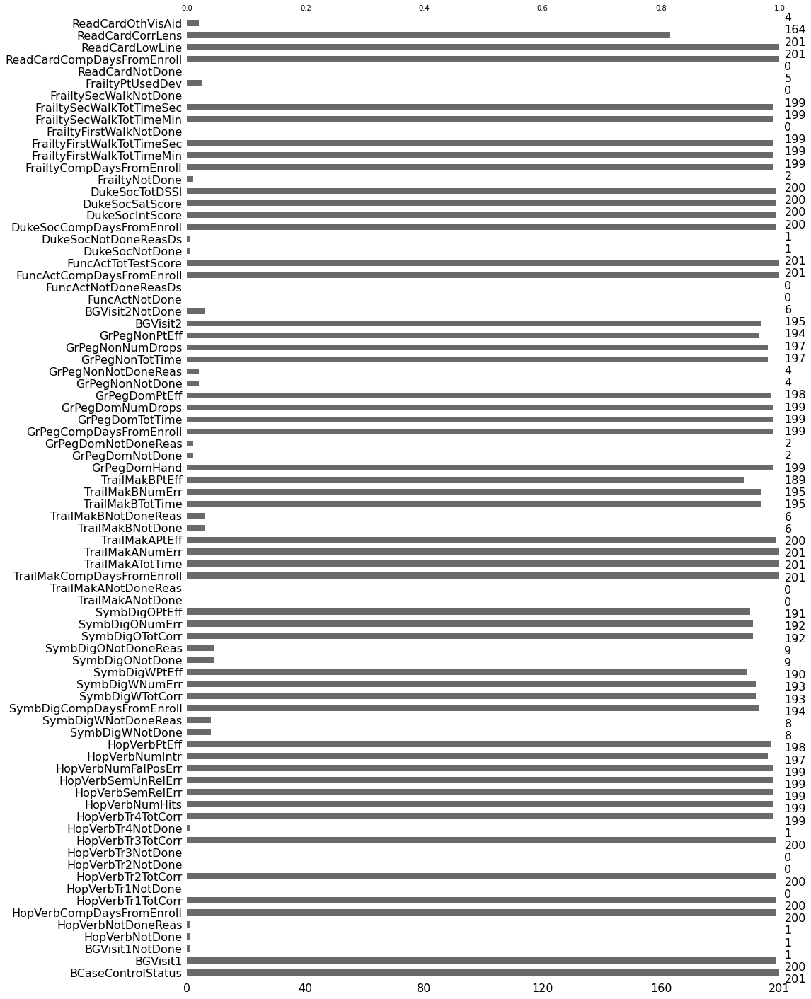

In [ ]:
msno.bar(data, figsize=(15,25))

In [24]:
data.drop(['BGVisit1NotDone'], axis=1, inplace=True)
data.drop(['HopVerbNotDone'], axis=1, inplace=True)
data.drop(['HopVerbNotDoneReas'], axis=1, inplace=True)
data.drop(['ReadCardNotDone'], axis=1, inplace=True)
data.drop(['ReadCardOthVisAid'], axis=1, inplace=True)

In [25]:
data.drop(['HopVerbTr1NotDone'], axis=1, inplace=True)
data.drop(['FrailtySecWalkNotDone'], axis=1, inplace=True)
data.drop(['FrailtyPtUsedDev'], axis=1, inplace=True)

In [26]:
data.drop(['HopVerbTr2NotDone'], axis=1, inplace=True)
data.drop(['HopVerbTr3NotDone'], axis=1, inplace=True)
data.drop(['HopVerbTr4NotDone'], axis=1, inplace=True)
data.drop(['SymbDigWNotDoneReas'], axis=1, inplace=True)
data.drop(['SymbDigWNotDone'], axis=1, inplace=True)

In [27]:
data.drop(['SymbDigONotDone'], axis=1, inplace=True)
data.drop(['SymbDigONotDoneReas'], axis=1, inplace=True)

In [28]:
data.drop(['TrailMakANotDone'], axis=1, inplace=True)
data.drop(['TrailMakANotDoneReas'], axis=1, inplace=True)
data.drop(['TrailMakBNotDone'], axis=1, inplace=True)
data.drop(['TrailMakBNotDoneReas'], axis=1, inplace=True)

In [29]:
data.drop(['GrPegDomNotDone'], axis=1, inplace=True)
data.drop(['GrPegDomNotDoneReas'], axis=1, inplace=True)

In [30]:
data.drop(['GrPegNonNotDone'], axis=1, inplace=True)
data.drop(['GrPegNonNotDoneReas'], axis=1, inplace=True)
data.drop(['BGVisit2NotDone'], axis=1, inplace=True)
data.drop(['FuncActNotDone'], axis=1, inplace=True)

In [31]:
data.drop(['FuncActNotDoneReasDs'], axis=1, inplace=True)
data.drop(['DukeSocNotDone'], axis=1, inplace=True)

In [32]:
data.drop(['DukeSocNotDoneReasDs'], axis=1, inplace=True)

In [33]:
data.drop(['FrailtyNotDone'], axis=1, inplace=True)
data.drop(['FrailtyFirstWalkNotDone'], axis=1, inplace=True)

A la vista de las gráficas eliminamos las isguientes:

In [34]:
data.drop(['HopVerbPtEff'], axis=1, inplace=True)
data.drop(['SymbDigWPtEff'], axis=1, inplace=True)
data.drop(['SymbDigOPtEff'], axis=1, inplace=True)
data.drop(['TrailMakAPtEff'], axis=1, inplace=True)
data.drop(['TrailMakBPtEff'], axis=1, inplace=True)
data.drop(['GrPegDomPtEff'], axis=1, inplace=True)
data.drop(['GrPegNonPtEff'], axis=1, inplace=True)
data.drop(['FrailtyFirstWalkTotTimeMin'], axis=1, inplace=True)
data.drop(['FrailtySecWalkTotTimeMin'], axis=1, inplace=True)
data.drop(['HopVerbSemUnRelErr'], axis=1, inplace=True)
# data.drop(['TrailMakANumErr'], axis=1, inplace=True)

In [35]:

data.isna().sum()

BCaseControlStatus             0
BGVisit1                       1
HopVerbCompDaysFromEnroll      1
HopVerbTr1TotCorr              1
HopVerbTr2TotCorr              1
HopVerbTr3TotCorr              1
HopVerbTr4TotCorr              2
HopVerbNumHits                 2
HopVerbSemRelErr               2
HopVerbNumFalPosErr            2
HopVerbNumIntr                 4
SymbDigCompDaysFromEnroll      7
SymbDigWTotCorr                8
SymbDigWNumErr                 8
SymbDigOTotCorr                9
SymbDigONumErr                 9
TrailMakCompDaysFromEnroll     0
TrailMakATotTime               0
TrailMakANumErr                0
TrailMakBTotTime               6
TrailMakBNumErr                6
GrPegDomHand                   2
GrPegCompDaysFromEnroll        2
GrPegDomTotTime                2
GrPegDomNumDrops               2
GrPegNonTotTime                4
GrPegNonNumDrops               4
BGVisit2                       6
FuncActCompDaysFromEnroll      0
FuncActTotTestScore            0
DukeSocCom

A continuación, hay ciertas variables que presentan muchos valores nulos pero porque son "checks", es decir cuando se han marcado se registran al paciente como un 1, pero si no se marcan aparece un valor nulo, pero en realidad sería un 0.

In [36]:
# data['FrailtyPtUsedDev']=data['FrailtyPtUsedDev'].replace(np.nan, 0)
data['ReadCardCorrLens']=data['ReadCardCorrLens'].replace(np.nan, 0)
# data['ReadCardOthVisAid']=data['ReadCardOthVisAid'].replace(np.nan, 0)

In [37]:
data.isna().sum()

BCaseControlStatus            0
BGVisit1                      1
HopVerbCompDaysFromEnroll     1
HopVerbTr1TotCorr             1
HopVerbTr2TotCorr             1
HopVerbTr3TotCorr             1
HopVerbTr4TotCorr             2
HopVerbNumHits                2
HopVerbSemRelErr              2
HopVerbNumFalPosErr           2
HopVerbNumIntr                4
SymbDigCompDaysFromEnroll     7
SymbDigWTotCorr               8
SymbDigWNumErr                8
SymbDigOTotCorr               9
SymbDigONumErr                9
TrailMakCompDaysFromEnroll    0
TrailMakATotTime              0
TrailMakANumErr               0
TrailMakBTotTime              6
TrailMakBNumErr               6
GrPegDomHand                  2
GrPegCompDaysFromEnroll       2
GrPegDomTotTime               2
GrPegDomNumDrops              2
GrPegNonTotTime               4
GrPegNonNumDrops              4
BGVisit2                      6
FuncActCompDaysFromEnroll     0
FuncActTotTestScore           0
DukeSocCompDaysFromEnroll     1
DukeSocI

In [38]:
data.drop(['HopVerbCompDaysFromEnroll'], axis=1, inplace=True)
data.drop(['SymbDigCompDaysFromEnroll'], axis=1, inplace=True)
data.drop(['TrailMakCompDaysFromEnroll'], axis=1, inplace=True)
data.drop(['GrPegCompDaysFromEnroll'], axis=1, inplace=True)
data.drop(['FuncActCompDaysFromEnroll'], axis=1, inplace=True)
data.drop(['DukeSocCompDaysFromEnroll'], axis=1, inplace=True)
data.drop(['FrailtyCompDaysFromEnroll'], axis=1, inplace=True)
data.drop(['ReadCardCompDaysFromEnroll'], axis=1, inplace=True)


In [39]:
data.shape

(201, 32)

In [40]:
data.dtypes

BCaseControlStatus              int64
BGVisit1                      float64
HopVerbTr1TotCorr             float64
HopVerbTr2TotCorr             float64
HopVerbTr3TotCorr             float64
HopVerbTr4TotCorr             float64
HopVerbNumHits                float64
HopVerbSemRelErr              float64
HopVerbNumFalPosErr           float64
HopVerbNumIntr                float64
SymbDigWTotCorr               float64
SymbDigWNumErr                float64
SymbDigOTotCorr               float64
SymbDigONumErr                float64
TrailMakATotTime                int64
TrailMakANumErr                 int64
TrailMakBTotTime              float64
TrailMakBNumErr               float64
GrPegDomHand                   object
GrPegDomTotTime               float64
GrPegDomNumDrops              float64
GrPegNonTotTime               float64
GrPegNonNumDrops              float64
BGVisit2                      float64
FuncActTotTestScore             int64
DukeSocIntScore               float64
DukeSocSatSc

Graficamos a continuación a partir de un mapa de color como se están comportando esos valores NaN en las distintas variables y pacientes:

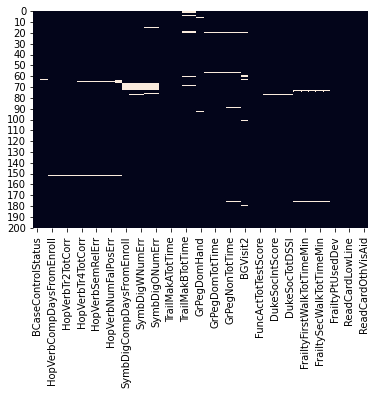

In [ ]:
import seaborn as sns

# Identificamos los missing values visualmente
sns.heatmap(data.isnull(), cbar=False)

El resto de valores NaN serán imputados por la media o moda (según proceda) una vez que hayamos divido en train y test.

# ***Outliers***

Para ver si la base de datos presenta o no outliers, me ayudaré a partir de la visualización de los diagramas de cajas:

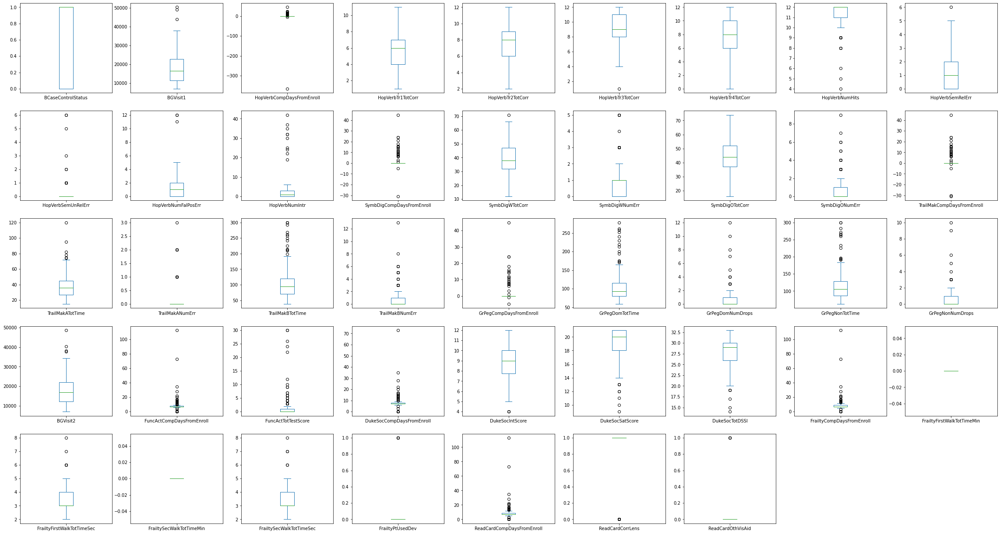

In [ ]:
data.plot(kind='box',subplots=True, layout=(9,9), sharex=False, sharey=False, figsize=(40,40))
plt.show()

A la vista de los resultados, podemos concluir que los valores atípicos que aparece podrían ser realmente puntuaciones obtenidas por los pacientes, y sernos de utilidad a la hora del diseño del modelo.

In [ ]:
data.dtypes

BCaseControlStatus              int64
BGVisit1                      float64
HopVerbCompDaysFromEnroll     float64
HopVerbTr1TotCorr             float64
HopVerbTr2TotCorr             float64
HopVerbTr3TotCorr             float64
HopVerbTr4TotCorr             float64
HopVerbNumHits                float64
HopVerbSemRelErr              float64
HopVerbSemUnRelErr            float64
HopVerbNumFalPosErr           float64
HopVerbNumIntr                float64
HopVerbPtEff                   object
SymbDigCompDaysFromEnroll     float64
SymbDigWTotCorr               float64
SymbDigWNumErr                float64
SymbDigWPtEff                  object
SymbDigOTotCorr               float64
SymbDigONumErr                float64
SymbDigOPtEff                  object
TrailMakCompDaysFromEnroll      int64
TrailMakATotTime                int64
TrailMakANumErr                 int64
TrailMakAPtEff                 object
TrailMakBTotTime              float64
TrailMakBNumErr               float64
TrailMakBPtE

VAmos a volver a graficar todas las variables categóricas:

HopVerbPtEff


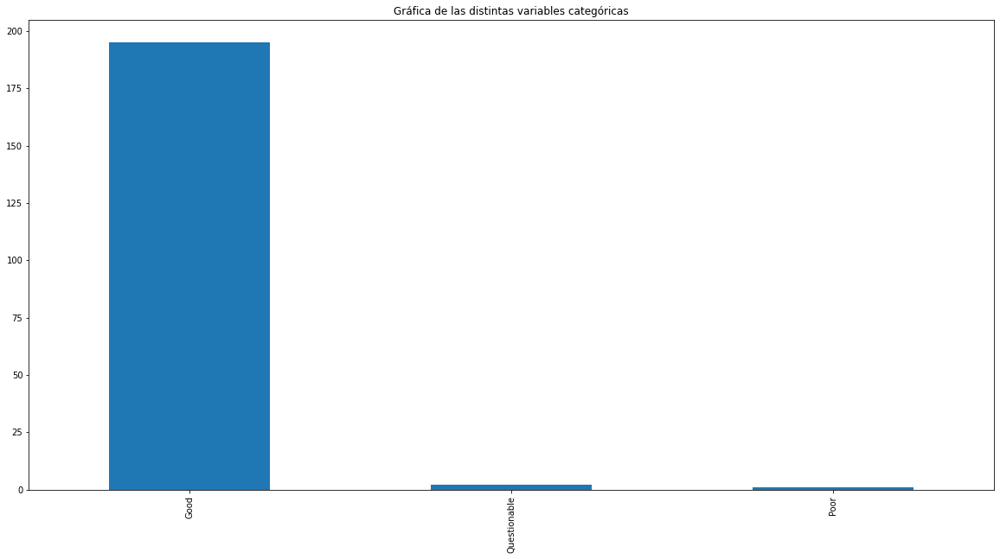

SymbDigWPtEff


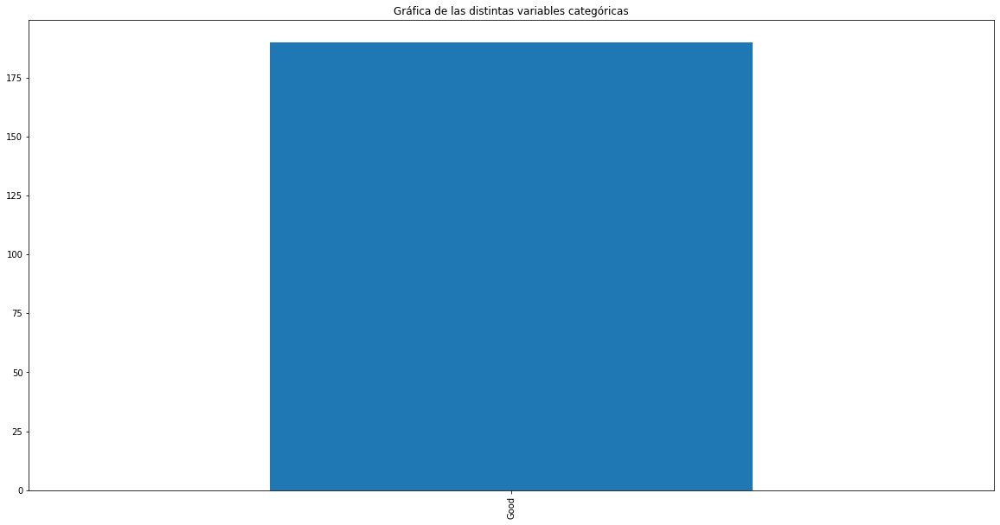

SymbDigOPtEff


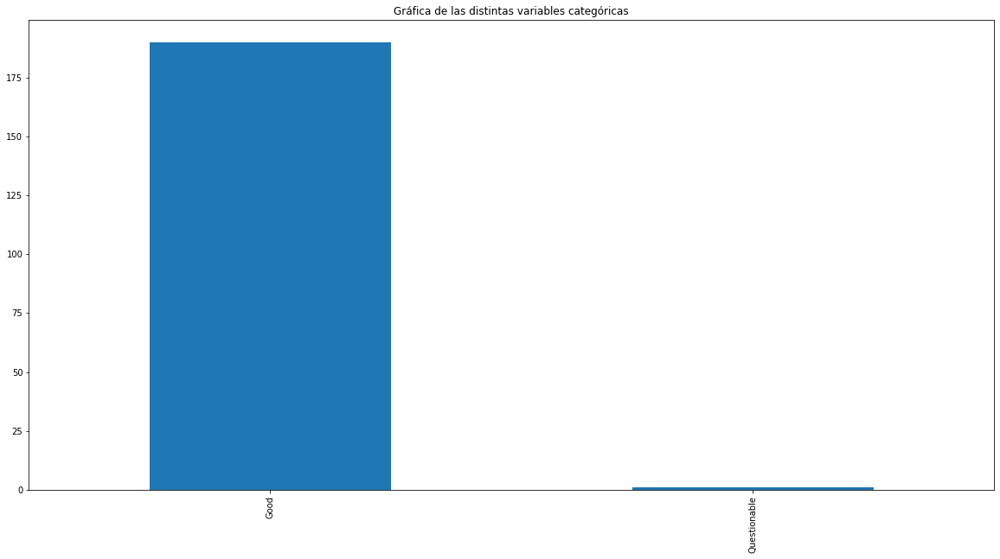

TrailMakAPtEff


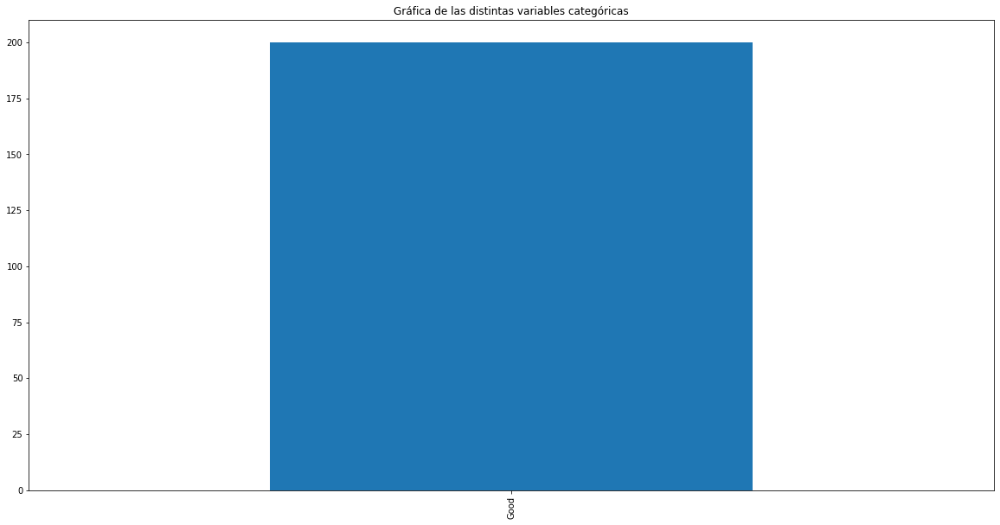

TrailMakBPtEff


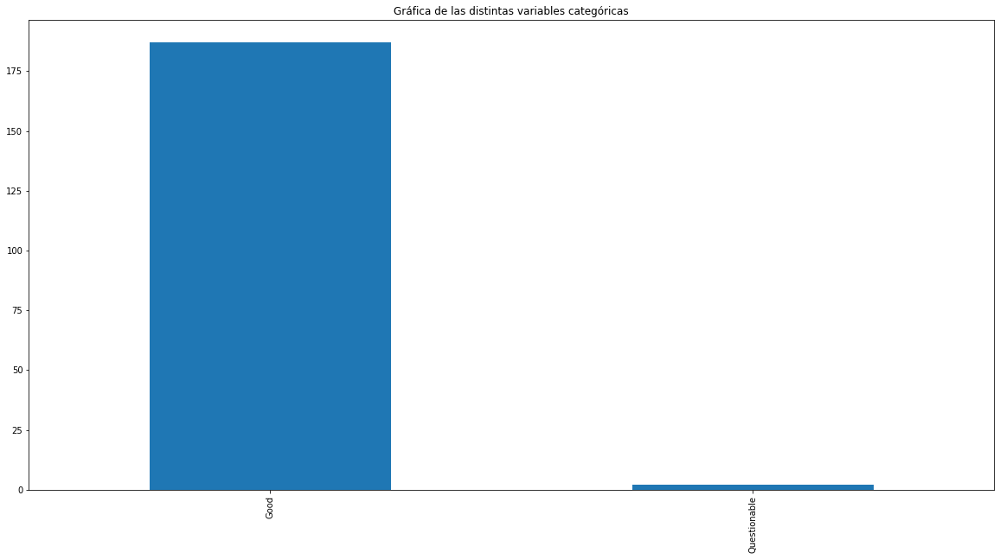

GrPegDomHand


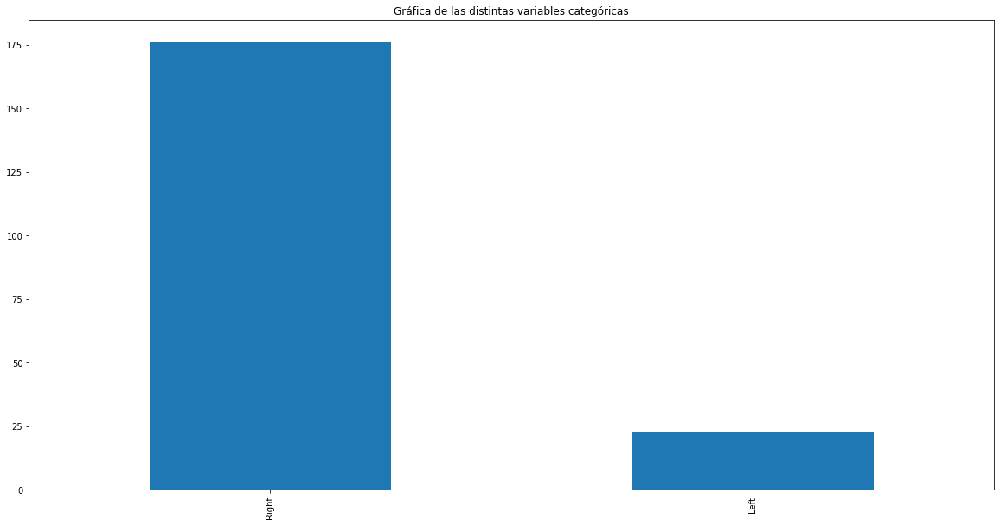

GrPegDomPtEff


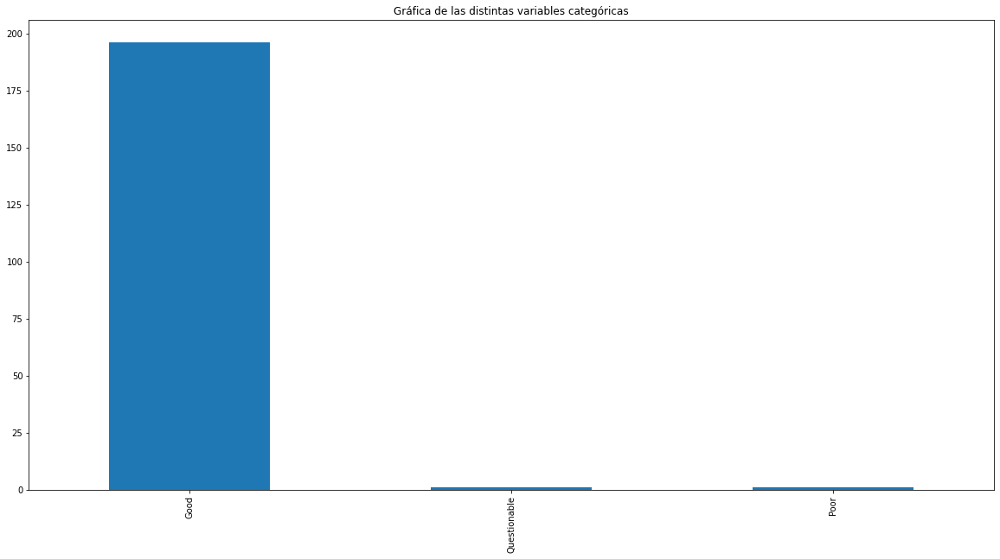

GrPegNonPtEff


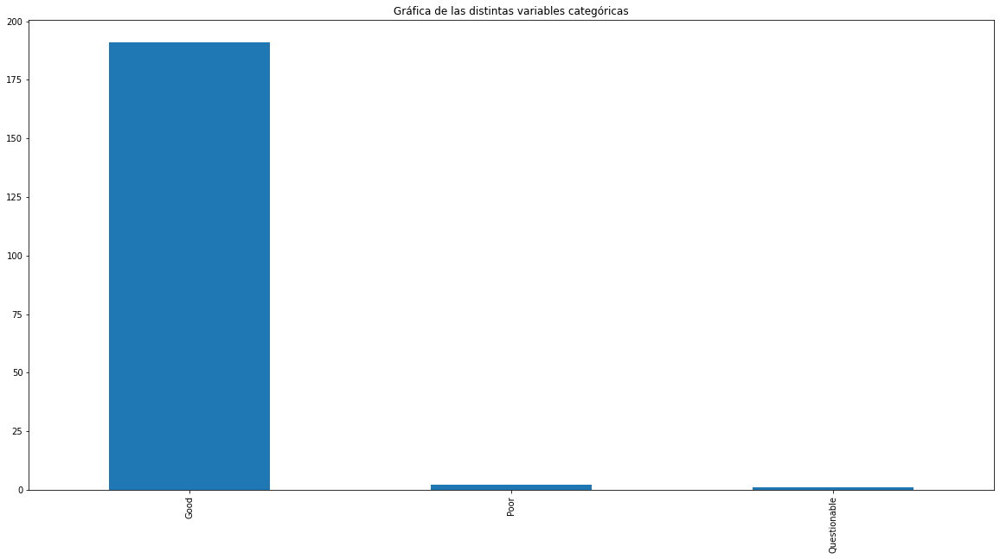

ReadCardLowLine


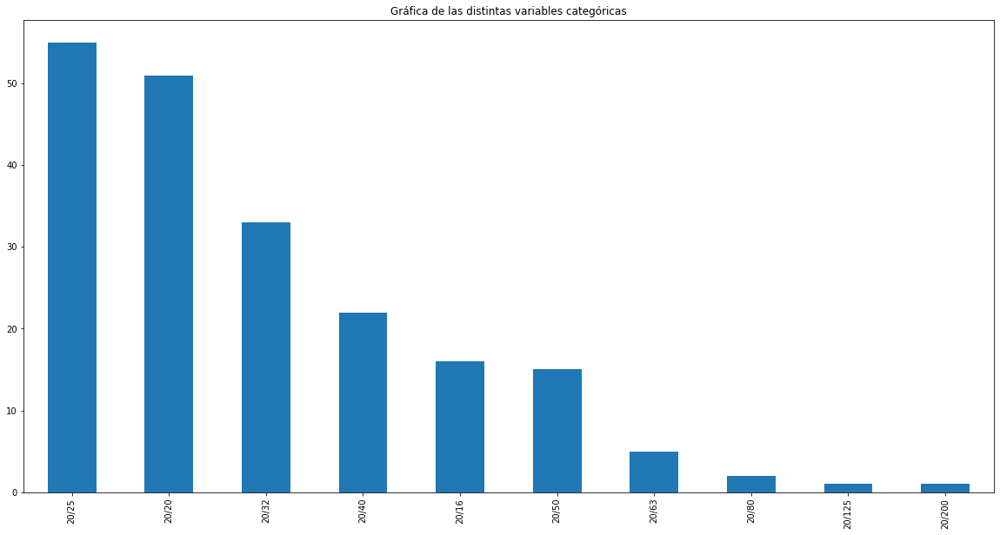

In [ ]:
for i in data:
  if data[i].dtypes=='object':
    data[i].value_counts().plot.bar(title='Gráfica de las distintas variables categóricas')
    print(i)
    plt.show()

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


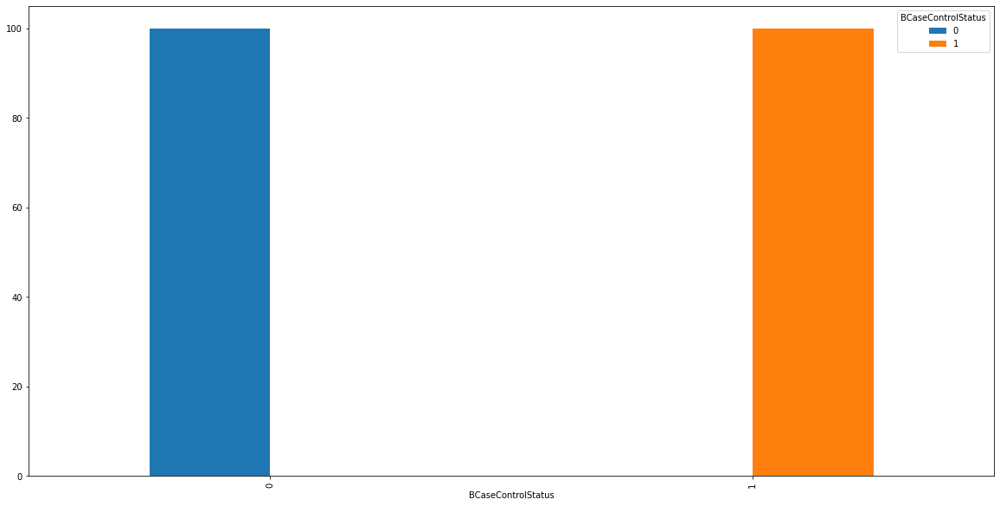

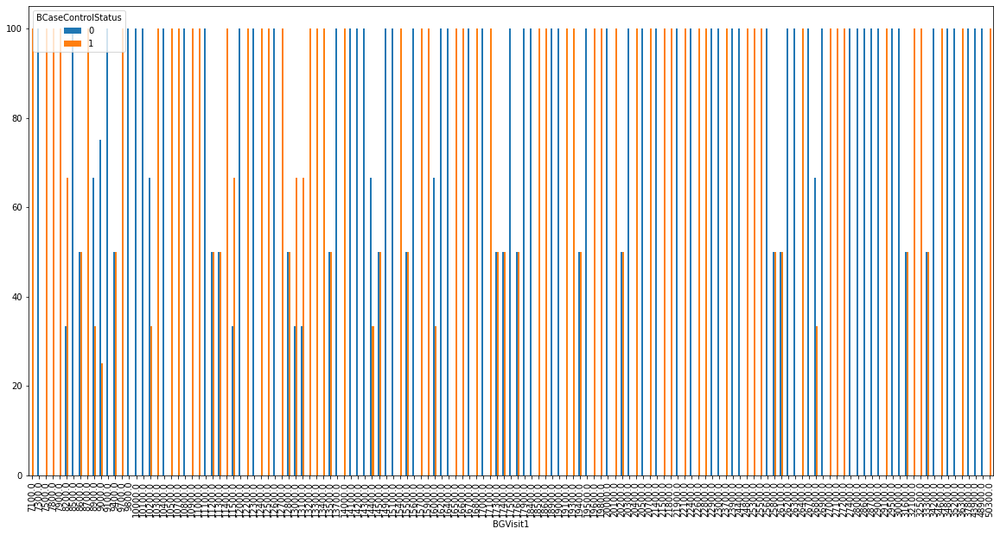

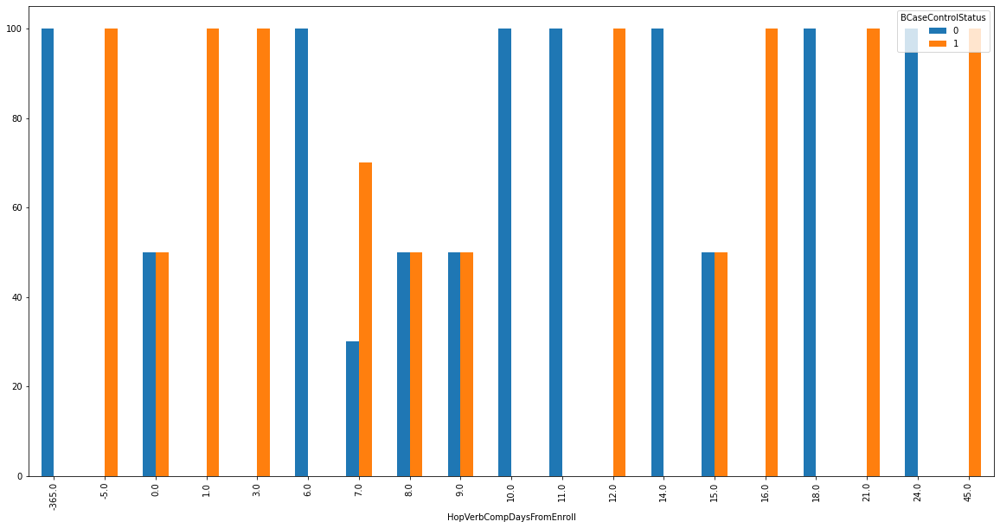

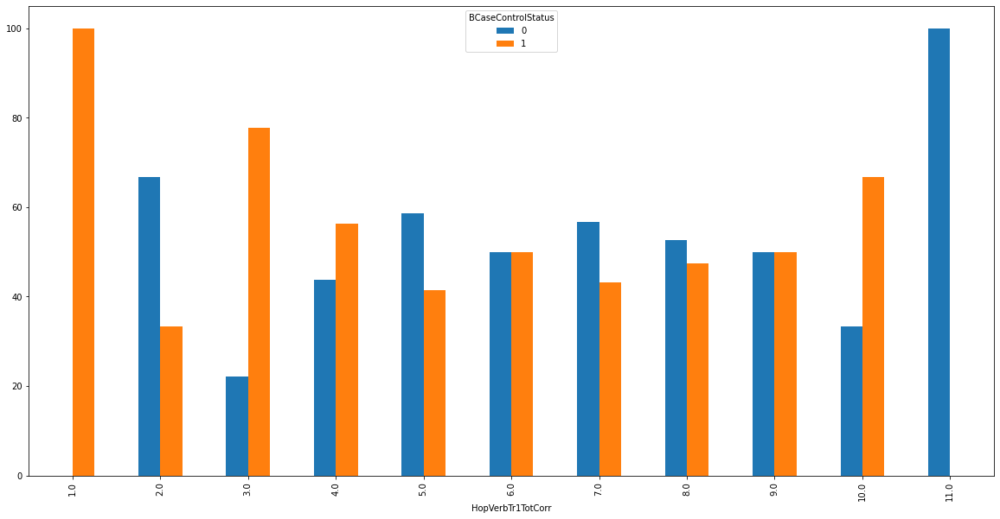

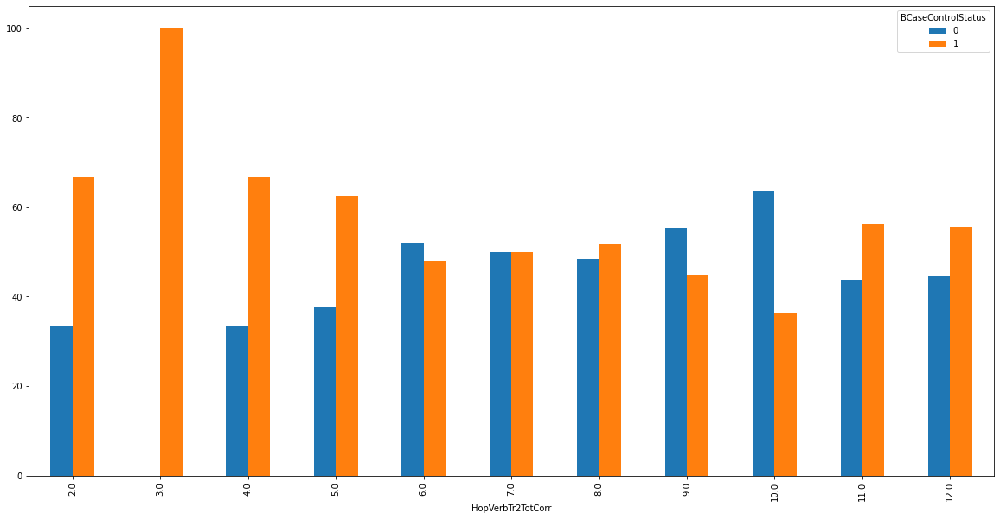

...

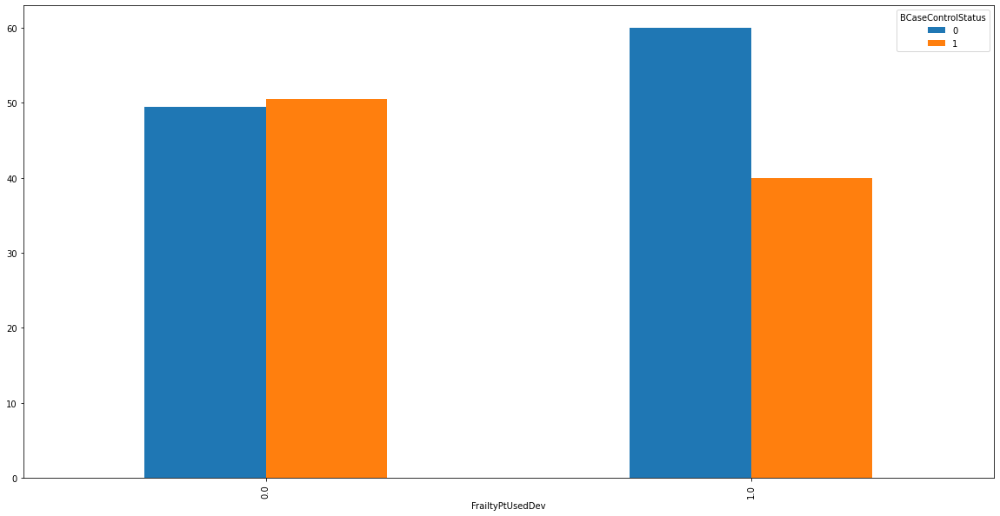

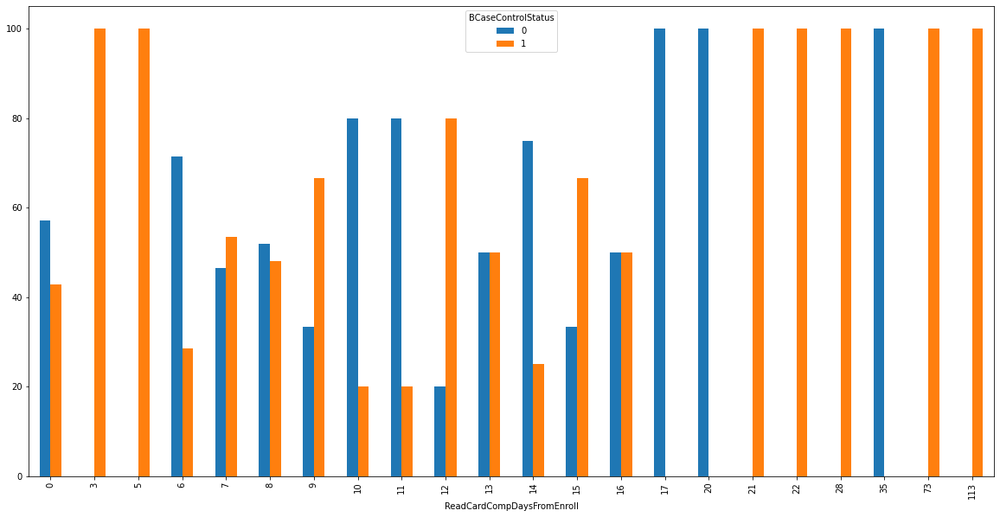

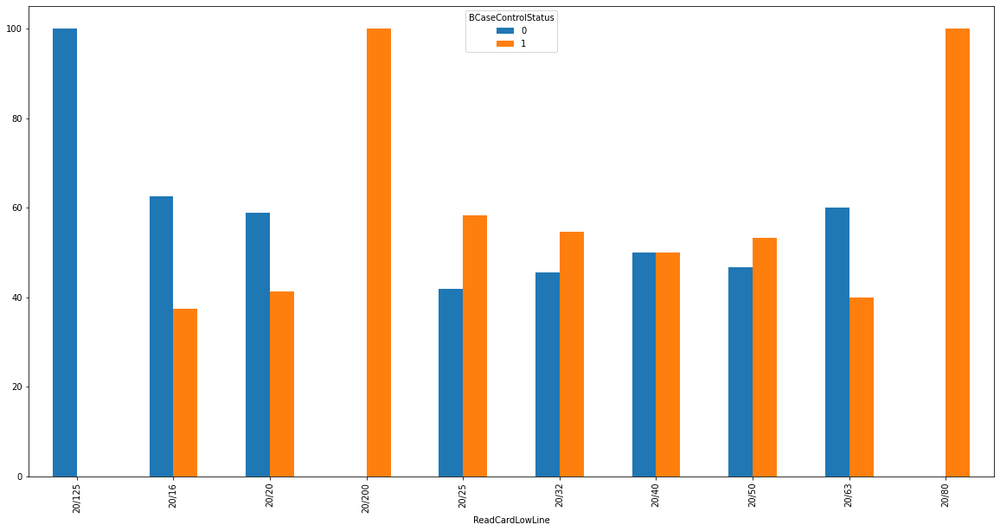

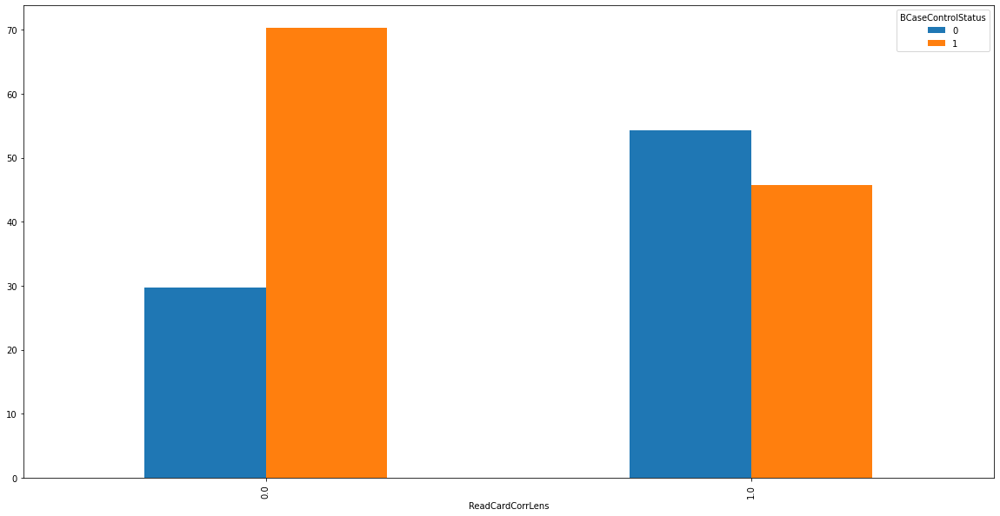

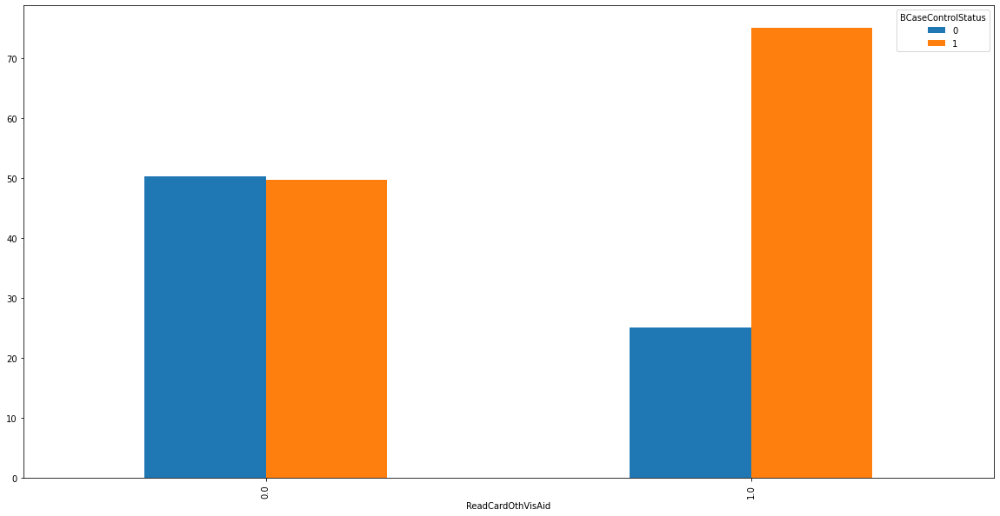

In [ ]:
for i in data:
  # if data[i].dtypes!='object':
  plot=pd.crosstab(index=data[i], columns=data['BCaseControlStatus']).apply(lambda r : r/r.sum()*100, axis=1).plot(kind='bar')
  plt.rcParams["figure.figsize"] = (20, 10)

* Vemos que la variable SymbDigWPtEff es igual para todos los pacientes, por lo 
que no va a aportar ningún tipo de información, es decir no será relevante y por tanto, la eliminaremos.
* Luego la de HopVerbPtEff, la mayoría han obtenido un valor de Good, y solo unos pocos como cuestionable y pobre, por lo que agruparemos todos los participantes de cuestionable y pobre en una sola, asignando un 1 a Good y un 0 a pobre y cuestionable, creando así una variable binaria.
* Con la variable SymbDigOPtEff haremos lo mismo que con la anterior.
* TrailMakAPtEff la eliminaremos igual que SymbDigWPtEff, ya que todos los participantes obtienen la categoría de Good, y por tanto, no sería una variable relevante.
* TrailMakBPtEff haremos lo mismo que conHopVerbPtEff y SymbDigOPtEff
* Para GrPegDomHand crearemos una variable binaria, donde la mano dominante derecha será 1, y la mano dominante izquierda será 0.
* Con GrPegDomPtEff las agruparemos igual que con HopVerbPtEff
* Con GrPegNonPtEff igual que la anterior.
* ReadCardLowLine le aplicaremos one-hot-encoding.

Procedemos hacer todo lo anterior:


In [ ]:
data.isna().sum()

BCaseControlStatus            0
BGVisit1                      1
HopVerbTr1TotCorr             1
HopVerbTr2TotCorr             1
HopVerbTr3TotCorr             1
HopVerbTr4TotCorr             2
HopVerbNumHits                2
HopVerbSemRelErr              2
HopVerbSemUnRelErr            2
HopVerbNumFalPosErr           2
HopVerbNumIntr                4
SymbDigWTotCorr               8
SymbDigWNumErr                8
SymbDigOTotCorr               9
SymbDigONumErr                9
TrailMakATotTime              0
TrailMakANumErr               0
TrailMakBTotTime              6
TrailMakBNumErr               6
GrPegDomHand                  2
GrPegDomTotTime               2
GrPegDomNumDrops              2
GrPegNonTotTime               4
GrPegNonNumDrops              4
BGVisit2                      6
FuncActTotTestScore           0
DukeSocIntScore               1
DukeSocSatScore               1
DukeSocTotDSSI                1
FrailtyFirstWalkTotTimeSec    2
FrailtySecWalkTotTimeSec      2
FrailtyP

In [41]:
data['GrPegDomHand']=data['GrPegDomHand'].replace(['Right'], 1).replace(['Left'], 0)

In [ ]:
data.shape

(201, 32)

In [ ]:
data.dtypes

BCaseControlStatus              int64
BGVisit1                      float64
HopVerbCompDaysFromEnroll     float64
HopVerbTr1TotCorr             float64
HopVerbTr2TotCorr             float64
HopVerbTr3TotCorr             float64
HopVerbTr4TotCorr             float64
HopVerbNumHits                float64
HopVerbSemRelErr              float64
HopVerbSemUnRelErr            float64
HopVerbNumFalPosErr           float64
HopVerbNumIntr                float64
SymbDigCompDaysFromEnroll     float64
SymbDigWTotCorr               float64
SymbDigWNumErr                float64
SymbDigOTotCorr               float64
SymbDigONumErr                float64
TrailMakCompDaysFromEnroll      int64
TrailMakATotTime                int64
TrailMakANumErr                 int64
TrailMakBTotTime              float64
TrailMakBNumErr               float64
GrPegDomHand                  float64
GrPegCompDaysFromEnroll       float64
GrPegDomTotTime               float64
GrPegDomNumDrops              float64
GrPegNonTotT

In [ ]:
data.isna().sum()

BCaseControlStatus             0
BGVisit1                       1
HopVerbCompDaysFromEnroll      1
HopVerbTr1TotCorr              1
HopVerbTr2TotCorr              1
HopVerbTr3TotCorr              1
HopVerbTr4TotCorr              2
HopVerbNumHits                 2
HopVerbSemRelErr               2
HopVerbSemUnRelErr             2
HopVerbNumFalPosErr            2
HopVerbNumIntr                 4
HopVerbPtEff                   3
SymbDigCompDaysFromEnroll      7
SymbDigWTotCorr                8
SymbDigWNumErr                 8
SymbDigOTotCorr                9
SymbDigONumErr                 9
SymbDigOPtEff                 10
TrailMakCompDaysFromEnroll     0
TrailMakATotTime               0
TrailMakANumErr                0
TrailMakBTotTime               6
TrailMakBNumErr                6
TrailMakBPtEff                12
GrPegDomHand                   2
GrPegCompDaysFromEnroll        2
GrPegDomTotTime                2
GrPegDomNumDrops               2
GrPegDomPtEff                  3
GrPegNonTo

Aplicamos one hot encoding a la variable ReadCardLowLine:


A continuación vamos a tratar la variable categórica a partir de one-hot enconding:

In [42]:
from sklearn.preprocessing import OneHotEncoder

def var_categ(variable):
  global data
  enc = OneHotEncoder(handle_unknown='ignore')
  enc_data = pd.DataFrame(enc.fit_transform(data[[variable]]).toarray())
  data[variable].value_counts() # Identifity categories
  enc_data.describe()
  #Solo incluye categorías que tengan datos
  #aunque no tengan datos
  data = pd.concat([data,pd.get_dummies(data[variable], prefix=variable)],axis=1)
  

In [43]:
var_categ("ReadCardLowLine")


In [44]:
data.describe()

,BCaseControlStatus,BGVisit1,HopVerbTr1TotCorr,HopVerbTr2TotCorr,HopVerbTr3TotCorr,HopVerbTr4TotCorr,HopVerbNumHits,HopVerbSemRelErr,HopVerbNumFalPosErr,HopVerbNumIntr,...,ReadCardLowLine_20/125,ReadCardLowLine_20/16,ReadCardLowLine_20/20,ReadCardLowLine_20/200,ReadCardLowLine_20/25,ReadCardLowLine_20/32,ReadCardLowLine_20/40,ReadCardLowLine_20/50,ReadCardLowLine_20/63,ReadCardLowLine_20/80
count,201.000000,200.000000,200.000000,200.000000,200.000000,199.000000,199.000000,199.000000,199.000000,197.000000,...,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000
mean,0.502488,18067.500000,5.760000,7.905000,9.155000,7.773869,11.160804,1.035176,1.185930,2.791878,...,0.004975,0.079602,0.253731,0.004975,0.273632,0.164179,0.109453,0.074627,0.024876,0.009950
std,0.501242,8100.852598,1.873486,2.170143,2.064531,3.156542,1.248948,1.093493,1.654685,6.651863,...,0.070535,0.271352,0.436232,0.070535,0.446935,0.371363,0.312986,0.263444,0.156135,0.099501
min,0.000000,7100.000000,1.000000,2.000000,1.000000,0.000000,4.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,11500.000000,4.000000,6.000000,8.000000,6.000000,11.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,16450.000000,6.000000,8.000000,9.000000,8.000000,12.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,22800.000000,7.000000,9.000000,11.000000,10.000000,12.000000,2.000000,2.000000,3.000000,...,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,50300.000000,11.000000,12.000000,12.000000,12.000000,12.000000,6.000000,12.000000,42.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [45]:
data.head()

,BCaseControlStatus,BGVisit1,HopVerbTr1TotCorr,HopVerbTr2TotCorr,HopVerbTr3TotCorr,HopVerbTr4TotCorr,HopVerbNumHits,HopVerbSemRelErr,HopVerbNumFalPosErr,HopVerbNumIntr,...,ReadCardLowLine_20/125,ReadCardLowLine_20/16,ReadCardLowLine_20/20,ReadCardLowLine_20/200,ReadCardLowLine_20/25,ReadCardLowLine_20/32,ReadCardLowLine_20/40,ReadCardLowLine_20/50,ReadCardLowLine_20/63,ReadCardLowLine_20/80
0,1,15500.0,5.0,7.0,7.0,8.0,12.0,1.0,1.0,0.0,...,0,0,0,0,0,1,0,0,0,0
1,0,34800.0,4.0,6.0,6.0,7.0,11.0,1.0,1.0,3.0,...,0,0,0,0,0,0,0,0,1,0
2,1,13400.0,6.0,8.0,9.0,6.0,11.0,2.0,2.0,1.0,...,0,0,0,0,0,1,0,0,0,0
3,0,26700.0,5.0,6.0,7.0,5.0,12.0,1.0,1.0,0.0,...,0,0,1,0,0,0,0,0,0,0
4,1,10900.0,3.0,4.0,4.0,2.0,10.0,4.0,2.0,2.0,...,0,0,0,0,0,1,0,0,0,0


In [46]:
data.drop(['ReadCardLowLine'], axis=1, inplace=True)



In [47]:

data.head()

,BCaseControlStatus,BGVisit1,HopVerbTr1TotCorr,HopVerbTr2TotCorr,HopVerbTr3TotCorr,HopVerbTr4TotCorr,HopVerbNumHits,HopVerbSemRelErr,HopVerbNumFalPosErr,HopVerbNumIntr,...,ReadCardLowLine_20/125,ReadCardLowLine_20/16,ReadCardLowLine_20/20,ReadCardLowLine_20/200,ReadCardLowLine_20/25,ReadCardLowLine_20/32,ReadCardLowLine_20/40,ReadCardLowLine_20/50,ReadCardLowLine_20/63,ReadCardLowLine_20/80
0,1,15500.0,5.0,7.0,7.0,8.0,12.0,1.0,1.0,0.0,...,0,0,0,0,0,1,0,0,0,0
1,0,34800.0,4.0,6.0,6.0,7.0,11.0,1.0,1.0,3.0,...,0,0,0,0,0,0,0,0,1,0
2,1,13400.0,6.0,8.0,9.0,6.0,11.0,2.0,2.0,1.0,...,0,0,0,0,0,1,0,0,0,0
3,0,26700.0,5.0,6.0,7.0,5.0,12.0,1.0,1.0,0.0,...,0,0,1,0,0,0,0,0,0,0
4,1,10900.0,3.0,4.0,4.0,2.0,10.0,4.0,2.0,2.0,...,0,0,0,0,0,1,0,0,0,0


De esta manera ya tendríamos todas nuestras variables categóricas transformadas a partir de one hot encoding

In [48]:
data.shape

(201, 41)

# ***Matriz de correlación***

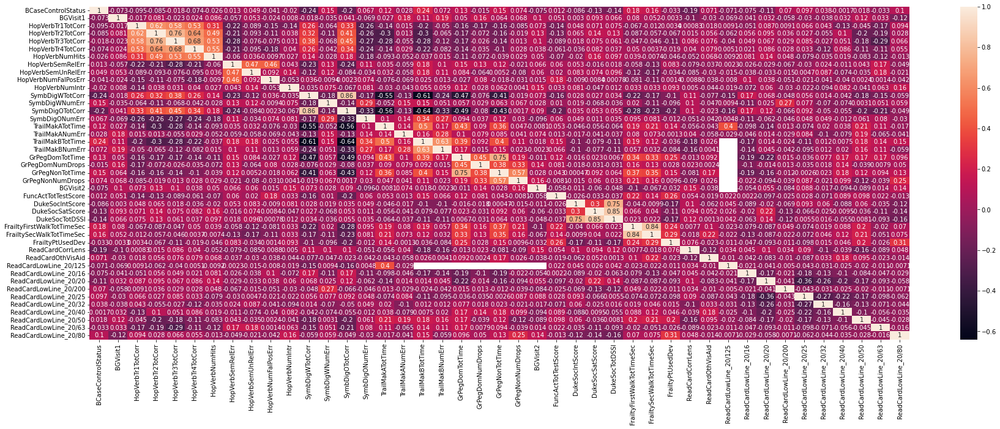

In [ ]:
f, ax = plt.subplots(figsize=(30, 10))
corr = data.corr()
sns.heatmap(corr,annot=True,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

# ***Validación cruzada***

In [49]:
X = data.loc[:, data.columns != 'BCaseControlStatus']
Y= data["BCaseControlStatus"]

X.shape, Y.shape

((201, 40), (201,))

In [50]:
X.columns

Index(['BGVisit1', 'HopVerbTr1TotCorr', 'HopVerbTr2TotCorr',
       'HopVerbTr3TotCorr', 'HopVerbTr4TotCorr', 'HopVerbNumHits',
       'HopVerbSemRelErr', 'HopVerbNumFalPosErr', 'HopVerbNumIntr',
       'SymbDigWTotCorr', 'SymbDigWNumErr', 'SymbDigOTotCorr',
       'SymbDigONumErr', 'TrailMakATotTime', 'TrailMakANumErr',
       'TrailMakBTotTime', 'TrailMakBNumErr', 'GrPegDomHand',
       'GrPegDomTotTime', 'GrPegDomNumDrops', 'GrPegNonTotTime',
       'GrPegNonNumDrops', 'BGVisit2', 'FuncActTotTestScore',
       'DukeSocIntScore', 'DukeSocSatScore', 'DukeSocTotDSSI',
       'FrailtyFirstWalkTotTimeSec', 'FrailtySecWalkTotTimeSec',
       'ReadCardCorrLens', 'ReadCardLowLine_20/125', 'ReadCardLowLine_20/16',
       'ReadCardLowLine_20/20', 'ReadCardLowLine_20/200',
       'ReadCardLowLine_20/25', 'ReadCardLowLine_20/32',
       'ReadCardLowLine_20/40', 'ReadCardLowLine_20/50',
       'ReadCardLowLine_20/63', 'ReadCardLowLine_20/80'],
      dtype='object')

In [51]:
from sklearn.svm import SVC

In [52]:
# Regresión logística con regularización 
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection   
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

def regresion_logistica(X_train, X_test, Y_train, Y_test,semilla):
  logreg= LogisticRegression(solver='liblinear',random_state=semilla)
  parameters = {"C":[1e-8,1e-7,1e-6,1e-5,1e-4,1,10,20, 30,40,50,100],"penalty":["l1"]}# l1 lasso l2 ridge
  valor_C=np.array([1e-8,1e-4,1,10,20,30,40,50,100])
  log_regression=GridSearchCV(logreg, parameters, scoring='accuracy', cv=5, return_train_score=True)

  log_regression.fit(X_train, Y_train) #Entrenamos

  # #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
  roc_log_train = np.array(log_regression.cv_results_['mean_train_score']) 
  roc_loc_val = np.array(log_regression.cv_results_['mean_test_score'])

    # Mostramos el mejor valor del parámetro y el score
  print("Valor correspondiente para el hiperparámetro: {}".format(log_regression.best_params_))
  print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(log_regression.best_score_))

# 2. Consulta de los valores de los hiper-parámetros utilizados en la creación del árbol
  log_regression.get_params()

  # 3. Se entrena el modelo con los mejores valores de los hiperparámetros y se obtienen las prestaciones en la partición de test
  regre_clasif = log_regression.best_estimator_
  modelo_regresion = regre_clasif.fit(X_train, Y_train)

  y_output_regresion = modelo_regresion.predict(X_test)
  print(accuracy_score(Y_test, y_output_regresion))
  print(confusion_matrix(Y_test, y_output_regresion))
  tn, fp, fn, tp = confusion_matrix(Y_test, y_output_regresion).ravel()
  Especificidad = tn / (tn + fp)
  Recall= recall_score(Y_test, y_output_regresion)
  Accuracy = accuracy_score(Y_test, y_output_regresion)
  Precision=precision_score(Y_test, y_output_regresion)
  f1=f1_score(Y_test, y_output_regresion)
  print("Sensibilidad, Accuracy, Especificidad, f1-score",Recall, Accuracy,Especificidad,f1)

  fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_regresion)
  roc_auc = metrics.auc(fpr, tpr)

  plt.title('Receiver Operating Characteristic')
  plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
  plt.legend(loc = 'lower right')
  plt.plot([0, 1], [0, 1],'r--')
  plt.xlim([0, 1])
  plt.ylim([0, 1])
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.show()

  return (Recall, Accuracy, Especificidad, f1, roc_auc)




In [53]:
from sklearn.tree import DecisionTreeClassifier
# Comenzamos importando los paquetes básicos
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score
from sklearn import metrics
from sklearn.neural_network import MLPRegressor

def decisionTree(X_train, X_test, Y_train, Y_test,semilla):

  # 1. Selección de hiper-parámetros del árbol. En principio, consideraremos sólo la profundidad máxima
  param_grid = {'max_depth': range(1,12), 'min_samples_leaf': range(5,50)}
  profundidad_grid = np.array(range(1,12))

  # X_train, X_test, Y_train, Y_test = train_test_split(X_all, Y_all, test_size = 0.2, random_state=2)
  grid_arbol_clasif = GridSearchCV(DecisionTreeClassifier(random_state=semilla), param_grid = param_grid, scoring = 'accuracy', cv=3, return_train_score=True)
  grid_arbol_clasif.fit(X_train, Y_train)
  print(grid_arbol_clasif.best_params_)

  # perf_train_arbol = np.array(grid_arbol_clasif.cv_results_['mean_train_score'])
  # perf_val_arbol = np.array(grid_arbol_clasif.cv_results_['mean_test_score'])

  # plt.plot(profundidad_grid,perf_train_arbol,'-o',label="train", linewidth=2)
  # plt.plot(profundidad_grid,perf_val_arbol,'-*b',label="val", linewidth=2)
  # plt.xlabel('Profundidad',fontsize=14)
  # plt.ylabel('ROC-AUC',fontsize=14)
  # plt.legend()
  # plt.show()

  print("Mejor ROC-AUC en validación cruzada: {:.3f}".format(grid_arbol_clasif.best_score_))
  print("Mejor valor del hiperparámetro: {}".format(grid_arbol_clasif.best_params_))

  # 2. Consulta de los valores de los hiper-parámetros utilizados en la creación del árbol
  grid_arbol_clasif.get_params()

  # 3. Se entrena el modelo con los mejores valores de los hiperparámetros y se obtienen las prestaciones en la partición de test
  Arbol_clasif_all = grid_arbol_clasif.best_estimator_
  modelo_arbol_clasif = Arbol_clasif_all.fit(X_train, Y_train)

  y_output_arbol = modelo_arbol_clasif.predict(X_test)
  print(accuracy_score(Y_test, y_output_arbol))
  print(confusion_matrix(Y_test, y_output_arbol))
  tn, fp, fn, tp = confusion_matrix(Y_test, y_output_arbol).ravel()
  Especificidad = tn / (tn + fp)
  Recall= recall_score(Y_test, y_output_arbol)
  Accuracy = accuracy_score(Y_test, y_output_arbol)
  Precision=precision_score(Y_test, y_output_arbol)
  f1=f1_score(Y_test, y_output_arbol)
  print("Sensibilidad, Accuracy, Especifididad, f1-score",Recall, Accuracy,Especificidad,f1)

  fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_arbol)
  roc_auc = metrics.auc(fpr, tpr)

  plt.title('Receiver Operating Characteristic')
  plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
  plt.legend(loc = 'lower right')
  plt.plot([0, 1], [0, 1],'r--')
  plt.xlim([0, 1])
  plt.ylim([0, 1])
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.show()

  return (Recall, Accuracy, Especificidad, f1, roc_auc)

In [54]:
def knn (X_train,X_test,Y_train,Y_test):
  # 5. Selección del hiper-parámetro haciendo uso del conjunto de diseño con características estandarizadas. 

  param_grid = {'n_neighbors': range(1,81,2)}
  k_grid = np.array(range(1,81,2))
  grid_knn = GridSearchCV(KNeighborsClassifier(metric='euclidean'), param_grid = param_grid, scoring = 'accuracy', cv=3, return_train_score=True)
  grid_knn.fit(X_train, Y_train) 

  #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
  
  auc_knn_all_train = np.array(grid_knn.cv_results_['mean_train_score'])
  auc_knn_all_val = np.array(grid_knn.cv_results_['mean_test_score'])


  plt.plot(k_grid,auc_knn_all_train,'-o',label="train", linewidth=2)
  plt.plot(k_grid,auc_knn_all_val,'-*b',label="val", linewidth=2)
  plt.xlabel('k',fontsize=14)
  plt.ylabel('roc_auc',fontsize=14)
  plt.legend()
  plt.show()

  print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(grid_knn.best_score_))
  print("Valor correspondiente para el hiperparámetro: {}".format(grid_knn.best_params_))

  # 2. Consulta de los valores de los hiper-parámetros utilizados en la creación del árbol
  grid_knn.get_params()

  # 3. Se entrena el modelo con los mejores valores de los hiperparámetros y se obtienen las prestaciones en la partición de test
  kNN_clasif_all = grid_knn.best_estimator_
  modelo_knn_clasif2 = kNN_clasif_all.fit(X_train, Y_train)

  y_output_knn2 = modelo_knn_clasif2.predict(X_test)
  print(accuracy_score(Y_test, y_output_knn2))
  print(confusion_matrix(Y_test, y_output_knn2))
  tn, fp, fn, tp = confusion_matrix(Y_test, y_output_knn2).ravel()
  Especificidad = tn / (tn + fp)

  Recall= recall_score(Y_test, y_output_knn2)
  Accuracy = accuracy_score(Y_test, y_output_knn2)
  Precision=precision_score(Y_test, y_output_knn2)
  f1=f1_score(Y_test, y_output_knn2)
  print("Sensibilidad, Accuracy, Especificidad, f1-score",Recall, Accuracy,Especificidad,f1)

  fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_knn2)
  roc_auc = metrics.auc(fpr, tpr)

  plt.title('Receiver Operating Characteristic')
  plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
  plt.legend(loc = 'lower right')
  plt.plot([0, 1], [0, 1],
           'r--')
  plt.xlim([0, 1])
  plt.ylim([0, 1])
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.show()

  return (Recall, Accuracy, Especificidad, f1, roc_auc)

In [55]:
def svc (X_train,X_test,Y_train,Y_test,semilla):
  # 5. Selección del hiper-parámetro haciendo uso del conjunto de diseño con características estandarizadas. 
  svc=SVC(decision_function_shape='ovo',random_state=semilla)
  parameters = {'kernel': ['rbf'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
                      'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]}

  svc=GridSearchCV(svc, parameters, scoring='accuracy', cv=5, return_train_score=True)

  svc.fit(X_train, Y_train) #Entrenamos

  # #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
  roc_svc_train = np.array(svc.cv_results_['mean_train_score']) 
  roc_svc_val = np.array(svc.cv_results_['mean_test_score'])

  # Mostramos el mejor valor del parámetro y el score
  print("Valor correspondiente para el hiperparámetro: {}".format(svc.best_params_))
  print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(svc.best_score_))

  # 2. Consulta de los valores de los hiper-parámetros 
  svc.get_params()

  # 3. Se entrena el modelo con los mejores valores de los hiperparámetros y se obtienen las prestaciones en la partición de test
  svc_classif = svc.best_estimator_
  modelo_svc = svc_classif.fit(X_train, Y_train)

  y_output_svc = modelo_svc.predict(X_test)
  print(accuracy_score(Y_test, y_output_svc))
  print(confusion_matrix(Y_test, y_output_svc))
  tn, fp, fn, tp = confusion_matrix(Y_test, y_output_svc).ravel()
  Especificidad = tn / (tn + fp)
  Recall= recall_score(Y_test, y_output_svc)
  Accuracy = accuracy_score(Y_test, y_output_svc)
  Precision=precision_score(Y_test, y_output_svc)
  f1=f1_score(Y_test, y_output_svc)
  print("Sensibilidad, Accuracy, Especificidad, f1-score",Recall, Accuracy,Especificidad,f1)

  fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_svc)
  roc_auc = metrics.auc(fpr, tpr)

  plt.title('Receiver Operating Characteristic')
  plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
  plt.legend(loc = 'lower right')
  plt.plot([0, 1], [0, 1],'r--')
  plt.xlim([0, 1])
  plt.ylim([0, 1])
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.show()

  return (Recall, Accuracy, Especificidad, f1, roc_auc)

In [56]:
def svc_lineal (X_train,X_test,Y_train,Y_test,semilla):
  # 5. Selección del hiper-parámetro haciendo uso del conjunto de diseño con características estandarizadas. 
  svc=SVC(decision_function_shape='ovo',random_state=semilla)
  parameters = {'kernel': ['linear'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
                      'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]}

  svc=GridSearchCV(svc, parameters, scoring='accuracy', cv=5, return_train_score=True)

  svc.fit(X_train, Y_train) #Entrenamos

  # #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
  roc_svc_train = np.array(svc.cv_results_['mean_train_score']) 
  roc_svc_val = np.array(svc.cv_results_['mean_test_score'])

  # Mostramos el mejor valor del parámetro y el score
  print("Valor correspondiente para el hiperparámetro: {}".format(svc.best_params_))
  print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(svc.best_score_))

  # 2. Consulta de los valores de los hiper-parámetros 
  svc.get_params()

  # 3. Se entrena el modelo con los mejores valores de los hiperparámetros y se obtienen las prestaciones en la partición de test
  svc_classif = svc.best_estimator_
  modelo_svc = svc_classif.fit(X_train, Y_train)

  y_output_svc = modelo_svc.predict(X_test)
  print(accuracy_score(Y_test, y_output_svc))
  print(confusion_matrix(Y_test, y_output_svc))
  tn, fp, fn, tp = confusion_matrix(Y_test, y_output_svc).ravel()
  Especificidad = tn / (tn + fp)
  Recall= recall_score(Y_test, y_output_svc)
  Accuracy = accuracy_score(Y_test, y_output_svc)
  Precision=precision_score(Y_test, y_output_svc)
  f1=f1_score(Y_test, y_output_svc)
  print("Sensibilidad, Accuracy, Especificidad, f1-score",Recall, Accuracy,Especificidad,f1)

  fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_svc)
  roc_auc = metrics.auc(fpr, tpr)

  plt.title('Receiver Operating Characteristic')
  plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
  plt.legend(loc = 'lower right')
  plt.plot([0, 1], [0, 1],'r--')
  plt.xlim([0, 1])
  plt.ylim([0, 1])
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.show()

  return (Recall, Accuracy, Especificidad, f1, roc_auc)

In [57]:
from sklearn.neural_network import MLPClassifier

# 1. Extracción de las dos características de interés para realizar el diseño
def MLP(X_train,X_test,Y_train,Y_test,semilla):

  # 4. Configuración del MLP
  param_grid = {'hidden_layer_sizes': range(2,152,10)}
  neuronas_ocultas_grid = np.array(range(2,152,10))

  grid_MLP = GridSearchCV(MLPClassifier(max_iter = 10000, random_state=semilla, activation='tanh'), param_grid = param_grid, scoring = 'accuracy', cv=5, return_train_score=True)
  grid_MLP.fit(X_train, Y_train)


  acc_MLP_train = np.array(grid_MLP.cv_results_['mean_train_score'])
  acc_MLP_val = np.array(grid_MLP.cv_results_['mean_test_score'])
    # Mostramos el mejor valor del parámetro y el score
  print("Valor correspondiente para el hiperparámetro: {}".format(grid_MLP.best_params_))
  print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(grid_MLP.best_score_))
        
  # 2. Consulta de los valores de los hiper-parámetros 
  grid_MLP.get_params()

  # 3. Se entrena el modelo con los mejores valores de los hiperparámetros y se obtienen las prestaciones en la partición de test
  MLP_classif = grid_MLP.best_estimator_
  modelo_MLP = MLP_classif.fit(X_train, Y_train)

  y_output_mlp = modelo_MLP.predict(X_test)
  print(accuracy_score(Y_test, y_output_mlp))
  print(confusion_matrix(Y_test, y_output_mlp))

  Recall= recall_score(Y_test, y_output_mlp)
  Accuracy = accuracy_score(Y_test, y_output_mlp)
  Precision=precision_score(Y_test, y_output_mlp)
  f1=f1_score(Y_test, y_output_mlp)
  print("Sensibilidad, Accuracy, precision, f1-score",Recall, Accuracy,Precision,f1)

  fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_mlp)
  roc_auc = metrics.auc(fpr, tpr)

  plt.title('Receiver Operating Characteristic')
  plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
  plt.legend(loc = 'lower right')
  plt.plot([0, 1], [0, 1],'r--')
  plt.xlim([0, 1])
  plt.ylim([0, 1])
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.show()

  return (Recall, Accuracy, Precision, f1, roc_auc)      


In [58]:
list_x_train = []
list_y_train = []
list_x_test = []
list_y_test = []

#LISTAS PARA STANDARD SCALER
recall_reg_std = []
accuracy_reg_std = []
precision_reg_std=[]
f1_reg_std=[]
roc_reg_std= []

recall_arbol_std = []
accuracy_arbol_std = []
precision_arbol_std=[]
f1_arbol_std=[]
roc_arbol_std= []

recall_knn_std = []
accuracy_knn_std = []
precision_knn_std=[]
f1_knn_std=[]
roc_knn_std= []

recall_svc_std = []
accuracy_svc_std = []
precision_svc_std=[]
f1_svc_std=[]
roc_svc_std= []

recall_svc_lin_std = []
accuracy_svc_lin_std = []
precision_svc_lin_std=[]
f1_svc_lin_std=[]
roc_svc_lin_std= []

#LISTAS PARA MIN-MAX

recall_reg_scaler = []
accuracy_reg_scaler = []
precision_reg_scaler=[]
f1_reg_scaler=[]
roc_reg_scaler= []

recall_arbol_scaler = []
accuracy_arbol_scaler = []
precision_arbol_scaler=[]
f1_arbol_scaler=[]
roc_arbol_scaler= []

recall_knn_scaler = []
accuracy_knn_scaler = []
precision_knn_scaler=[]
f1_knn_scaler=[]
roc_knn_scaler= []

recall_svc_scaler = []
accuracy_svc_scaler = []
precision_svc_scaler=[]
f1_svc_scaler=[]
roc_svc_scaler= []

recall_svc_lin_scaler = []
accuracy_svc_lin_scaler = []
precision_svc_lin_scaler=[]
f1_svc_lin_scaler=[]
roc_svc_lin_scaler= []

recall_mlp_lin_scaler = []
accuracy_mlp_lin_scaler = []
precision_mlp_lin_scaler=[]
f1_mlp_lin_scaler=[]
roc_mlp_lin_scaler= []

for i in range(0, 5):
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, stratify= Y, test_size=0.2, random_state=i)
  print(X_train.shape, Y_train.shape, X_test.shape, Y_test.shape)

  list_x_train.append(X_train)
  list_y_train.append(Y_train)
  list_y_test.append(Y_test)
  list_x_test.append(X_test)

  


(160, 40) (160,) (41, 40) (41,)
(160, 40) (160,) (41, 40) (41,)
(160, 40) (160,) (41, 40) (41,)
(160, 40) (160,) (41, 40) (41,)
(160, 40) (160,) (41, 40) (41,)


# ***PRIMERA PARTICIÓN***

In [61]:
X_train_0=list_x_train[0]
Y_train_0=list_y_train[0]
X_test_0=list_x_test[0]
Y_test_0=list_y_test[0]

In [62]:
X_train_0.iloc[:, 26]

26     27.0
1      26.0
162    30.0
25     25.0
94     24.0
       ... 
53     25.0
115    24.0
178    27.0
99     27.0
119    32.0
Name: DukeSocTotDSSI, Length: 160, dtype: float64

In [63]:

X_train_0.isna().sum()

BGVisit1                      1
HopVerbTr1TotCorr             1
HopVerbTr2TotCorr             1
HopVerbTr3TotCorr             1
HopVerbTr4TotCorr             2
HopVerbNumHits                2
HopVerbSemRelErr              2
HopVerbNumFalPosErr           2
HopVerbNumIntr                4
SymbDigWTotCorr               5
SymbDigWNumErr                5
SymbDigOTotCorr               6
SymbDigONumErr                6
TrailMakATotTime              0
TrailMakANumErr               0
TrailMakBTotTime              4
TrailMakBNumErr               4
GrPegDomHand                  2
GrPegDomTotTime               1
GrPegDomNumDrops              1
GrPegNonTotTime               3
GrPegNonNumDrops              3
BGVisit2                      5
FuncActTotTestScore           0
DukeSocIntScore               1
DukeSocSatScore               1
DukeSocTotDSSI                1
FrailtyFirstWalkTotTimeSec    2
FrailtySecWalkTotTimeSec      2
ReadCardCorrLens              0
ReadCardLowLine_20/125        0
ReadCard

In [64]:
from statistics import mode

for i in X_train_0:
  try:
    X_train_0[i].replace(np.nan, mode(X_train_0[i]), inplace=True)
    X_test_0[i].replace(np.nan, mode(X_train_0[i]), inplace=True)
  except:
    print(i)


BGVisit1
SymbDigOTotCorr
TrailMakBTotTime
GrPegNonTotTime
BGVisit2


In [65]:
X_train_0.isna().sum()

BGVisit1                      1
HopVerbTr1TotCorr             0
HopVerbTr2TotCorr             0
HopVerbTr3TotCorr             0
HopVerbTr4TotCorr             0
HopVerbNumHits                0
HopVerbSemRelErr              0
HopVerbNumFalPosErr           0
HopVerbNumIntr                0
SymbDigWTotCorr               0
SymbDigWNumErr                0
SymbDigOTotCorr               6
SymbDigONumErr                0
TrailMakATotTime              0
TrailMakANumErr               0
TrailMakBTotTime              4
TrailMakBNumErr               0
GrPegDomHand                  0
GrPegDomTotTime               0
GrPegDomNumDrops              0
GrPegNonTotTime               3
GrPegNonNumDrops              0
BGVisit2                      5
FuncActTotTestScore           0
DukeSocIntScore               0
DukeSocSatScore               0
DukeSocTotDSSI                0
FrailtyFirstWalkTotTimeSec    0
FrailtySecWalkTotTimeSec      0
ReadCardCorrLens              0
ReadCardLowLine_20/125        0
ReadCard

Debemos imputar los valores nulos con knn_imputer:

In [66]:

# from numpy import mean
# from numpy import std
# from pandas import read_csv
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.impute import KNNImputer
# from sklearn.model_selection import cross_val_score
# from sklearn.model_selection import RepeatedStratifiedKFold
# from sklearn.pipeline import Pipeline
# from matplotlib import pyplot

# # evaluate each strategy on the dataset
# results = list()
# strategies = [str(i) for i in [1,3,5,7,9,15,18,21]]
# for s in strategies:
# 	# create the modeling pipeline
# 	pipeline = Pipeline(steps=[('i', KNNImputer(n_neighbors=int(s))), ('m', RandomForestClassifier())])
# 	# evaluate the model
# 	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)
# 	scores = cross_val_score(pipeline, X_train_0, Y_train_0, scoring='accuracy', cv=cv, n_jobs=-1)
# 	# store results
# 	results.append(scores)
# 	print('>%s %.3f (%.3f)' % (s, mean(scores), std(scores)))
# # plot model performance for comparison
# pyplot.boxplot(results, labels=strategies, showmeans=True)
# pyplot.show()

In [67]:
from numpy import isnan
from pandas import read_csv
from sklearn.impute import KNNImputer

# define imputer
imputer = KNNImputer(n_neighbors=7, weights='uniform', metric='nan_euclidean')

imputer.fit(X_train_0)

# transform the dataset
X_train_0 = imputer.transform(X_train_0)

# print total missing
print('Missing: %d' % sum(isnan(X_train_0).flatten()))

X_test_0=imputer.transform(X_test_0)
print('Missing: %d' % sum(isnan(X_test_0).flatten()))


Missing: 0
Missing: 0


In [68]:
X_train_0.shape


(160, 40)

In [69]:
X.dtypes

BGVisit1                      float64
HopVerbTr1TotCorr             float64
HopVerbTr2TotCorr             float64
HopVerbTr3TotCorr             float64
HopVerbTr4TotCorr             float64
HopVerbNumHits                float64
HopVerbSemRelErr              float64
HopVerbNumFalPosErr           float64
HopVerbNumIntr                float64
SymbDigWTotCorr               float64
SymbDigWNumErr                float64
SymbDigOTotCorr               float64
SymbDigONumErr                float64
TrailMakATotTime                int64
TrailMakANumErr                 int64
TrailMakBTotTime              float64
TrailMakBNumErr               float64
GrPegDomHand                  float64
GrPegDomTotTime               float64
GrPegDomNumDrops              float64
GrPegNonTotTime               float64
GrPegNonNumDrops              float64
BGVisit2                      float64
FuncActTotTestScore             int64
DukeSocIntScore               float64
DukeSocSatScore               float64
DukeSocTotDS

In [70]:
X_train_numerical0=X_train_0[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,19,20,21,22,23,24,25,26,27,28]]
X_train_categorical0=X_train_0[:,[17,29,30,31,32,33,34,35,36,37,38,39]]
X_test_numerical0=X_test_0[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,19,20,21,22,23,24,25,26,27,28]]
X_test_categorical0=X_test_0[:,[17,29,30,31,32,33,34,35,36,37,38,39]]

In [71]:
X_train_numerical0.shape + X_train_categorical0.shape

(160, 28, 160, 12)

In [72]:

from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing

std_all = preprocessing.StandardScaler().fit(X_train_numerical0)
X_std_train_numerical = std_all.transform(X_train_numerical0) #Tendriamos todas las características estandarizadas
X_std_test_numerical = std_all.transform(X_test_numerical0)

In [73]:
X_train_std_all0=np.c_[X_std_train_numerical,X_train_categorical0]
X_test_std_all0=np.c_[X_std_test_numerical,X_test_categorical0]


In [74]:
X_train_std_all0.shape

(160, 40)

In [75]:
#CON MIN-MAX

scaler = preprocessing.MinMaxScaler().fit(X_train_numerical0)
X_scaler_train_numerical = scaler.transform(X_train_numerical0) 
X_scaler_test_numerical=scaler.transform(X_test_numerical0)

In [76]:
#Concatenamos para min-max

X_train_scaler_all0=np.c_[X_scaler_train_numerical,X_train_categorical0]
X_test_scaler_all0=np.c_[X_scaler_test_numerical,X_test_categorical0]


A continuación, aplicacmos los modelos:

In [77]:
# #CON VARIABLES NORMALIZADAS CON STANDARD SCALER

# r=regresion_logistica(X_train_std_all0,X_test_std_all0,Y_train_0,Y_test_0,0)
# recall_reg_std.append(r[0])
# accuracy_reg_std.append(r[1])
# precision_reg_std.append(r[2])
# f1_reg_std.append(r[3])
# roc_reg_std.append(r[4])

# a=decisionTree(X_train_std_all0,X_test_std_all0,Y_train_0,Y_test_0,0)
# recall_arbol_std.append(a[0])
# accuracy_arbol_std.append(a[1])
# precision_arbol_std.append(a[2])
# f1_arbol_std.append(a[3])
# roc_arbol_std.append(a[4])

# k=knn(X_train_std_all0,X_test_std_all0,Y_train_0,Y_test_0)
# recall_knn_std.append(k[0])
# accuracy_knn_std.append(k[1])
# precision_knn_std.append(k[2])
# f1_knn_std.append(k[3])
# roc_knn_std.append(k[4])

# s=svc(X_train_std_all0,X_test_std_all0,Y_train_0,Y_test_0,0)
# recall_svc_std.append(s[0])
# accuracy_svc_std.append(s[1])
# precision_svc_std.append(s[2])
# f1_svc_std.append(s[3])
# roc_svc_std.append(s[4])

# sl=svc_lineal(X_train_std_all0,X_test_std_all0,Y_train_0,Y_test_0,0)
# recall_svc_lin_std.append(sl[0])
# accuracy_svc_lin_std.append(sl[1])
# precision_svc_lin_std.append(sl[2])
# f1_svc_lin_std.append(sl[3])
# roc_svc_lin_std.append(s[4])

Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.569
0.5853658536585366
[[14  6]
 [11 10]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.47619047619047616 0.5853658536585366 0.7 0.5405405405405405


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


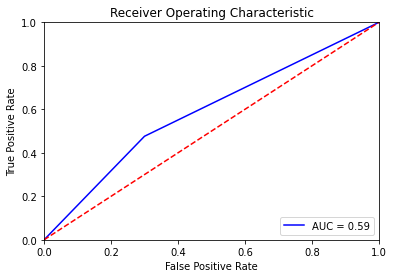

{'max_depth': 3, 'min_samples_leaf': 5}
Mejor ROC-AUC en validación cruzada: 0.619
Mejor valor del hiperparámetro: {'max_depth': 3, 'min_samples_leaf': 5}
0.5121951219512195
[[12  8]
 [12  9]]
Sensibilidad, Accuracy, Especifididad, f1-score 0.42857142857142855 0.5121951219512195 0.6 0.4736842105263158


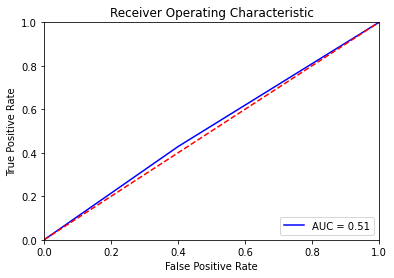

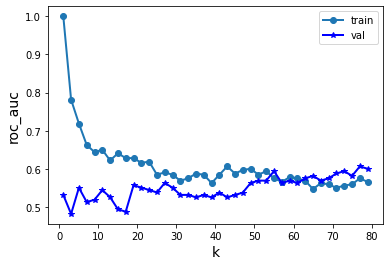

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.606
Valor correspondiente para el hiperparámetro: {'n_neighbors': 77}
0.5121951219512195
[[17  3]
 [17  4]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.19047619047619047 0.5121951219512195 0.85 0.2857142857142857


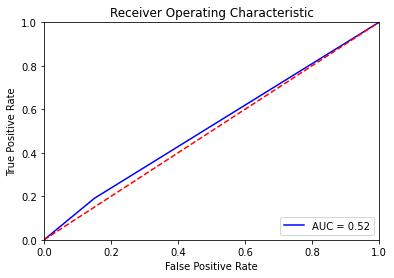

Valor correspondiente para el hiperparámetro: {'C': 50, 'gamma': 0.01, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.594
0.5609756097560976
[[13  7]
 [11 10]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.47619047619047616 0.5609756097560976 0.65 0.5263157894736842


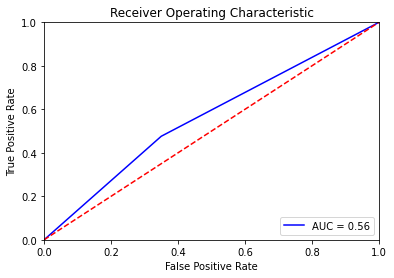

Valor correspondiente para el hiperparámetro: {'C': 0.001, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.575
0.6341463414634146
[[14  6]
 [ 9 12]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.5714285714285714 0.6341463414634146 0.7 0.6153846153846153


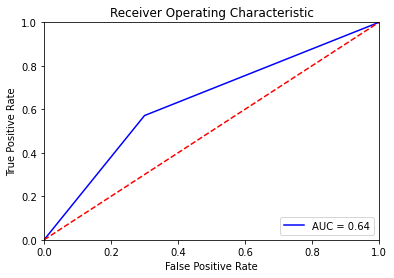

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_scaler_all0,X_test_scaler_all0,Y_train_0,Y_test_0,0)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_scaler_all0,X_test_scaler_all0,Y_train_0,Y_test_0,0)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_scaler_all0,X_test_scaler_all0,Y_train_0,Y_test_0)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_scaler_all0,X_test_scaler_all0,Y_train_0,Y_test_0,0)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_scaler_all0,X_test_scaler_all0,Y_train_0,Y_test_0,0)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(sl[4])

# ***Segunda partición***

In [78]:
X_train_1=list_x_train[1]
Y_train_1=list_y_train[1]
X_test_1=list_x_test[1]
Y_test_1=list_y_test[1]

In [79]:
X_train_1.isna().sum()

BGVisit1                      1
HopVerbTr1TotCorr             0
HopVerbTr2TotCorr             0
HopVerbTr3TotCorr             0
HopVerbTr4TotCorr             1
HopVerbNumHits                1
HopVerbSemRelErr              1
HopVerbNumFalPosErr           1
HopVerbNumIntr                3
SymbDigWTotCorr               7
SymbDigWNumErr                7
SymbDigOTotCorr               8
SymbDigONumErr                8
TrailMakATotTime              0
TrailMakANumErr               0
TrailMakBTotTime              3
TrailMakBNumErr               3
GrPegDomHand                  2
GrPegDomTotTime               1
GrPegDomNumDrops              1
GrPegNonTotTime               3
GrPegNonNumDrops              3
BGVisit2                      4
FuncActTotTestScore           0
DukeSocIntScore               1
DukeSocSatScore               1
DukeSocTotDSSI                1
FrailtyFirstWalkTotTimeSec    2
FrailtySecWalkTotTimeSec      2
ReadCardCorrLens              0
ReadCardLowLine_20/125        0
ReadCard

In [80]:
from statistics import mode

for i in X_train_1:
  try:
    X_train_1[i].replace(np.nan, mode(X_train_1[i]), inplace=True)
    X_test_1[i].replace(np.nan, mode(X_train_1[i]), inplace=True)
  except:
    print(i)


BGVisit1
SymbDigWTotCorr
SymbDigOTotCorr
GrPegDomTotTime
GrPegNonTotTime
BGVisit2


Debemos imputar los valores nulos con knn_imputer:

In [81]:

# from numpy import mean
# from numpy import std
# from pandas import read_csv
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.impute import KNNImputer
# from sklearn.model_selection import cross_val_score
# from sklearn.model_selection import RepeatedStratifiedKFold
# from sklearn.pipeline import Pipeline
# from matplotlib import pyplot

# # evaluate each strategy on the dataset
# results = list()
# strategies = [str(i) for i in [1,3,5,7,9,15,18,21]]
# for s in strategies:
# 	# create the modeling pipeline
# 	pipeline = Pipeline(steps=[('i', KNNImputer(n_neighbors=int(s))), ('m', RandomForestClassifier())])
# 	# evaluate the model
# 	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)
# 	scores = cross_val_score(pipeline, X_train_1, Y_train_1, scoring='accuracy', cv=cv, n_jobs=-1)
# 	# store results
# 	results.append(scores)
# 	print('>%s %.3f (%.3f)' % (s, mean(scores), std(scores)))
# # plot model performance for comparison
# pyplot.boxplot(results, labels=strategies, showmeans=True)
# pyplot.show()

In [82]:
from numpy import isnan
from pandas import read_csv
from sklearn.impute import KNNImputer

# define imputer
imputer = KNNImputer(n_neighbors=1, weights='uniform', metric='nan_euclidean')

imputer.fit(X_train_1)

# transform the dataset
X_train_1 = imputer.transform(X_train_1)

# print total missing
print('Missing: %d' % sum(isnan(X_train_1).flatten()))

X_test_1=imputer.transform(X_test_1)
print('Missing: %d' % sum(isnan(X_test_1).flatten()))


Missing: 0
Missing: 0


In [83]:
X_train_numerical1=X_train_1[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,19,20,21,22,23,24,25,26,27,28]]
X_train_categorical1=X_train_1[:,[17,29,30,31,32,33,34,35,36,37,38,39]]
X_test_numerical1=X_test_1[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,19,20,21,22,23,24,25,26,27,28]]
X_test_categorical1=X_test_1[:,[17,29,30,31,32,33,34,35,36,37,38,39]]



In [84]:

from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing

std_all = preprocessing.StandardScaler().fit(X_train_numerical1)
X_std_train_numerical = std_all.transform(X_train_numerical1) #Tendriamos todas las características estandarizadas
X_std_test_numerical = std_all.transform(X_test_numerical1)

In [85]:
X_train_std_all1=np.c_[X_std_train_numerical,X_train_categorical1]
X_test_std_all1=np.c_[X_std_test_numerical,X_test_categorical1]


In [86]:
X_train_std_all1.shape

(160, 40)

In [87]:
#CON MIN-MAX

scaler = preprocessing.MinMaxScaler().fit(X_train_numerical1)
X_scaler_train_numerical = scaler.transform(X_train_numerical1) 
X_scaler_test_numerical=scaler.transform(X_test_numerical1)

In [88]:
#Concatenamos para min-max

X_train_scaler_all1=np.c_[X_scaler_train_numerical,X_train_categorical1]
X_test_scaler_all1=np.c_[X_scaler_test_numerical,X_test_categorical1]


A continuación, aplicacmos los modelos:

In [89]:
#CON VARIABLES NORMALIZADAS CON STANDARD SCALER

# r=regresion_logistica(X_train_std_all1,X_test_std_all1,Y_train_1,Y_test_1,1)
# recall_reg_std.append(r[0])
# accuracy_reg_std.append(r[1])
# precision_reg_std.append(r[2])
# f1_reg_std.append(r[3])
# roc_reg_std.append(r[4])

# a=decisionTree(X_train_std_all1,X_test_std_all1,Y_train_1,Y_test_1,1)
# recall_arbol_std.append(a[0])
# accuracy_arbol_std.append(a[1])
# precision_arbol_std.append(a[2])
# f1_arbol_std.append(a[3])
# roc_arbol_std.append(a[4])

# k=knn(X_train_std_all1,X_test_std_all1,Y_train_1,Y_test_1)
# recall_knn_std.append(k[0])
# accuracy_knn_std.append(k[1])
# precision_knn_std.append(k[2])
# f1_knn_std.append(k[3])
# roc_knn_std.append(k[4])

# s=svc(X_train_std_all1,X_test_std_all1,Y_train_1,Y_test_1,1)
# recall_svc_std.append(s[0])
# accuracy_svc_std.append(s[1])
# precision_svc_std.append(s[2])
# f1_svc_std.append(s[3])
# roc_svc_std.append(s[4])

# sl=svc_lineal(X_train_std_all1,X_test_std_all1,Y_train_1,Y_test_1,1)
# recall_svc_lin_std.append(sl[0])
# accuracy_svc_lin_std.append(sl[1])
# precision_svc_lin_std.append(sl[2])
# f1_svc_lin_std.append(sl[3])
# roc_svc_lin_std.append(sl[4])

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.637
0.6341463414634146
[[12  8]
 [ 7 14]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.6666666666666666 0.6341463414634146 0.6 0.6511627906976744


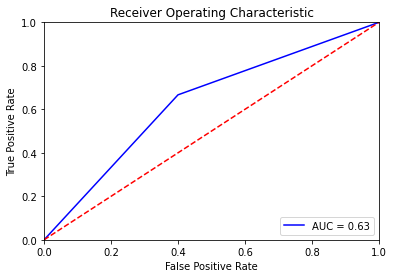

{'max_depth': 1, 'min_samples_leaf': 48}
Mejor ROC-AUC en validación cruzada: 0.613
Mejor valor del hiperparámetro: {'max_depth': 1, 'min_samples_leaf': 48}
0.5365853658536586
[[13  7]
 [12  9]]
Sensibilidad, Accuracy, Especifididad, f1-score 0.42857142857142855 0.5365853658536586 0.65 0.4864864864864864


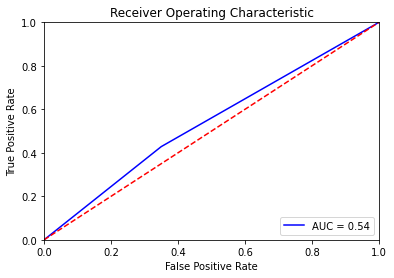

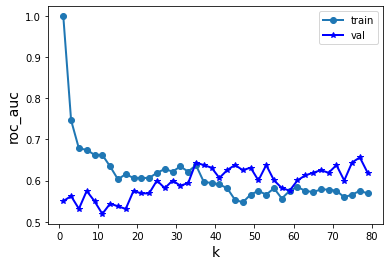

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.656
Valor correspondiente para el hiperparámetro: {'n_neighbors': 77}
0.5853658536585366
[[15  5]
 [12  9]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.42857142857142855 0.5853658536585366 0.75 0.5142857142857143


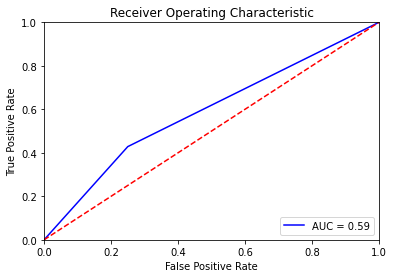

Valor correspondiente para el hiperparámetro: {'C': 25, 'gamma': 0.001, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.631
0.5609756097560976
[[11  9]
 [ 9 12]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.5714285714285714 0.5609756097560976 0.55 0.5714285714285714


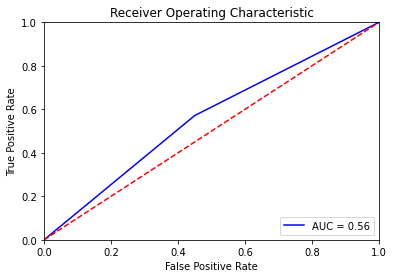

Valor correspondiente para el hiperparámetro: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.625
0.5609756097560976
[[11  9]
 [ 9 12]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.5714285714285714 0.5609756097560976 0.55 0.5714285714285714


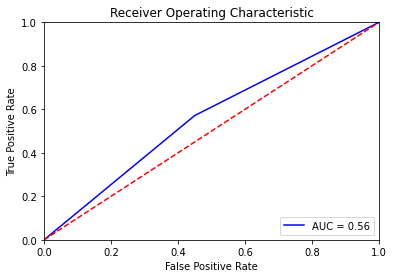

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_scaler_all1,X_test_scaler_all1,Y_train_1,Y_test_1,1)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_scaler_all1,X_test_scaler_all1,Y_train_1,Y_test_1,1)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_scaler_all1,X_test_scaler_all1,Y_train_1,Y_test_1)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_scaler_all1,X_test_scaler_all1,Y_train_1,Y_test_1,1)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_scaler_all1,X_test_scaler_all1,Y_train_1,Y_test_1,1)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(sl[4])

# ***Tercera partición***

In [90]:
X_train_2=list_x_train[2]
Y_train_2=list_y_train[2]
X_test_2=list_x_test[2]
Y_test_2=list_y_test[2]

In [91]:
X_train_2.isna().sum()

BGVisit1                      1
HopVerbTr1TotCorr             1
HopVerbTr2TotCorr             1
HopVerbTr3TotCorr             1
HopVerbTr4TotCorr             1
HopVerbNumHits                1
HopVerbSemRelErr              1
HopVerbNumFalPosErr           1
HopVerbNumIntr                3
SymbDigWTotCorr               5
SymbDigWNumErr                5
SymbDigOTotCorr               6
SymbDigONumErr                6
TrailMakATotTime              0
TrailMakANumErr               0
TrailMakBTotTime              5
TrailMakBNumErr               5
GrPegDomHand                  2
GrPegDomTotTime               2
GrPegDomNumDrops              2
GrPegNonTotTime               2
GrPegNonNumDrops              2
BGVisit2                      5
FuncActTotTestScore           0
DukeSocIntScore               0
DukeSocSatScore               0
DukeSocTotDSSI                0
FrailtyFirstWalkTotTimeSec    1
FrailtySecWalkTotTimeSec      1
ReadCardCorrLens              0
ReadCardLowLine_20/125        0
ReadCard

In [92]:
from statistics import mode

for i in X_train_2:
  try:
    X_train_2[i].replace(np.nan, mode(X_train_2[i]), inplace=True)
    X_test_2[i].replace(np.nan, mode(X_train_2[i]), inplace=True)
  except:
    print(i)


HopVerbTr4TotCorr
SymbDigWTotCorr
TrailMakATotTime
GrPegNonTotTime
BGVisit2


Debemos imputar los valores nulos con knn_imputer:

In [93]:

# from numpy import mean
# from numpy import std
# from pandas import read_csv
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.impute import KNNImputer
# from sklearn.model_selection import cross_val_score
# from sklearn.model_selection import RepeatedStratifiedKFold
# from sklearn.pipeline import Pipeline
# from matplotlib import pyplot

# # evaluate each strategy on the dataset
# results = list()
# strategies = [str(i) for i in [1,3,5,7,9,15,18,21]]
# for s in strategies:
# 	# create the modeling pipeline
# 	pipeline = Pipeline(steps=[('i', KNNImputer(n_neighbors=int(s))), ('m', RandomForestClassifier())])
# 	# evaluate the model
# 	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)
# 	scores = cross_val_score(pipeline, X_train_2, Y_train_2, scoring='accuracy', cv=cv, n_jobs=-1)
# 	# store results
# 	results.append(scores)
# 	print('>%s %.3f (%.3f)' % (s, mean(scores), std(scores)))
# # plot model performance for comparison
# pyplot.boxplot(results, labels=strategies, showmeans=True)
# pyplot.show()

In [94]:
from numpy import isnan
from pandas import read_csv
from sklearn.impute import KNNImputer

# define imputer
imputer = KNNImputer(n_neighbors=7, weights='uniform', metric='nan_euclidean')

imputer.fit(X_train_2)

# transform the dataset
X_train_2 = imputer.transform(X_train_2)

# print total missing
print('Missing: %d' % sum(isnan(X_train_2).flatten()))

X_test_2=imputer.transform(X_test_2)
print('Missing: %d' % sum(isnan(X_test_2).flatten()))


Missing: 0
Missing: 0


In [95]:
X_train_numerical2=X_train_2[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,19,20,21,22,23,24,25,26,27,28]]
X_train_categorical2=X_train_2[:,[17,29,30,31,32,33,34,35,36,37,38,39]]
X_test_numerical2=X_test_2[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,19,20,21,22,23,24,25,26,27,28]]
X_test_categorical2=X_test_2[:,[17,29,30,31,32,33,34,35,36,37,38,39]]


In [96]:

from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing

std_all = preprocessing.StandardScaler().fit(X_train_numerical2)
X_std_train_numerical = std_all.transform(X_train_numerical2) #Tendriamos todas las características estandarizadas
X_std_test_numerical = std_all.transform(X_test_numerical2)

In [97]:
X_train_std_all2=np.c_[X_std_train_numerical,X_train_categorical2]
X_test_std_all2=np.c_[X_std_test_numerical,X_test_categorical2]


In [98]:
X_train_std_all2.shape

(160, 40)

In [99]:
#CON MIN-MAX

scaler = preprocessing.MinMaxScaler().fit(X_train_numerical2)
X_scaler_train_numerical = scaler.transform(X_train_numerical2) 
X_scaler_test_numerical=scaler.transform(X_test_numerical2)

In [100]:
#Concatenamos para min-max

X_train_scaler_all2=np.c_[X_scaler_train_numerical,X_train_categorical2]
X_test_scaler_all2=np.c_[X_scaler_test_numerical,X_test_categorical2]


A continuación, aplicacmos los modelos:

In [101]:
# #CON VARIABLES NORMALIZADAS CON STANDARD SCALER

# r=regresion_logistica(X_train_std_all2,X_test_std_all2,Y_train_2,Y_test_2,2)
# recall_reg_std.append(r[0])
# accuracy_reg_std.append(r[1])
# precision_reg_std.append(r[2])
# f1_reg_std.append(r[3])
# roc_reg_std.append(r[4])

# a=decisionTree(X_train_std_all2,X_test_std_all2,Y_train_2,Y_test_2,2)
# recall_arbol_std.append(a[0])
# accuracy_arbol_std.append(a[1])
# precision_arbol_std.append(a[2])
# f1_arbol_std.append(a[3])
# roc_arbol_std.append(a[4])

# k=knn(X_train_std_all2,X_test_std_all2,Y_train_2,Y_test_2)
# recall_knn_std.append(k[0])
# accuracy_knn_std.append(k[1])
# precision_knn_std.append(k[2])
# f1_knn_std.append(k[3])
# roc_knn_std.append(k[4])

# s=svc(X_train_std_all2,X_test_std_all2,Y_train_2,Y_test_2,2)
# recall_svc_std.append(s[0])
# accuracy_svc_std.append(s[1])
# precision_svc_std.append(s[2])
# f1_svc_std.append(s[3])
# roc_svc_std.append(s[4])

# sl=svc_lineal(X_train_std_all2,X_test_std_all2,Y_train_2,Y_test_2,2)
# recall_svc_lin_std.append(sl[0])
# accuracy_svc_lin_std.append(sl[1])
# precision_svc_lin_std.append(sl[2])
# f1_svc_lin_std.append(sl[3])
# roc_svc_lin_std.append(s[4])


Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.613
0.5853658536585366
[[13  7]
 [10 11]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.5238095238095238 0.5853658536585366 0.65 0.5641025641025642


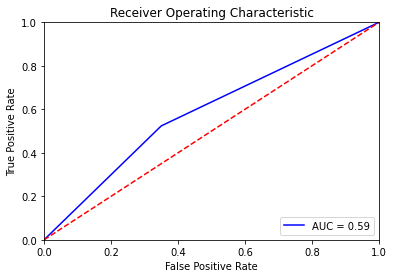

{'max_depth': 5, 'min_samples_leaf': 9}
Mejor ROC-AUC en validación cruzada: 0.600
Mejor valor del hiperparámetro: {'max_depth': 5, 'min_samples_leaf': 9}
0.43902439024390244
[[ 7 13]
 [10 11]]
Sensibilidad, Accuracy, Especifididad, f1-score 0.5238095238095238 0.43902439024390244 0.35 0.4888888888888889


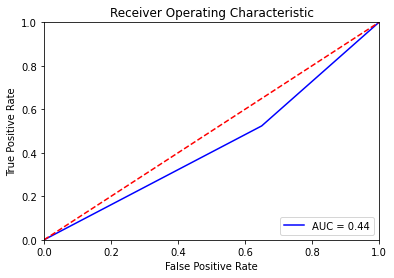

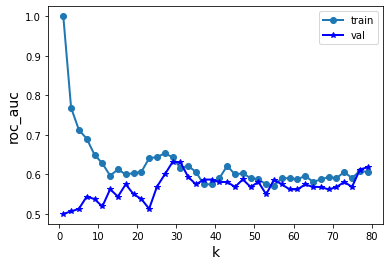

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.631
Valor correspondiente para el hiperparámetro: {'n_neighbors': 29}
0.5609756097560976
[[15  5]
 [13  8]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.38095238095238093 0.5609756097560976 0.75 0.47058823529411764


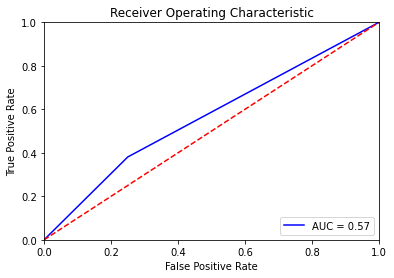

Valor correspondiente para el hiperparámetro: {'C': 0.001, 'gamma': 0.01, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.594
0.5365853658536586
[[15  5]
 [14  7]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.3333333333333333 0.5365853658536586 0.75 0.4242424242424242


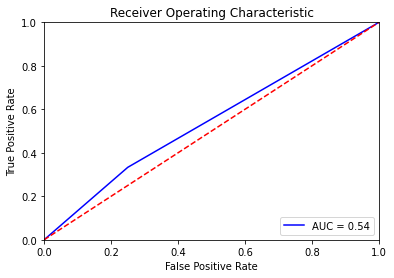

Valor correspondiente para el hiperparámetro: {'C': 0.001, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.594
0.5365853658536586
[[15  5]
 [14  7]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.3333333333333333 0.5365853658536586 0.75 0.4242424242424242


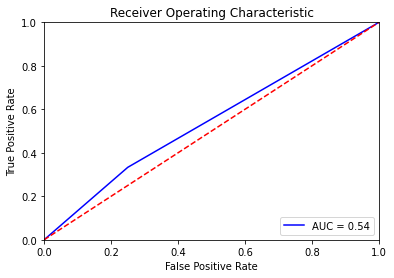

In [102]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_scaler_all2,X_test_scaler_all2,Y_train_2,Y_test_2,2)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_scaler_all2,X_test_scaler_all2,Y_train_2,Y_test_2,2)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_scaler_all2,X_test_scaler_all2,Y_train_2,Y_test_2)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_scaler_all2,X_test_scaler_all2,Y_train_2,Y_test_2,2)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_scaler_all2,X_test_scaler_all2,Y_train_2,Y_test_2,2)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(sl[4])

# ***Cuarta partición***

In [103]:
X_train_3=list_x_train[3]
Y_train_3=list_y_train[3]
X_test_3=list_x_test[3]
Y_test_3=list_y_test[3]

In [104]:
X_train_3.isna().sum()

BGVisit1                      1
HopVerbTr1TotCorr             1
HopVerbTr2TotCorr             1
HopVerbTr3TotCorr             1
HopVerbTr4TotCorr             2
HopVerbNumHits                2
HopVerbSemRelErr              2
HopVerbNumFalPosErr           2
HopVerbNumIntr                4
SymbDigWTotCorr               7
SymbDigWNumErr                7
SymbDigOTotCorr               7
SymbDigONumErr                7
TrailMakATotTime              0
TrailMakANumErr               0
TrailMakBTotTime              3
TrailMakBNumErr               3
GrPegDomHand                  1
GrPegDomTotTime               2
GrPegDomNumDrops              2
GrPegNonTotTime               4
GrPegNonNumDrops              4
BGVisit2                      6
FuncActTotTestScore           0
DukeSocIntScore               1
DukeSocSatScore               1
DukeSocTotDSSI                1
FrailtyFirstWalkTotTimeSec    2
FrailtySecWalkTotTimeSec      2
ReadCardCorrLens              0
ReadCardLowLine_20/125        0
ReadCard

In [105]:
from statistics import mode

for i in X_train_3:
  try:
    X_train_3[i].replace(np.nan, mode(X_train_3[i]), inplace=True)
    X_test_3[i].replace(np.nan, mode(X_train_3[i]), inplace=True)
  except:
    print(i)


SymbDigWTotCorr
SymbDigOTotCorr
TrailMakBTotTime
BGVisit2


Debemos imputar los valores nulos con knn_imputer:

In [106]:

# from numpy import mean
# from numpy import std
# from pandas import read_csv
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.impute import KNNImputer
# from sklearn.model_selection import cross_val_score
# from sklearn.model_selection import RepeatedStratifiedKFold
# from sklearn.pipeline import Pipeline
# from matplotlib import pyplot

# # evaluate each strategy on the dataset
# results = list()
# strategies = [str(i) for i in [1,3,5,7,9,15,18,21]]
# for s in strategies:
# 	# create the modeling pipeline
# 	pipeline = Pipeline(steps=[('i', KNNImputer(n_neighbors=int(s))), ('m', RandomForestClassifier())])
# 	# evaluate the model
# 	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)
# 	scores = cross_val_score(pipeline, X_train_3, Y_train_3, scoring='accuracy', cv=cv, n_jobs=-1)
# 	# store results
# 	results.append(scores)
# 	print('>%s %.3f (%.3f)' % (s, mean(scores), std(scores)))
# # plot model performance for comparison
# pyplot.boxplot(results, labels=strategies, showmeans=True)
# pyplot.show()

In [107]:
from numpy import isnan
from pandas import read_csv
from sklearn.impute import KNNImputer

# define imputer
imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')

imputer.fit(X_train_3)

# transform the dataset
X_train_3 = imputer.transform(X_train_3)

# print total missing
print('Missing: %d' % sum(isnan(X_train_3).flatten()))

X_test_3=imputer.transform(X_test_3)
print('Missing: %d' % sum(isnan(X_test_3).flatten()))


Missing: 0
Missing: 0


In [108]:
X_train_numerical3=X_train_3[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,19,20,21,22,23,24,25,26,27,28]]
X_train_categorical3=X_train_3[:,[17,29,30,31,32,33,34,35,36,37,38,39]]
X_test_numerical3=X_test_3[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,19,20,21,22,23,24,25,26,27,28]]
X_test_categorical3=X_test_3[:,[17,29,30,31,32,33,34,35,36,37,38,39]]



In [109]:

from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing

std_all = preprocessing.StandardScaler().fit(X_train_numerical3)
X_std_train_numerical = std_all.transform(X_train_numerical3) #Tendriamos todas las características estandarizadas
X_std_test_numerical = std_all.transform(X_test_numerical3)

In [110]:
X_train_std_all3=np.c_[X_std_train_numerical,X_train_categorical3]
X_test_std_all3=np.c_[X_std_test_numerical,X_test_categorical3]


In [111]:
X_train_std_all3.shape

(160, 40)

In [112]:
#CON MIN-MAX

scaler = preprocessing.MinMaxScaler().fit(X_train_numerical3)
X_scaler_train_numerical = scaler.transform(X_train_numerical3) 
X_scaler_test_numerical=scaler.transform(X_test_numerical3)

In [113]:
#Concatenamos para min-max

X_train_scaler_all3=np.c_[X_scaler_train_numerical,X_train_categorical3]
X_test_scaler_all3=np.c_[X_scaler_test_numerical,X_test_categorical3]


A continuación, aplicacmos los modelos:

In [114]:
# #CON VARIABLES NORMALIZADAS CON STANDARD SCALER

# r=regresion_logistica(X_train_std_all3,X_test_std_all3,Y_train_3,Y_test_3,3)
# recall_reg_std.append(r[0])
# accuracy_reg_std.append(r[1])
# precision_reg_std.append(r[2])
# f1_reg_std.append(r[3])
# roc_reg_std.append(r[4])

# a=decisionTree(X_train_std_all3,X_test_std_all3,Y_train_3,Y_test_3,3)
# recall_arbol_std.append(a[0])
# accuracy_arbol_std.append(a[1])
# precision_arbol_std.append(a[2])
# f1_arbol_std.append(a[3])
# roc_arbol_std.append(a[4])

# k=knn(X_train_std_all3,X_test_std_all3,Y_train_3,Y_test_3)
# recall_knn_std.append(k[0])
# accuracy_knn_std.append(k[1])
# precision_knn_std.append(k[2])
# f1_knn_std.append(k[3])
# roc_knn_std.append(k[4])

# s=svc(X_train_std_all3,X_test_std_all3,Y_train_3,Y_test_3,3)
# recall_svc_std.append(s[0])
# accuracy_svc_std.append(s[1])
# precision_svc_std.append(s[2])
# f1_svc_std.append(s[3])
# roc_svc_std.append(s[4])

# sl=svc_lineal(X_train_std_all3,X_test_std_all3,Y_train_3,Y_test_3,3)
# recall_svc_lin_std.append(sl[0])
# accuracy_svc_lin_std.append(sl[1])
# precision_svc_lin_std.append(sl[2])
# f1_svc_lin_std.append(sl[3])
# roc_svc_lin_std.append(s[4])


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.613
0.5609756097560976
[[13  7]
 [11 10]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.47619047619047616 0.5609756097560976 0.65 0.5263157894736842


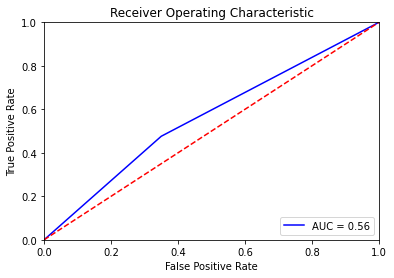

{'max_depth': 2, 'min_samples_leaf': 25}
Mejor ROC-AUC en validación cruzada: 0.632
Mejor valor del hiperparámetro: {'max_depth': 2, 'min_samples_leaf': 25}
0.4878048780487805
[[ 8 12]
 [ 9 12]]
Sensibilidad, Accuracy, Especifididad, f1-score 0.5714285714285714 0.4878048780487805 0.4 0.5333333333333333


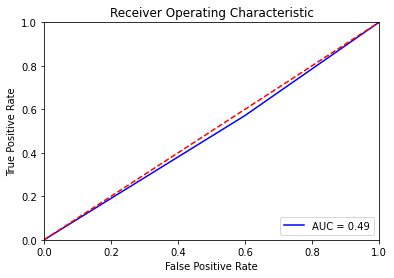

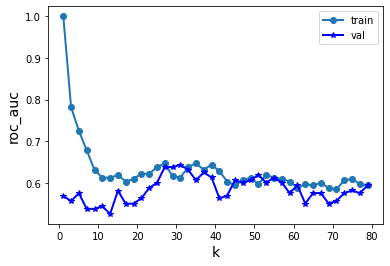

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.643
Valor correspondiente para el hiperparámetro: {'n_neighbors': 31}
0.5609756097560976
[[13  7]
 [11 10]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.47619047619047616 0.5609756097560976 0.65 0.5263157894736842


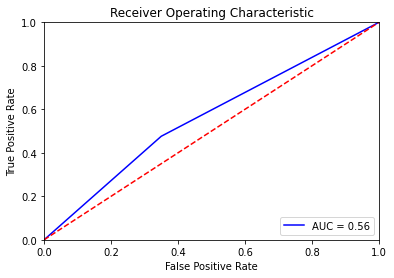

Valor correspondiente para el hiperparámetro: {'C': 50, 'gamma': 0.001, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.606
0.5365853658536586
[[11  9]
 [10 11]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.5238095238095238 0.5365853658536586 0.55 0.5365853658536585


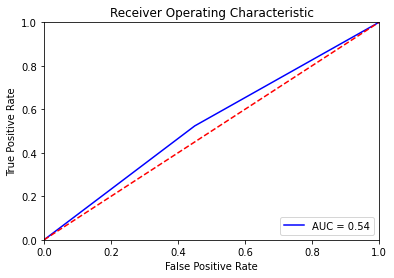

Valor correspondiente para el hiperparámetro: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.606
0.5365853658536586
[[11  9]
 [10 11]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.5238095238095238 0.5365853658536586 0.55 0.5365853658536585


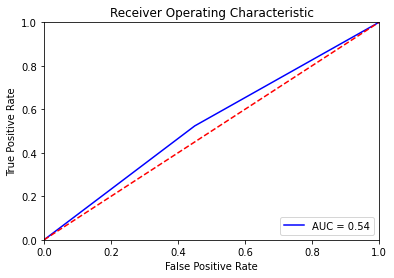

In [115]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_scaler_all3,X_test_scaler_all3,Y_train_3,Y_test_3,3)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_scaler_all3,X_test_scaler_all3,Y_train_3,Y_test_3,3)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_scaler_all3,X_test_scaler_all3,Y_train_3,Y_test_3)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_scaler_all3,X_test_scaler_all3,Y_train_3,Y_test_3,3)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_scaler_all3,X_test_scaler_all3,Y_train_3,Y_test_3,3)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(sl[4])

# ***Quinta partición***

In [116]:
X_train_4=list_x_train[4]
Y_train_4=list_y_train[4]
X_test_4=list_x_test[4]
Y_test_4=list_y_test[4]

In [117]:
X_train_4.isna().sum()

BGVisit1                      1
HopVerbTr1TotCorr             1
HopVerbTr2TotCorr             1
HopVerbTr3TotCorr             1
HopVerbTr4TotCorr             2
HopVerbNumHits                2
HopVerbSemRelErr              2
HopVerbNumFalPosErr           2
HopVerbNumIntr                4
SymbDigWTotCorr               7
SymbDigWNumErr                7
SymbDigOTotCorr               8
SymbDigONumErr                8
TrailMakATotTime              0
TrailMakANumErr               0
TrailMakBTotTime              4
TrailMakBNumErr               4
GrPegDomHand                  1
GrPegDomTotTime               2
GrPegDomNumDrops              2
GrPegNonTotTime               3
GrPegNonNumDrops              3
BGVisit2                      6
FuncActTotTestScore           0
DukeSocIntScore               1
DukeSocSatScore               1
DukeSocTotDSSI                1
FrailtyFirstWalkTotTimeSec    2
FrailtySecWalkTotTimeSec      2
ReadCardCorrLens              0
ReadCardLowLine_20/125        0
ReadCard

In [118]:
from statistics import mode

for i in X_train_4:
  try:
    X_train_4[i].replace(np.nan, mode(X_train_4[i]), inplace=True)
    X_test_4[i].replace(np.nan, mode(X_train_4[i]), inplace=True)
  except:
    print(i)


HopVerbTr1TotCorr
TrailMakATotTime
TrailMakBTotTime
BGVisit2


Debemos imputar los valores nulos con knn_imputer:

In [119]:

# from numpy import mean
# from numpy import std
# from pandas import read_csv
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.impute import KNNImputer
# from sklearn.model_selection import cross_val_score
# from sklearn.model_selection import RepeatedStratifiedKFold
# from sklearn.pipeline import Pipeline
# from matplotlib import pyplot

# # evaluate each strategy on the dataset
# results = list()
# strategies = [str(i) for i in [1,3,5,7,9,15,18,21]]
# for s in strategies:
# 	# create the modeling pipeline
# 	pipeline = Pipeline(steps=[('i', KNNImputer(n_neighbors=int(s))), ('m', RandomForestClassifier())])
# 	# evaluate the model
# 	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)
# 	scores = cross_val_score(pipeline, X_train_4, Y_train_4, scoring='accuracy', cv=cv, n_jobs=-1)
# 	# store results
# 	results.append(scores)
# 	print('>%s %.3f (%.3f)' % (s, mean(scores), std(scores)))
# # plot model performance for comparison
# pyplot.boxplot(results, labels=strategies, showmeans=True)
# pyplot.show()

In [120]:
from numpy import isnan
from pandas import read_csv
from sklearn.impute import KNNImputer

# define imputer
imputer = KNNImputer(n_neighbors=18, weights='uniform', metric='nan_euclidean')

imputer.fit(X_train_4)

# transform the dataset
X_train_4 = imputer.transform(X_train_4)

# print total missing
print('Missing: %d' % sum(isnan(X_train_4).flatten()))

X_test_4=imputer.transform(X_test_4)
print('Missing: %d' % sum(isnan(X_test_4).flatten()))


Missing: 0
Missing: 0


In [121]:
X_train_numerical4=X_train_4[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,19,20,21,22,23,24,25,26,27,28]]
X_train_categorical4=X_train_4[:,[17,29,30,31,32,33,34,35,36,37,38,39]]
X_test_numerical4=X_test_4[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,19,20,21,22,23,24,25,26,27,28]]
X_test_categorical4=X_test_4[:,[17,29,30,31,32,33,34,35,36,37,38,39]]




In [122]:

from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing

std_all = preprocessing.StandardScaler().fit(X_train_numerical4)
X_std_train_numerical = std_all.transform(X_train_numerical4) #Tendriamos todas las características estandarizadas
X_std_test_numerical = std_all.transform(X_test_numerical4)

In [123]:
X_train_std_all4=np.c_[X_std_train_numerical,X_train_categorical4]
X_test_std_all4=np.c_[X_std_test_numerical,X_test_categorical4]


In [124]:
X_train_std_all4.shape

(160, 40)

In [125]:
#CON MIN-MAX

scaler = preprocessing.MinMaxScaler().fit(X_train_numerical4)
X_scaler_train_numerical = scaler.transform(X_train_numerical4) 
X_scaler_test_numerical=scaler.transform(X_test_numerical4)

In [126]:
#Concatenamos para min-max

X_train_scaler_all4=np.c_[X_scaler_train_numerical,X_train_categorical4]
X_test_scaler_all4=np.c_[X_scaler_test_numerical,X_test_categorical4]


A continuación, aplicacmos los modelos:

In [127]:
# #CON VARIABLES NORMALIZADAS CON STANDARD SCALER

# r=regresion_logistica(X_train_std_all4,X_test_std_all4,Y_train_4,Y_test_4,4)
# recall_reg_std.append(r[0])
# accuracy_reg_std.append(r[1])
# precision_reg_std.append(r[2])
# f1_reg_std.append(r[3])
# roc_reg_std.append(r[4])

# a=decisionTree(X_train_std_all4,X_test_std_all4,Y_train_4,Y_test_4,4)
# recall_arbol_std.append(a[0])
# accuracy_arbol_std.append(a[1])
# precision_arbol_std.append(a[2])
# f1_arbol_std.append(a[3])
# roc_arbol_std.append(a[4])

# k=knn(X_train_std_all4,X_test_std_all4,Y_train_4,Y_test_4)
# recall_knn_std.append(k[0])
# accuracy_knn_std.append(k[1])
# precision_knn_std.append(k[2])
# f1_knn_std.append(k[3])
# roc_knn_std.append(k[4])

# s=svc(X_train_std_all4,X_test_std_all4,Y_train_4,Y_test_4,4)
# recall_svc_std.append(s[0])
# accuracy_svc_std.append(s[1])
# precision_svc_std.append(s[2])
# f1_svc_std.append(s[3])
# roc_svc_std.append(s[4])

# sl=svc_lineal(X_train_std_all4,X_test_std_all4,Y_train_4,Y_test_4,4)
# recall_svc_lin_std.append(sl[0])
# accuracy_svc_lin_std.append(sl[1])
# precision_svc_lin_std.append(sl[2])
# f1_svc_lin_std.append(sl[3])
# roc_svc_lin_std.append(s[4])

Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.606
0.6097560975609756
[[12  8]
 [ 8 13]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.6190476190476191 0.6097560975609756 0.6 0.6190476190476191


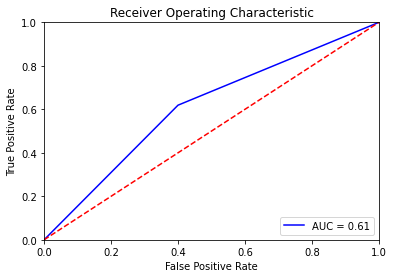

{'max_depth': 1, 'min_samples_leaf': 32}
Mejor ROC-AUC en validación cruzada: 0.600
Mejor valor del hiperparámetro: {'max_depth': 1, 'min_samples_leaf': 32}
0.5853658536585366
[[13  7]
 [10 11]]
Sensibilidad, Accuracy, Especifididad, f1-score 0.5238095238095238 0.5853658536585366 0.65 0.5641025641025642


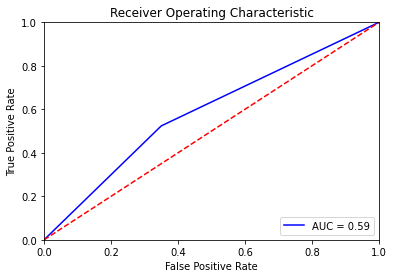

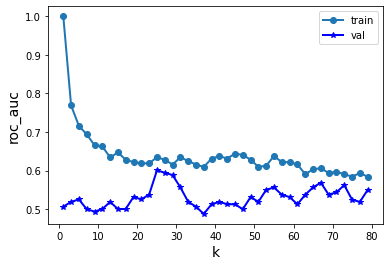

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.601
Valor correspondiente para el hiperparámetro: {'n_neighbors': 25}
0.6097560975609756
[[11  9]
 [ 7 14]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.6666666666666666 0.6097560975609756 0.55 0.6363636363636365


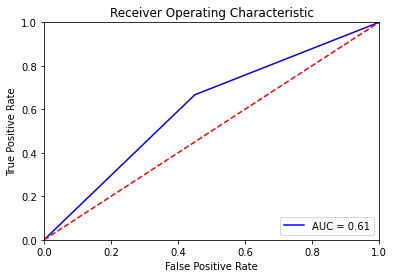

Valor correspondiente para el hiperparámetro: {'C': 0.001, 'gamma': 0.01, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.613
0.6585365853658537
[[11  9]
 [ 5 16]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.7619047619047619 0.6585365853658537 0.55 0.6956521739130435


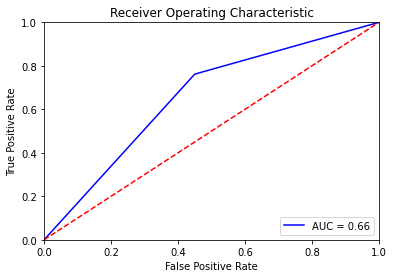

Valor correspondiente para el hiperparámetro: {'C': 0.001, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.606
0.6585365853658537
[[11  9]
 [ 5 16]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.7619047619047619 0.6585365853658537 0.55 0.6956521739130435


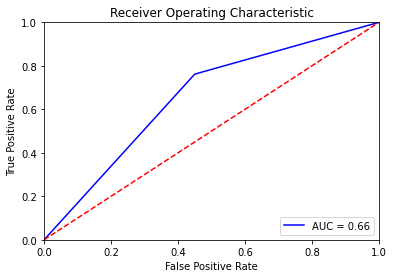

In [128]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_scaler_all4,X_test_scaler_all4,Y_train_4,Y_test_4,4)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_scaler_all4,X_test_scaler_all4,Y_train_4,Y_test_4,4)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_scaler_all4,X_test_scaler_all4,Y_train_4,Y_test_4)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_scaler_all4,X_test_scaler_all4,Y_train_4,Y_test_4,4)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_scaler_all4,X_test_scaler_all4,Y_train_4,Y_test_4,4)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(sl[4])


In [ ]:
def plot_mean_std_metric(df_metrics, lims, metric_name='accuracy', title_figure='mean_std_plot', flag_save_figure=False):

    fig, ax = plt.subplots(1, 1, figsize=(6.5, 4.5))

    ax.plot(df_metrics['mean'], df_metrics['model'], ls='', marker='o', color='#8000FF')

    ax.hlines(df_metrics['model'], df_metrics['mean'] - df_metrics['std'], df_metrics['mean'] + df_metrics['std'],
              label='', lw=2, color='#8000FF', ls='-')

    ax.grid(axis='x', ls='-')
    ax.grid(axis='y', ls=':', lw=1, alpha=0.5)
    ax.set(
        xlabel=metric_name,
        xlim=lims,
        title=title_figure
    )

    fig.tight_layout()

    if flag_save_figure:
        fig.savefig(title_figure, dpi=300, bbox_inches='tight')
    else:
        plt.show()

In [ ]:

model_scaler=['LASSO', 'DT', 'KNN','Radial SVM', 'Linear SVM']
mean_scaler=[np.mean(accuracy_reg_scaler), np.mean(accuracy_arbol_scaler),np.mean(accuracy_knn_scaler),np.mean(accuracy_svc_scaler),np.mean(accuracy_svc_lin_scaler)]
std_scaler=[np.std(accuracy_reg_scaler), np.std(accuracy_arbol_scaler),np.std(accuracy_knn_scaler),np.std(accuracy_svc_scaler),np.std(accuracy_svc_lin_scaler)]

df_acc_scaler= pd.DataFrame()
df_acc_scaler['model'] = None
df_acc_scaler['mean'] = None
df_acc_scaler['std'] = None


df_acc_scaler['model'] = model_scaler
df_acc_scaler['mean'] = mean_scaler
df_acc_scaler['std'] = std_scaler


In [ ]:
df_acc_scaler

,model,mean,std
0,LASSO,0.595122,0.024873
1,DT,0.512195,0.048780
2,KNN,0.565854,0.032357
3,Radial SVM,0.595122,0.036504
4,Linear SVM,0.585366,0.051161


In [ ]:
model2_scaler=['LASSO', 'DT', 'KNN','Radial SVM', 'Linear SVM']
mean2_scaler=[np.mean(roc_reg_scaler), np.mean(roc_arbol_scaler),np.mean(roc_knn_scaler),np.mean(roc_svc_scaler),np.mean(roc_svc_lin_scaler)]
std2_scaler=[np.std(roc_reg_scaler), np.std(roc_arbol_scaler),np.std(roc_knn_scaler),np.std(roc_svc_scaler),np.std(roc_svc_lin_scaler)]

df_roc_scaler= pd.DataFrame()
df_roc_scaler['model'] = None
df_roc_scaler['mean'] = None
df_roc_scaler['std'] = None


df_roc_scaler['model'] = model2_scaler
df_roc_scaler['mean'] = mean2_scaler
df_roc_scaler['std'] = std2_scaler


In [ ]:
df_roc_scaler

,model,mean,std
0,LASSO,0.596190,0.023683
1,DT,0.512619,0.050376
2,KNN,0.569286,0.029608
3,Radial SVM,0.593333,0.034590
4,Linear SVM,0.586190,0.049759


In [ ]:
#PINTAMOS GRÁFICAS PARA VARIABLES NORMALIZADAS CON STANDARD SCALER PARA ACCURACY Y ROC

plot_mean_std_metric(df_acc_scaler, lims=(0, 0.9), metric_name='',title_figure='', flag_save_figure=True)
# plt.rcParams["figure.figsize"] = (4, 3)
plt.savefig("{}.pdf".format("TotTestScores_acc"))
plt.close()

# plot_mean_std_metric(df_roc_scaler, lims=(0, 0.9), metric_name='',title_figure='', flag_save_figure=True)
# # plt.rcParams["figure.figsize"] = (4, 3)
# plt.savefig("{}.pdf".format("Att_auc"))
# plt.close()

In [ ]:
#RECALL
model_scaler3=['LASSO', 'DT', 'KNN','Radial SVM', 'Linear SVM']
mean_scaler3=[np.mean(recall_reg_scaler), np.mean(recall_arbol_scaler),np.mean(recall_knn_scaler),np.mean(recall_svc_scaler),np.mean(recall_svc_lin_scaler)]
std_scaler3=[np.std(recall_reg_scaler), np.std(recall_arbol_scaler),np.std(recall_knn_scaler),np.std(recall_svc_scaler),np.std(recall_svc_lin_scaler)]

df_recall_scaler= pd.DataFrame()
df_recall_scaler['model'] = None
df_recall_scaler['mean'] = None
df_recall_scaler['std'] = None


df_recall_scaler['model'] = model_scaler3
df_recall_scaler['mean'] = mean_scaler3
df_recall_scaler['std'] = std_scaler3

In [ ]:
df_recall_scaler

,model,mean,std
0,LASSO,0.552381,0.077372
1,DT,0.495238,0.057143
2,KNN,0.428571,0.153567
3,Radial SVM,0.666667,0.131277
4,Linear SVM,0.552381,0.136692


In [ ]:
model_scaler4=['LASSO', 'DT', 'KNN','Radial SVM', 'Linear SVM']
mean_scaler4=[np.mean(precision_reg_scaler), np.mean(precision_arbol_scaler),np.mean(precision_knn_scaler),np.mean(precision_svc_scaler),np.mean(precision_svc_lin_scaler)]
std_scaler4=[np.std(precision_reg_scaler), np.std(precision_arbol_scaler),np.std(precision_knn_scaler),np.std(precision_svc_scaler),np.std(precision_svc_lin_scaler)]

df_especificidad_scaler= pd.DataFrame()
df_especificidad_scaler['model'] = None
df_especificidad_scaler['mean'] = None
df_especificidad_scaler['std'] = None


df_especificidad_scaler['model'] = model_scaler4
df_especificidad_scaler['mean'] = mean_scaler4
df_especificidad_scaler['std'] = std_scaler4

In [ ]:
df_especificidad_scaler


,model,mean,std
0,LASSO,0.64,0.037417
1,DT,0.53,0.128841
2,KNN,0.71,0.101980
3,Radial SVM,0.52,0.081240
4,Linear SVM,0.62,0.087178


# ***VALIDACIÓN CRUZADA Y FEATURE SELECTION***

# ***Boostrap***

In [ ]:
data2=data.rename(columns={"BCaseControlStatus":"label"})

In [ ]:
def compute_boostrap(df_data, v_column_names, label_name, generic_name, percentage_resampling=0.8, repetitions=30, flag_save_importance=False):

    list_variable_importance = []

    for i in range(len(v_column_names)):
        list_variable_importance.append(bootstrap_ci(df_data, v_column_names[i], (1 / percentage_resampling),
                                                     label_name, repetitions=repetitions))
    m_variable_importance = np.array(list_variable_importance)
    m_variable_importance = m_variable_importance.reshape(m_variable_importance.shape[0], 2)

    m_var_importance_bootstrap = np.c_[v_column_names, m_variable_importance]
    df_var_importance_bootstrap = pd.DataFrame(m_var_importance_bootstrap, columns=['var_name', 'ci_lower', 'ci_upper'])

    if flag_save_importance:
        df_var_importance_bootstrap.to_csv('df_var_importance_boostrap_{}.csv'.format(generic_name))


def bootstrap_ci(df_data, variable, div, classes, repetitions=3000, alpha=0.05, random_state=np.arange(1, 30000, 10)):
    """
    Compute bootstrap method with confidence interval
    :param df_data: a dataframe that includes observations of the two sample (df models)
    :param variable: a column_name of the column that includes observations (sens, espec,acc,precision,auc)
    :param div:
    :param classes: a column_name of the column that includes classes (This column should contain two different group names: dt and lasso, dt and svm, svm and lasso)
    :param repetitions: the number of times you want the bootstrapping to repeat. Default is 1000.
    :param alpha: likelihood that the true population parameter lies outside the confidence interval. Default is 0.05.
    :param random_state: enable users to set their own random_state, default is None
    :return:
    """
    df = df_data[[variable, classes]]
    bootstrap_sample_size = len(df)

    proportion_diffs = []
    print("sample size: ", int(bootstrap_sample_size/div))

    for i in range(repetitions):

        bootstrap_sample = df.sample(n=int(bootstrap_sample_size/div), replace=False, random_state=random_state[i])

        print(bootstrap_sample)

        label_0 = (bootstrap_sample[(bootstrap_sample[classes] == 0)])
        mean_label_0 = label_0[variable].mean()
        label_1 = (bootstrap_sample[(bootstrap_sample[classes] == 1)])
        mean_label_1 = label_1[variable].mean()

        proportion_diff = mean_label_1 - mean_label_0
        proportion_diffs.append(proportion_diff)

        df_proportions = pd.DataFrame(proportion_diffs)

    out = []

    for tt in range(len(df_proportions.columns)):

        left = np.percentile(df_proportions[tt], alpha / 2 * 100)
        right = np.percentile(df_proportions[tt], 100 - alpha / 2 * 100)
        out.append([round(left, 2), round(right, 2)])

    return out

In [ ]:
compute_boostrap(data2,X.columns, 'label', 'importance_bootstrap', flag_save_importance=True)




Se han truncado las últimas 5000 líneas del flujo de salida.
189               1.0      0
119               0.0      1
24                1.0      1

[160 rows x 2 columns]
     ReadCardCorrLens  label
96                1.0      0
63                0.0      1
169               1.0      0
197               1.0      0
68                1.0      0
..                ...    ...
111               0.0      1
95                1.0      0
21                1.0      0
31                0.0      1
94                1.0      1

[160 rows x 2 columns]
     ReadCardCorrLens  label
68                1.0      0
121               1.0      0
90                1.0      0
7                 1.0      1
120               1.0      1
..                ...    ...
141               0.0      1
38                1.0      1
136               1.0      0
109               1.0      0
117               1.0      1

[160 rows x 2 columns]
     ReadCardCorrLens  label
104               1.0      0
126               1.0     

# ***PRIMERA PARTICIÓN***

In [ ]:
X_train_numerical0=X_train_0[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20, 22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,38]]
X_train_categorical0=X_train_0[:,[21,37,39,40,41,42,43,44,45,46,47,48,49,50]]
X_test_numerical0=X_test_0[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20, 22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,38]]
X_test_categorical0=X_test_0[:,[21,37,39,40,41,42,43,44,45,46,47,48,49,50]]


In [ ]:
#CON MIN-MAX

scaler = preprocessing.MinMaxScaler().fit(X_train_numerical0)
X_scaler_train_numerical = scaler.transform(X_train_numerical0) 
X_scaler_test_numerical=scaler.transform(X_test_numerical0)

In [ ]:
#Concatenamos para min-max

X_train_scaler_all0=np.c_[X_scaler_train_numerical,X_train_categorical0]
X_test_scaler_all0=np.c_[X_scaler_test_numerical,X_test_categorical0]


In [ ]:
X_train_scaler_all0.shape

(160, 51)

A continuación, hacemos selección de características:

# ***Métodos *embedded****

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

# Creamos un bosque aleatorio de árboles de clasificación
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

# Como en árboles, no es necesario que las características estén normalizadas
# Trabajamos, por tanto, con X_train y X_test (no con las versiones estandarizadas)

forest.fit(X_train_scaler_all0, Y_train_0)
importances = forest.feature_importances_
# std = np.std([tree.feature_importances_ for tree in forest.estimators_],
#              axis=0)
# indices = np.argsort(importances)[::-1]

# # Muestra el ranking en el ordenamiento
# print("Ranking de Características:")

# for f in range(X_train_scaler_all0.shape[1]):
#   print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# # Plot the impurity-based feature importances of the forest
# plt.figure()
# plt.title("Importancia de las características")
# plt.bar(range(X_train_scaler_all0.shape[1]), importances[indices],
#         color="r", align="center")
# plt.xticks(range(X_train_scaler_all0.shape[1]), indices)
# plt.xlim([-1, 20])
# plt.show()

In [ ]:
lista_extra=[ [] for i in range(X.shape[1])]


In [ ]:
contador=0
for i in importances:
  lista_extra[contador].append(i)
  contador+=1

CARACTERÍSTICAS MÁS IMPORTANTES:
* MoCALang2	
* MoCADelRec

# ***Método filter***

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif
from functools import partial

bestfeatures_Chi2 = SelectKBest(score_func=partial(mutual_info_classif,random_state=0), k='all')
fit_Chi2 = bestfeatures_Chi2.fit(X_train_scaler_all0, Y_train_0)
# fit_Chi2 = pd.Series(fit_Chi2.scores_)
# fit_Chi2.sort_values(ascending=False)

# fit_Chi2.sort_values(ascending=False).plot.bar(figsize=(20, 5))

# # gráfico de barras utilizando matplotlib
# df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2.scores_})
# ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0, figsize=(5,5))
# # df, ax = plt.subplots(figsize=(50, 8))
# plt.title("Chi2 considerando subconjunto X train")

In [ ]:
lista_chi=[ [] for i in range(X.shape[1])]


In [ ]:
contador=0
for i in fit_Chi2.scores_:
  lista_chi[contador].append(i)
  contador+=1

In [ ]:
lista_chi

[[0.0],
 [0.0],
 [0.015236897292926654],
 [0.0],
 [0.0],
 [0.06262855077833018],
 [0.0],
 [0.0334119514054807],
 [0.0],
 [0.001873819398598986],
 [0.0],
 [0.042416731347760805],
 [0.043599697686977024],
 [0.0],
 [0.0],
 [0.03032437925540865],
 [0.023087146646900703],
 [0.04335235822088768],
 [0.0],
 [0.0],
 [0.0],
 [0.0],
 [0.047816869404148754],
 [0.0],
 [0.0],
 [0.07458091877389661],
 [0.0],
 [0.0],
 [0.006996249052278358],
 [0.0],
 [0.0121600089035383],
 [0.018273600173379423],
 [0.047439677151956516],
 [0.09596216161194104],
 [0.0],
 [0.0008889311251074616],
 [0.014363673294702561],
 [0.03957649611322411],
 [0.0],
 [0.0],
 [0.04249888877366814],
 [0.0],
 [0.0]]

# ***RANDOM FOREST***

In [ ]:

from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier


In [ ]:
feat_labels=X.columns

In [ ]:
# Create a random forest classifier
clf = RandomForestClassifier(n_estimators=250, random_state=0, n_jobs=-1)

# Train the classifier
clf.fit(X_train_scaler_all0, Y_train_0)

# Print the name and gini importance of each feature
# for feature in zip(feat_labels, clf.feature_importances_):
#     print(feature)

importances = clf.feature_importances_
# std = np.std([tree.feature_importances_ for tree in clf.estimators_],
#              axis=0)
# indices = np.argsort(importances)[::-1]
# # Muestra el ranking en el ordenamiento
# print("Ranking de Características:")

# for f in range(X_train_scaler_all0.shape[1]):
#   print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# # Plot the impurity-based feature importances of the forest
# plt.figure()
# plt.title("Importancia de las características")
# plt.bar(range(X_train_scaler_all0.shape[1]), importances[indices],
#         color="r", align="center")
# plt.xticks(range(X_train_scaler_all0.shape[1]), indices)
# plt.xlim([-1, 20])
# plt.show()


In [ ]:
lista_RF=[ [] for i in range(X.shape[1])]


In [ ]:
contador=0
for i in importances:
  lista_RF[contador].append(i)
  contador+=1

In [ ]:
lista_RF

[[0.04875243838614426],
 [0.03942349893432223],
 [0.026186385192565845],
 [0.02933195363941707],
 [0.02660394444807834],
 [0.014404917977284812],
 [0.01860419419732253],
 [0.0030153000478685406],
 [0.02434488341051287],
 [0.03844351706694019],
 [0.07319280368743371],
 [0.027330247048073294],
 [0.04891035324641956],
 [0.016075027483083256],
 [0.04734619196433548],
 [0.005467921575190315],
 [0.06150515199903563],
 [0.007156663668384785],
 [0.06428670717966674],
 [0.015163111112443872],
 [0.06852728761177394],
 [0.015349422769249341],
 [0.0648706453945813],
 [0.018420826189998185],
 [0.028283852665004543],
 [0.027421965780807148],
 [0.03169547479207088],
 [0.016957253536765773],
 [0.014977102348756773],
 [0.017565537083181027],
 [0.0034222598853203127],
 [0.015116813346285627],
 [0.0009692950911604478],
 [0.0],
 [0.0023267105412043453],
 [0.007416714062221945],
 [0.0002554395540669141],
 [0.011292594785525275],
 [0.0079454744293382],
 [0.008267481157391654],
 [0.0018246241164845596],
 [0.

# ***Segunda partición***

In [ ]:
X_train_numerical1=X_train_1[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20, 22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,38]]
X_train_categorical1=X_train_1[:,[21,37,39,40,41,42,43,44,45,46,47,48,49,50]]
X_test_numerical1=X_test_1[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20, 22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,38]]
X_test_categorical1=X_test_1[:,[21,37,39,40,41,42,43,44,45,46,47,48,49,50]]



In [ ]:
#CON MIN-MAX

scaler = preprocessing.MinMaxScaler().fit(X_train_numerical1)
X_scaler_train_numerical = scaler.transform(X_train_numerical1) 
X_scaler_test_numerical=scaler.transform(X_test_numerical1)

In [ ]:
#Concatenamos para min-max

X_train_scaler_all1=np.c_[X_scaler_train_numerical,X_train_categorical1]
X_test_scaler_all1=np.c_[X_scaler_test_numerical,X_test_categorical1]


# ***Métodos *embedded****

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

# Creamos un bosque aleatorio de árboles de clasificación
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

# Como en árboles, no es necesario que las características estén normalizadas
# Trabajamos, por tanto, con X_train y X_test (no con las versiones estandarizadas)

forest.fit(X_train_scaler_all1, Y_train_1)
importances = forest.feature_importances_
# std = np.std([tree.feature_importances_ for tree in forest.estimators_],
#              axis=0)
# indices = np.argsort(importances)[::-1]

# # Muestra el ranking en el ordenamiento
# print("Ranking de Características:")

# for f in range(X_train_scaler_all1.shape[1]):
#   print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# # Plot the impurity-based feature importances of the forest
# plt.figure()
# plt.title("Importancia de las características")
# plt.bar(range(X_train_scaler_all1.shape[1]), importances[indices],
#         color="r", align="center")
# plt.xticks(range(X_train_scaler_all1.shape[1]), indices)
# plt.xlim([-1,20])
# plt.show()

In [ ]:
contador=0
for i in importances:
  lista_extra[contador].append(i)
  contador+=1

CARACTERÍSTICAS MÁS IMPORTANTES:
- BBGAttitudeScaleCompEnroll	
- HighBGLevTakeAction	
- LowBGLevTakeAction	
- PtCurrA1cGoal

# ***Método filter***

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif

bestfeatures_Chi2 = SelectKBest(score_func=partial(mutual_info_classif,random_state=1), k='all')
fit_Chi2 = bestfeatures_Chi2.fit(X_train_scaler_all1, Y_train_1)
# fit_Chi2 = pd.Series(fit_Chi2.scores_)
# fit_Chi2.sort_values(ascending=False)

# fit_Chi2.sort_values(ascending=False).plot.bar(figsize=(20, 5))

# # gráfico de barras utilizando matplotlib
# df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2.scores_})
# ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0, figsize=(5,5))
# # df, ax = plt.subplots(figsize=(50, 8))
# plt.title("Chi2 considerando subconjunto X train")

In [ ]:
contador=0
for i in fit_Chi2.scores_:
  lista_chi[contador].append(i)
  contador+=1

# ***RANDOM FOREST***

In [ ]:

from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier


In [ ]:
feat_labels=X.columns

In [ ]:
# Create a random forest classifier
clf = RandomForestClassifier(n_estimators=250, random_state=0, n_jobs=-1)

# Train the classifier
clf.fit(X_train_scaler_all1, Y_train_1)

# # Print the name and gini importance of each feature
# for feature in zip(feat_labels, clf.feature_importances_):
#     print(feature)

importances = clf.feature_importances_
# std = np.std([tree.feature_importances_ for tree in clf.estimators_],
#              axis=0)
# indices = np.argsort(importances)[::-1]
# # Muestra el ranking en el ordenamiento
# print("Ranking de Características:")

# for f in range(X_train_scaler_all1.shape[1]):
#   print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# # Plot the impurity-based feature importances of the forest
# plt.figure()
# plt.title("Importancia de las características")
# plt.bar(range(X_train_scaler_all1.shape[1]), importances[indices],
#         color="r", align="center")
# plt.xticks(range(X_train_scaler_all1.shape[1]), indices)
# plt.xlim([-1, 20])
# plt.show()


In [ ]:
contador=0
for i in importances:
  lista_RF[contador].append(i)
  contador+=1

# ***Tercera partición***

In [ ]:
X_train_numerical2=X_train_2[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20, 22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,38]]
X_train_categorical2=X_train_2[:,[21,37,39,40,41,42,43,44,45,46,47,48,49,50]]
X_test_numerical2=X_test_2[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20, 22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,38]]
X_test_categorical2=X_test_2[:,[21,37,39,40,41,42,43,44,45,46,47,48,49,50]]




In [ ]:
#CON MIN-MAX

scaler = preprocessing.MinMaxScaler().fit(X_train_numerical2)
X_scaler_train_numerical = scaler.transform(X_train_numerical2) 
X_scaler_test_numerical=scaler.transform(X_test_numerical2)

In [ ]:
#Concatenamos para min-max

X_train_scaler_all2=np.c_[X_scaler_train_numerical,X_train_categorical2]
X_test_scaler_all2=np.c_[X_scaler_test_numerical,X_test_categorical2]


# ***Métodos *embedded****

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

# Creamos un bosque aleatorio de árboles de clasificación
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

# Como en árboles, no es necesario que las características estén normalizadas
# Trabajamos, por tanto, con X_train y X_test (no con las versiones estandarizadas)

forest.fit(X_train_scaler_all2, Y_train_2)
importances = forest.feature_importances_
# std = np.std([tree.feature_importances_ for tree in forest.estimators_],
#              axis=0)
# indices = np.argsort(importances)[::-1]

# # Muestra el ranking en el ordenamiento
# print("Ranking de Características:")

# for f in range(X_train_scaler_all2.shape[1]):
#   print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# # Plot the impurity-based feature importances of the forest
# plt.figure()
# plt.title("Importancia de las características")
# plt.bar(range(X_train_scaler_all2.shape[1]), importances[indices],
#         color="r", align="center")
# plt.xticks(range(X_train_scaler_all2.shape[1]), indices)
# plt.xlim([-1,20])
# plt.show()

In [ ]:
contador=0
for i in importances:
  lista_extra[contador].append(i)
  contador+=1

# ***Método filter***

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif

bestfeatures_Chi2 = SelectKBest(score_func=partial(mutual_info_classif,random_state=2), k='all')
fit_Chi2 = bestfeatures_Chi2.fit(X_train_scaler_all2, Y_train_2)
# fit_Chi2 = pd.Series(fit_Chi2.scores_)
# fit_Chi2.sort_values(ascending=False)

# fit_Chi2.sort_values(ascending=False).plot.bar(figsize=(20, 5))

# # gráfico de barras utilizando matplotlib
# df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2.scores_})
# ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0, figsize=(5,5))
# # df, ax = plt.subplots(figsize=(50, 8))
# plt.title("Chi2 considerando subconjunto X train")

In [ ]:
contador=0
for i in fit_Chi2.scores_:
  lista_chi[contador].append(i)
  contador+=1

# ***RANDOM FOREST***

In [ ]:

from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier


In [ ]:
feat_labels=X.columns

In [ ]:
# Create a random forest classifier
clf = RandomForestClassifier(n_estimators=250, random_state=0, n_jobs=-1)

# Train the classifier
clf.fit(X_train_scaler_all2, Y_train_2)

# # Print the name and gini importance of each feature
# for feature in zip(feat_labels, clf.feature_importances_):
#     print(feature)

importances = clf.feature_importances_
# std = np.std([tree.feature_importances_ for tree in clf.estimators_],
#              axis=0)
# indices = np.argsort(importances)[::-1]
# # Muestra el ranking en el ordenamiento
# print("Ranking de Características:")

# for f in range(X_train_scaler_all2.shape[1]):
#   print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# # Plot the impurity-based feature importances of the forest
# plt.figure()
# plt.title("Importancia de las características")
# plt.bar(range(X_train_scaler_all2.shape[1]), importances[indices],
#         color="r", align="center")
# plt.xticks(range(X_train_scaler_all2.shape[1]), indices)
# plt.xlim([-1, 20])
# plt.show()


In [ ]:
contador=0
for i in importances:
  lista_RF[contador].append(i)
  contador+=1

# ***Cuarta partición***

In [ ]:
X.columns[25]

'DukeSocIntScore'

In [ ]:
X_train_numerical3=X_train_3[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20, 22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,38]]
X_train_categorical3=X_train_3[:,[21,37,39,40,41,42,43,44,45,46,47,48,49,50]]
X_test_numerical3=X_test_3[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20, 22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,38]]
X_test_categorical3=X_test_3[:,[21,37,39,40,41,42,43,44,45,46,47,48,49,50]]



In [ ]:

#CON MIN-MAX

scaler = preprocessing.MinMaxScaler().fit(X_train_numerical3)
X_scaler_train_numerical = scaler.transform(X_train_numerical3) 
X_scaler_test_numerical=scaler.transform(X_test_numerical3)

In [ ]:
#Concatenamos para min-max

X_train_scaler_all3=np.c_[X_scaler_train_numerical,X_train_categorical3]
X_test_scaler_all3=np.c_[X_scaler_test_numerical,X_test_categorical3]


# ***Métodos *embedded****

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

# Creamos un bosque aleatorio de árboles de clasificación
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

# Como en árboles, no es necesario que las características estén normalizadas
# Trabajamos, por tanto, con X_train y X_test (no con las versiones estandarizadas)

forest.fit(X_train_scaler_all3, Y_train_3)
importances = forest.feature_importances_
# std = np.std([tree.feature_importances_ for tree in forest.estimators_],
#              axis=0)
# indices = np.argsort(importances)[::-1]

# # Muestra el ranking en el ordenamiento
# print("Ranking de Características:")

# for f in range(X_train_scaler_all3.shape[1]):
#   print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# # Plot the impurity-based feature importances of the forest
# plt.figure()
# plt.title("Importancia de las características")
# plt.bar(range(X_train_scaler_all3.shape[1]), importances[indices],
#         color="r", align="center")
# plt.xticks(range(X_train_scaler_all3.shape[1]), indices)
# plt.xlim([-1, 20])
# plt.show()

In [ ]:
contador=0
for i in importances:
  lista_extra[contador].append(i)
  contador+=1

# ***Método filter***

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif

bestfeatures_Chi2 = SelectKBest(score_func=partial(mutual_info_classif,random_state=3), k='all')
fit_Chi2 = bestfeatures_Chi2.fit(X_train_scaler_all3, Y_train_3)
# fit_Chi2 = pd.Series(fit_Chi2.scores_)
# fit_Chi2.sort_values(ascending=False)

# fit_Chi2.sort_values(ascending=False).plot.bar(figsize=(20
#                                                         , 5))

# # gráfico de barras utilizando matplotlib
# df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2.scores_})
# ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0, figsize=(5,5))
# # df, ax = plt.subplots(figsize=(50, 8))
# plt.title("Chi2 considerando subconjunto X train")

In [ ]:
contador=0
for i in fit_Chi2.scores_:
  lista_chi[contador].append(i)
  contador+=1

# ***RANDOM FOREST***

In [ ]:

from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier


In [ ]:
feat_labels=X.columns

In [ ]:
# Create a random forest classifier
clf = RandomForestClassifier(n_estimators=250, random_state=0, n_jobs=-1)

# Train the classifier
clf.fit(X_train_scaler_all3, Y_train_3)

# Print the name and gini importance of each feature
# for feature in zip(feat_labels, clf.feature_importances_):
#     print(feature)

importances = clf.feature_importances_
# std = np.std([tree.feature_importances_ for tree in clf.estimators_],
#              axis=0)
# indices = np.argsort(importances)[::-1]
# # Muestra el ranking en el ordenamiento
# print("Ranking de Características:")

# for f in range(X_train_scaler_all3.shape[1]):
#   print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# # Plot the impurity-based feature importances of the forest
# plt.figure()
# plt.title("Importancia de las características")
# plt.bar(range(X_train_scaler_all3.shape[1]), importances[indices],
#         color="r",  align="center")
# plt.xticks(range(X_train_scaler_all3.shape[1]), indices)
# plt.xlim([-1, 20])
# plt.show()


In [ ]:
contador=0
for i in importances:
  lista_RF[contador].append(i)
  contador+=1

# ***Quinta partición***

In [ ]:
X_train_numerical4=X_train_4[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20, 22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,38]]
X_train_categorical4=X_train_4[:,[21,37,39,40,41,42,43,44,45,46,47,48,49,50]]
X_test_numerical4=X_test_4[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20, 22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,38]]
X_test_categorical4=X_test_4[:,[21,37,39,40,41,42,43,44,45,46,47,48,49,50]]



In [ ]:
#CON MIN-MAX

scaler = preprocessing.MinMaxScaler().fit(X_train_numerical4)
X_scaler_train_numerical = scaler.transform(X_train_numerical4) 
X_scaler_test_numerical=scaler.transform(X_test_numerical4)

In [ ]:
#Concatenamos para min-max

X_train_scaler_all4=np.c_[X_scaler_train_numerical,X_train_categorical4]
X_test_scaler_all4=np.c_[X_scaler_test_numerical,X_test_categorical4]


# ***Métodos *embedded****

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

# Creamos un bosque aleatorio de árboles de clasificación
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

# Como en árboles, no es necesario que las características estén normalizadas
# Trabajamos, por tanto, con X_train y X_test (no con las versiones estandarizadas)

forest.fit(X_train_scaler_all4, Y_train_4)
importances = forest.feature_importances_
# std = np.std([tree.feature_importances_ for tree in forest.estimators_],
#              axis=0)
# indices = np.argsort(importances)[::-1]

# # Muestra el ranking en el ordenamiento
# print("Ranking de Características:")

# for f in range(X_train_scaler_all4.shape[1]):
#   print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# # Plot the impurity-based feature importances of the forest
# plt.figure()
# plt.title("Importancia de las características")
# plt.bar(range(X_train_scaler_all4.shape[1]), importances[indices],
#         color="r", align="center")
# plt.xticks(range(X_train_scaler_all4.shape[1]), indices)
# plt.xlim([-1, 20])
# plt.show()

In [ ]:
contador=0
for i in importances:
  lista_extra[contador].append(i)
  contador+=1

In [ ]:
for i in range(len(lista_extra)):
  lista_extra[i]=np.mean(lista_extra[i])

In [ ]:
lista_extra

[0.028902538602768774,
 0.03399557488183359,
 0.028856155791525055,
 0.028394256720492096,
 0.025788285174017177,
 0.023198207809449912,
 0.023555915356493547,
 0.006861448340674365,
 0.025283171660877617,
 0.03155036577060484,
 0.044089945424901564,
 0.04169128600710613,
 0.03485430676425004,
 0.024249441358347185,
 0.034709655828930694,
 0.0160192316414208,
 0.04321440387632071,
 0.0220215576086565,
 0.0319415924824779,
 0.02179831678539382,
 0.038295729622897776,
 0.02394561561921736,
 0.03615292645376367,
 0.02331071911193989,
 0.029292031596969442,
 0.031589162365430024,
 0.032361286463073805,
 0.029418776891035163,
 0.027805869303999052,
 0.023378565766770464,
 0.0065306223371750256,
 0.033088902968076296,
 0.0029980211639324596,
 0.0010975748811917377,
 0.008593385116134873,
 0.015933594549453027,
 0.0009517639887638596,
 0.02279243873905555,
 0.01563373541811971,
 0.013572784299648366,
 0.00746147205727091,
 0.0036866916078546843,
 0.0011326717916845452]

In [ ]:
for i in range(len(lista_extra)):
  lista_extra[i]=np.mean(lista_extra[i])

In [ ]:
lista_extra

[0.0006367741993966052,
 0.002010003359135722,
 0.004482798500638309,
 0.017644897979716603,
 0.00417829306425765,
 0.0014493262891511819,
 0.003969557954898359,
 0.0005922849202179256,
 0.005449190212602729,
 0.0005781061908478829,
 0.0013283081494020678,
 0.0056966152036580535,
 0.0011767112693771723,
 0.0012779782788407456,
 0.008539620048225487,
 0.00027773366888148184,
 0.012250248733086985,
 0.003997959729299069,
 0.022040115138790586,
 0.004723439811725242,
 0.0007754748691615537,
 0.0032948605897003534,
 0.004166694407143415,
 0.010336544651228564,
 0.005999063861707246,
 0.01808498937822107,
 0.0013627651230155818,
 0.000589354886380423,
 0.025916621300436482,
 0.004954655378625246,
 0.010105786167126592,
 0.011532867721246858,
 0.003336830870463871,
 0.014237260727897397,
 0.008190867778085092,
 0.010299926659020374,
 0.005927028132079673,
 0.0008044131585534145,
 0.0011938158523790861,
 0.0005457092096909232,
 0.0025313930655138173,
 0.011591311467811,
 0.0006730069227805026

Dibujo la media de las 5 particiones para información utua:

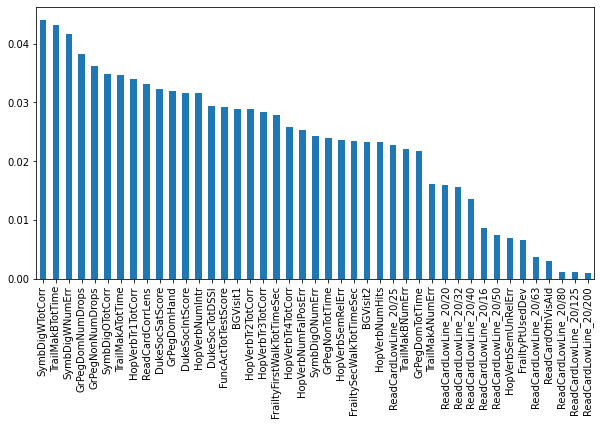

In [ ]:
fit_Chi2 = pd.Series(lista_extra, index=X.columns)
# fit_Chi2.sort_values(ascending=False)

fit_Chi2.sort_values(ascending=False).plot.bar(figsize=(10, 5))
# gráfico de barras utilizando matplotlib
# df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2.scores_})
# ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0, figsize=(5,5))
# # df, ax = plt.subplots(figsize=(50, 8))
# plt.title("Chi2 considerando subconjunto X train")
# indices = np.argsort(fit_Chi2)[::-1]

# plt.figure()
# # plt.title("Importancia de las características")
# plt.bar(X.columns, fit_Chi2.scores_),
#         color="r", align="center")
# plt.xticks(rotation='vertical')
# plt.xlim([-1, X_train_scaler_all0.shape[1]])
# plt.rcParams["figure.figsize"] = (5, 5)
# plt.tight_layout()
# plt.savefig("{}.pdf".format("ERTCTotTestScores"))
# plt.close()
# plt.show()

# ***Método filter***

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif

bestfeatures_Chi2 = SelectKBest(score_func=partial(mutual_info_classif,random_state=4), k='all')
fit_Chi2 = bestfeatures_Chi2.fit(X_train_scaler_all4, Y_train_4)
# fit_Chi2 = pd.Series(fit_Chi2.scores_)
# fit_Chi2.sort_values(ascending=False)

# fit_Chi2.sort_values(ascending=False).plot.bar(figsize=(20, 5))

# # gráfico de barras utilizando matplotlib
# df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2.scores_})
# ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0, figsize=(5,5))
# # df, ax = plt.subplots(figsize=(50, 8))
# plt.title("Chi2 considerando subconjunto X train")

In [ ]:
contador=0
for i in fit_Chi2.scores_:
  lista_chi[contador].append(i)
  contador+=1

In [ ]:
for i in range(len(lista_chi)):
  lista_chi[i]=np.mean(lista_chi[i])

In [ ]:
lista_chi

[0.0012130540617599106,
 0.007179628908290647,
 0.011406103822265567,
 0.011173388620800395,
 0.0,
 0.023297169353956093,
 0.01723455637442406,
 0.00668239028109614,
 0.0017928420840037872,
 0.011629142445841057,
 0.020895280685158068,
 0.013978073274190938,
 0.022180190356263906,
 0.00719355942222113,
 0.017681629623886953,
 0.022452144587056376,
 0.042736261163275426,
 0.015498272804861069,
 0.015381073542279378,
 0.026726664715238258,
 0.008415687947099616,
 0.022200218918770397,
 0.02158172507601184,
 0.007278810731178309,
 0.0,
 0.045384398960482075,
 0.011192799765211526,
 0.004138895581351454,
 0.005473310920722607,
 0.0,
 0.04108074601620419,
 0.019990185916259406,
 0.024628842888754665,
 0.049150749066153396,
 0.017782335963924156,
 0.0005918094565005472,
 0.018765586577689498,
 0.03543750704539912,
 0.02697033126149302,
 0.0,
 0.01509443260930019,
 0.0019156188580747191,
 0.036034903596646205]

Dibujo la media de las 5 particiones para información utua:

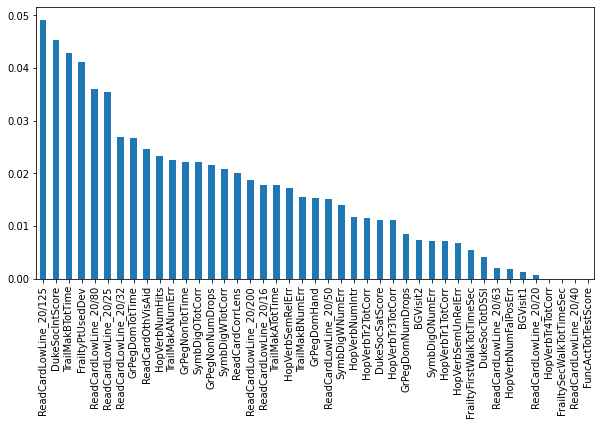

In [ ]:
fit_Chi2 = pd.Series(lista_chi, index=X.columns)
# fit_Chi2.sort_values(ascending=False)

fit_Chi2.sort_values(ascending=False).plot.bar(figsize=(10, 5))
# gráfico de barras utilizando matplotlib
# df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2.scores_})
# ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0, figsize=(5,5))
# # df, ax = plt.subplots(figsize=(50, 8))
# plt.title("Chi2 considerando subconjunto X train")
# indices = np.argsort(fit_Chi2)[::-1]

# plt.figure()
# # plt.title("Importancia de las características")
# plt.bar(X.columns, fit_Chi2.scores_),
#         color="r", align="center")
# plt.xticks(rotation='vertical')
# plt.xlim([-1, X_train_scaler_all0.shape[1]])
# plt.rcParams["figure.figsize"] = (5, 5)
# plt.tight_layout()
# plt.savefig("{}.pdf".format("IMutuaAttitudeScale"))
# plt.close()
# plt.show()

# ***RANDOM FOREST***

In [ ]:

from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier


In [ ]:
feat_labels=X.columns

In [ ]:
# Create a random forest classifier
clf = RandomForestClassifier(n_estimators=250, random_state=0, n_jobs=-1)

# Train the classifier
clf.fit(X_train_scaler_all4, Y_train_4)

# # Print the name and gini importance of each feature
# for feature in zip(feat_labels, clf.feature_importances_):
#     print(feature)

importances = clf.feature_importances_
# std = np.std([tree.feature_importances_ for tree in clf.estimators_],
#              axis=0)
# indices = np.argsort(importances)[::-1]
# # Muestra el ranking en el ordenamiento
# print("Ranking de Características:")

# for f in range(X_train_scaler_all4.shape[1]):
#   print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# # Plot the impurity-based feature importances of the forest
# plt.figure()
# plt.title("Importancia de las características")
# plt.bar(range(X_train_scaler_all4.shape[1]), importances[indices],
#         color="r", align="center")
# plt.xticks(range(X_train_scaler_all4.shape[1]), indices)
# plt.xlim([-1, 20])
# plt.show()


In [ ]:
contador=0
for i in importances:
  lista_RF[contador].append(i)
  contador+=1

In [ ]:
for i in range(len(lista_RF)):
  lista_RF[i]=np.mean(lista_RF[i])
  

Dibujo la media de las 5 particiones para información utua:

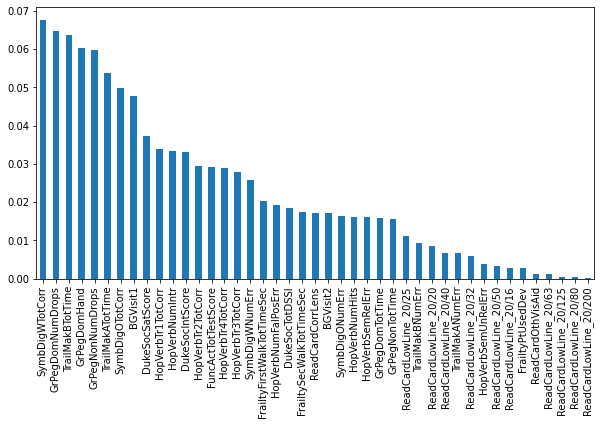

In [ ]:
fit_Chi2 = pd.Series(lista_RF, index=X.columns)
# fit_Chi2.sort_values(ascending=False)

fit_Chi2.sort_values(ascending=False).plot.bar(figsize=(10, 5))
# plt.savefig("{}.pdf".format("MedicamentosIM"))
# plt.close()
# gráfico de barras utilizando matplotlib
# df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2.scores_})
# ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0, figsize=(5,5))
# # df, ax = plt.subplots(figsize=(50, 8))
# plt.title("Chi2 considerando subconjunto X train")
# indices = np.argsort(fit_Chi2)[::-1]

# plt.figure()
# # plt.title("Importancia de las características")
# plt.bar(X.columns, fit_Chi2.scores_),
#         color="r", align="center")
# plt.xticks(rotation='vertical')
# plt.xlim([-1, X_train_scaler_all0.shape[1]])
# plt.rcParams["figure.figsize"] = (5, 5)
# plt.tight_layout()
# plt.savefig("{}.pdf".format("RFMedicamentos"))
# plt.close()
# plt.show()

# ***RESULTADOS CON FS***

In [ ]:

recall_reg_scaler = []
accuracy_reg_scaler = []
precision_reg_scaler=[]
f1_reg_scaler=[]
roc_reg_scaler= []

recall_arbol_scaler = []
accuracy_arbol_scaler = []
precision_arbol_scaler=[]
f1_arbol_scaler=[]
roc_arbol_scaler= []

recall_knn_scaler = []
accuracy_knn_scaler = []
precision_knn_scaler=[]
f1_knn_scaler=[]
roc_knn_scaler= []

recall_svc_scaler = []
accuracy_svc_scaler = []
precision_svc_scaler=[]
f1_svc_scaler=[]
roc_svc_scaler= []

recall_svc_lin_scaler = []
accuracy_svc_lin_scaler = []
precision_svc_lin_scaler=[]
f1_svc_lin_scaler=[]
roc_svc_lin_scaler= []

In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all0[:,[9,10,11,13,15,17,19,21,24,34,39]]
X_test_ec = X_test_scaler_all0[:,[9,10,11,13,15,17,19,21,24,34,39]]


Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.588
0.5853658536585366
[[14  6]
 [11 10]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.47619047619047616 0.5853658536585366 0.7 0.5405405405405405


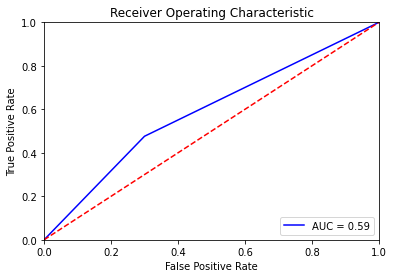

{'max_depth': 1, 'min_samples_leaf': 46}
Mejor ROC-AUC en validación cruzada: 0.612
Mejor valor del hiperparámetro: {'max_depth': 1, 'min_samples_leaf': 46}
0.4878048780487805
[[10 10]
 [11 10]]
Sensibilidad, Accuracy, Especifididad, f1-score 0.47619047619047616 0.4878048780487805 0.5 0.4878048780487805


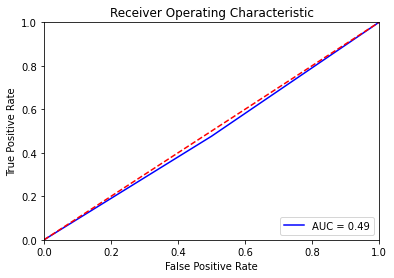

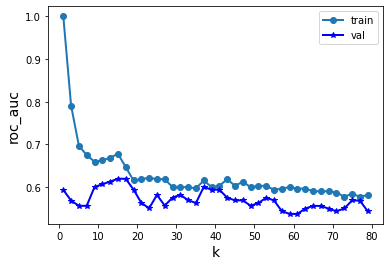

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.620
Valor correspondiente para el hiperparámetro: {'n_neighbors': 15}
0.5121951219512195
[[12  8]
 [12  9]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.42857142857142855 0.5121951219512195 0.6 0.4736842105263158


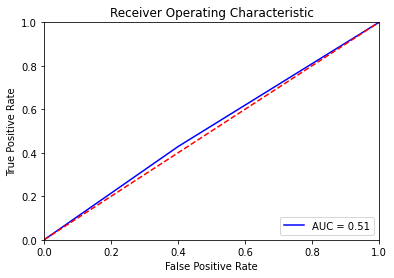

Valor correspondiente para el hiperparámetro: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.600
0.5853658536585366
[[14  6]
 [11 10]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.47619047619047616 0.5853658536585366 0.7 0.5405405405405405


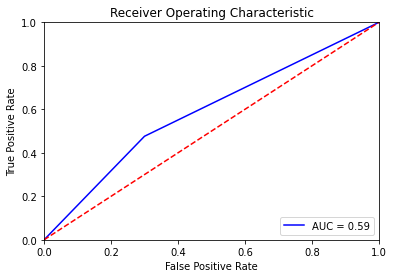

Valor correspondiente para el hiperparámetro: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.600
0.5365853658536586
[[14  6]
 [13  8]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.38095238095238093 0.5365853658536586 0.7 0.4571428571428571


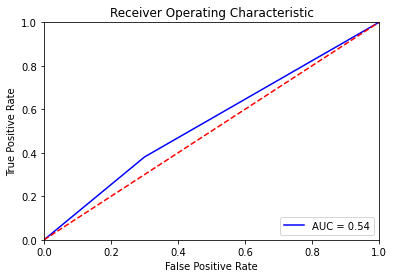

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train_0,Y_test_0,0)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train_0,Y_test_0,0)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train_0,Y_test_0)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train_0,Y_test_0,0)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train_0,Y_test_0,0)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(sl[4])

In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all1[:,[9,10,11,13,15,17,19,21,24,34,39]]
X_test_ec = X_test_scaler_all1[:,[9,10,11,13,15,17,19,21,24,34,39]]


Valor correspondiente para el hiperparámetro: {'C': 30, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.562
0.5853658536585366
[[10 10]
 [ 7 14]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.6666666666666666 0.5853658536585366 0.5 0.6222222222222222


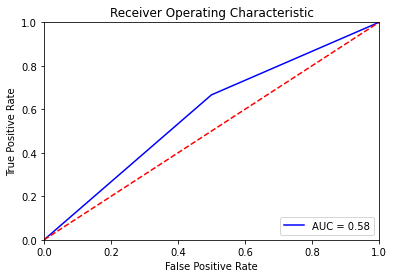

{'max_depth': 5, 'min_samples_leaf': 8}
Mejor ROC-AUC en validación cruzada: 0.663
Mejor valor del hiperparámetro: {'max_depth': 5, 'min_samples_leaf': 8}
0.4878048780487805
[[ 9 11]
 [10 11]]
Sensibilidad, Accuracy, Especifididad, f1-score 0.5238095238095238 0.4878048780487805 0.45 0.5116279069767442


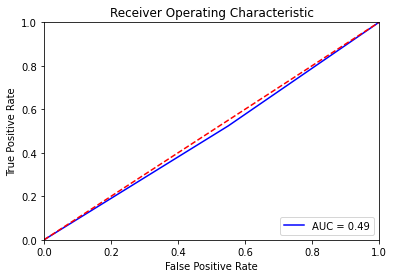

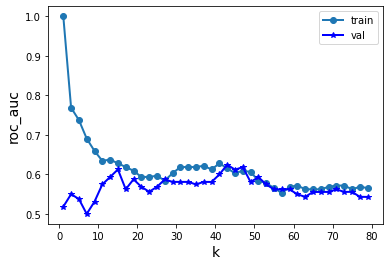

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.625
Valor correspondiente para el hiperparámetro: {'n_neighbors': 43}
0.5609756097560976
[[12  8]
 [10 11]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.5238095238095238 0.5609756097560976 0.6 0.5500000000000002


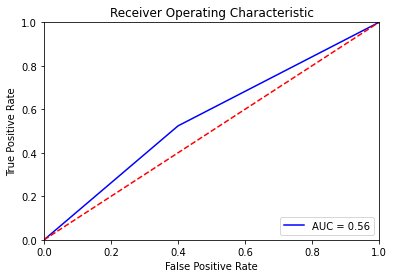

Valor correspondiente para el hiperparámetro: {'C': 50, 'gamma': 0.001, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.631
0.5609756097560976
[[11  9]
 [ 9 12]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.5714285714285714 0.5609756097560976 0.55 0.5714285714285714


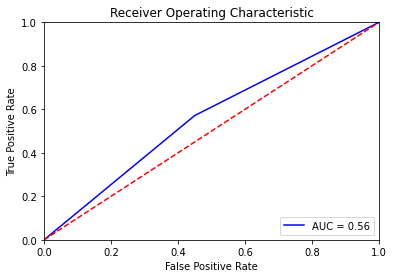

Valor correspondiente para el hiperparámetro: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.631
0.5609756097560976
[[11  9]
 [ 9 12]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.5714285714285714 0.5609756097560976 0.55 0.5714285714285714


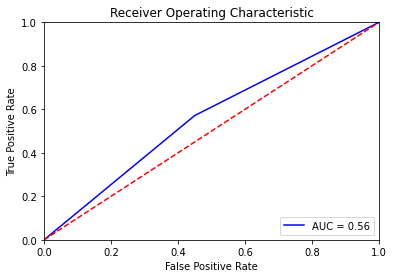

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train_1,Y_test_1,1)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train_1,Y_test_1,1)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train_1,Y_test_1)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train_1,Y_test_1,1)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train_1,Y_test_1,1)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(s[4])


In [129]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all2[:,[9,10,11,13,15,17,19,21,24,34,39]]
X_test_ec = X_test_scaler_all2[:,[9,10,11,13,15,17,19,21,24,34,39]]


Valor correspondiente para el hiperparámetro: {'C': 10, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.581
0.5853658536585366
[[14  6]
 [11 10]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.47619047619047616 0.5853658536585366 0.7 0.5405405405405405


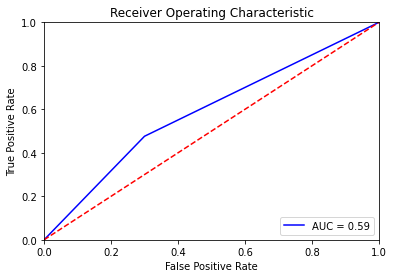

{'max_depth': 3, 'min_samples_leaf': 5}
Mejor ROC-AUC en validación cruzada: 0.607
Mejor valor del hiperparámetro: {'max_depth': 3, 'min_samples_leaf': 5}
0.6097560975609756
[[18  2]
 [14  7]]
Sensibilidad, Accuracy, Especifididad, f1-score 0.3333333333333333 0.6097560975609756 0.9 0.4666666666666666


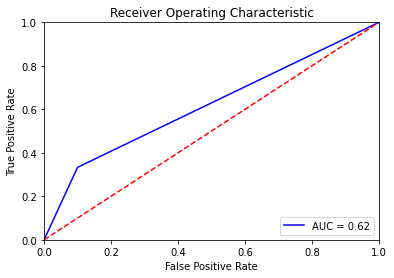

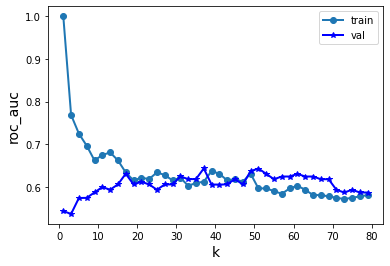

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.644
Valor correspondiente para el hiperparámetro: {'n_neighbors': 37}
0.5365853658536586
[[13  7]
 [12  9]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.42857142857142855 0.5365853658536586 0.65 0.4864864864864864


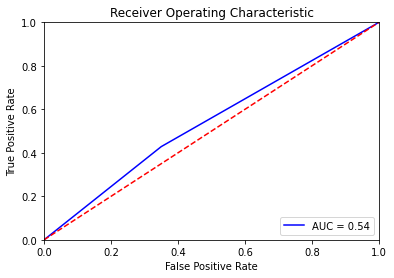

Valor correspondiente para el hiperparámetro: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.613
0.5853658536585366
[[14  6]
 [11 10]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.47619047619047616 0.5853658536585366 0.7 0.5405405405405405


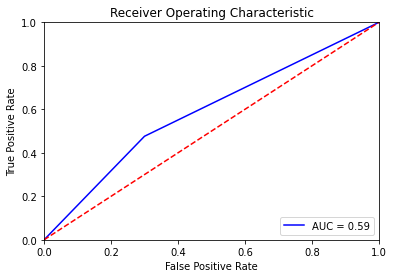

Valor correspondiente para el hiperparámetro: {'C': 10, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.625
0.4634146341463415
[[11  9]
 [13  8]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.38095238095238093 0.4634146341463415 0.55 0.42105263157894735


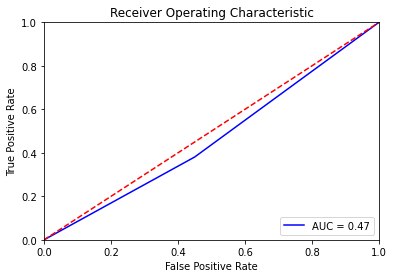

In [130]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train_2,Y_test_2,2)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train_2,Y_test_2,2)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train_2,Y_test_2)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train_2,Y_test_2,2)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train_2,Y_test_2,2)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(s[4])


In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all3[:,[9,10,11,13,15,17,19,21,24,34,39]]
X_test_ec = X_test_scaler_all3[:,[9,10,11,13,15,17,19,21,24,34,39]]


Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.613
0.5365853658536586
[[15  5]
 [14  7]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.3333333333333333 0.5365853658536586 0.75 0.4242424242424242


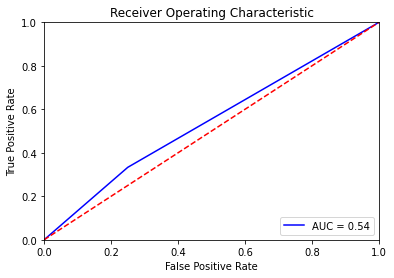

{'max_depth': 4, 'min_samples_leaf': 7}
Mejor ROC-AUC en validación cruzada: 0.631
Mejor valor del hiperparámetro: {'max_depth': 4, 'min_samples_leaf': 7}
0.43902439024390244
[[10 10]
 [13  8]]
Sensibilidad, Accuracy, Especifididad, f1-score 0.38095238095238093 0.43902439024390244 0.5 0.41025641025641024


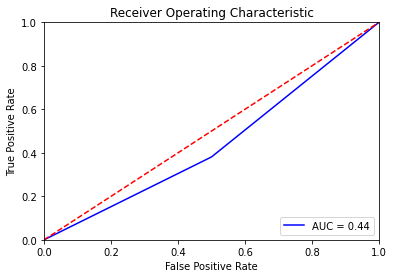

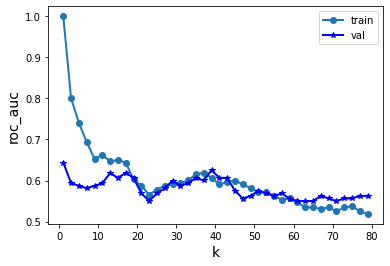

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.644
Valor correspondiente para el hiperparámetro: {'n_neighbors': 1}
0.4634146341463415
[[ 8 12]
 [10 11]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.5238095238095238 0.4634146341463415 0.4 0.5


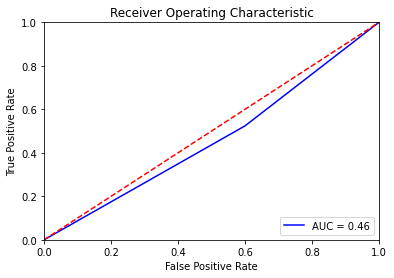

Valor correspondiente para el hiperparámetro: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.606
0.5853658536585366
[[15  5]
 [12  9]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.42857142857142855 0.5853658536585366 0.75 0.5142857142857143


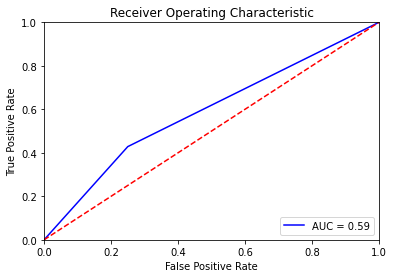

Valor correspondiente para el hiperparámetro: {'C': 0.001, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.588
0.5853658536585366
[[16  4]
 [13  8]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.38095238095238093 0.5853658536585366 0.8 0.4848484848484849


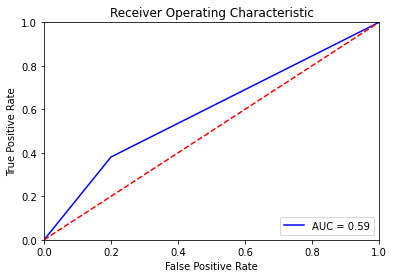

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train_3,Y_test_3,3)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train_3,Y_test_3,3)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train_3,Y_test_3)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train_3,Y_test_3,3)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train_3,Y_test_3,3)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(s[4])



In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all4[:,[9,10,11,13,15,17,19,21,24,34,39]]
X_test_ec = X_test_scaler_all4[:,[9,10,11,13,15,17,19,21,24,34,39]]


Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.581
0.6097560975609756
[[11  9]
 [ 7 14]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.6666666666666666 0.6097560975609756 0.55 0.6363636363636365


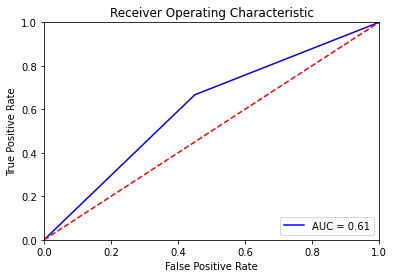

{'max_depth': 4, 'min_samples_leaf': 5}
Mejor ROC-AUC en validación cruzada: 0.606
Mejor valor del hiperparámetro: {'max_depth': 4, 'min_samples_leaf': 5}
0.4878048780487805
[[10 10]
 [11 10]]
Sensibilidad, Accuracy, Especifididad, f1-score 0.47619047619047616 0.4878048780487805 0.5 0.4878048780487805


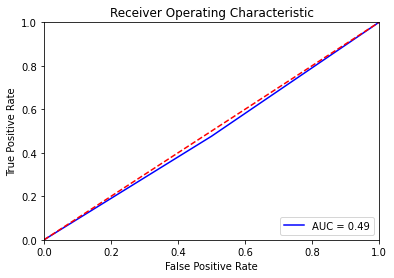

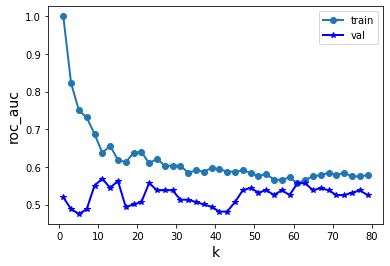

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.569
Valor correspondiente para el hiperparámetro: {'n_neighbors': 11}
0.4146341463414634
[[ 7 13]
 [11 10]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.47619047619047616 0.4146341463414634 0.35 0.4545454545454545


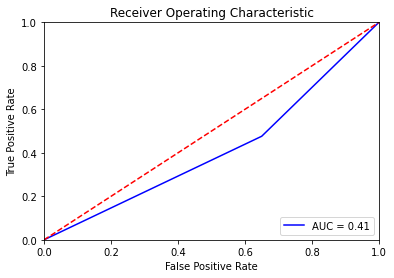

Valor correspondiente para el hiperparámetro: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.637
0.6341463414634146
[[13  7]
 [ 8 13]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.6190476190476191 0.6341463414634146 0.65 0.6341463414634146


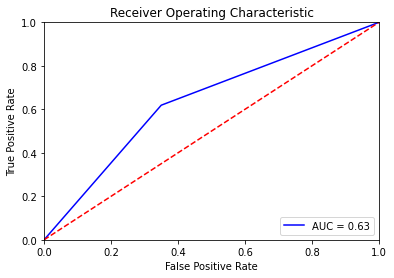

Valor correspondiente para el hiperparámetro: {'C': 10, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.600
0.5853658536585366
[[11  9]
 [ 8 13]]
Sensibilidad, Accuracy, Especificidad, f1-score 0.6190476190476191 0.5853658536585366 0.55 0.6046511627906977


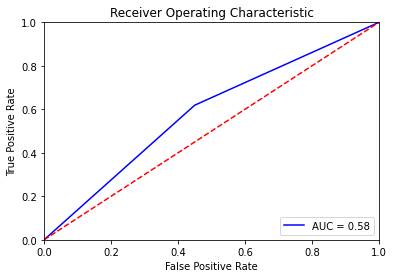

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train_4,Y_test_4,4)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train_4,Y_test_4,4)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train_4,Y_test_4)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train_4,Y_test_4,4)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train_4,Y_test_4,4)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(s[4])


In [ ]:
def plot_mean_std_metric(df_metrics, lims, metric_name='accuracy', title_figure='mean_std_plot', flag_save_figure=False):

    fig, ax = plt.subplots(1, 1, figsize=(6.5, 4.5))

    ax.plot(df_metrics['mean'], df_metrics['model'], ls='', marker='o', color='#8000FF')

    ax.hlines(df_metrics['model'], df_metrics['mean'] - df_metrics['std'], df_metrics['mean'] + df_metrics['std'],
              label='', lw=2, color='#8000FF', ls='-')

    ax.grid(axis='x', ls='-')
    ax.grid(axis='y', ls=':', lw=1, alpha=0.5)
    ax.set(
        xlabel=metric_name,
        xlim=lims,
        title=title_figure
    )

    fig.tight_layout()

    if flag_save_figure:
        fig.savefig(title_figure, dpi=300, bbox_inches='tight')
    else:
        plt.show()

In [ ]:

model_scaler=['LASSO', 'DT', 'KNN','Radial SVM', 'Linear SVM']
mean_scaler=[np.mean(accuracy_reg_scaler), np.mean(accuracy_arbol_scaler),np.mean(accuracy_knn_scaler),np.mean(accuracy_svc_scaler),np.mean(accuracy_svc_lin_scaler)]
std_scaler=[np.std(accuracy_reg_scaler), np.std(accuracy_arbol_scaler),np.std(accuracy_knn_scaler),np.std(accuracy_svc_scaler),np.std(accuracy_svc_lin_scaler)]

df_acc_scaler= pd.DataFrame()
df_acc_scaler['model'] = None
df_acc_scaler['mean'] = None
df_acc_scaler['std'] = None


df_acc_scaler['model'] = model_scaler
df_acc_scaler['mean'] = mean_scaler
df_acc_scaler['std'] = std_scaler


In [ ]:
df_acc_scaler

,model,mean,std
0,LASSO,0.580488,0.023897
1,DT,0.502439,0.056887
2,KNN,0.497561,0.052538
3,Radial SVM,0.590244,0.023897
4,Linear SVM,0.546341,0.045237


In [ ]:
model2_scaler=['LASSO', 'DT', 'KNN','Radial SVM', 'Linear SVM']
mean2_scaler=[np.mean(roc_reg_scaler), np.mean(roc_arbol_scaler),np.mean(roc_knn_scaler),np.mean(roc_svc_scaler),np.mean(roc_svc_lin_scaler)]
std2_scaler=[np.std(roc_reg_scaler), np.std(roc_arbol_scaler),np.std(roc_knn_scaler),np.std(roc_svc_scaler),np.std(roc_svc_lin_scaler)]

df_roc_scaler= pd.DataFrame()
df_roc_scaler['model'] = None
df_roc_scaler['mean'] = None
df_roc_scaler['std'] = None


df_roc_scaler['model'] = model2_scaler
df_roc_scaler['mean'] = mean2_scaler
df_roc_scaler['std'] = std2_scaler


In [ ]:
df_roc_scaler

,model,mean,std
0,LASSO,0.581905,0.021892
1,DT,0.504048,0.059207
2,KNN,0.498095,0.053973
3,Radial SVM,0.592619,0.023707
4,Linear SVM,0.583095,0.031796


In [ ]:
#PINTAMOS GRÁFICAS PARA VARIABLES NORMALIZADAS CON STANDARD SCALER PARA ACCURACY Y ROC

plot_mean_std_metric(df_acc_scaler, lims=(0, 0.9), metric_name='',title_figure='', flag_save_figure=True)
# plt.rcParams["figure.figsize"] = (4, 3)
plt.savefig("{}.pdf".format("TotTestScores_FS_acc"))
plt.close()

# plot_mean_std_metric(df_roc_scaler, lims=(0, 0.9), metric_name='',title_figure='', flag_save_figure=True)
# # plt.rcParams["figure.figsize"] = (4, 3)
# plt.savefig("{}.pdf".format("Att_auc"))
# plt.close()

In [ ]:
#RECALL
model_scaler3=['LASSO', 'DT', 'KNN','Radial SVM', 'Linear SVM']
mean_scaler3=[np.mean(recall_reg_scaler), np.mean(recall_arbol_scaler),np.mean(recall_knn_scaler),np.mean(recall_svc_scaler),np.mean(recall_svc_lin_scaler)]
std_scaler3=[np.std(recall_reg_scaler), np.std(recall_arbol_scaler),np.std(recall_knn_scaler),np.std(recall_svc_scaler),np.std(recall_svc_lin_scaler)]

df_recall_scaler= pd.DataFrame()
df_recall_scaler['model'] = None
df_recall_scaler['mean'] = None
df_recall_scaler['std'] = None


df_recall_scaler['model'] = model_scaler3
df_recall_scaler['mean'] = mean_scaler3
df_recall_scaler['std'] = std_scaler3

In [ ]:
df_recall_scaler

,model,mean,std
0,LASSO,0.523810,0.127775
1,DT,0.438095,0.069985
2,KNN,0.476190,0.042592
3,Radial SVM,0.495238,0.088320
4,Linear SVM,0.466667,0.106053


In [ ]:
model_scaler4=['LASSO', 'DT', 'KNN','Radial SVM', 'Linear SVM']
mean_scaler4=[np.mean(precision_reg_scaler), np.mean(precision_arbol_scaler),np.mean(precision_knn_scaler),np.mean(precision_svc_scaler),np.mean(precision_svc_lin_scaler)]
std_scaler4=[np.std(precision_reg_scaler), np.std(precision_arbol_scaler),np.std(precision_knn_scaler),np.std(precision_svc_scaler),np.std(precision_svc_lin_scaler)]

df_especificidad_scaler= pd.DataFrame()
df_especificidad_scaler['model'] = None
df_especificidad_scaler['mean'] = None
df_especificidad_scaler['std'] = None


df_especificidad_scaler['model'] = model_scaler4
df_especificidad_scaler['mean'] = mean_scaler4
df_especificidad_scaler['std'] = std_scaler4

In [ ]:
df_especificidad_scaler


,model,mean,std
0,LASSO,0.64,0.096954
1,DT,0.57,0.166132
2,KNN,0.52,0.120830
3,Radial SVM,0.69,0.086023
4,Linear SVM,0.63,0.102956


# ***A PARTIR DE AQUÍ: PRUEBAS VARIAS***

# ***PARA BOOTSTRAP ESCOGEMOS LAS SIGUIENTES CARACTERÍSTICAS***

In [ ]:

recall_reg_scaler = []
accuracy_reg_scaler = []
precision_reg_scaler=[]
f1_reg_scaler=[]
roc_reg_scaler= []

recall_arbol_scaler = []
accuracy_arbol_scaler = []
precision_arbol_scaler=[]
f1_arbol_scaler=[]
roc_arbol_scaler= []

recall_knn_scaler = []
accuracy_knn_scaler = []
precision_knn_scaler=[]
f1_knn_scaler=[]
roc_knn_scaler= []

recall_svc_scaler = []
accuracy_svc_scaler = []
precision_svc_scaler=[]
f1_svc_scaler=[]
roc_svc_scaler= []

recall_svc_lin_scaler = []
accuracy_svc_lin_scaler = []
precision_svc_lin_scaler=[]
f1_svc_lin_scaler=[]
roc_svc_lin_scaler= []

recall_mlp_lin_scaler = []
accuracy_mlp_lin_scaler = []
precision_mlp_lin_scaler=[]
f1_mlp_lin_scaler=[]
roc_mlp_lin_scaler= []

In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all0[:,[0,1,2,4,10,11,12,13,14,16,17,18,19,21,22,25,26,27,28,29,31,34,35,37,42]]
X_test_ec = X_test_scaler_all0[:,[0,1,2,4,10,11,12,13,14,16,17,18,19,21,22,25,26,27,28,29,31,34,35,37,42]]


In [ ]:
X_train_ec.shape

(160, 25)

Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l2'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.594
0.6097560975609756
[[13  7]
 [ 9 12]]
Sensibilidad, Accuracy, precision, f1-score 0.5714285714285714 0.6097560975609756 0.631578947368421 0.6


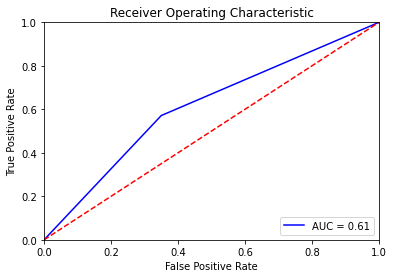

{'max_depth': 7, 'min_samples_leaf': 6}
Mejor ROC-AUC en validación cruzada: 0.594
Mejor valor del hiperparámetro: {'max_depth': 7, 'min_samples_leaf': 6}
0.5609756097560976
[[13  7]
 [11 10]]
Sensibilidad, Accuracy, precision, f1-score 0.47619047619047616 0.5609756097560976 0.5882352941176471 0.5263157894736842


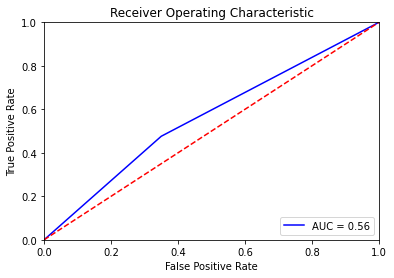

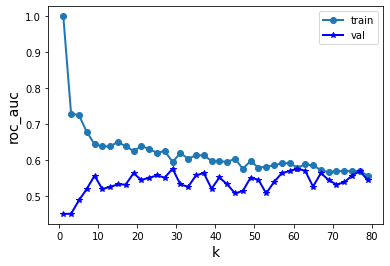

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.575
Valor correspondiente para el hiperparámetro: {'n_neighbors': 29}
0.5853658536585366
[[13  7]
 [10 11]]
Sensibilidad, Accuracy, precision, f1-score 0.5238095238095238 0.5853658536585366 0.6111111111111112 0.5641025641025642


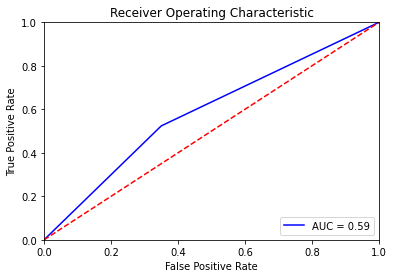

Valor correspondiente para el hiperparámetro: {'C': 50, 'gamma': 0.001, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.606
0.6585365853658537
[[15  5]
 [ 9 12]]
Sensibilidad, Accuracy, precision, f1-score 0.5714285714285714 0.6585365853658537 0.7058823529411765 0.6315789473684211


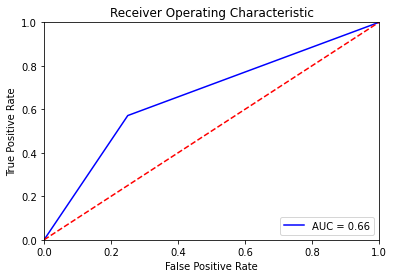

Valor correspondiente para el hiperparámetro: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.613
0.6585365853658537
[[15  5]
 [ 9 12]]
Sensibilidad, Accuracy, precision, f1-score 0.5714285714285714 0.6585365853658537 0.7058823529411765 0.6315789473684211


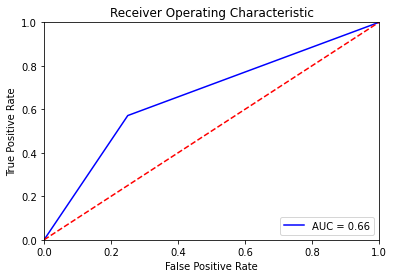

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train_0,Y_test_0,0)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train_0,Y_test_0,0)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train_0,Y_test_0)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train_0,Y_test_0,0)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train_0,Y_test_0,0)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(s[4])

# mlp=MLP(X_train_ec,X_test_ec,Y_train_0,Y_test_0,0)
# recall_mlp_lin_scaler.append(mlp[0])
# accuracy_mlp_lin_scaler.append(mlp[1])
# precision_mlp_lin_scaler.append(mlp[2])
# f1_mlp_lin_scaler.append(mlp[3])
# roc_mlp_lin_scaler.append(mlp[4])


In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all1[:,[0,1,2,4,10,11,12,13,14,16,17,18,19,21,22,25,26,27,28,29,31,34,35,37,42]]
X_test_ec = X_test_scaler_all1[:,[0,1,2,4,10,11,12,13,14,16,17,18,19,21,22,25,26,27,28,29,31,34,35,37,42]]


Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.569
0.43902439024390244
[[10 10]
 [13  8]]
Sensibilidad, Accuracy, precision, f1-score 0.38095238095238093 0.43902439024390244 0.4444444444444444 0.41025641025641024


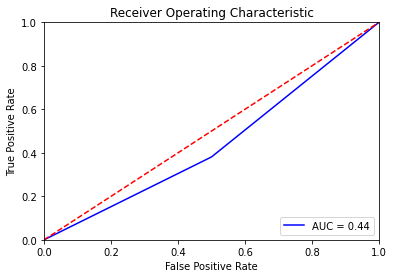

{'max_depth': 5, 'min_samples_leaf': 2}
Mejor ROC-AUC en validación cruzada: 0.544
Mejor valor del hiperparámetro: {'max_depth': 5, 'min_samples_leaf': 2}
0.3902439024390244
[[ 9 11]
 [14  7]]
Sensibilidad, Accuracy, precision, f1-score 0.3333333333333333 0.3902439024390244 0.3888888888888889 0.358974358974359


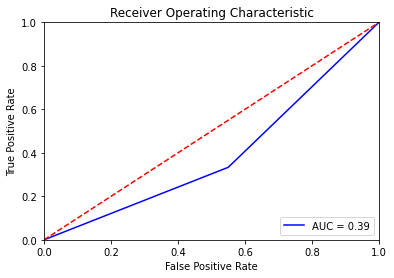

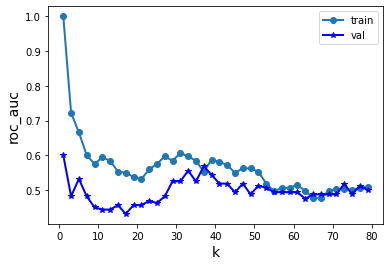

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.600
Valor correspondiente para el hiperparámetro: {'n_neighbors': 1}
0.5609756097560976
[[13  7]
 [11 10]]
Sensibilidad, Accuracy, precision, f1-score 0.47619047619047616 0.5609756097560976 0.5882352941176471 0.5263157894736842


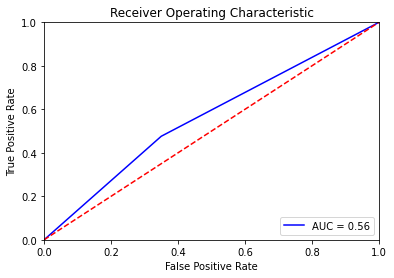

Valor correspondiente para el hiperparámetro: {'C': 1000, 'gamma': 0.0001, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.562
0.5853658536585366
[[ 9 11]
 [ 6 15]]
Sensibilidad, Accuracy, precision, f1-score 0.7142857142857143 0.5853658536585366 0.5769230769230769 0.6382978723404256


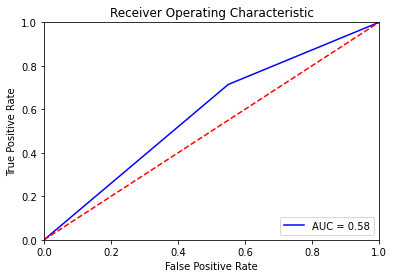

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train_1,Y_test_1,1)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train_1,Y_test_1,1)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train_1,Y_test_1)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train_1,Y_test_1,1)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train_1,Y_test_1,1)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(s[4])

# mlp=MLP(X_train_ec,X_test_ec,Y_train_1,Y_test_1,1)
# recall_mlp_lin_scaler.append(mlp[0])
# accuracy_mlp_lin_scaler.append(mlp[1])
# precision_mlp_lin_scaler.append(mlp[2])
# f1_mlp_lin_scaler.append(mlp[3])
# roc_mlp_lin_scaler.append(mlp[4])

In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all2[:,[0,1,2,4,10,11,12,13,14,16,17,18,19,21,22,25,26,27,28,29,31,34,35,37,42]]
X_test_ec = X_test_scaler_all2[:,[0,1,2,4,10,11,12,13,14,16,17,18,19,21,22,25,26,27,28,29,31,34,35,37,42]]


Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l2'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.625
0.6829268292682927
[[14  6]
 [ 7 14]]
Sensibilidad, Accuracy, precision, f1-score 0.6666666666666666 0.6829268292682927 0.7 0.6829268292682926


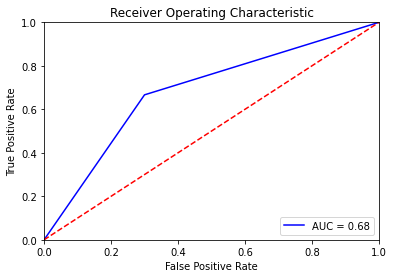

{'max_depth': 2, 'min_samples_leaf': 9}
Mejor ROC-AUC en validación cruzada: 0.575
Mejor valor del hiperparámetro: {'max_depth': 2, 'min_samples_leaf': 9}
0.5365853658536586
[[14  6]
 [13  8]]
Sensibilidad, Accuracy, precision, f1-score 0.38095238095238093 0.5365853658536586 0.5714285714285714 0.4571428571428571


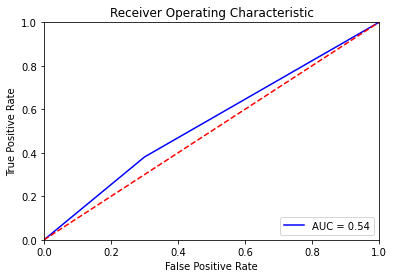

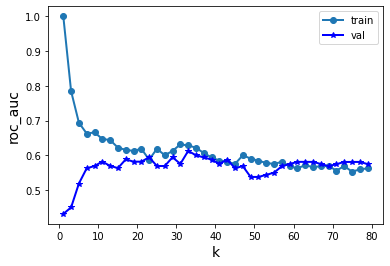

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.612
Valor correspondiente para el hiperparámetro: {'n_neighbors': 33}
0.5365853658536586
[[15  5]
 [14  7]]
Sensibilidad, Accuracy, precision, f1-score 0.3333333333333333 0.5365853658536586 0.5833333333333334 0.4242424242424242


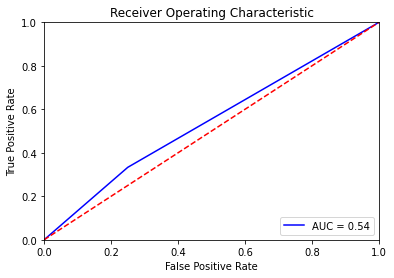

Valor correspondiente para el hiperparámetro: {'C': 50, 'gamma': 0.001, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.613
0.6097560975609756
[[15  5]
 [11 10]]
Sensibilidad, Accuracy, precision, f1-score 0.47619047619047616 0.6097560975609756 0.6666666666666666 0.5555555555555556


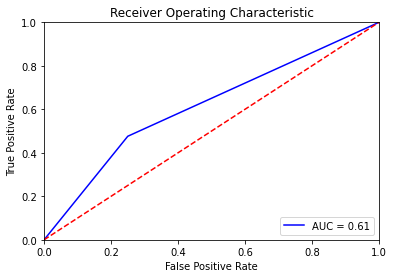

Valor correspondiente para el hiperparámetro: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.619
0.6341463414634146
[[15  5]
 [10 11]]
Sensibilidad, Accuracy, precision, f1-score 0.5238095238095238 0.6341463414634146 0.6875 0.5945945945945946


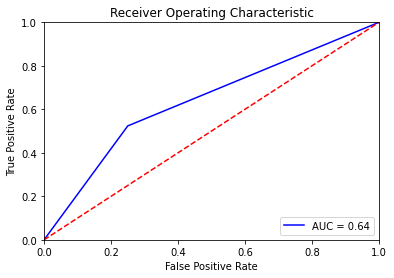

In [ ]:

#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train_2,Y_test_2,2)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train_2,Y_test_2,2)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train_2,Y_test_2)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train_2,Y_test_2,2)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train_2,Y_test_2,2)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(s[4])

# mlp=MLP(X_train_ec,X_test_ec,Y_train_2,Y_test_2,2)
# recall_mlp_lin_scaler.append(mlp[0])
# accuracy_mlp_lin_scaler.append(mlp[1])
# precision_mlp_lin_scaler.append(mlp[2])
# f1_mlp_lin_scaler.append(mlp[3])
# roc_mlp_lin_scaler.append(mlp[4])


In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all3[:,[0,1,2,4,10,11,12,13,14,16,17,18,19,21,22,25,26,27,28,29,31,34,35,37,42]]
X_test_ec = X_test_scaler_all3[:,[0,1,2,4,10,11,12,13,14,16,17,18,19,21,22,25,26,27,28,29,31,34,35,37,42]]


Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.637
0.5365853658536586
[[12  8]
 [11 10]]
Sensibilidad, Accuracy, precision, f1-score 0.47619047619047616 0.5365853658536586 0.5555555555555556 0.5128205128205129


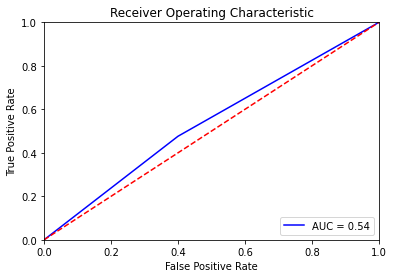

{'max_depth': 4, 'min_samples_leaf': 9}
Mejor ROC-AUC en validación cruzada: 0.606
Mejor valor del hiperparámetro: {'max_depth': 4, 'min_samples_leaf': 9}
0.5609756097560976
[[10 10]
 [ 8 13]]
Sensibilidad, Accuracy, precision, f1-score 0.6190476190476191 0.5609756097560976 0.5652173913043478 0.5909090909090909


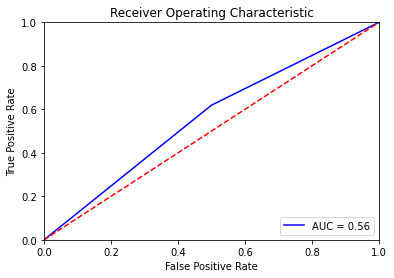

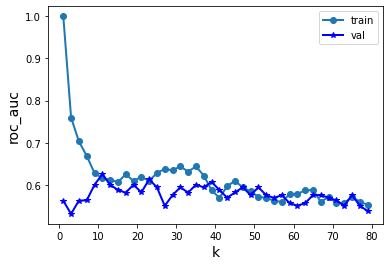

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.625
Valor correspondiente para el hiperparámetro: {'n_neighbors': 11}
0.6341463414634146
[[13  7]
 [ 8 13]]
Sensibilidad, Accuracy, precision, f1-score 0.6190476190476191 0.6341463414634146 0.65 0.6341463414634146


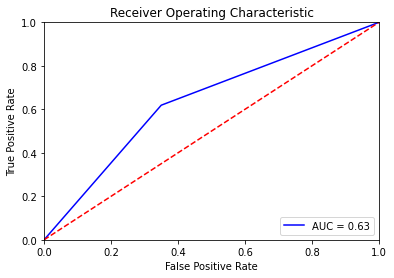

Valor correspondiente para el hiperparámetro: {'C': 25, 'gamma': 0.01, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.625
0.5853658536585366
[[12  8]
 [ 9 12]]
Sensibilidad, Accuracy, precision, f1-score 0.5714285714285714 0.5853658536585366 0.6 0.5853658536585366


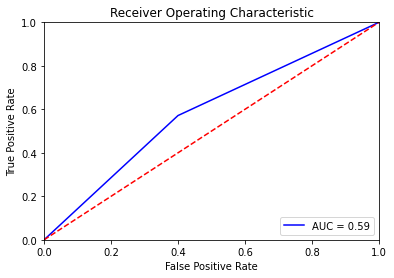

Valor correspondiente para el hiperparámetro: {'C': 10, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.613
0.5609756097560976
[[12  8]
 [10 11]]
Sensibilidad, Accuracy, precision, f1-score 0.5238095238095238 0.5609756097560976 0.5789473684210527 0.5500000000000002


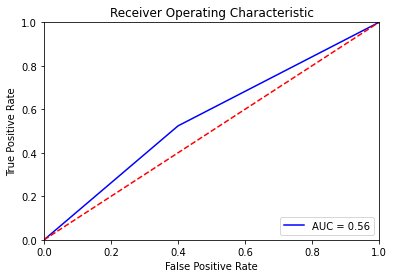

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train_3,Y_test_3,3)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train_3,Y_test_3,3)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train_3,Y_test_3)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train_3,Y_test_3,3)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train_3,Y_test_3,3)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(s[4])

# mlp=MLP(X_train_ec,X_test_ec,Y_train_3,Y_test_3,3)
# recall_mlp_lin_scaler.append(sl[0])
# accuracy_mlp_lin_scaler.append(sl[1])
# precision_mlp_lin_scaler.append(sl[2])
# f1_mlp_lin_scaler.append(sl[3])
# roc_mlp_lin_scaler.append(s[4])

In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all4[:,[0,1,2,4,10,11,12,13,14,16,17,18,19,21,22,25,26,27,28,29,31,34,35,37,42]]
X_test_ec = X_test_scaler_all4[:,[0,1,2,4,10,11,12,13,14,16,17,18,19,21,22,25,26,27,28,29,31,34,35,37,42]]


Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l2'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.637
0.6341463414634146
[[11  9]
 [ 6 15]]
Sensibilidad, Accuracy, precision, f1-score 0.7142857142857143 0.6341463414634146 0.625 0.6666666666666666


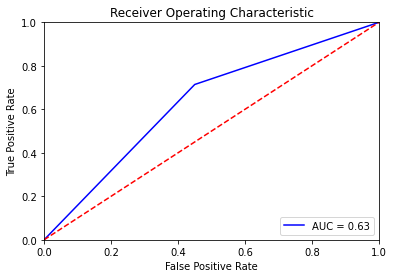

{'max_depth': 6, 'min_samples_leaf': 3}
Mejor ROC-AUC en validación cruzada: 0.606
Mejor valor del hiperparámetro: {'max_depth': 6, 'min_samples_leaf': 3}
0.5121951219512195
[[13  7]
 [13  8]]
Sensibilidad, Accuracy, precision, f1-score 0.38095238095238093 0.5121951219512195 0.5333333333333333 0.4444444444444444


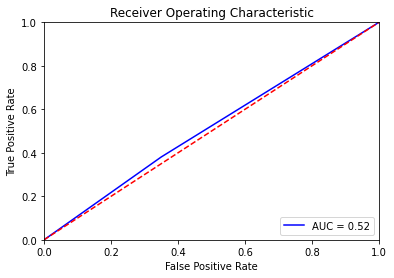

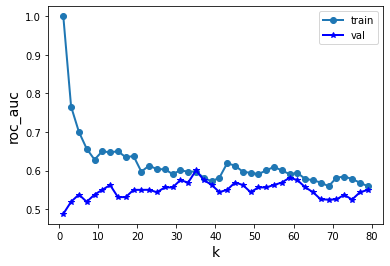

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.600
Valor correspondiente para el hiperparámetro: {'n_neighbors': 35}
0.6097560975609756
[[14  6]
 [10 11]]
Sensibilidad, Accuracy, precision, f1-score 0.5238095238095238 0.6097560975609756 0.6470588235294118 0.5789473684210527


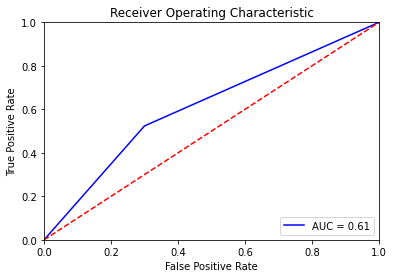

Valor correspondiente para el hiperparámetro: {'C': 50, 'gamma': 0.001, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.625
0.6341463414634146
[[11  9]
 [ 6 15]]
Sensibilidad, Accuracy, precision, f1-score 0.7142857142857143 0.6341463414634146 0.625 0.6666666666666666


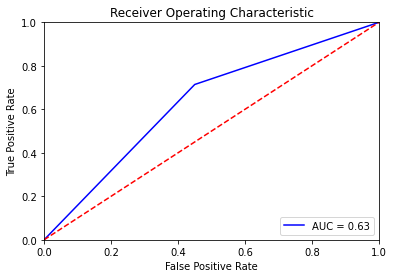

Valor correspondiente para el hiperparámetro: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.637
0.6585365853658537
[[11  9]
 [ 5 16]]
Sensibilidad, Accuracy, precision, f1-score 0.7619047619047619 0.6585365853658537 0.64 0.6956521739130435


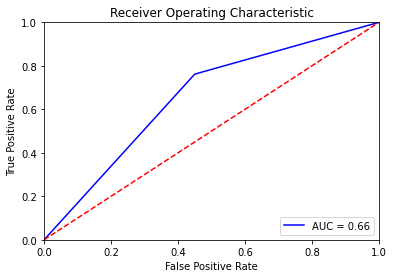

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train_4,Y_test_4,4)
recall_reg_scaler.append(r[0])
accuracy_reg_scaler.append(r[1])
precision_reg_scaler.append(r[2])
f1_reg_scaler.append(r[3])
roc_reg_scaler.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train_4,Y_test_4,4)
recall_arbol_scaler.append(a[0])
accuracy_arbol_scaler.append(a[1])
precision_arbol_scaler.append(a[2])
f1_arbol_scaler.append(a[3])
roc_arbol_scaler.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train_4,Y_test_4)
recall_knn_scaler.append(k[0])
accuracy_knn_scaler.append(k[1])
precision_knn_scaler.append(k[2])
f1_knn_scaler.append(k[3])
roc_knn_scaler.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train_4,Y_test_4,4)
recall_svc_scaler.append(s[0])
accuracy_svc_scaler.append(s[1])
precision_svc_scaler.append(s[2])
f1_svc_scaler.append(s[3])
roc_svc_scaler.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train_4,Y_test_4,4)
recall_svc_lin_scaler.append(sl[0])
accuracy_svc_lin_scaler.append(sl[1])
precision_svc_lin_scaler.append(sl[2])
f1_svc_lin_scaler.append(sl[3])
roc_svc_lin_scaler.append(s[4])

# mlp=MLP(X_train_ec,X_test_ec,Y_train_4,Y_test_4,4)
# recall_mlp_lin_scaler.append(mlp[0])
# accuracy_mlp_lin_scaler.append(mlp[1])
# precision_mlp_lin_scaler.append(mlp[2])
# f1_mlp_lin_scaler.append(mlp[3])
# roc_mlp_lin_scaler.append(mlp[4])

In [ ]:
def plot_mean_std_metric(df_metrics, lims, metric_name='accuracy', title_figure='mean_std_plot', flag_save_figure=False):

    fig, ax = plt.subplots(1, 1, figsize=(6.5, 4.5))

    ax.plot(df_metrics['mean'], df_metrics['model'], ls='', marker='o', color='#8000FF')

    ax.hlines(df_metrics['model'], df_metrics['mean'] - df_metrics['std'], df_metrics['mean'] + df_metrics['std'],
              label='', lw=2, color='#8000FF', ls='-')

    ax.grid(axis='x', ls='-')
    ax.grid(axis='y', ls=':', lw=1, alpha=0.5)
    ax.set(
        xlabel=metric_name,
        xlim=lims,
        title=title_figure
    )

    fig.tight_layout()

    if flag_save_figure:
        fig.savefig(title_figure, dpi=300, bbox_inches='tight')
    else:
        plt.show()

In [ ]:
#PARA MIN MAX

In [ ]:

model_scaler=['LASSO', 'DT','Radial SVM', 'Linear SVM']
mean_scaler=[np.mean(accuracy_reg_scaler), np.mean(accuracy_arbol_scaler),np.mean(accuracy_svc_scaler),np.mean(accuracy_svc_lin_scaler)]
std_scaler=[np.std(accuracy_reg_scaler), np.std(accuracy_arbol_scaler),np.std(accuracy_svc_scaler),np.std(accuracy_svc_lin_scaler)]

df_acc_scaler= pd.DataFrame()
df_acc_scaler['model'] = None
df_acc_scaler['mean'] = None
df_acc_scaler['std'] = None


df_acc_scaler['model'] = model_scaler
df_acc_scaler['mean'] = mean_scaler
df_acc_scaler['std'] = std_scaler


In [ ]:
df_acc_scaler

,model,mean,std
0,LASSO,0.580488,0.085052
1,DT,0.512195,0.063602
2,Radial SVM,0.614634,0.028444
3,Linear SVM,0.600000,0.066528


In [ ]:
model2_scaler=['LASSO', 'DT','Radial SVM', 'Linear SVM']
mean2_scaler=[np.mean(roc_reg_scaler), np.mean(roc_arbol_scaler),np.mean(roc_svc_scaler),np.mean(roc_svc_lin_scaler)]
std2_scaler=[np.std(roc_reg_scaler), np.std(roc_arbol_scaler),np.std(roc_svc_scaler),np.std(roc_svc_lin_scaler)]

df_roc_scaler= pd.DataFrame()
df_roc_scaler['model'] = None
df_roc_scaler['mean'] = None
df_roc_scaler['std'] = None


df_roc_scaler['model'] = model2_scaler
df_roc_scaler['mean'] = mean2_scaler
df_roc_scaler['std'] = std2_scaler


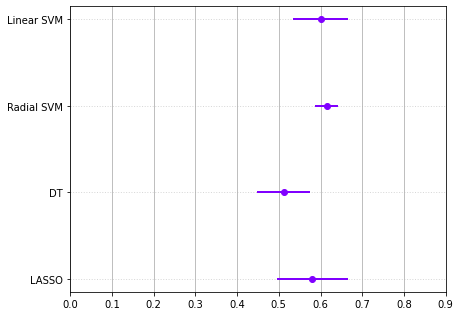

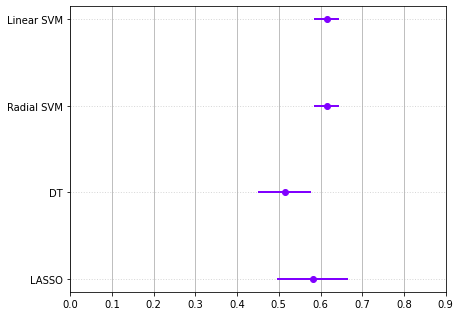

In [ ]:
#PINTAMOS GRÁFICAS PARA VARIABLES NORMALIZADAS CON STANDARD SCALER PARA ACCURACY Y ROC

plot_mean_std_metric(df_acc_scaler, lims=(0, 0.9), metric_name='',title_figure='', flag_save_figure=True)

plot_mean_std_metric(df_roc_scaler, lims=(0, 0.9), metric_name='',title_figure='', flag_save_figure=True)


In [ ]:

model_scaler=['regresión_logistica', 'árbol', 'knn','svc','svc_lineal','mlp']
mean_scaler=[np.mean(accuracy_reg_scaler), np.mean(accuracy_arbol_scaler),np.mean(accuracy_knn_scaler),np.mean(accuracy_svc_scaler),np.mean(accuracy_svc_lin_scaler),np.mean(accuracy_mlp_lin_scaler)]
std_scaler=[np.std(accuracy_reg_scaler), np.std(accuracy_arbol_scaler),np.std(accuracy_knn_scaler),np.std(accuracy_svc_scaler),np.std(accuracy_svc_lin_scaler),np.std(accuracy_mlp_lin_scaler)]

df_acc_scaler= pd.DataFrame()
df_acc_scaler['model'] = None
df_acc_scaler['mean'] = None
df_acc_scaler['std'] = None


df_acc_scaler['model'] = model_scaler
df_acc_scaler['mean'] = mean_scaler
df_acc_scaler['std'] = std_scaler


In [ ]:
df_acc_scaler

,model,mean,std
0,regresión_logistica,0.603659,0.039984
1,árbol,0.536585,0.017247
2,knn,0.597561,0.012195
3,svc,0.621951,0.027269
4,svc_lineal,0.615854,0.026579
5,mlp,0.573171,0.043970


In [ ]:
model2_scaler=['regresión_logistica', 'árbol', 'knn','svc', 'svc_lineal','mlp']
mean2_scaler=[np.mean(roc_reg_scaler), np.mean(roc_arbol_scaler),np.mean(roc_knn_scaler),np.mean(roc_svc_scaler),np.mean(roc_svc_lin_scaler),np.mean(roc_mlp_lin_scaler)]
std2_scaler=[np.std(roc_reg_scaler), np.std(roc_arbol_scaler),np.std(roc_knn_scaler),np.std(roc_svc_scaler),np.std(roc_svc_lin_scaler),np.std(roc_mlp_lin_scaler)]

df_roc_scaler= pd.DataFrame()
df_roc_scaler['model'] = None
df_roc_scaler['mean'] = None
df_roc_scaler['std'] = None


df_roc_scaler['model'] = model2_scaler
df_roc_scaler['mean'] = mean2_scaler
df_roc_scaler['std'] = std2_scaler


In [ ]:
model3_scaler=['regresión_logistica', 'árbol', 'knn','svc', 'svc_lineal','mlp']
mean3_scaler=[np.mean(recall_reg_scaler), np.mean(recall_arbol_scaler),np.mean(recall_knn_scaler),np.mean(recall_svc_scaler),np.mean(recall_svc_lin_scaler),np.mean(recall_mlp_lin_scaler)]
std3_scaler=[np.std(recall_reg_scaler), np.std(recall_arbol_scaler),np.std(recall_knn_scaler),np.std(recall_svc_scaler),np.std(recall_svc_lin_scaler),np.std(recall_mlp_lin_scaler)]

df_recall_scaler= pd.DataFrame()
df_recall_scaler['model'] = None
df_recall_scaler['mean'] = None
df_recall_scaler['std'] = None


df_recall_scaler['model'] = model3_scaler
df_recall_scaler['mean'] = mean3_scaler
df_recall_scaler['std'] = std3_scaler

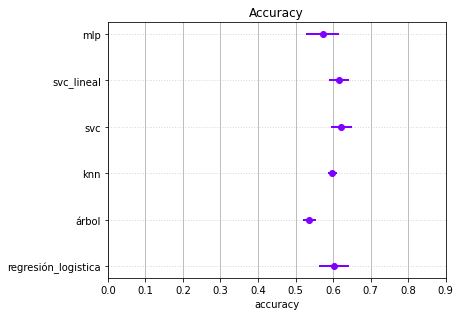

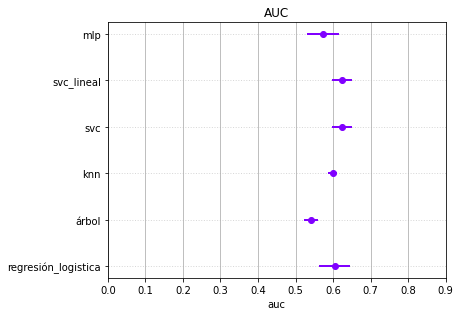

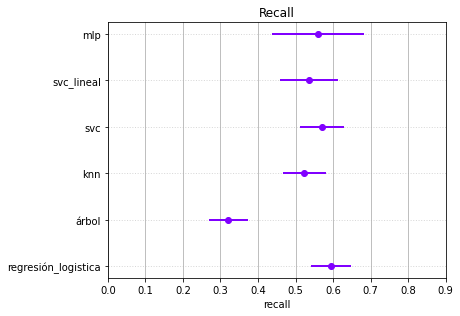

In [ ]:

#PINTAMOS GRÁFICAS PARA VARIABLES NORMALIZADAS CON STANDARD SCALER PARA ACCURACY Y ROC

plot_mean_std_metric(df_acc_scaler, lims=(0, 0.9), metric_name='accuracy',title_figure='Accuracy', flag_save_figure=True)

plot_mean_std_metric(df_roc_scaler, lims=(0, 0.9), metric_name='auc',title_figure='AUC', flag_save_figure=True)

plot_mean_std_metric(df_recall_scaler, lims=(0, 0.9), metric_name='recall',title_figure='Recall', flag_save_figure=True)


In [ ]:
model_scaler=['regresión_logistica', 'árbol', 'knn','svc','svc_lineal']
mean_scaler=[np.mean(accuracy_reg_scaler), np.mean(accuracy_arbol_scaler),np.mean(accuracy_knn_scaler),np.mean(accuracy_svc_scaler),np.mean(accuracy_svc_lin_scaler)]
std_scaler=[np.std(accuracy_reg_scaler), np.std(accuracy_arbol_scaler),np.std(accuracy_knn_scaler),np.std(accuracy_svc_scaler),np.std(accuracy_svc_lin_scaler)]

df_acc_scaler= pd.DataFrame()
df_acc_scaler['model'] = None
df_acc_scaler['mean'] = None
df_acc_scaler['std'] = None


df_acc_scaler['model'] = model_scaler
df_acc_scaler['mean'] = mean_scaler
df_acc_scaler['std'] = std_scaler

In [ ]:
results = pd.DataFrame()
accuracy_scaler_ec=[]
accuracy_scaler_ec.append([np.mean(accuracy_reg_scaler), np.mean(accuracy_arbol_scaler),np.mean(accuracy_knn_scaler),np.mean(accuracy_svc_scaler),np.mean(accuracy_svc_lin_scaler)])
recall_ec=[]
recall_ec.append([np.mean(recall_reg_scaler), np.mean(recall_arbol_scaler),np.mean(recall_knn_scaler),np.mean(recall_svc_scaler),np.mean(recall_svc_lin_scaler)])
f1_scaler_ec=[]
f1_scaler_ec.append([np.mean(f1_reg_scaler), np.mean(f1_arbol_scaler),np.mean(f1_knn_scaler),np.mean(f1_svc_scaler),np.mean(f1_svc_lin_scaler)])
roc_scaler_ec=[]
roc_scaler_ec.append([np.mean(roc_reg_scaler), np.mean(roc_arbol_scaler),np.mean(roc_knn_scaler),np.mean(roc_svc_scaler),np.mean(roc_svc_lin_scaler)])
precision_scaler_ec=[]
precision_scaler_ec.append([np.mean(precision_reg_scaler), np.mean(precision_arbol_scaler),np.mean(precision_knn_scaler),np.mean(precision_svc_scaler),np.mean(precision_svc_lin_scaler)])

results["Accuracy"]=accuracy_scaler_ec[0]
results["Recall"]=recall_ec[0]
results["F1-score"]=f1_scaler_ec[0]
results["Auc"]=roc_scaler_ec[0]
results["Precision"]=precision_scaler_ec[0]

#results
results["Modelos"] = ["Regresión logística","árbol", "Knn","SVC","SVC-lineal"]
results.set_index("Modelos", inplace = True)

In [ ]:
results

,Accuracy,Recall,F1-score,Auc,Precision
Modelos,,,,,
Regresión logística,0.595122,0.561905,0.584589,0.595952,0.617673
árbol,0.546341,0.333333,0.427173,0.551667,0.608939
Knn,0.585366,0.485714,0.540568,0.587857,0.620966
SVC,0.595122,0.533333,0.571507,0.596667,0.618301
SVC-lineal,0.614634,0.514286,0.574258,0.596667,0.660684


# ***Feature selection***

In [ ]:
# Creamos x (input) e y (output)
X = data.loc[:, data.columns != 'BCaseControlStatus']
Y = data["BCaseControlStatus"]

X.shape, Y.shape

((201, 51), (201,))

In [ ]:
X

,BGVisit1,HopVerbCompDaysFromEnroll,HopVerbTr1TotCorr,HopVerbTr2TotCorr,HopVerbTr3TotCorr,HopVerbTr4TotCorr,HopVerbNumHits,HopVerbSemRelErr,HopVerbSemUnRelErr,HopVerbNumFalPosErr,...,ReadCardLowLine_20/125,ReadCardLowLine_20/16,ReadCardLowLine_20/20,ReadCardLowLine_20/200,ReadCardLowLine_20/25,ReadCardLowLine_20/32,ReadCardLowLine_20/40,ReadCardLowLine_20/50,ReadCardLowLine_20/63,ReadCardLowLine_20/80
0,15500.0,7.0,5.0,7.0,7.0,8.0,12.0,1.0,0.0,1.0,...,0,0,0,0,0,1,0,0,0,0
1,34800.0,18.0,4.0,6.0,6.0,7.0,11.0,1.0,0.0,1.0,...,0,0,0,0,0,0,0,0,1,0
2,13400.0,7.0,6.0,8.0,9.0,6.0,11.0,2.0,0.0,2.0,...,0,0,0,0,0,1,0,0,0,0
3,26700.0,24.0,5.0,6.0,7.0,5.0,12.0,1.0,0.0,1.0,...,0,0,1,0,0,0,0,0,0,0
4,10900.0,0.0,3.0,4.0,4.0,2.0,10.0,4.0,0.0,2.0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,8700.0,0.0,5.0,5.0,6.0,3.0,9.0,1.0,0.0,1.0,...,0,0,0,0,0,0,0,1,0,0
197,43900.0,0.0,6.0,8.0,8.0,7.0,10.0,1.0,0.0,1.0,...,0,0,0,0,0,0,0,1,0,0
198,20200.0,0.0,7.0,7.0,8.0,9.0,11.0,2.0,0.0,2.0,...,0,0,0,0,0,0,0,1,0,0
199,37800.0,0.0,9.0,10.0,11.0,0.0,12.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

X_train, X_test, Y_train, Y_test = train_test_split(X, Y,stratify=Y,test_size=0.2, random_state=3)

In [ ]:
from statistics import mode

for i in X_train:
  try:
    X_train[i].replace(np.nan, mode(X_train[i]), inplace=True)
    X_test[i].replace(np.nan, mode(X_train[i]), inplace=True)
  except:
    print(i)


SymbDigWTotCorr
SymbDigOTotCorr
TrailMakBTotTime
BGVisit2


A continuación, imputaremos los valores NaN de las variables categóricas calculando la moda  del conjunto de 
train y aplicacándolos tanto al conjunto de train como al conjunto de test:

In [ ]:
X_train.isna().sum()

AttributeError: ignored

,BGVisit1,HopVerbCompDaysFromEnroll,HopVerbTr1TotCorr,HopVerbTr2TotCorr,HopVerbTr3TotCorr,HopVerbTr4TotCorr,HopVerbNumHits,HopVerbSemRelErr,HopVerbSemUnRelErr,HopVerbNumFalPosErr,...,ReadCardLowLine_20/125,ReadCardLowLine_20/16,ReadCardLowLine_20/20,ReadCardLowLine_20/200,ReadCardLowLine_20/25,ReadCardLowLine_20/32,ReadCardLowLine_20/40,ReadCardLowLine_20/50,ReadCardLowLine_20/63,ReadCardLowLine_20/80
0,15500.0,7.0,5.0,7.0,7.0,8.0,12.0,1.0,0.0,1.0,...,0,0,0,0,0,1,0,0,0,0
1,34800.0,18.0,4.0,6.0,6.0,7.0,11.0,1.0,0.0,1.0,...,0,0,0,0,0,0,0,0,1,0
2,13400.0,7.0,6.0,8.0,9.0,6.0,11.0,2.0,0.0,2.0,...,0,0,0,0,0,1,0,0,0,0
3,26700.0,24.0,5.0,6.0,7.0,5.0,12.0,1.0,0.0,1.0,...,0,0,1,0,0,0,0,0,0,0
4,10900.0,0.0,3.0,4.0,4.0,2.0,10.0,4.0,0.0,2.0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,8700.0,0.0,5.0,5.0,6.0,3.0,9.0,1.0,0.0,1.0,...,0,0,0,0,0,0,0,1,0,0
197,43900.0,0.0,6.0,8.0,8.0,7.0,10.0,1.0,0.0,1.0,...,0,0,0,0,0,0,0,1,0,0
198,20200.0,0.0,7.0,7.0,8.0,9.0,11.0,2.0,0.0,2.0,...,0,0,0,0,0,0,0,1,0,0
199,37800.0,0.0,9.0,10.0,11.0,0.0,12.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0


# ***Sustitución de las variables numéricas a partir de Knn imputer***

>1 0.535 (0.121)
>3 0.546 (0.115)
>5 0.529 (0.089)
>7 0.529 (0.105)
>9 0.533 (0.122)
>15 0.540 (0.121)
>18 0.537 (0.100)
>21 0.523 (0.112)


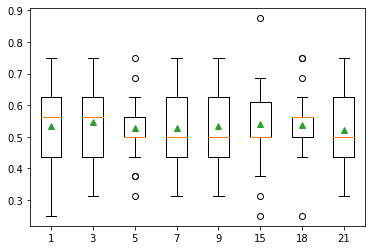

In [ ]:

from numpy import mean
from numpy import std
from pandas import read_csv
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import KNNImputer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from matplotlib import pyplot

# evaluate each strategy on the dataset
results = list()
strategies = [str(i) for i in [1,3,5,7,9,15,18,21]]
for s in strategies:
	# create the modeling pipeline
	pipeline = Pipeline(steps=[('i', KNNImputer(n_neighbors=int(s))), ('m', RandomForestClassifier())])
	# evaluate the model
	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)
	scores = cross_val_score(pipeline, X_train, Y_train, scoring='accuracy', cv=cv, n_jobs=-1)
	# store results
	results.append(scores)
	print('>%s %.3f (%.3f)' % (s, mean(scores), std(scores)))
# plot model performance for comparison
pyplot.boxplot(results, labels=strategies, showmeans=True)
pyplot.show()

In [ ]:
from numpy import isnan
from pandas import read_csv
from sklearn.impute import KNNImputer

# define imputer
imputer = KNNImputer(n_neighbors=3, weights='uniform', metric='nan_euclidean')

imputer.fit(X_train)

# transform the dataset
X_train = imputer.transform(X_train)

# print total missing
print('Missing: %d' % sum(isnan(X_train).flatten()))


Missing: 0


In [ ]:
X_test=imputer.transform(X_test)


In [ ]:
print('Missing: %d' % sum(isnan(X_test).flatten()))


Missing: 0


In [ ]:
X_train_numerical=X_train[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,40]]
X_train_categorical=X_train[:,[21,39,41,42,43,44,45,46,47,48,49,50]]
X_test_numerical=X_test[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,40]]
X_test_categorical=X_test[:,[21,39,41,42,43,44,45,46,47,48,49,50]]

In [ ]:
#CON MIN-MAX

from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing

scaler = preprocessing.MinMaxScaler().fit(X_train_numerical)
X_scaler_train_numerical = scaler.transform(X_train_numerical) 
X_scaler_test_numerical=scaler.transform(X_test_numerical)

In [ ]:
X_train_scaler_all=np.c_[X_scaler_train_numerical,X_train_categorical]
X_test_scaler_all=np.c_[X_scaler_test_numerical,X_test_categorical]


In [ ]:
X_train_scaler_all.shape

(160, 51)

# ***Feature selection***

# ***Métodos *embedded****

('BGVisit1', 0.02290382716212168)
('HopVerbCompDaysFromEnroll', 0.008039609245605322)
('HopVerbTr1TotCorr', 0.02635919829635621)
('HopVerbTr2TotCorr', 0.027232173661340568)
('HopVerbTr3TotCorr', 0.023861837742170485)
('HopVerbTr4TotCorr', 0.022074950414375495)
('HopVerbNumHits', 0.01787695089554619)
('HopVerbSemRelErr', 0.017879184947920557)
('HopVerbSemUnRelErr', 0.0049562116755251595)
('HopVerbNumFalPosErr', 0.019251464254977226)
('HopVerbNumIntr', 0.03372565894930591)
('SymbDigCompDaysFromEnroll', 0.013483429872000902)
('SymbDigWTotCorr', 0.031111501083807846)
('SymbDigWNumErr', 0.041182085910113235)
('SymbDigOTotCorr', 0.028709197546442567)
('SymbDigONumErr', 0.022884239343729525)
('TrailMakCompDaysFromEnroll', 0.012639646022162644)
('TrailMakATotTime', 0.030504667500528743)
('TrailMakANumErr', 0.016610365170338263)
('TrailMakBTotTime', 0.036410080998440376)
('TrailMakBNumErr', 0.01752726685194177)
('GrPegDomHand', 0.008907456726134513)
('GrPegCompDaysFromEnroll', 0.026257463624120

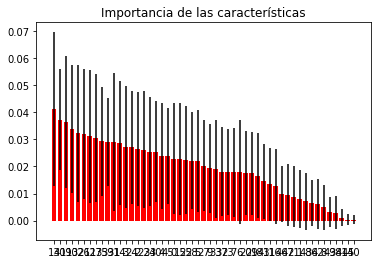

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

# Creamos un bosque aleatorio de árboles de clasificación
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

# Como en árboles, no es necesario que las características estén normalizadas
# Trabajamos, por tanto, con X_train y X_test (no con las versiones estandarizadas)

forest.fit(X_train_scaler_all, Y_train)

for feature in zip(feat_labels, forest.feature_importances_):
    print(feature)
    
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Muestra el ranking en el ordenamiento
print("Ranking de Características:")

for f in range(X_train_scaler_all.shape[1]):
  print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Importancia de las características")
plt.bar(range(X_train_scaler_all.shape[1]), importances[indices],
        color="r", yerr=std[indices], align="center")
plt.xticks(range(X_train_scaler_all.shape[1]), indices)
plt.figsize=(60,5)
# plt.xlim([-1, X_train_scaler_all.shape[1]])
plt.show()

In [ ]:
# Create a selector object that will use the random forest classifier to identify
# features that have an importance of more than 0.15
sfm = SelectFromModel(forest, threshold=0.03)

# Train the selector
sfm.fit(X_train_scaler_all, Y_train)

SelectFromModel(estimator=ExtraTreesClassifier(n_estimators=250,
                                               random_state=0),
                threshold=0.03)

In [ ]:
# Print the names of the most important features
for feature_list_index in sfm.get_support(indices=True):
    print(feat_labels[feature_list_index])

HopVerbNumIntr
SymbDigWTotCorr
SymbDigWNumErr
TrailMakATotTime
TrailMakBTotTime
GrPegNonNumDrops
DukeSocSatScore
ReadCardOthVisAid


In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all[:,[13,40,19,10,32,26,12,17]]
X_test_ec = X_test_scaler_all[:,[13,40,19,10,32,26,12,17]]


In [ ]:
X_train.isna().sum()

AttributeError: ignored

A continuación, evaluamos los distintos modelos con únicamente las características seleccionadas:

In [ ]:
recall_ec=[]
accuracy_scaler_ec=[]
precision_scaler_ec=[]
f1_scaler_ec=[]
roc_scaler_ec=[]

Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l2'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.637
0.4634146341463415
[[11  9]
 [13  8]]
Sensibilidad, Accuracy, precision, f1-score 0.38095238095238093 0.4634146341463415 0.47058823529411764 0.42105263157894735


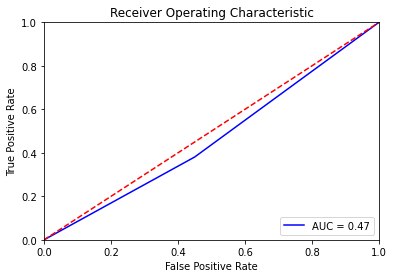

{'max_depth': 7}


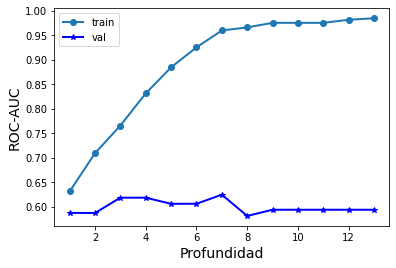

Mejor ROC-AUC en validación cruzada: 0.625
Mejor valor del hiperparámetro: {'max_depth': 7}
0.43902439024390244
[[10 10]
 [13  8]]
Sensibilidad, Accuracy, precision, f1-score 0.38095238095238093 0.43902439024390244 0.4444444444444444 0.41025641025641024


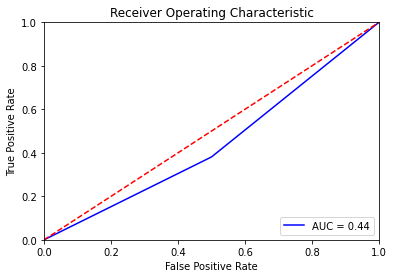

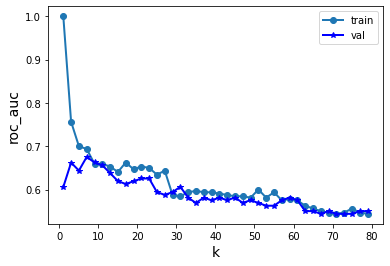

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.675
Valor correspondiente para el hiperparámetro: {'n_neighbors': 7}
0.5609756097560976
[[12  8]
 [10 11]]
Sensibilidad, Accuracy, precision, f1-score 0.5238095238095238 0.5609756097560976 0.5789473684210527 0.5500000000000002


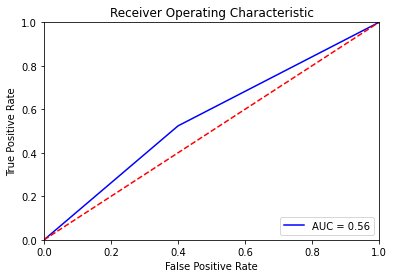

Valor correspondiente para el hiperparámetro: {'C': 25, 'gamma': 0.01, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.644
0.5121951219512195
[[14  6]
 [14  7]]
Sensibilidad, Accuracy, precision, f1-score 0.3333333333333333 0.5121951219512195 0.5384615384615384 0.41176470588235287


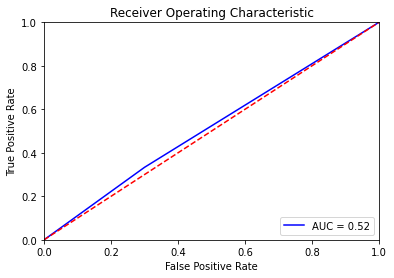

Valor correspondiente para el hiperparámetro: {'C': 10, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.606
0.4634146341463415
[[11  9]
 [13  8]]
Sensibilidad, Accuracy, precision, f1-score 0.38095238095238093 0.4634146341463415 0.47058823529411764 0.42105263157894735


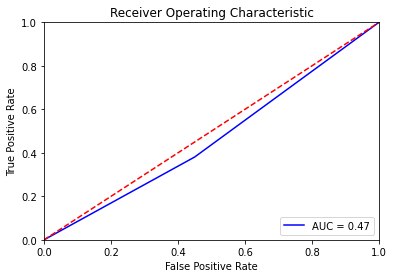

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train,Y_test,3)
recall_ec.append(r[0])
accuracy_scaler_ec.append(r[1])
precision_scaler_ec.append(r[2])
f1_scaler_ec.append(r[3])
roc_scaler_ec.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train,Y_test,3)
recall_ec.append(a[0])
accuracy_scaler_ec.append(a[1])
precision_scaler_ec.append(a[2])
f1_scaler_ec.append(a[3])
roc_scaler_ec.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train,Y_test)
recall_ec.append(k[0])
accuracy_scaler_ec.append(k[1])
precision_scaler_ec.append(k[2])
f1_scaler_ec.append(k[3])
roc_scaler_ec.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train,Y_test,3)
recall_ec.append(s[0])
accuracy_scaler_ec.append(s[1])
precision_scaler_ec.append(s[2])
f1_scaler_ec.append(s[3])
roc_scaler_ec.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train,Y_test,3)
recall_ec.append(sl[0])
accuracy_scaler_ec.append(sl[1])
precision_scaler_ec.append(sl[2])
f1_scaler_ec.append(sl[3])
roc_scaler_ec.append(s[4])


In [ ]:
results = pd.DataFrame()

results["Accuracy"]=accuracy_scaler_ec
results["Recall"]=recall_ec
results["F1-score"]=f1_scaler_ec
results["Auc"]=roc_scaler_ec
results["Precision"]=precision_scaler_ec

#results
results["Modelos"] = ["Regresión logística","árbol", "Knn","SVC","SVC-lineal"]
results.set_index("Modelos", inplace = True)

In [ ]:
results

,Accuracy,Recall,F1-score,Auc,Precision
Modelos,,,,,
Regresión logística,0.463415,0.380952,0.421053,0.465476,0.470588
árbol,0.439024,0.380952,0.410256,0.440476,0.444444
Knn,0.560976,0.523810,0.550000,0.561905,0.578947
SVC,0.512195,0.333333,0.411765,0.516667,0.538462
SVC-lineal,0.463415,0.380952,0.421053,0.516667,0.470588


# ***Método filter***

A continuación, a partir de validación cruzada con 3 folds, obtenemos el fold1, fold2 y fold3:

In [ ]:
# Convertimos el objeto dataframe en un array (mayor velocidad de cómputo)
# # array = data.values
X_train_scaler_all=np.array(X_train_scaler_all)
X_test_scaler_all=np.array(X_test_scaler_all)
Y_train=(np.array(Y_train))
Y_test=np.array(Y_test)
# # Separamos en variables de entrada al modelo (8 primeras) y de salida (1 variable) 
# X = array[:,1:59]
# Y = array[:,0]

names=[]
for i in range(19):
  names.append(str(i))
# names = ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11','f12','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13']
# names = data.columns[1:]
names

['0',
 '1',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18']

In [ ]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=3)  # In this case, k=3, 

for train, val in kf.split(X_train_scaler_all):
  # print("%s %s" % (train, val))
  # print(len(val))
  # print(val)
  if (len(val)==53) and (val[0]==107):
    fold3=list(val)
    print(len(fold3))
    print(fold3)
  if (len(val)==54):
    fold1=list(val)
    print(len(fold1))
    print(fold1)
  if (len(val)==53) and (val[0]==54):
    fold2=list(val)
    print(len(fold2))
    print(fold2)

54
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
53
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
53
[107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159]


# ***COMBINACIÓN PRIMERA***


En esta primera combinación utilizaremos fold1 y fold2 para entrenar, y fold3 para validar:

In [ ]:
X_entrenamiento=np.concatenate((X_train_scaler_all[fold1], X_train_scaler_all[fold2]))
Y_entrenamiento=np.concatenate((Y_train[fold1], Y_train[fold2]))
X_val=X_train_scaler_all[fold3]
Y_val=Y_train[fold3]

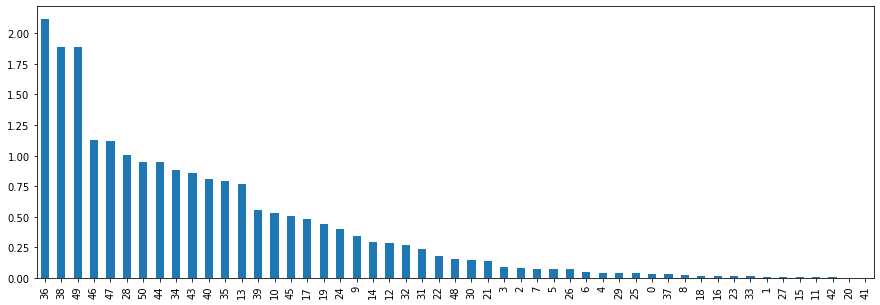

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif

bestfeatures_Chi2 = SelectKBest(score_func=chi2, k='all')
fit_Chi2 = bestfeatures_Chi2.fit(X_entrenamiento, Y_entrenamiento)
fit_Chi2 = pd.Series(fit_Chi2.scores_)
fit_Chi2.sort_values(ascending=False)

fit_Chi2.sort_values(ascending=False).plot.bar(figsize=(15, 5))

# # gráfico de barras utilizando matplotlib
# df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2.scores_})
# ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0, figsize=(5,5))
# # df, ax = plt.subplots(figsize=(50, 8))
# plt.title("Chi2 considerando subconjunto X train")

# ***COMBINACIÓN 2***

En esta combinación usaremos fold1 y fold3 para entrenar y usaremos fold 2 para validar:

In [ ]:
X_entrenamiento2=np.concatenate((X_train_scaler_all[fold1], X_train_scaler_all[fold3]))
Y_entrenamiento2=np.concatenate((Y_train[fold1], Y_train[fold3]))
X_val2=X_train_scaler_all[fold2]
Y_val2=Y_train[fold2]

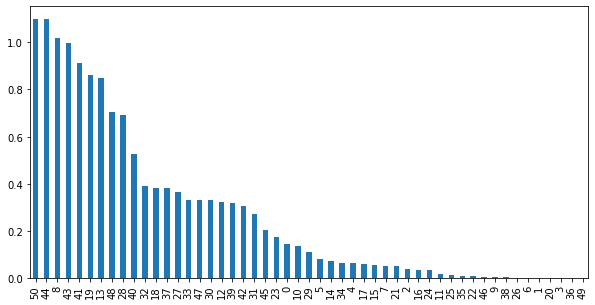

In [ ]:
bestfeatures_Chi2_2 = SelectKBest(score_func=chi2, k='all')
fit_Chi2_2 = bestfeatures_Chi2_2.fit(X_entrenamiento2, Y_entrenamiento2)
fit_Chi2_2 = pd.Series(fit_Chi2_2.scores_)
fit_Chi2_2.sort_values(ascending=False)

fit_Chi2_2.sort_values(ascending=False).plot.bar(figsize=(10, 5))

# # gráfico de barras utilizando matplotlib
# df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2_2.scores_.sort_values})
# ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0,figsize=(50,8))
# plt.title("Estadístico chi cuadrado considerando subconjunto X train")

# ***COMBINACIÓN 3***

En este último caso, utilizaremos el fold 2 y fold3 para entrenar y el fold 1 para validar:

In [ ]:
X_entrenamiento3=np.concatenate((X_train_scaler_all[fold2], X_train_scaler_all[fold3]))
Y_entrenamiento3=np.concatenate((Y_train[fold2], Y_train[fold3]))
X_val3=X_train_scaler_all[fold1]
Y_val3=Y_train[fold1]

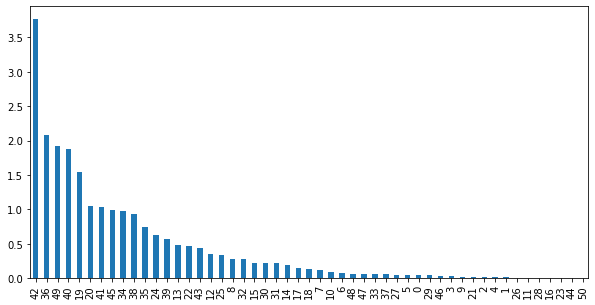

In [ ]:
bestfeatures_Chi2_3 = SelectKBest(score_func=chi2, k='all')
fit_Chi2_3 = bestfeatures_Chi2_3.fit(X_entrenamiento3, Y_entrenamiento3)
fit_Chi2_3 = pd.Series(fit_Chi2_3.scores_)
fit_Chi2_3.sort_values(ascending=False)

fit_Chi2_3.sort_values(ascending=False).plot.bar(figsize=(10, 5))
# gráfico de barras utilizando matplotlib
# df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2_3.scores_})
# ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0, figsize=(50,8))
# plt.title("Estadístico chi cuadrado considerando subconjunto X train")

TypeError: ignored

* MoCADelRec
* MoCAAtt2
* MoCAVisEx

In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all[:,[36,49,19]]
X_test_ec = X_test_scaler_all[:,[36,40,19]]


In [ ]:
X.iloc[:, 19]

0      164.0
1        NaN
2      134.0
3       95.0
4        NaN
       ...  
196    269.0
197    101.0
198    225.0
199     61.0
200     74.0
Name: TrailMakBTotTime, Length: 201, dtype: float64

* FrailtySecWalkTotTimeSec
* ReadCardLowLine_20/63
* TrailMakBTotTime

A continuación, evaluamos los distintos modelos con únicamente las características seleccionadas:

In [ ]:
recall_ec=[]
accuracy_scaler_ec=[]
precision_scaler_ec=[]
f1_scaler_ec=[]
roc_scaler_ec=[]

Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.619
0.5121951219512195
[[13  7]
 [13  8]]
Sensibilidad, Accuracy, precision, f1-score 0.38095238095238093 0.5121951219512195 0.5333333333333333 0.4444444444444444


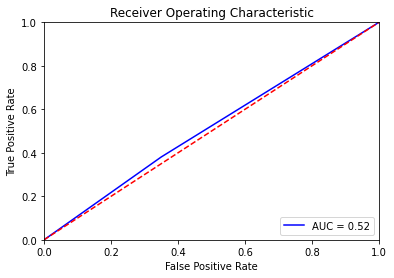

{'max_depth': 1}


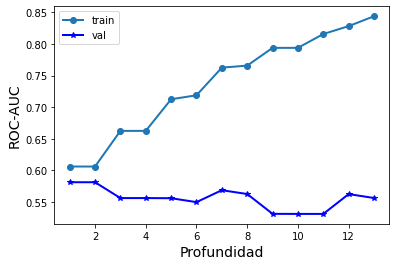

Mejor ROC-AUC en validación cruzada: 0.581
Mejor valor del hiperparámetro: {'max_depth': 1}
0.5609756097560976
[[20  0]
 [18  3]]
Sensibilidad, Accuracy, precision, f1-score 0.14285714285714285 0.5609756097560976 1.0 0.25


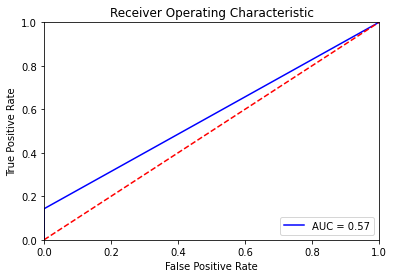

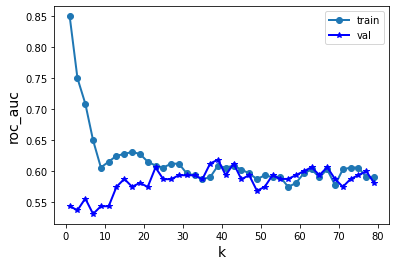

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.619
Valor correspondiente para el hiperparámetro: {'n_neighbors': 39}
0.5853658536585366
[[12  8]
 [ 9 12]]
Sensibilidad, Accuracy, precision, f1-score 0.5714285714285714 0.5853658536585366 0.6 0.5853658536585366


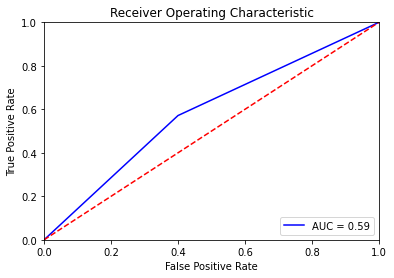

Valor correspondiente para el hiperparámetro: {'C': 1000, 'gamma': 0.01, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.588
0.5853658536585366
[[ 6 14]
 [ 3 18]]
Sensibilidad, Accuracy, precision, f1-score 0.8571428571428571 0.5853658536585366 0.5625 0.6792452830188678


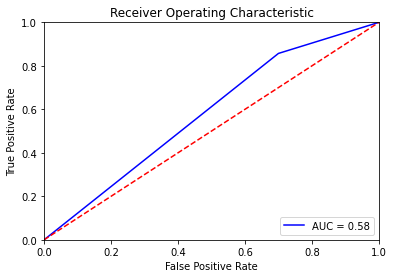

Valor correspondiente para el hiperparámetro: {'C': 1000, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.594
0.5853658536585366
[[ 6 14]
 [ 3 18]]
Sensibilidad, Accuracy, precision, f1-score 0.8571428571428571 0.5853658536585366 0.5625 0.6792452830188678


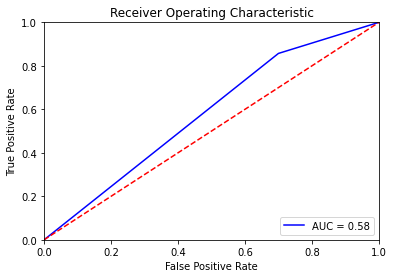

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train,Y_test,3)
recall_ec.append(r[0])
accuracy_scaler_ec.append(r[1])
precision_scaler_ec.append(r[2])
f1_scaler_ec.append(r[3])
roc_scaler_ec.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train,Y_test,3)
recall_ec.append(a[0])
accuracy_scaler_ec.append(a[1])
precision_scaler_ec.append(a[2])
f1_scaler_ec.append(a[3])
roc_scaler_ec.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train,Y_test)
recall_ec.append(k[0])
accuracy_scaler_ec.append(k[1])
precision_scaler_ec.append(k[2])
f1_scaler_ec.append(k[3])
roc_scaler_ec.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train,Y_test,3)
recall_ec.append(s[0])
accuracy_scaler_ec.append(s[1])
precision_scaler_ec.append(s[2])
f1_scaler_ec.append(s[3])
roc_scaler_ec.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train,Y_test,3)
recall_ec.append(sl[0])
accuracy_scaler_ec.append(sl[1])
precision_scaler_ec.append(sl[2])
f1_scaler_ec.append(sl[3])
roc_scaler_ec.append(s[4])


In [ ]:
results = pd.DataFrame()

results["Accuracy"]=accuracy_scaler_ec
results["Recall"]=recall_ec
results["F1-score"]=f1_scaler_ec
results["Auc"]=roc_scaler_ec
results["Precision"]=precision_scaler_ec

#results
results["Modelos"] = ["Regresión logística","árbol", "Knn","SVC","SVC-lineal"]
results.set_index("Modelos", inplace = True)

In [ ]:
results

,Accuracy,Recall,F1-score,Auc,Precision
Modelos,,,,,
Regresión logística,0.512195,0.380952,0.444444,0.515476,0.533333
árbol,0.560976,0.142857,0.250000,0.571429,1.000000
Knn,0.585366,0.571429,0.585366,0.585714,0.600000
SVC,0.585366,0.857143,0.679245,0.578571,0.562500
SVC-lineal,0.585366,0.857143,0.679245,0.578571,0.562500


# ***RANDOM FOREST***

In [ ]:

from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier


In [ ]:
feat_labels=X.columns

('BGVisit1', 0.04170676594461001)
('HopVerbCompDaysFromEnroll', 0.0062235713810870445)
('HopVerbTr1TotCorr', 0.027784832774179476)
('HopVerbTr2TotCorr', 0.02816897477538984)
('HopVerbTr3TotCorr', 0.022864760297341444)
('HopVerbTr4TotCorr', 0.025737169459353247)
('HopVerbNumHits', 0.01226792552194711)
('HopVerbSemRelErr', 0.011443915365347975)
('HopVerbSemUnRelErr', 0.0031674852301890417)
('HopVerbNumFalPosErr', 0.014225538499013085)
('HopVerbNumIntr', 0.03133611456496275)
('SymbDigCompDaysFromEnroll', 0.008484885054759314)
('SymbDigWTotCorr', 0.04948542880215792)
('SymbDigWNumErr', 0.03134197883338718)
('SymbDigOTotCorr', 0.046758739103331275)
('SymbDigONumErr', 0.015424649040324735)
('TrailMakCompDaysFromEnroll', 0.007378351000444696)
('TrailMakATotTime', 0.049427410171224956)
('TrailMakANumErr', 0.006866506036096643)
('TrailMakBTotTime', 0.05776988770090116)
('TrailMakBNumErr', 0.014766447609168502)
('GrPegDomHand', 0.005644918208362147)
('GrPegCompDaysFromEnroll', 0.0463977318440245

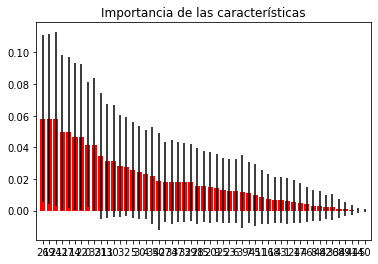

In [ ]:
# Create a random forest classifier
clf = RandomForestClassifier(n_estimators=10000, random_state=0, n_jobs=-1)

# Train the classifier
clf.fit(X_train_scaler_all, Y_train)

# Print the name and gini importance of each feature
for feature in zip(feat_labels, clf.feature_importances_):
    print(feature)

importances = clf.feature_importances_
std = np.std([tree.feature_importances_ for tree in clf.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]
# Muestra el ranking en el ordenamiento
print("Ranking de Características:")

for f in range(X_train_scaler_all.shape[1]):
  print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Importancia de las características")
plt.bar(range(X_train_scaler_all.shape[1]), importances[indices],
        color="r", yerr=std[indices], align="center")
plt.xticks(range(X_train_scaler_all.shape[1]), indices)
plt.xlim([-1, X_train_scaler_all.shape[1]])
plt.show()


In [ ]:
# Create a selector object that will use the random forest classifier to identify
# features that have an importance of more than 0.15
sfm = SelectFromModel(clf, threshold=0.04)

# Train the selector
sfm.fit(X_train_scaler_all, Y_train)

SelectFromModel(estimator=RandomForestClassifier(n_estimators=10000, n_jobs=-1,
                                                 random_state=0),
                threshold=0.04)

In [ ]:
# Print the names of the most important features
for feature_list_index in sfm.get_support(indices=True):
    print(feat_labels[feature_list_index])

BGVisit1
SymbDigWTotCorr
SymbDigOTotCorr
TrailMakATotTime
TrailMakBTotTime
GrPegCompDaysFromEnroll
GrPegDomNumDrops
GrPegNonNumDrops
DukeSocSatScore


In [ ]:
X

,MoCACompDaysFromEnroll,MoCAVisEx,MoCANaming,MoCAAtt1,MoCAAtt2,MoCAAtt3,MoCALang1,MoCALang2,MoCAAbs,MoCADelRec,MoCAOrient,MoCATotal,MoCAPtEff
0,7.0,5.0,3.0,2.0,1.0,3.0,2.0,0.0,2.0,2.0,6.0,26.0,1.0
1,18.0,4.0,2.0,1.0,1.0,3.0,1.0,1.0,2.0,1.0,4.0,21.0,1.0
2,7.0,5.0,3.0,2.0,1.0,3.0,1.0,1.0,2.0,3.0,6.0,27.0,1.0
3,24.0,4.0,3.0,1.0,1.0,2.0,0.0,0.0,1.0,2.0,5.0,20.0,1.0
4,0.0,2.0,2.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,6.0,13.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,0.0,2.0,2.0,2.0,0.0,3.0,1.0,0.0,2.0,3.0,6.0,22.0,1.0
197,0.0,3.0,2.0,2.0,1.0,2.0,1.0,1.0,0.0,4.0,6.0,23.0,1.0
198,0.0,4.0,3.0,2.0,1.0,3.0,1.0,1.0,2.0,2.0,6.0,25.0,1.0
199,0.0,5.0,3.0,2.0,1.0,3.0,2.0,1.0,2.0,3.0,6.0,28.0,1.0


In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_ec = X_train_scaler_all[:,[26,19,24,12,17,14,22,0,32]]
X_test_ec = X_test_scaler_all[:,[26,19,24,12,17,14,22,0,32]]


A continuación, evaluamos los distintos modelos con únicamente las características seleccionadas:

In [ ]:
recall_ec=[]
accuracy_scaler_ec=[]
precision_scaler_ec=[]
f1_scaler_ec=[]
roc_scaler_ec=[]

Valor correspondiente para el hiperparámetro: {'C': 1, 'penalty': 'l1'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.600
0.4634146341463415
[[11  9]
 [13  8]]
Sensibilidad, Accuracy, precision, f1-score 0.38095238095238093 0.4634146341463415 0.47058823529411764 0.42105263157894735


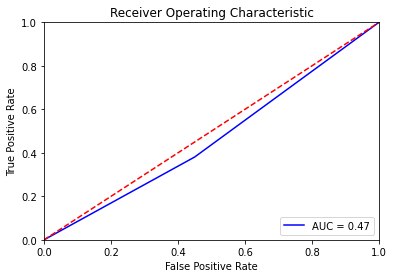

{'max_depth': 4}


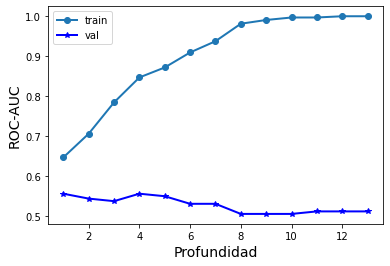

Mejor ROC-AUC en validación cruzada: 0.556
Mejor valor del hiperparámetro: {'max_depth': 4}
0.4878048780487805
[[13  7]
 [14  7]]
Sensibilidad, Accuracy, precision, f1-score 0.3333333333333333 0.4878048780487805 0.5 0.4


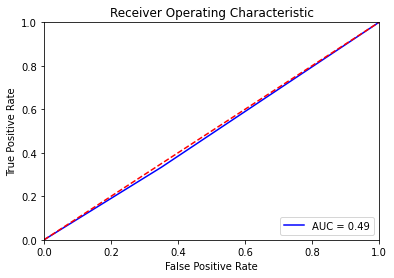

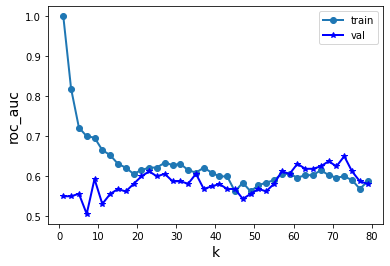

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.650
Valor correspondiente para el hiperparámetro: {'n_neighbors': 73}
0.5365853658536586
[[13  7]
 [12  9]]
Sensibilidad, Accuracy, precision, f1-score 0.42857142857142855 0.5365853658536586 0.5625 0.4864864864864864


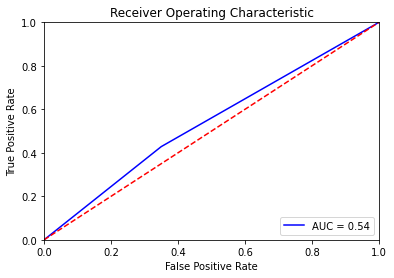

Valor correspondiente para el hiperparámetro: {'C': 25, 'gamma': 0.01, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.606
0.4878048780487805
[[11  9]
 [12  9]]
Sensibilidad, Accuracy, precision, f1-score 0.42857142857142855 0.4878048780487805 0.5 0.4615384615384615


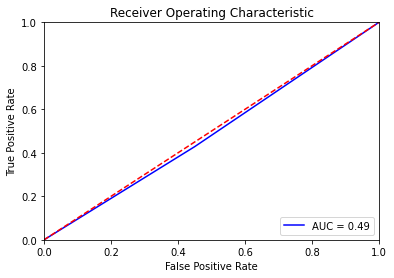

Valor correspondiente para el hiperparámetro: {'C': 0.001, 'gamma': 0.01, 'kernel': 'linear'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.575
0.5853658536585366
[[16  4]
 [13  8]]
Sensibilidad, Accuracy, precision, f1-score 0.38095238095238093 0.5853658536585366 0.6666666666666666 0.4848484848484849


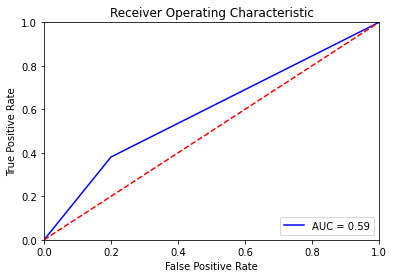

In [ ]:
#VARIABLES NORMALIZADAS CON MIN-MAX

r=regresion_logistica(X_train_ec,X_test_ec,Y_train,Y_test,3)
recall_ec.append(r[0])
accuracy_scaler_ec.append(r[1])
precision_scaler_ec.append(r[2])
f1_scaler_ec.append(r[3])
roc_scaler_ec.append(r[4])

a=decisionTree(X_train_ec,X_test_ec,Y_train,Y_test,3)
recall_ec.append(a[0])
accuracy_scaler_ec.append(a[1])
precision_scaler_ec.append(a[2])
f1_scaler_ec.append(a[3])
roc_scaler_ec.append(a[4])

k=knn(X_train_ec,X_test_ec,Y_train,Y_test)
recall_ec.append(k[0])
accuracy_scaler_ec.append(k[1])
precision_scaler_ec.append(k[2])
f1_scaler_ec.append(k[3])
roc_scaler_ec.append(k[4])

s=svc(X_train_ec,X_test_ec,Y_train,Y_test,3)
recall_ec.append(s[0])
accuracy_scaler_ec.append(s[1])
precision_scaler_ec.append(s[2])
f1_scaler_ec.append(s[3])
roc_scaler_ec.append(s[4])

sl=svc_lineal(X_train_ec,X_test_ec,Y_train,Y_test,3)
recall_ec.append(sl[0])
accuracy_scaler_ec.append(sl[1])
precision_scaler_ec.append(sl[2])
f1_scaler_ec.append(sl[3])
roc_scaler_ec.append(s[4])


In [ ]:
results = pd.DataFrame()

results["Accuracy"]=accuracy_scaler_ec
results["Recall"]=recall_ec
results["F1-score"]=f1_scaler_ec
results["Auc"]=roc_scaler_ec
results["Precision"]=precision_scaler_ec

#results
results["Modelos"] = ["Regresión logística","árbol", "Knn","SVC","SVC-lineal"]
results.set_index("Modelos", inplace = True)

In [ ]:
results

,Accuracy,Recall,F1-score,Auc,Precision
Modelos,,,,,
Regresión logística,0.463415,0.380952,0.421053,0.465476,0.470588
árbol,0.487805,0.333333,0.400000,0.491667,0.500000
Knn,0.536585,0.428571,0.486486,0.539286,0.562500
SVC,0.487805,0.428571,0.461538,0.489286,0.500000
SVC-lineal,0.585366,0.380952,0.484848,0.489286,0.666667


# ***División en train y test***

# ***CLASIFICACIÓN***

# ***REGRESIÓN LOGÍSTICA CON REGULARIZACIÓN***

In [ ]:
X = data.loc[:, data.columns != 'BCaseControlStatus']
Y= data["BCaseControlStatus"]

X.shape, Y.shape

((201, 58), (201,))

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

X_train, X_test, Y_train, Y_test = train_test_split(X, Y,test_size=0.2, random_state=0)

In [ ]:
print(X_train.shape, X_test.shape)

(160, 58) (41, 58)


In [ ]:
X_train.isna().sum()

BGVisit1                       1
HopVerbCompDaysFromEnroll      0
HopVerbTr1TotCorr              0
HopVerbTr2TotCorr              0
HopVerbTr3TotCorr              0
HopVerbTr4TotCorr              1
HopVerbNumHits                 1
HopVerbSemRelErr               1
HopVerbSemUnRelErr             1
HopVerbNumFalPosErr            1
HopVerbNumIntr                 3
HopVerbPtEff                   1
SymbDigCompDaysFromEnroll      7
SymbDigWTotCorr                8
SymbDigWNumErr                 8
SymbDigOTotCorr                9
SymbDigONumErr                 9
SymbDigOPtEff                 10
TrailMakCompDaysFromEnroll     0
TrailMakATotTime               0
TrailMakANumErr                0
TrailMakBTotTime               4
TrailMakBNumErr                4
TrailMakBPtEff                 9
GrPegDomHand                   2
GrPegCompDaysFromEnroll        2
GrPegDomTotTime                2
GrPegDomNumDrops               2
GrPegDomPtEff                  3
GrPegNonTotTime                4
GrPegNonNu

In [ ]:
X_test.isna().sum()

BGVisit1                      0
HopVerbCompDaysFromEnroll     1
HopVerbTr1TotCorr             1
HopVerbTr2TotCorr             1
HopVerbTr3TotCorr             1
HopVerbTr4TotCorr             1
HopVerbNumHits                1
HopVerbSemRelErr              1
HopVerbSemUnRelErr            1
HopVerbNumFalPosErr           1
HopVerbNumIntr                1
HopVerbPtEff                  2
SymbDigCompDaysFromEnroll     0
SymbDigWTotCorr               0
SymbDigWNumErr                0
SymbDigOTotCorr               0
SymbDigONumErr                0
SymbDigOPtEff                 0
TrailMakCompDaysFromEnroll    0
TrailMakATotTime              0
TrailMakANumErr               0
TrailMakBTotTime              2
TrailMakBNumErr               2
TrailMakBPtEff                3
GrPegDomHand                  0
GrPegCompDaysFromEnroll       0
GrPegDomTotTime               0
GrPegDomNumDrops              0
GrPegDomPtEff                 0
GrPegNonTotTime               0
GrPegNonNumDrops              0
GrPegNon

>1 0.540 (0.105)
>3 0.546 (0.098)
>5 0.535 (0.091)
>7 0.556 (0.089)
>9 0.546 (0.109)
>15 0.567 (0.094)
>18 0.558 (0.112)
>21 0.560 (0.108)


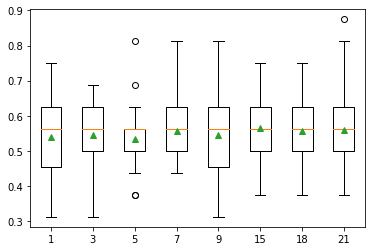

In [ ]:
from numpy import mean
from numpy import std
from pandas import read_csv
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import KNNImputer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from matplotlib import pyplot

# evaluate each strategy on the dataset
results = list()
strategies = [str(i) for i in [1,3,5,7,9,15,18,21]]
for s in strategies:
	# create the modeling pipeline
	pipeline = Pipeline(steps=[('i', KNNImputer(n_neighbors=int(s))), ('m', RandomForestClassifier())])
	# evaluate the model
	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)
	scores = cross_val_score(pipeline, X_train, Y_train, scoring='accuracy', cv=cv, n_jobs=-1)
	# store results
	results.append(scores)
	print('>%s %.3f (%.3f)' % (s, mean(scores), std(scores)))
# plot model performance for comparison
pyplot.boxplot(results, labels=strategies, showmeans=True)
pyplot.show()

In [ ]:
from numpy import isnan
from pandas import read_csv
from sklearn.impute import KNNImputer

# define imputer
imputer = KNNImputer(n_neighbors=3, weights='uniform', metric='nan_euclidean')

imputer.fit(X_train)

# transform the dataset
X_train = imputer.transform(X_train)

# print total missing
print('Missing: %d' % sum(isnan(X_train).flatten()))


Missing: 0


In [ ]:
X_test=imputer.transform(X_test)


In [ ]:
print('Missing: %d' % sum(isnan(X_test).flatten()))


Missing: 0


In [ ]:

from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing


std_all2 = preprocessing.StandardScaler().fit(X_train)
X_std_train2 = std_all2.transform(X_train) #Tendriamos todas las características estandarizadas
X_std_test2 = std_all2.transform(X_test)

In [ ]:
# Regresión logística con regularización 
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection   
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

logreg= LogisticRegression(solver='liblinear')
parameters = {"C":[1e-8,1e-4,10,100],"penalty":["l1","l2"]}# l1 lasso l2 ridge
valor_C=np.array([1e-8,1e-4,10,100])
log_regression=GridSearchCV(logreg, parameters, scoring='roc_auc', cv=5, return_train_score=True)

log_regression.fit(X_std_train2, Y_train) #Entrenamos

# #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
roc_log_train = np.array(log_regression.cv_results_['mean_train_score']) 
roc_loc_val = np.array(log_regression.cv_results_['mean_test_score'])

# #Pintamos la evolución de nuestro modelo tanto en train como en validación para ver cuál es el mejor hiperparámetro para generalizar
# plt.plot(valor_C,roc_log_train,'-o',label="train", linewidth=2)
# plt.plot(valor_C,roc_loc_val,'-*b',label="val", linewidth=2)
# plt.xlabel('C',fontsize=14)
# plt.ylabel('Roc_auc',fontsize=14)
# plt.legend()
# plt.show()

# Mostramos el mejor valor del parámetro y el score
print("Valor correspondiente para el hiperparámetro: {}".format(log_regression.best_params_))
print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(log_regression.best_score_))






Valor correspondiente para el hiperparámetro: {'C': 1e-08, 'penalty': 'l2'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.633


A continuación, ya construimos nuestro modelo con los parámetros obtenidos a partir de validación cruzada y es con un valor de alpha de 0.0001 y un modelo ridge. Así obtenemos los resultados obtenidos en el conjunto de test:

In [ ]:
from sklearn.linear_model import Lasso

logridge=LogisticRegression(solver='liblinear', penalty='l2', C=1e-08)
modelo_rid_log=logridge.fit(X_std_train2, Y_train)

# Obtenemos la salida predicha
y_pred_ridlog = modelo_rid_log.predict(X_std_test2)




A continuación, vamos a calcular diferentes figuras de mérito para ver que resultados obtenemos en test. Comenzamos con la matriz de confusión:

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score

#  Calculamos la matriz de confusión
cm = confusion_matrix(Y_test, y_pred_ridlog)
print(cm)

tn, fp, fn, tp = confusion_matrix(Y_test, y_pred_ridlog).ravel()
print(f'tn: {tn}, fp:{fp}, fn:{fn}, tp:{tp}')

# Calcumos accuracy_score
Accuracy=accuracy_score(Y_test, y_pred_ridlog)
print(f'Accuracy: {Accuracy}')

target_names = ['Paciente control', 'Paciente caso']
print(classification_report(Y_test, y_pred_ridlog, target_names=target_names))
              
#Sensibilidad
Sensibilidad_3 = recall_score(Y_test, y_pred_ridlog)
# S_results.append(Sensibilidad_3)
print(f'Sensibilidad: {Sensibilidad_3}')

[[17  6]
 [11  7]]
tn: 17, fp:6, fn:11, tp:7
Accuracy: 0.5853658536585366
                  precision    recall  f1-score   support

Paciente control       0.61      0.74      0.67        23
   Paciente caso       0.54      0.39      0.45        18

        accuracy                           0.59        41
       macro avg       0.57      0.56      0.56        41
    weighted avg       0.58      0.59      0.57        41

Sensibilidad: 0.3888888888888889


Calculamos la ROC y la AUC:

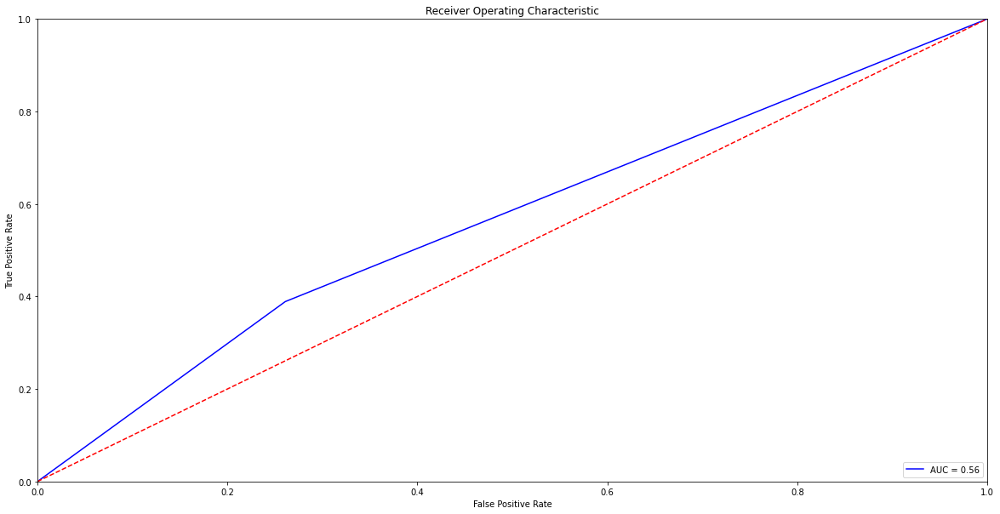

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_pred_ridlog)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

Obtenemos un valor de AUC muy cercano a la curva ROC, por lo que no está haciendo una buena clasificación de los pacientes

In [ ]:
res_accuracy=[]
res_recall=[]
res_f1=[]
res_roc=[]

In [ ]:

A1_score = accuracy_score(Y_test, y_pred_ridlog)
f11_score = f1_score(Y_test, y_pred_ridlog)
r1_score = recall_score(Y_test, y_pred_ridlog)
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_pred_ridlog)
roc_auc_1 = metrics.auc(fpr, tpr)
print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_pred_ridlog))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.5853658536585366
La matriz de confusión obtenida: [[17  6]
 [11  7]]
El valor de f1_score obtenido: 0.45161290322580644
El valor de recall es 0.3888888888888889


In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# **Knn por votación**

In [ ]:

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn import preprocessing
#from mlxtend.plotting import plot_learning_curves

In [ ]:
def knn (figura):
  # 5. Selección del hiper-parámetro haciendo uso del conjunto de diseño con características estandarizadas. 

  param_grid = {'n_neighbors': range(1,41,2)}
  k_grid = np.array(range(1,41,2))
  grid_knn = GridSearchCV(KNeighborsClassifier(), param_grid = param_grid, scoring = figura, cv=3, return_train_score=True)
  grid_knn.fit(X_std_train2, Y_train) 

  #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
  
  auc_knn_all_train = np.array(grid_knn.cv_results_['mean_train_score'])
  auc_knn_all_val = np.array(grid_knn.cv_results_['mean_test_score'])


  plt.plot(k_grid,auc_knn_all_train,'-o',label="train", linewidth=2)
  plt.plot(k_grid,auc_knn_all_val,'-*b',label="val", linewidth=2)
  plt.xlabel('k',fontsize=14)
  plt.ylabel(figura,fontsize=14)
  plt.legend()
  plt.show()

  print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(grid_knn.best_score_))
  print("Valor correspondiente para el hiperparámetro: {}".format(grid_knn.best_params_))

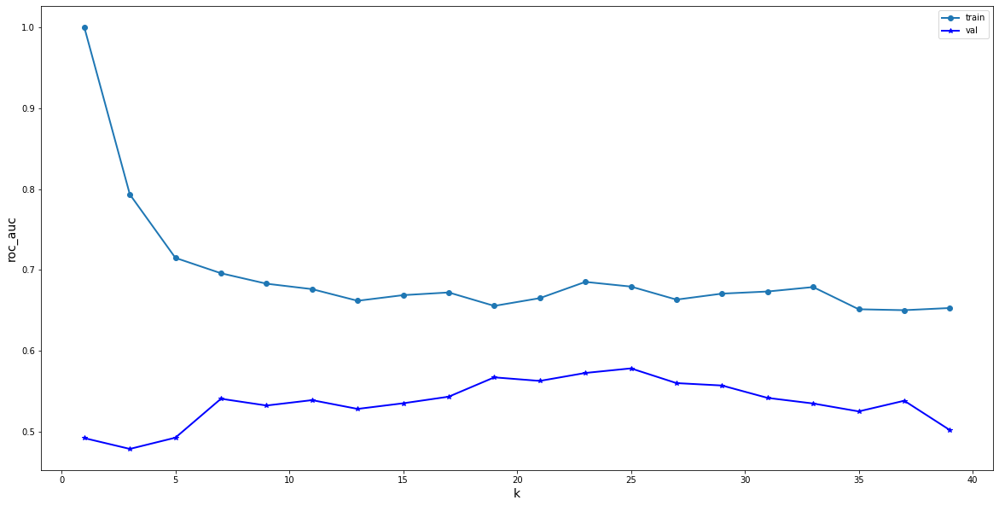

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.578
Valor correspondiente para el hiperparámetro: {'n_neighbors': 25}


In [ ]:
knn('roc_auc')

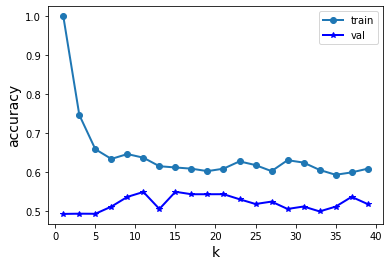

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.550
Valor correspondiente para el hiperparámetro: {'n_neighbors': 15}


In [ ]:
knn('accuracy')

Podemos observar según la curva de validación que podríamos elegir unnúmero de vecinos igual a 6, ya que el resultado será parecido al obtenido con 35 vecinos, por lo que así conseguiremos construir un modelo más sencillo.

Con este valor elegido de k, vamos a determinar  los valores de 5 figuras de mérito para estimar las prestaciones sobre un conjunto de test independiente del utilizado en el diseño:


In [ ]:
kNN_clasif_all = KNeighborsClassifier(n_neighbors = 25)
modelo_knn_clasif2 = kNN_clasif_all.fit(X_std_train2, Y_train) 
y_output_knn2 = modelo_knn_clasif2.predict(X_std_test2)
A1_score = accuracy_score(Y_test, y_output_knn2)
f11_score = f1_score(Y_test, y_output_knn2)
r1_score = recall_score(Y_test, y_output_knn2)
MSE1_score = mean_squared_error(Y_test, y_output_knn2)

print("El valor de precisión obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_knn2))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de sensibilidad es", r1_score)
# print("El error cuadrático medio", MSE1_score) 

El valor de precisión obtenido: 0.43902439024390244
La matriz de confusión obtenida: [[12 11]
 [12  6]]
El valor de f1_score obtenido: 0.34285714285714286
El valor de sensibilidad es 0.3333333333333333


In [ ]:

A1_score = accuracy_score(Y_test, y_output_knn2)
f11_score = f1_score(Y_test, y_output_knn2)
r1_score = recall_score(Y_test, y_output_knn2)
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_knn2)
roc_auc_1 = metrics.auc(fpr, tpr)
print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_knn2))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.43902439024390244
La matriz de confusión obtenida: [[12 11]
 [12  6]]
El valor de f1_score obtenido: 0.34285714285714286
El valor de recall es 0.3333333333333333


In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# ***ÁRBOLES***

Para los árboles no hace falta la normalización

In [ ]:
from sklearn.tree import DecisionTreeClassifier

def arbol(figura):
  # 1. Selección de hiper-parámetros del árbol. En principio, consideraremos sólo la profundidad máxima
  param_grid = {'max_depth': range(1,59)}
  profundidad_grid = np.array(range(1,59))


  grid_arbol_clasif = GridSearchCV(DecisionTreeClassifier(random_state=0), param_grid = param_grid, scoring = figura, cv=3, return_train_score=True)
  modelo_arbol_clasif = grid_arbol_clasif.fit(X_train, Y_train)
  print(grid_arbol_clasif.best_params_)

  perf_train_arbol = np.array(grid_arbol_clasif.cv_results_['mean_train_score'])
  perf_val_arbol = np.array(grid_arbol_clasif.cv_results_['mean_test_score'])

  plt.plot(profundidad_grid,perf_train_arbol,'-o',label="train", linewidth=2)
  plt.plot(profundidad_grid,perf_val_arbol,'-*b',label="val", linewidth=2)
  plt.xlabel('Profundidad',fontsize=14)
  plt.ylabel(figura,fontsize=14)
  plt.legend()
  plt.show()

  print("Mejor valor de la figura de mérito en validación cruzada: {:.3f}".format(grid_arbol_clasif.best_score_))
  print("Mejor valor del hiperparámetro: {}".format(grid_arbol_clasif.best_params_))


{'max_depth': 1}


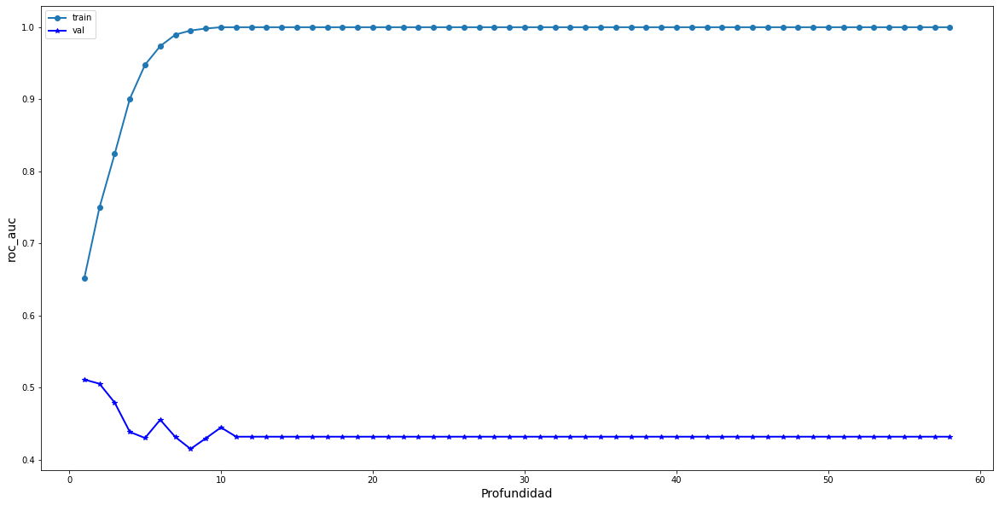

Mejor valor de la figura de mérito en validación cruzada: 0.511
Mejor valor del hiperparámetro: {'max_depth': 1}


In [ ]:
arbol('roc_auc')

{'max_depth': 1}


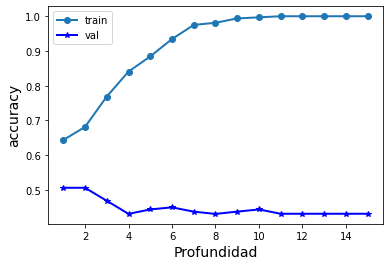

Mejor valor de la figura de mérito en validación cruzada: 0.506
Mejor valor del hiperparámetro: {'max_depth': 1}


In [ ]:
arbol('accuracy')

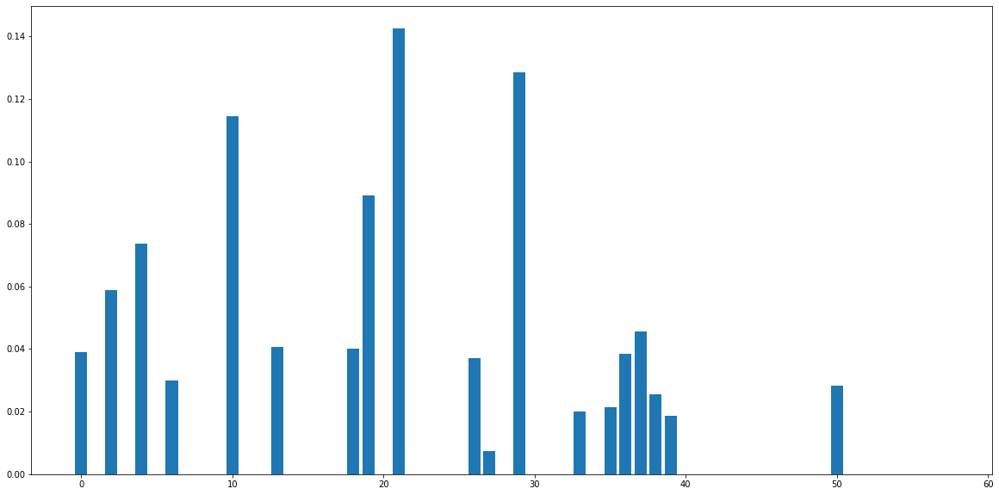

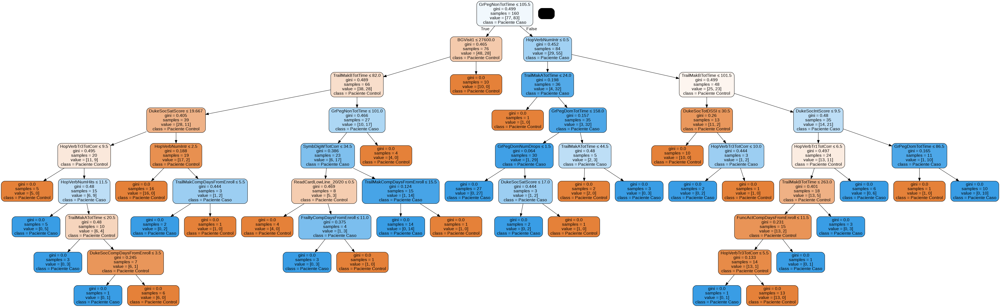

In [ ]:
# 4. Se representa la importancia de cada característica para el árbol diseñado
from matplotlib import pyplot
Arbol_clasif_all = DecisionTreeClassifier(max_depth=10)
modelo_arbol_clasif = Arbol_clasif_all.fit(X_train, Y_train)
y_output_arbol = modelo_arbol_clasif.predict(X_test)
importance_arbol = modelo_arbol_clasif.feature_importances_
pyplot.bar([x for x in range(len(importance_arbol))], importance_arbol)
pyplot.show()

# 5. Se representa gráficamente el modelo de clasificación
from sklearn.tree import export_graphviz
#from sklearn.externals.six import StringIO  
from six import StringIO
from IPython.display import Image  
import pydotplus

dot_data = StringIO()

export_graphviz(modelo_arbol_clasif, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = data.columns[1:],class_names=['Paciente Control','Paciente Caso'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Tree_Clasif_all.png')
Image(graph.create_png())

In [ ]:
print("El valor de accuracy obtenido:", accuracy_score(Y_test, y_output_arbol))
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_arbol))
print("El valor de f1_score obtenido:", f1_score(Y_test, y_output_arbol))
print("El valor de recall es", recall_score(Y_test, y_output_arbol))
# print("El error cuadrático medio", mean_squared_error(Y_test, y_output_arbol)) 

# A_results.append(accuracy_score(Y_test2, y_output_arbol))
# f1_results.append(f1_score(Y_test2, y_output_arbol))
# S_results.append(recall_score(Y_test2, y_output_arbol))
# MSE_results.append(mean_squared_error(Y_test2, y_output_arbol))

El valor de accuracy obtenido: 0.5609756097560976
La matriz de confusión obtenida: [[15  8]
 [10  8]]
El valor de f1_score obtenido: 0.47058823529411764
El valor de recall es 0.4444444444444444


In [ ]:

A1_score = accuracy_score(Y_test, y_output_arbol)
f11_score = f1_score(Y_test, y_output_arbol)
r1_score = recall_score(Y_test, y_output_arbol)
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_arbol)
roc_auc_1 = metrics.auc(fpr, tpr)
print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_arbol))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.5609756097560976
La matriz de confusión obtenida: [[15  8]
 [10  8]]
El valor de f1_score obtenido: 0.47058823529411764
El valor de recall es 0.4444444444444444


In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# ***SVC***

In [ ]:
from sklearn.svm import SVC


In [ ]:
# Regresión logística con regularización 
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection   
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

svc=SVC(decision_function_shape='ovo')

# logreg= LogisticRegression(solver='liblinear')
parameters = {'kernel': ['rbf','poly'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
                     'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]}# l1 lasso l2 ridge
# valor_C=np.array([1e-8,1e-4,1,10,100])
svc=GridSearchCV(svc, parameters, scoring='roc_auc', cv=5, return_train_score=True)

svc.fit(X_std_train2, Y_train) #Entrenamos

# #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
roc_log_train = np.array(svc.cv_results_['mean_train_score']) 
roc_loc_val = np.array(svc.cv_results_['mean_test_score'])

# #Pintamos la evolución de nuestro modelo tanto en train como en validación para ver cuál es el mejor hiperparámetro para generalizar
# plt.plot(valor_C,roc_log_train,'-o',label="train", linewidth=2)
# plt.plot(valor_C,roc_loc_val,'-*b',label="val", linewidth=2)
# plt.xlabel('C',fontsize=14)
# plt.ylabel('Roc_auc',fontsize=14)
# plt.legend()
# plt.show()

# Mostramos el mejor valor del parámetro y el score
print("Valor correspondiente para el hiperparámetro: {}".format(svc.best_params_))
print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(svc.best_score_))


Valor correspondiente para el hiperparámetro: {'C': 1000, 'gamma': 0.0001, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.667


In [ ]:


svc=SVC(C=1000,kernel='rbf',gamma=0.0001,decision_function_shape='ovo')
svc.fit(X_std_train2,Y_train)
y_test_pred=svc.predict(X_std_test2)

In [ ]:
A1_score = accuracy_score(Y_test, y_test_pred)
f11_score = f1_score(Y_test, y_test_pred)
r1_score = recall_score(Y_test, y_test_pred)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_test_pred))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.5365853658536586
La matriz de confusión obtenida: [[14  9]
 [10  8]]
El valor de f1_score obtenido: 0.45714285714285713
El valor de recall es 0.4444444444444444


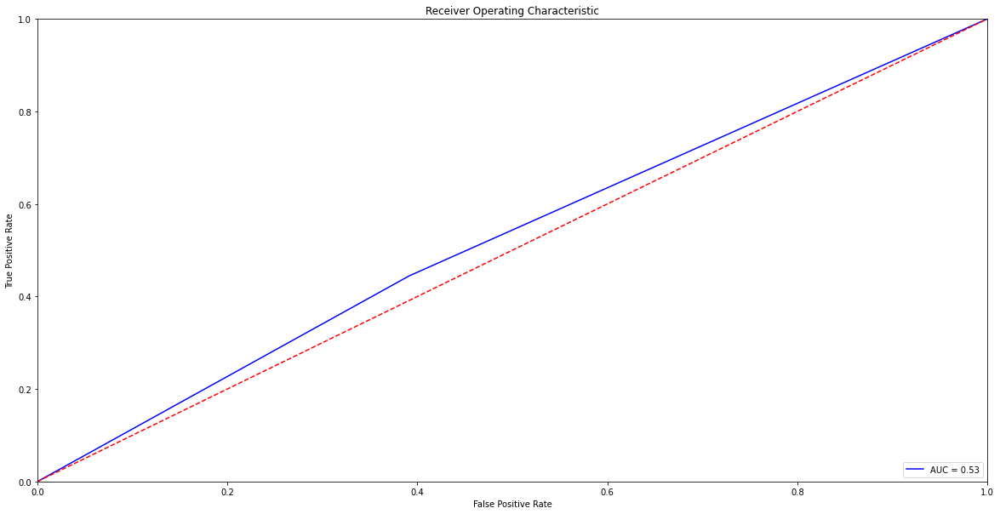

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_test_pred)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

In [ ]:
results = pd.DataFrame()

results["Accuracy"]=res_accuracy
results["Recall"]=res_recall
results["F1-score"]=res_f1
results["Auc"]=res_roc

#results
results["Modelos"] = ["Regresión logística", "Knn","Árbol","SVC"]
results.set_index("Modelos", inplace = True)

In [ ]:
results

,Accuracy,Recall,F1-score,Auc
Modelos,,,,
Regresión logística,0.585366,0.388889,0.451613,0.564010
Knn,0.439024,0.333333,0.342857,0.427536
Árbol,0.560976,0.444444,0.470588,0.548309
SVC,0.536585,0.444444,0.457143,0.526570


# **MÉTODO ENSEMBLE** no utilizado


In [ ]:
from sklearn.ensemble import RandomForestClassifier
def RandomForest(figura):
  # 1. Extracción de las dos características de interés para realizar el diseño

  param_grid = {'n_estimators': [10, 20, 30, 40, 50, 100]}
  arboles_grid=[10, 20, 30, 40, 50, 100]

  CV_rfc = GridSearchCV(RandomForestClassifier(max_features= 'sqrt'), param_grid=param_grid, cv= 5, n_jobs=-1, scoring=figura, return_train_score=True)
  CV_rfc.fit(X_std_train2, Y_train)
  print(CV_rfc.best_params_)

  perf_train_rfc = np.array(CV_rfc.cv_results_['mean_train_score'])
  perf_val_rfc = np.array(CV_rfc.cv_results_['mean_test_score'])

  plt.plot(arboles_grid,perf_train_rfc,'-o',label="train", linewidth=2)
  plt.plot(arboles_grid,perf_val_rfc,'-*b',label="val", linewidth=2)
  plt.xlabel('Arboles',fontsize=14)
  plt.ylabel(figura,fontsize=14)
  plt.legend()
  plt.show()


  print("Mejor MSE en validación cruzada: {:.3f}".format(CV_rfc.best_score_))
  print("Mejor valor del hiperparámetro: {}".format(CV_rfc.best_params_))


{'n_estimators': 50}


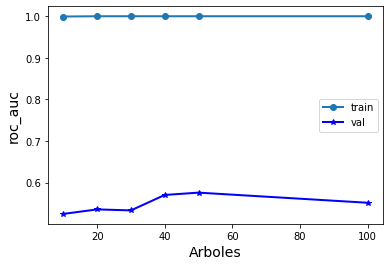

Mejor MSE en validación cruzada: 0.576
Mejor valor del hiperparámetro: {'n_estimators': 50}


In [ ]:
RandomForest('roc_auc')

{'n_estimators': 30}


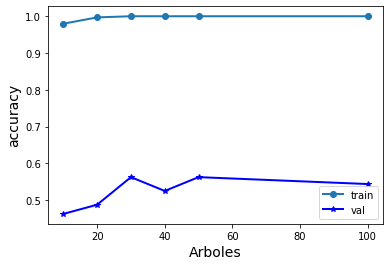

Mejor MSE en validación cruzada: 0.562
Mejor valor del hiperparámetro: {'n_estimators': 30}


In [ ]:
RandomForest('accuracy')

In [ ]:
RF_clasif_all = RandomForestClassifier(n_estimators=30)
modelo_RF_clasif2 = RF_clasif_all.fit(X_std_train2, Y_train) 
y_output_RF = modelo_RF_clasif2.predict(X_std_test2)
print(accuracy_score(Y_test, y_output_RF))
print(confusion_matrix(Y_test, y_output_RF))
print(f1_score(Y_test, y_output_RF))
print(recall_score(Y_test, y_output_RF))

# A_results.append(accuracy_score(Y_test2, y_output_RF))
# f1_results.append(f1_score(Y_test2, y_output_RF))
# S_results.append(recall_score(Y_test2, y_output_RF))
# MSE_results.append(mean_squared_error(Y_test2, y_output_RF))

0.6097560975609756
[[16  7]
 [ 9  9]]
0.5294117647058824
0.5


# ***Selección de características***

Ranking de Características:
1. Característica 12 (0.043488)
2. Característica 19 (0.038618)
3. Característica 13 (0.037759)
4. Característica 14 (0.032989)
5. Característica 2 (0.032975)
6. Característica 17 (0.032798)
7. Característica 26 (0.032231)
8. Característica 24 (0.031456)
9. Característica 10 (0.028516)
10. Característica 22 (0.028222)
11. Característica 30 (0.027074)
12. Característica 9 (0.026269)
13. Característica 7 (0.025870)
14. Característica 35 (0.025766)
15. Característica 31 (0.025240)
16. Característica 41 (0.024940)
17. Característica 37 (0.024358)
18. Característica 3 (0.023524)
19. Característica 4 (0.023422)
20. Característica 47 (0.023186)
21. Característica 28 (0.022612)
22. Característica 6 (0.022535)
23. Característica 25 (0.022271)
24. Característica 20 (0.021914)
25. Característica 5 (0.021325)
26. Característica 0 (0.020716)
27. Característica 15 (0.020549)
28. Característica 32 (0.020523)
29. Característica 29 (0.020265)
30. Característica 27 (0.019588)

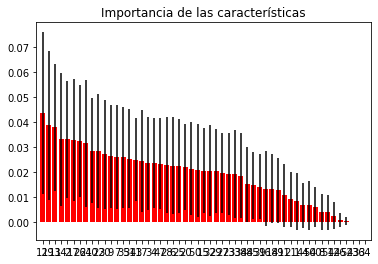

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

# Creamos un bosque aleatorio de árboles de clasificación
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

# Como en árboles, no es necesario que las características estén normalizadas
# Trabajamos, por tanto, con X_train y X_test (no con las versiones estandarizadas)

forest.fit(X_train_std_all0, Y_train_0)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Muestra el ranking en el ordenamiento
print("Ranking de Características:")

for f in range(X_train_std_all0.shape[1]):
    print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Importancia de las características")
plt.bar(range(X_train_std_all0.shape[1]), importances[indices],
        color="r", yerr=std[indices], align="center")
plt.xticks(range(X_train_std_all0.shape[1]), indices)
plt.xlim([-1, X_train_std_all0.shape[1]])
plt.show()

# ***SVC***

In [ ]:
from sklearn.svm import SVC


In [ ]:
# Regresión logística con regularización 
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection   
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

svc=SVC(decision_function_shape='ovo')

# logreg= LogisticRegression(solver='liblinear')
parameters = {'kernel': ['rbf','poly'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
                     'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]}# l1 lasso l2 ridge
# valor_C=np.array([1e-8,1e-4,1,10,100])
svc=GridSearchCV(svc, parameters, scoring='roc_auc', cv=5, return_train_score=True)

svc.fit(X_std_train, Y_train) #Entrenamos

# #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
roc_log_train = np.array(svc.cv_results_['mean_train_score']) 
roc_loc_val = np.array(svc.cv_results_['mean_test_score'])

# #Pintamos la evolución de nuestro modelo tanto en train como en validación para ver cuál es el mejor hiperparámetro para generalizar
# plt.plot(valor_C,roc_log_train,'-o',label="train", linewidth=2)
# plt.plot(valor_C,roc_loc_val,'-*b',label="val", linewidth=2)
# plt.xlabel('C',fontsize=14)
# plt.ylabel('Roc_auc',fontsize=14)
# plt.legend()
# plt.show()

# Mostramos el mejor valor del parámetro y el score
print("Valor correspondiente para el hiperparámetro: {}".format(svc.best_params_))
print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(svc.best_score_))


Valor correspondiente para el hiperparámetro: {'C': 25, 'gamma': 0.01, 'kernel': 'poly'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.602


In [ ]:


svc=SVC(C=25,kernel='poly',gamma=0.01,decision_function_shape='ovo')
svc.fit(X_std_train,Y_train)
y_test_pred=svc.predict(X_std_test)

In [ ]:
A1_score = accuracy_score(Y_test, y_test_pred)
f11_score = f1_score(Y_test, y_test_pred)
r1_score = recall_score(Y_test, y_test_pred)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_test_pred))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.4634146341463415
La matriz de confusión obtenida: [[ 4 19]
 [ 3 15]]
El valor de f1_score obtenido: 0.576923076923077
El valor de recall es 0.8333333333333334


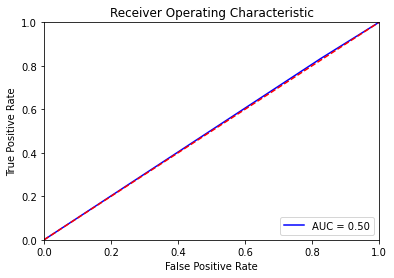

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_test_pred)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

In [ ]:
results = pd.DataFrame()

results["Accuracy"]=res_accuracy
results["Recall"]=res_recall
results["F1-score"]=res_f1
results["Auc"]=res_roc

#results
results["Modelos"] = ["Regresión logística", "Knn","Árbol","SVC"]
results.set_index("Modelos", inplace = True)

In [ ]:
results

,Accuracy,Recall,F1-score,Auc
Modelos,,,,
Regresión logística,0.536585,0.555556,0.512821,0.538647
Knn,0.560976,0.722222,0.590909,0.578502
Árbol,0.414634,0.444444,0.400000,0.417874
SVC,0.463415,0.833333,0.576923,0.503623


# ***Métodos *embedded****

Ranking de Características:
1. Característica 21 (0.041338)
2. Característica 14 (0.039171)
3. Característica 0 (0.030374)
4. Característica 29 (0.029971)
5. Característica 46 (0.029452)
6. Característica 13 (0.029405)
7. Característica 10 (0.029377)
8. Característica 19 (0.029324)
9. Característica 32 (0.028534)
10. Característica 15 (0.027366)
11. Característica 37 (0.027002)
12. Característica 2 (0.026205)
13. Característica 24 (0.026202)
14. Característica 38 (0.025235)
15. Característica 26 (0.024754)
16. Característica 36 (0.024051)
17. Característica 43 (0.023542)
18. Característica 3 (0.023449)
19. Característica 6 (0.023233)
20. Característica 30 (0.023155)
21. Característica 34 (0.023149)
22. Característica 5 (0.022463)
23. Característica 41 (0.022197)
24. Característica 22 (0.022152)
25. Característica 27 (0.021973)
26. Característica 4 (0.021672)
27. Característica 33 (0.020659)
28. Característica 16 (0.020064)
29. Característica 9 (0.020045)
30. Característica 39 (0.019553

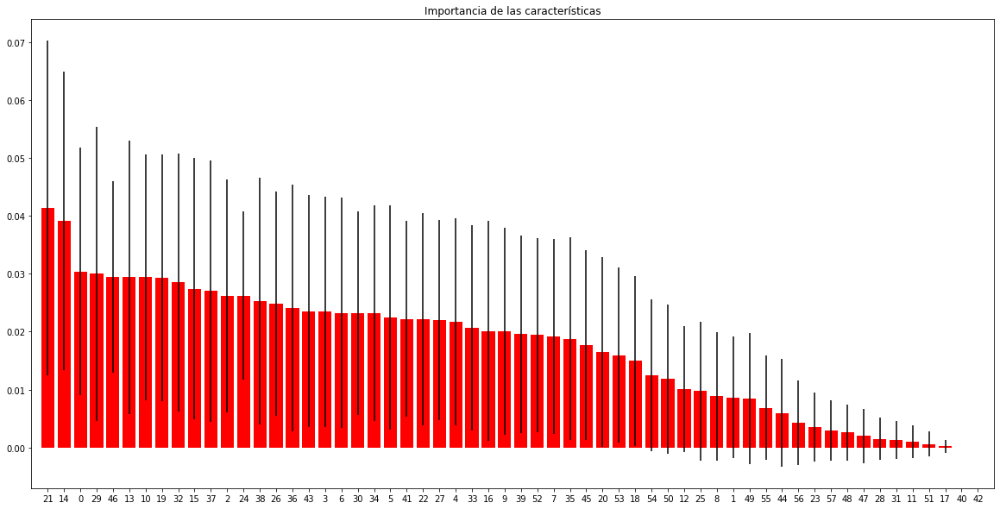

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

# Creamos un bosque aleatorio de árboles de clasificación
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

# Como en árboles, no es necesario que las características estén normalizadas
# Trabajamos, por tanto, con X_train y X_test (no con las versiones estandarizadas)

forest.fit(X_train, Y_train)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Muestra el ranking en el ordenamiento
print("Ranking de Características:")

for f in range(X_train.shape[1]):
  print("%d. Característica %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Importancia de las características")
plt.bar(range(X_train.shape[1]), importances[indices],
        color="r", yerr=std[indices], align="center")
plt.xticks(range(X_train.shape[1]), indices)
plt.xlim([-1, X_train.shape[1]])
plt.show()

CARACTERÍSTICAS MÁS IMPORTANTES:
- BBGAttitudeScaleCompEnroll	
- HighBGLevTakeAction	
- LowBGLevTakeAction	
- PtCurrA1cGoal

In [ ]:
# from sklearn.model_selection import train_test_split, cross_val_score

X_train_emb = X_std_train2[:,[21,14,0,29,46,13,10,19,32,15,37]]
X_test_emb = X_std_test2[:,[21,14,0,29,46,13,10,19,32,15,37]]


# ***Regresión logística con regularización***

In [ ]:
# Regresión logística con regularización 
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection   
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

logreg= LogisticRegression(solver='liblinear')
parameters = {"C":[1e-8,1e-4,10,100],"penalty":["l1","l2"]}# l1 lasso l2 ridge
valor_C=np.array([1e-8,1e-4,10,100])
log_regression=GridSearchCV(logreg, parameters, scoring='roc_auc', cv=5, return_train_score=True)

log_regression.fit(X_train_emb, Y_train) #Entrenamos

# #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
roc_log_train = np.array(log_regression.cv_results_['mean_train_score']) 
roc_loc_val = np.array(log_regression.cv_results_['mean_test_score'])

# #Pintamos la evolución de nuestro modelo tanto en train como en validación para ver cuál es el mejor hiperparámetro para generalizar
# plt.plot(valor_C,roc_log_train,'-o',label="train", linewidth=2)
# plt.plot(valor_C,roc_loc_val,'-*b',label="val", linewidth=2)
# plt.xlabel('C',fontsize=14)
# plt.ylabel('Roc_auc',fontsize=14)
# plt.legend()
# plt.show()

# Mostramos el mejor valor del parámetro y el score
print("Valor correspondiente para el hiperparámetro: {}".format(log_regression.best_params_))
print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(log_regression.best_score_))


Valor correspondiente para el hiperparámetro: {'C': 1e-08, 'penalty': 'l2'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.665


In [ ]:
from sklearn.linear_model import Lasso

logridge=LogisticRegression(solver='liblinear', penalty='l2', C=1e-08)
modelo_rid_log=logridge.fit(X_train_emb, Y_train)

# Obtenemos la salida predicha
y_pred_ridlog = modelo_rid_log.predict(X_test_emb)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score

#  Calculamos la matriz de confusión
cm = confusion_matrix(Y_test, y_pred_ridlog)
print(cm)

tn, fp, fn, tp = confusion_matrix(Y_test, y_pred_ridlog).ravel()
print(f'tn: {tn}, fp:{fp}, fn:{fn}, tp:{tp}')

# Calcumos accuracy_score
Accuracy=accuracy_score(Y_test, y_pred_ridlog)
print(f'Accuracy: {Accuracy}')

target_names = ['Paciente control', 'Paciente caso']
print(classification_report(Y_test, y_pred_ridlog, target_names=target_names))
              
#Sensibilidad
Sensibilidad_3 = recall_score(Y_test, y_pred_ridlog)
# S_results.append(Sensibilidad_3)
print(f'Sensibilidad: {Sensibilidad_3}')

[[18  5]
 [11  7]]
tn: 18, fp:5, fn:11, tp:7
Accuracy: 0.6097560975609756
                  precision    recall  f1-score   support

Paciente control       0.62      0.78      0.69        23
   Paciente caso       0.58      0.39      0.47        18

        accuracy                           0.61        41
       macro avg       0.60      0.59      0.58        41
    weighted avg       0.60      0.61      0.59        41

Sensibilidad: 0.3888888888888889


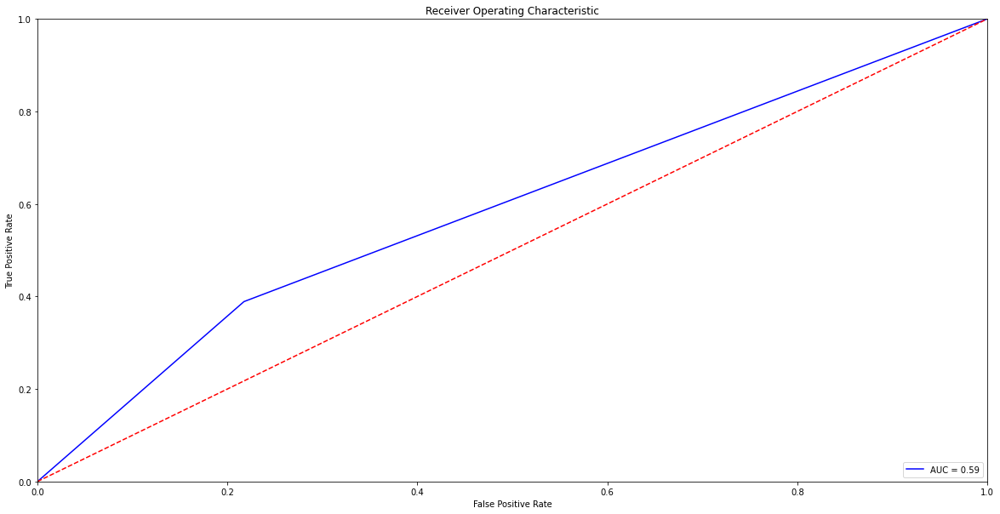

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_pred_ridlog)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
res_accuracy=[]
res_recall=[]
res_f1=[]
res_roc=[]

In [ ]:

A1_score = accuracy_score(Y_test, y_pred_ridlog)
f11_score = f1_score(Y_test, y_pred_ridlog)
r1_score = recall_score(Y_test, y_pred_ridlog)
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_pred_ridlog)
roc_auc_1 = metrics.auc(fpr, tpr)
print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_pred_ridlog))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.6097560975609756
La matriz de confusión obtenida: [[18  5]
 [11  7]]
El valor de f1_score obtenido: 0.4666666666666666
El valor de recall es 0.3888888888888889


In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# **Knn por votación**

In [ ]:

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn import preprocessing
#from mlxtend.plotting import plot_learning_curves

In [ ]:
def knn (figura):
  # 5. Selección del hiper-parámetro haciendo uso del conjunto de diseño con características estandarizadas. 

  param_grid = {'n_neighbors': range(1,81,2)}
  k_grid = np.array(range(1,81,2))
  grid_knn = GridSearchCV(KNeighborsClassifier(), param_grid = param_grid, scoring = figura, cv=3, return_train_score=True)
  grid_knn.fit(X_train_emb, Y_train) 

  #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
  
  auc_knn_all_train = np.array(grid_knn.cv_results_['mean_train_score'])
  auc_knn_all_val = np.array(grid_knn.cv_results_['mean_test_score'])


  plt.plot(k_grid,auc_knn_all_train,'-o',label="train", linewidth=2)
  plt.plot(k_grid,auc_knn_all_val,'-*b',label="val", linewidth=2)
  plt.xlabel('k',fontsize=14)
  plt.ylabel(figura,fontsize=14)
  plt.legend()
  plt.show()

  print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(grid_knn.best_score_))
  print("Valor correspondiente para el hiperparámetro: {}".format(grid_knn.best_params_))

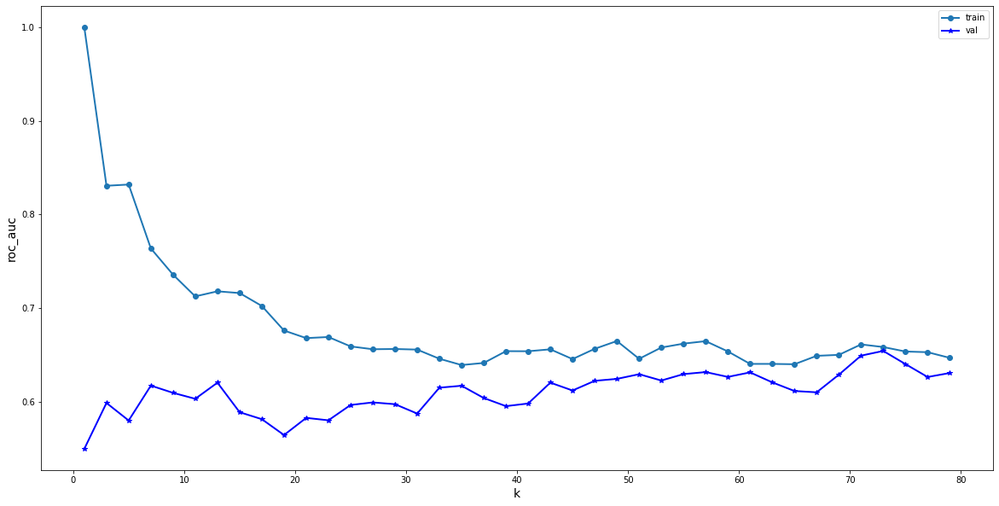

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.654
Valor correspondiente para el hiperparámetro: {'n_neighbors': 73}


In [ ]:
knn('roc_auc')

In [ ]:
kNN_clasif_all = KNeighborsClassifier(n_neighbors = 73)
modelo_knn_clasif2 = kNN_clasif_all.fit(X_train_emb, Y_train) 
y_output_knn2 = modelo_knn_clasif2.predict(X_test_emb)
A1_score = accuracy_score(Y_test, y_output_knn2)
f11_score = f1_score(Y_test, y_output_knn2)
r1_score = recall_score(Y_test, y_output_knn2)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_knn2))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.6097560975609756
La matriz de confusión obtenida: [[20  3]
 [13  5]]
El valor de f1_score obtenido: 0.3846153846153846
El valor de recall es 0.2777777777777778


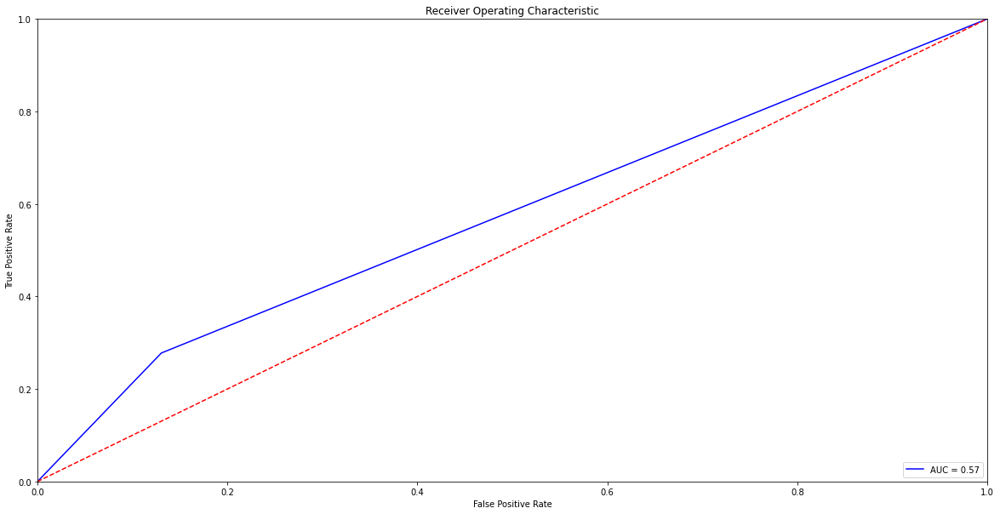

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_knn2)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:

A1_score = accuracy_score(Y_test, y_output_knn2)
f11_score = f1_score(Y_test, y_output_knn2)
r1_score = recall_score(Y_test, y_output_knn2)
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_knn2)
roc_auc_1 = metrics.auc(fpr, tpr)
print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_knn2))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.6097560975609756
La matriz de confusión obtenida: [[20  3]
 [13  5]]
El valor de f1_score obtenido: 0.3846153846153846
El valor de recall es 0.2777777777777778


In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# ***ÁRBOLES***

In [ ]:
from sklearn.tree import DecisionTreeClassifier

def arbol(figura):
  # 1. Selección de hiper-parámetros del árbol. En principio, consideraremos sólo la profundidad máxima
  param_grid = {'max_depth': range(1,12)}
  profundidad_grid = np.array(range(1,12))


  grid_arbol_clasif = GridSearchCV(DecisionTreeClassifier(random_state=0), param_grid = param_grid, scoring = figura, cv=3, return_train_score=True)
  modelo_arbol_clasif = grid_arbol_clasif.fit(X_train_emb, Y_train)
  print(grid_arbol_clasif.best_params_)

  perf_train_arbol = np.array(grid_arbol_clasif.cv_results_['mean_train_score'])
  perf_val_arbol = np.array(grid_arbol_clasif.cv_results_['mean_test_score'])

  plt.plot(profundidad_grid,perf_train_arbol,'-o',label="train", linewidth=2)
  plt.plot(profundidad_grid,perf_val_arbol,'-*b',label="val", linewidth=2)
  plt.xlabel('Profundidad',fontsize=14)
  plt.ylabel(figura,fontsize=14)
  plt.legend()
  plt.show()

  print("Mejor valor de la figura de mérito en validación cruzada: {:.3f}".format(grid_arbol_clasif.best_score_))
  print("Mejor valor del hiperparámetro: {}".format(grid_arbol_clasif.best_params_))


{'max_depth': 1}


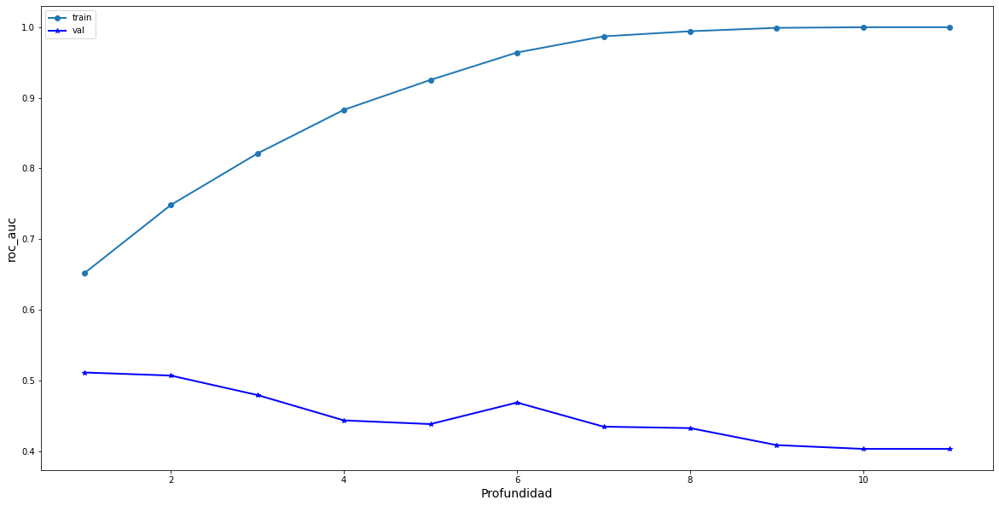

Mejor valor de la figura de mérito en validación cruzada: 0.511
Mejor valor del hiperparámetro: {'max_depth': 1}


In [ ]:
arbol('roc_auc')

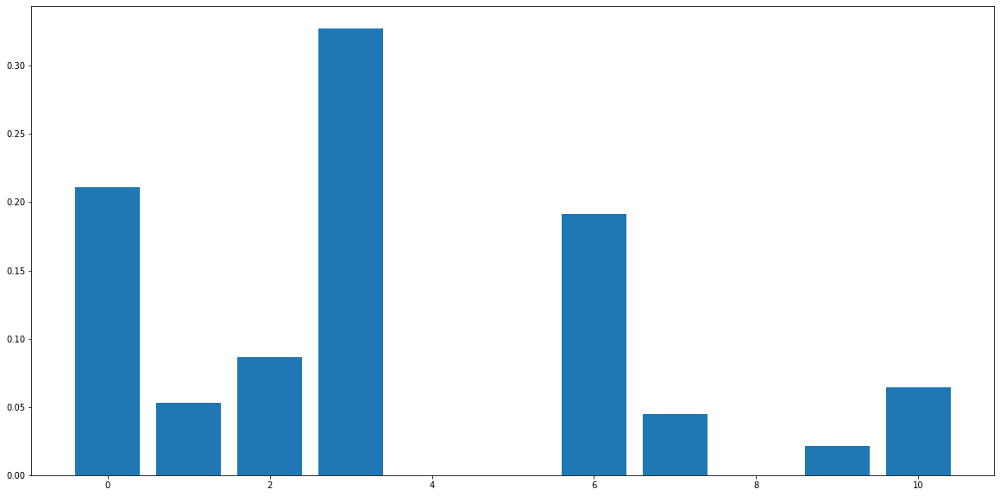

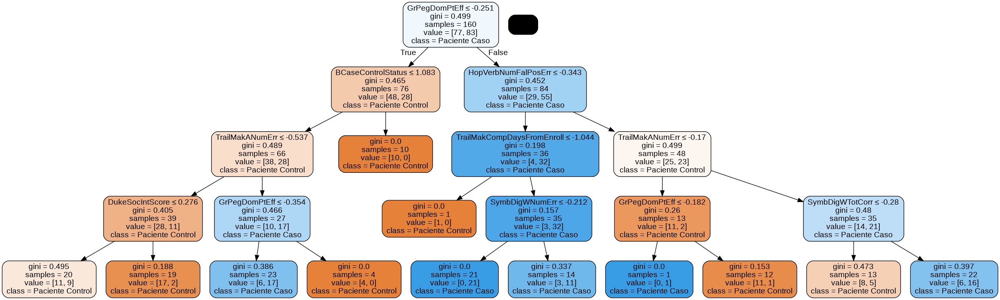

In [ ]:
# 4. Se representa la importancia de cada característica para el árbol diseñado
from matplotlib import pyplot
Arbol_clasif_all = DecisionTreeClassifier(max_depth=4)
modelo_arbol_clasif = Arbol_clasif_all.fit(X_train_emb, Y_train)
y_output_arbol = modelo_arbol_clasif.predict(X_test_emb)
importance_arbol = modelo_arbol_clasif.feature_importances_
pyplot.bar([x for x in range(len(importance_arbol))], importance_arbol)
pyplot.show()

# 5. Se representa gráficamente el modelo de clasificación
from sklearn.tree import export_graphviz
#from sklearn.externals.six import StringIO  
from six import StringIO
from IPython.display import Image  
import pydotplus

dot_data = StringIO()

export_graphviz(modelo_arbol_clasif, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = data.columns[[21,14,0,29,46,13,10,19,32,15,37]],class_names=['Paciente Control','Paciente Caso'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Tree_Clasif_all.png')
Image(graph.create_png())

In [ ]:
print("El valor de precisión obtenido:", accuracy_score(Y_test, y_output_arbol))
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_arbol))
print("El valor de f1_score obtenido:", f1_score(Y_test, y_output_arbol))
print("El valor de sensibilidad es", recall_score(Y_test, y_output_arbol))

El valor de precisión obtenido: 0.4878048780487805
La matriz de confusión obtenida: [[11 12]
 [ 9  9]]
El valor de f1_score obtenido: 0.4615384615384615
El valor de sensibilidad es 0.5


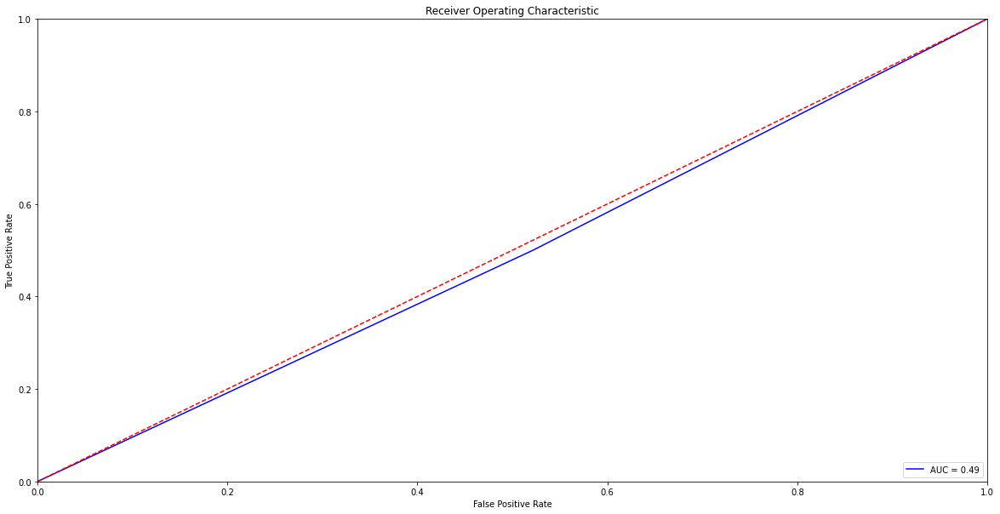

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_arbol)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
A1_score = accuracy_score(Y_test, y_output_arbol)
f11_score = f1_score(Y_test, y_output_arbol)
r1_score = recall_score(Y_test, y_output_arbol)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_arbol))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.4878048780487805
La matriz de confusión obtenida: [[11 12]
 [ 9  9]]
El valor de f1_score obtenido: 0.4615384615384615
El valor de recall es 0.5


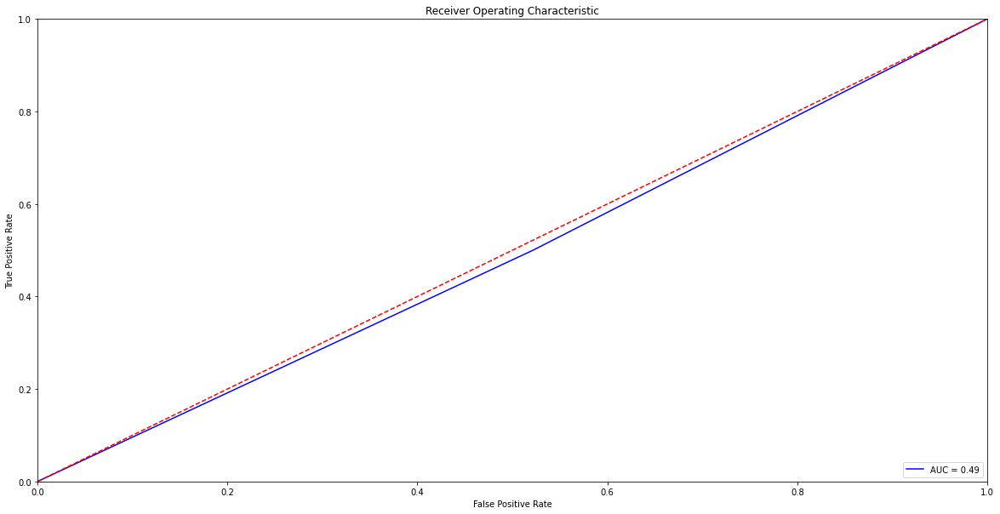

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_arbol)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# ***SVC***

In [ ]:
# Regresión logística con regularización 
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection   
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

svc=SVC(decision_function_shape='ovo')

# logreg= LogisticRegression(solver='liblinear')
parameters = {'kernel': ['rbf','poly'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
                     'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]}# l1 lasso l2 ridge
# valor_C=np.array([1e-8,1e-4,1,10,100])
svc=GridSearchCV(svc, parameters, scoring='roc_auc', cv=5, return_train_score=True)

svc.fit(X_train_emb, Y_train) #Entrenamos

# #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
roc_log_train = np.array(svc.cv_results_['mean_train_score']) 
roc_loc_val = np.array(svc.cv_results_['mean_test_score'])

# #Pintamos la evolución de nuestro modelo tanto en train como en validación para ver cuál es el mejor hiperparámetro para generalizar
# plt.plot(valor_C,roc_log_train,'-o',label="train", linewidth=2)
# plt.plot(valor_C,roc_loc_val,'-*b',label="val", linewidth=2)
# plt.xlabel('C',fontsize=14)
# plt.ylabel('Roc_auc',fontsize=14)
# plt.legend()
# plt.show()

# Mostramos el mejor valor del parámetro y el score
print("Valor correspondiente para el hiperparámetro: {}".format(svc.best_params_))
print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(svc.best_score_))


Valor correspondiente para el hiperparámetro: {'C': 100, 'gamma': 0.01, 'kernel': 'poly'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.675


In [ ]:


svc=SVC(C=100,kernel='poly',gamma=0.01,decision_function_shape='ovo')
svc.fit(X_train_emb,Y_train)
y_test_pred=svc.predict(X_test_emb)

In [ ]:
A1_score = accuracy_score(Y_test, y_test_pred)
f11_score = f1_score(Y_test, y_test_pred)
r1_score = recall_score(Y_test, y_test_pred)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_test_pred))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.5609756097560976
La matriz de confusión obtenida: [[19  4]
 [14  4]]
El valor de f1_score obtenido: 0.30769230769230765
El valor de recall es 0.2222222222222222


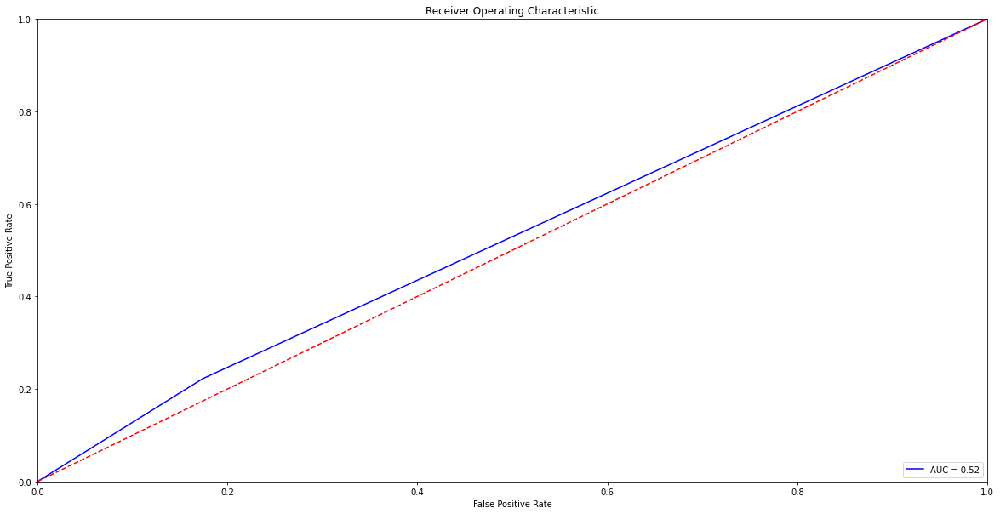

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_test_pred)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# ***Método filter***

A continuación, a partir de validación cruzada con 3 folds, obtenemos el fold1, fold2 y fold3:

In [ ]:
# Convertimos el objeto dataframe en un array (mayor velocidad de cómputo)
# array = data.values
X_train=np.array(X_train)
X_text=np.array(X_test)
Y_train=(np.array(Y_train))
Y_test=np.array(Y_test)
# Separamos en variables de entrada al modelo (8 primeras) y de salida (1 variable) 
# X = array[:,1:59]
# Y = array[:,0]

names=[]
for i in range(58):
  names.append(str(i))
# names = ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11','f12','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13','f13']
# names = data.columns[1:]
names

['0',
 '1',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '20',
 '21',
 '22',
 '23',
 '24',
 '25',
 '26',
 '27',
 '28',
 '29',
 '30',
 '31',
 '32',
 '33',
 '34',
 '35',
 '36',
 '37',
 '38',
 '39',
 '40',
 '41',
 '42',
 '43',
 '44',
 '45',
 '46',
 '47',
 '48',
 '49',
 '50',
 '51',
 '52',
 '53',
 '54',
 '55',
 '56',
 '57']

In [ ]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=3)  # In this case, k=3, 

for train, val in kf.split(X_train):
  # print("%s %s" % (train, val))
  # print(len(val))
  # print(val)
  if (len(val)==53) and (val[0]==107):
    fold3=list(val)
    print(len(fold3))
    print(fold3)
  if (len(val)==54):
    fold1=list(val)
    print(len(fold1))
    print(fold1)
  if (len(val)==53) and (val[0]==54):
    fold2=list(val)
    print(len(fold2))
    print(fold2)

54
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
53
[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
53
[107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159]


# ***COMBINACIÓN PRIMERA***


En esta primera combinación utilizaremos fold1 y fold2 para entrenar, y fold3 para validar:

In [ ]:
X_entrenamiento=np.concatenate((X_train[fold1], X_train[fold2]))
Y_entrenamiento=np.concatenate((Y_train[fold1], Y_train[fold2]))
X_val=X_train[fold3]
Y_val=Y_train[fold3]

/usr/local/lib/python3.7/dist-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [11 40 42 57] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Text(0.5, 1.0, 'Chi2 considerando subconjunto X train')

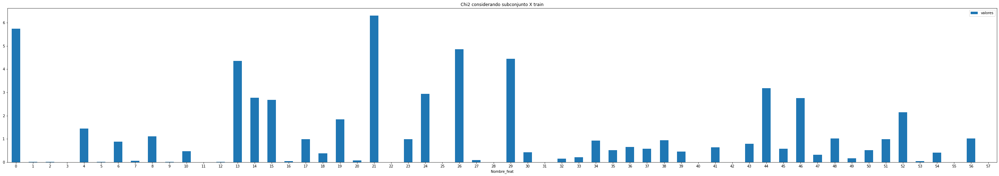

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif, f_classif

bestfeatures_Chi2 = SelectKBest(score_func=f_classif, k=58)
fit_Chi2 = bestfeatures_Chi2.fit(X_entrenamiento, Y_entrenamiento)

# gráfico de barras utilizando matplotlib
df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2.scores_})
ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0, figsize=(50,8))
# df, ax = plt.subplots(figsize=(50, 8))
plt.title("Chi2 considerando subconjunto X train")

In [ ]:
X_val=X_val[:, [0,13,21,26,29]] 
print(len(X_val), len(Y_val))

53 53


In [ ]:
X_entrenamiento=X_entrenamiento[:, [0,13,21,26,29]]

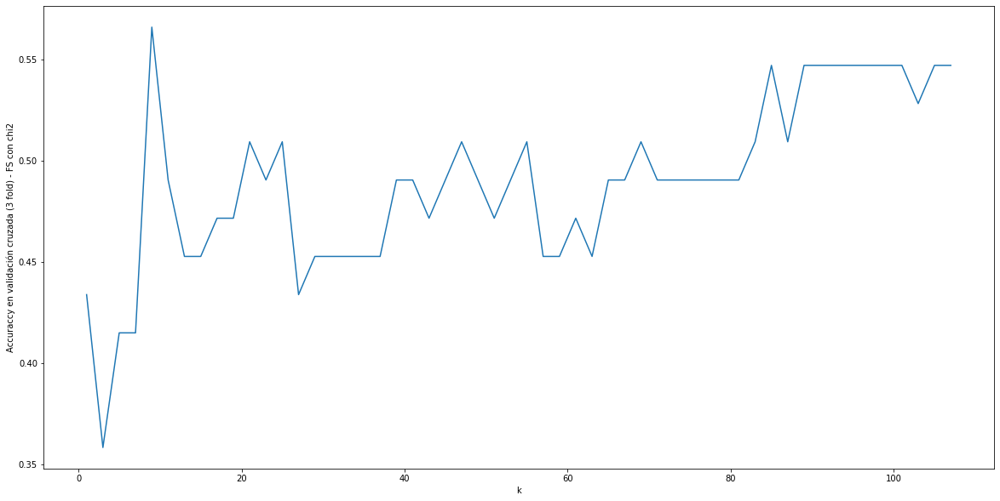

0.5471698113207547


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
k_range = range(1, 109, 2)
scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors = k)
    knn.fit(X_entrenamiento, Y_entrenamiento)
    scores.append(knn.score(X_val, Y_val))
plt.plot(k_range, scores)
plt.xlabel('k')
plt.ylabel('Accuraccy en validación cruzada (3 fold) - FS con chi2')
plt.show()
print(knn.score(X_val, Y_val))

# ***COMBINACIÓN 2***

En esta combinación usaremos fold1 y fold3 para entrenar y usaremos fold 2 para validar:

In [ ]:
X_entrenamiento2=np.concatenate((X_train[fold1], X_train[fold3]))
Y_entrenamiento2=np.concatenate((Y_train[fold1], Y_train[fold3]))
X_val2=X_train[fold2]
Y_val2=Y_train[fold2]

/usr/local/lib/python3.7/dist-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [17 28 31 40 42 48] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Text(0.5, 1.0, 'Estadístico chi cuadrado considerando subconjunto X train')

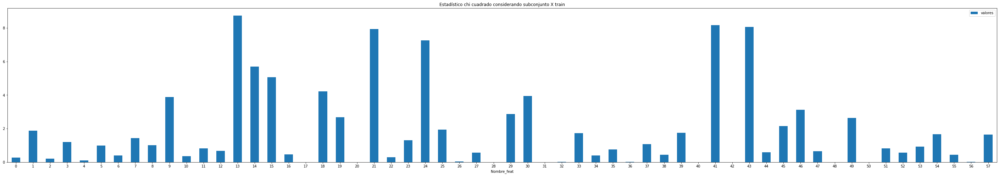

In [ ]:
bestfeatures_Chi2_2 = SelectKBest(score_func=f_classif, k=58)
fit_Chi2_2 = bestfeatures_Chi2_2.fit(X_entrenamiento2, Y_entrenamiento2)

# gráfico de barras utilizando matplotlib
df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2_2.scores_})
ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0,figsize=(50,8))
plt.title("Estadístico chi cuadrado considerando subconjunto X train")

In [ ]:
X_val2=X_val2[:, [13,21,34,41,43]] 
X_entrenamiento2=X_entrenamiento2[:, [13,21,34,41,43]]

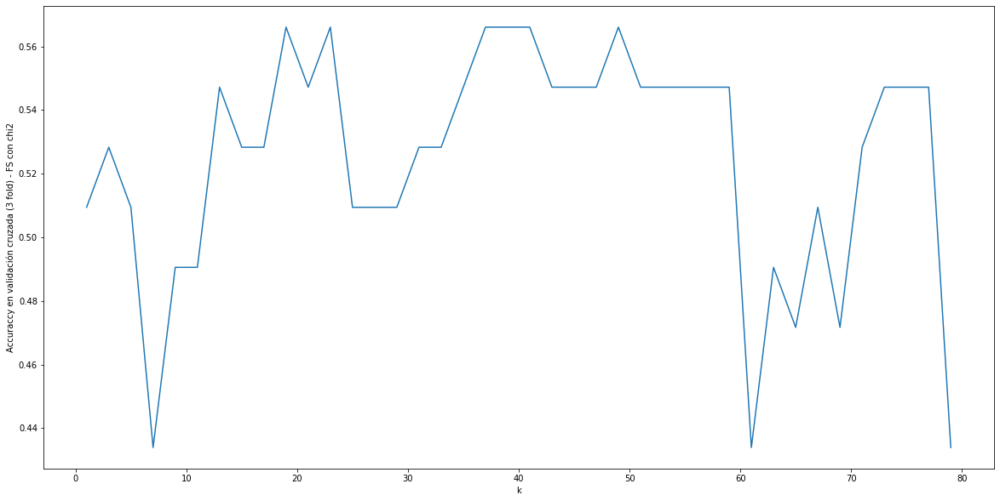

0.4339622641509434


In [ ]:
k_range = range(1, 81, 2)
scores2 = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors = k)
    
    knn.fit(X_entrenamiento2, Y_entrenamiento2)
    scores2.append(knn.score(X_val2, Y_val2))
plt.plot(k_range, scores2)
plt.xlabel('k')
plt.ylabel('Accuraccy en validación cruzada (3 fold) - FS con chi2')
plt.show()
print(knn.score(X_val2, Y_val2))

# ***COMBINACIÓN 3***

In [ ]:
X_entrenamiento3=np.concatenate((X_train[fold2], X_train[fold3]))
Y_entrenamiento3=np.concatenate((Y_train[fold2], Y_train[fold3]))
X_val3=X_train[fold1]
Y_val3=Y_train[fold1]

/usr/local/lib/python3.7/dist-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [40 42 51] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Text(0.5, 1.0, 'Estadístico chi cuadrado considerando subconjunto X train')

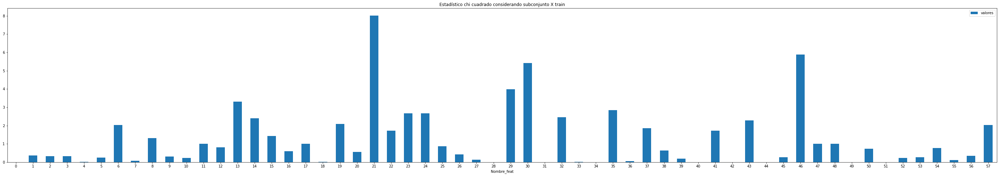

In [ ]:
bestfeatures_Chi2_3 = SelectKBest(score_func=f_classif, k=58)
fit_Chi2_3 = bestfeatures_Chi2_3.fit(X_entrenamiento3, Y_entrenamiento3)

# gráfico de barras utilizando matplotlib
df = pd.DataFrame({'Nombre_feat':names, 'valores':fit_Chi2_3.scores_})
ax = df.plot.bar(x='Nombre_feat', y='valores', rot=0, figsize=(50,8))
plt.title("Estadístico chi cuadrado considerando subconjunto X train")

In [ ]:
X_val3=X_val3[:, [21,30,46]] 
X_entrenamiento3=X_entrenamiento3[:, [21,30,46]]

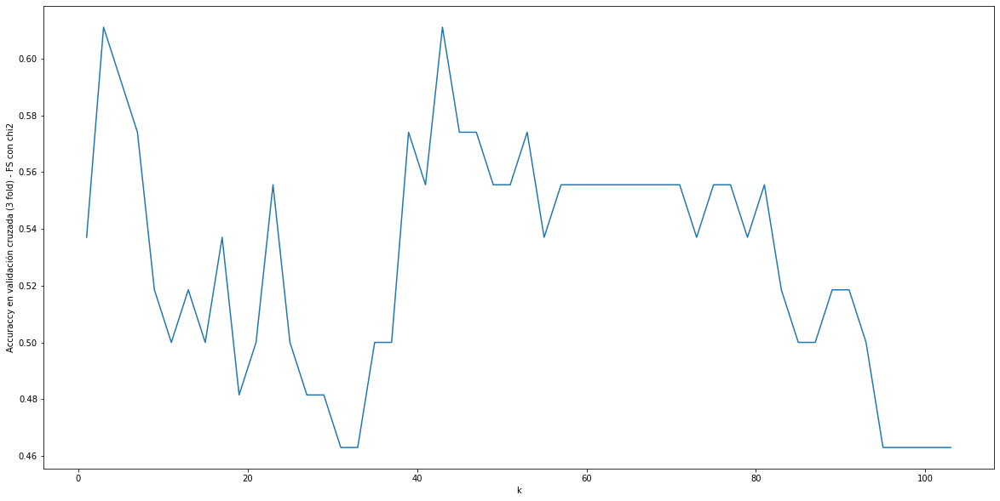

0.46296296296296297


In [ ]:
k_range = range(1, 105, 2)
scores3 = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors = k)
    knn.fit(X_entrenamiento3, Y_entrenamiento3)
    scores3.append(knn.score(X_val3, Y_val3))
plt.plot(k_range, scores3)
plt.xlabel('k')
plt.ylabel('Accuraccy en validación cruzada (3 fold) - FS con chi2')
plt.show()
print(knn.score(X_val3, Y_val3))

In [ ]:

X_train_filt = X_std_train2[:,[13,21]]
X_test_filt = X_std_test2[:,[13,21]]


# ***Regresión logística con regularización***

In [ ]:
# Regresión logística con regularización 
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection   
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

logreg= LogisticRegression(solver='liblinear')
parameters = {"C":[1e-8,1e-4,10,100],"penalty":["l1","l2"]}# l1 lasso l2 ridge
valor_C=np.array([1e-8,1e-4,10,100])
log_regression=GridSearchCV(logreg, parameters, scoring='roc_auc', cv=5, return_train_score=True)

log_regression.fit(X_train_filt, Y_train) #Entrenamos

# #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
roc_log_train = np.array(log_regression.cv_results_['mean_train_score']) 
roc_loc_val = np.array(log_regression.cv_results_['mean_test_score'])

# #Pintamos la evolución de nuestro modelo tanto en train como en validación para ver cuál es el mejor hiperparámetro para generalizar
# plt.plot(valor_C,roc_log_train,'-o',label="train", linewidth=2)
# plt.plot(valor_C,roc_loc_val,'-*b',label="val", linewidth=2)
# plt.xlabel('C',fontsize=14)
# plt.ylabel('Roc_auc',fontsize=14)
# plt.legend()
# plt.show()

# Mostramos el mejor valor del parámetro y el score
print("Valor correspondiente para el hiperparámetro: {}".format(log_regression.best_params_))
print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(log_regression.best_score_))


Valor correspondiente para el hiperparámetro: {'C': 1e-08, 'penalty': 'l2'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.646


In [ ]:
from sklearn.linear_model import Lasso

logridge=LogisticRegression(solver='liblinear', penalty='l2', C=1e-08)
modelo_rid_log=logridge.fit(X_train_filt, Y_train)

# Obtenemos la salida predicha
y_pred_ridlog = modelo_rid_log.predict(X_test_filt)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score

#  Calculamos la matriz de confusión
cm = confusion_matrix(Y_test, y_pred_ridlog)
print(cm)

tn, fp, fn, tp = confusion_matrix(Y_test, y_pred_ridlog).ravel()
print(f'tn: {tn}, fp:{fp}, fn:{fn}, tp:{tp}')

# Calcumos accuracy_score
Accuracy=accuracy_score(Y_test, y_pred_ridlog)
print(f'Accuracy: {Accuracy}')

target_names = ['Paciente control', 'Paciente caso']
print(classification_report(Y_test, y_pred_ridlog, target_names=target_names))
              
#Sensibilidad
Sensibilidad_3 = recall_score(Y_test, y_pred_ridlog)
# S_results.append(Sensibilidad_3)
print(f'Sensibilidad: {Sensibilidad_3}')

[[15  8]
 [ 9  9]]
tn: 15, fp:8, fn:9, tp:9
Accuracy: 0.5853658536585366
                  precision    recall  f1-score   support

Paciente control       0.62      0.65      0.64        23
   Paciente caso       0.53      0.50      0.51        18

        accuracy                           0.59        41
       macro avg       0.58      0.58      0.58        41
    weighted avg       0.58      0.59      0.58        41

Sensibilidad: 0.5


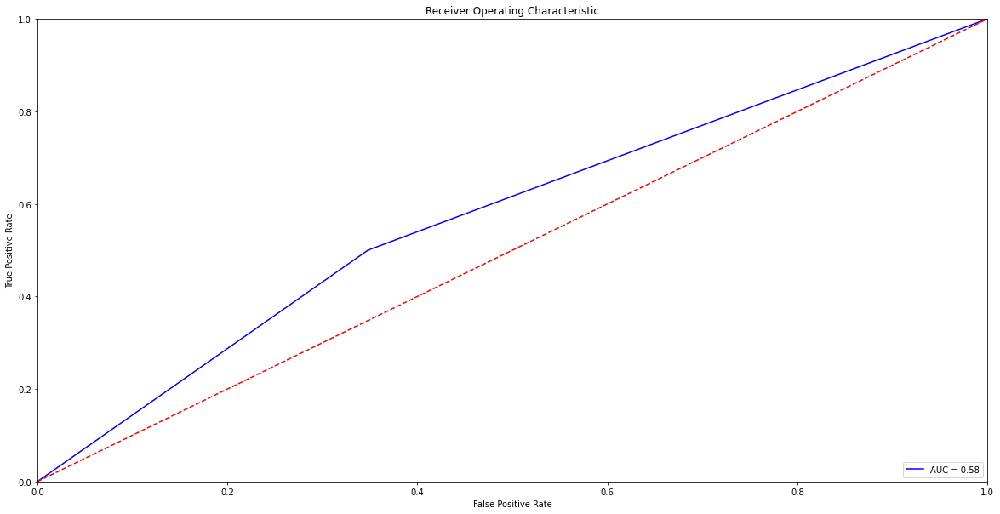

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_pred_ridlog)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:

A1_score = accuracy_score(Y_test, y_pred_ridlog)
f11_score = f1_score(Y_test, y_pred_ridlog)
r1_score = recall_score(Y_test, y_pred_ridlog)
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_pred_ridlog)
roc_auc_1 = metrics.auc(fpr, tpr)
print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_pred_ridlog))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.5853658536585366
La matriz de confusión obtenida: [[15  8]
 [ 9  9]]
El valor de f1_score obtenido: 0.5142857142857143
El valor de recall es 0.5


In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# **Knn por votación**

In [ ]:

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn import preprocessing
#from mlxtend.plotting import plot_learning_curves

In [ ]:
def knn (figura):
  # 5. Selección del hiper-parámetro haciendo uso del conjunto de diseño con características estandarizadas. 

  param_grid = {'n_neighbors': range(1,81,2)}
  k_grid = np.array(range(1,81,2))
  grid_knn = GridSearchCV(KNeighborsClassifier(), param_grid = param_grid, scoring = figura, cv=3, return_train_score=True)
  grid_knn.fit(X_train_filt, Y_train) 

  #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
  
  auc_knn_all_train = np.array(grid_knn.cv_results_['mean_train_score'])
  auc_knn_all_val = np.array(grid_knn.cv_results_['mean_test_score'])


  plt.plot(k_grid,auc_knn_all_train,'-o',label="train", linewidth=2)
  plt.plot(k_grid,auc_knn_all_val,'-*b',label="val", linewidth=2)
  plt.xlabel('k',fontsize=14)
  plt.ylabel(figura,fontsize=14)
  plt.legend()
  plt.show()

  print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(grid_knn.best_score_))
  print("Valor correspondiente para el hiperparámetro: {}".format(grid_knn.best_params_))

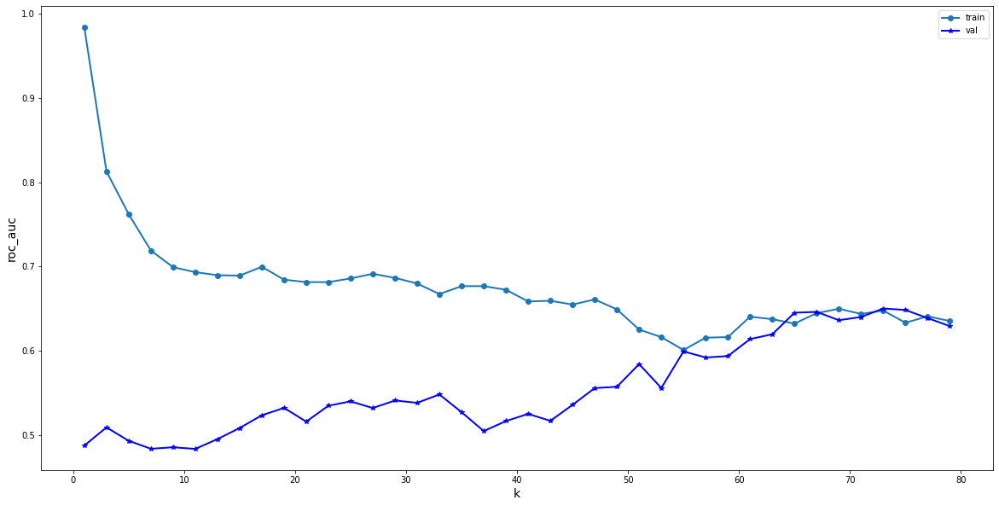

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.650
Valor correspondiente para el hiperparámetro: {'n_neighbors': 73}


In [ ]:
knn('roc_auc')

In [ ]:
kNN_clasif_all = KNeighborsClassifier(n_neighbors = 73)
modelo_knn_clasif2 = kNN_clasif_all.fit(X_train_filt, Y_train) 
y_output_knn2 = modelo_knn_clasif2.predict(X_test_filt)
A1_score = accuracy_score(Y_test, y_output_knn2)
f11_score = f1_score(Y_test, y_output_knn2)
r1_score = recall_score(Y_test, y_output_knn2)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_knn2))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.5609756097560976
La matriz de confusión obtenida: [[13 10]
 [ 8 10]]
El valor de f1_score obtenido: 0.5263157894736842
El valor de recall es 0.5555555555555556


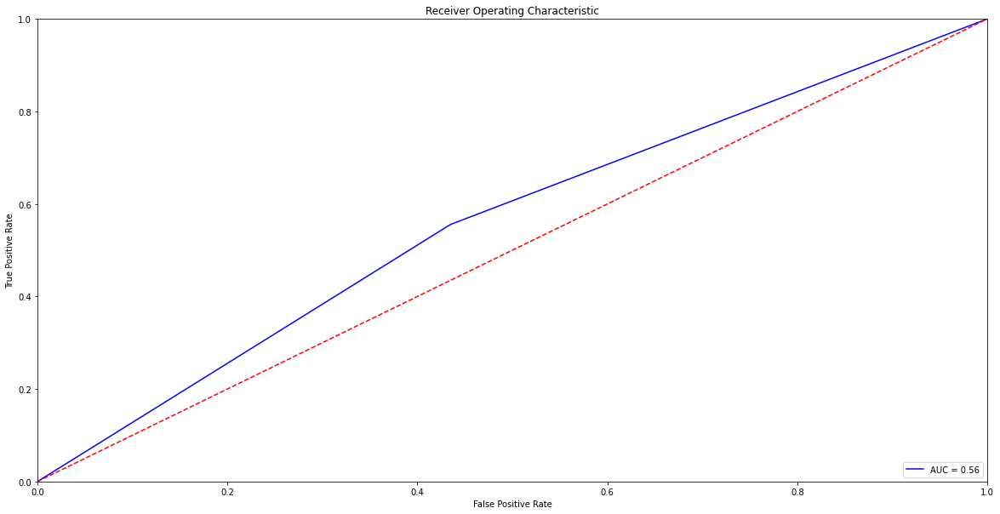

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_knn2)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:

A1_score = accuracy_score(Y_test, y_output_knn2)
f11_score = f1_score(Y_test, y_output_knn2)
r1_score = recall_score(Y_test, y_output_knn2)
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_knn2)
roc_auc_1 = metrics.auc(fpr, tpr)
print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_knn2))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.5609756097560976
La matriz de confusión obtenida: [[13 10]
 [ 8 10]]
El valor de f1_score obtenido: 0.5263157894736842
El valor de recall es 0.5555555555555556


In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# ***ÁRBOLES***

In [ ]:
from sklearn.tree import DecisionTreeClassifier

def arbol(figura):
  # 1. Selección de hiper-parámetros del árbol. En principio, consideraremos sólo la profundidad máxima
  param_grid = {'max_depth': range(1,3)}
  profundidad_grid = np.array(range(1,3))


  grid_arbol_clasif = GridSearchCV(DecisionTreeClassifier(random_state=0), param_grid = param_grid, scoring = figura, cv=3, return_train_score=True)
  modelo_arbol_clasif = grid_arbol_clasif.fit(X_train_filt, Y_train)
  print(grid_arbol_clasif.best_params_)

  perf_train_arbol = np.array(grid_arbol_clasif.cv_results_['mean_train_score'])
  perf_val_arbol = np.array(grid_arbol_clasif.cv_results_['mean_test_score'])

  plt.plot(profundidad_grid,perf_train_arbol,'-o',label="train", linewidth=2)
  plt.plot(profundidad_grid,perf_val_arbol,'-*b',label="val", linewidth=2)
  plt.xlabel('Profundidad',fontsize=14)
  plt.ylabel(figura,fontsize=14)
  plt.legend()
  plt.show()

  print("Mejor valor de la figura de mérito en validación cruzada: {:.3f}".format(grid_arbol_clasif.best_score_))
  print("Mejor valor del hiperparámetro: {}".format(grid_arbol_clasif.best_params_))


{'max_depth': 1}


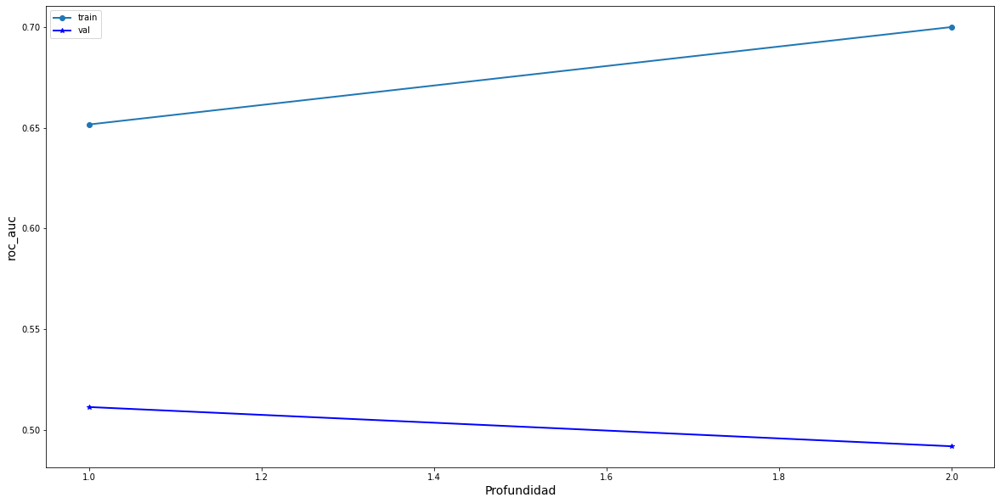

Mejor valor de la figura de mérito en validación cruzada: 0.511
Mejor valor del hiperparámetro: {'max_depth': 1}


In [ ]:
arbol('roc_auc')

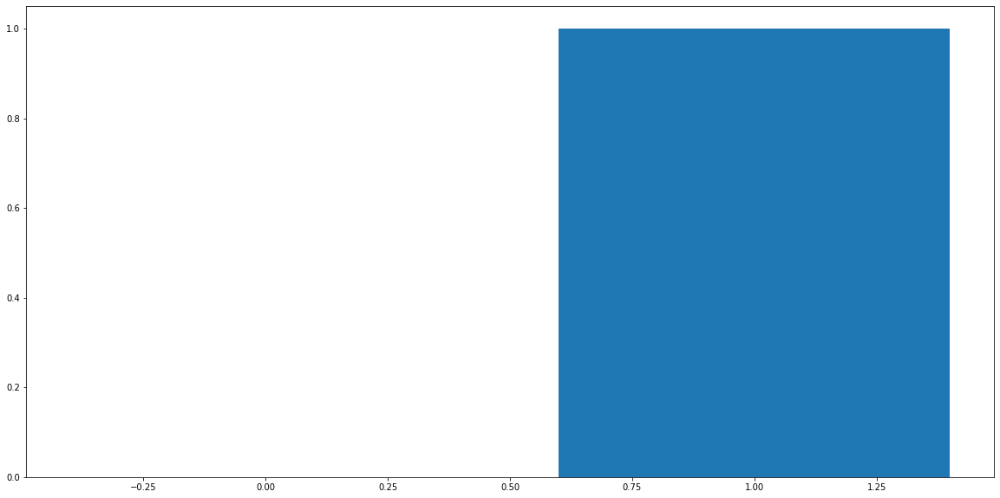

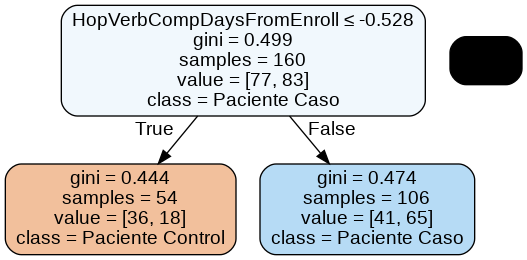

In [ ]:
# 4. Se representa la importancia de cada característica para el árbol diseñado
from matplotlib import pyplot
Arbol_clasif_all = DecisionTreeClassifier(max_depth=1)
modelo_arbol_clasif = Arbol_clasif_all.fit(X_train_filt, Y_train)
y_output_arbol = modelo_arbol_clasif.predict(X_test_filt)
importance_arbol = modelo_arbol_clasif.feature_importances_
pyplot.bar([x for x in range(len(importance_arbol))], importance_arbol)
pyplot.show()

# 5. Se representa gráficamente el modelo de clasificación
from sklearn.tree import export_graphviz
#from sklearn.externals.six import StringIO  
from six import StringIO
from IPython.display import Image  
import pydotplus

dot_data = StringIO()

export_graphviz(modelo_arbol_clasif, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = data.columns[[1,2]],class_names=['Paciente Control','Paciente Caso'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Tree_Clasif_all.png')
Image(graph.create_png())

In [ ]:
print("El valor de precisión obtenido:", accuracy_score(Y_test, y_output_arbol))
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_arbol))
print("El valor de f1_score obtenido:", f1_score(Y_test, y_output_arbol))
print("El valor de sensibilidad es", recall_score(Y_test, y_output_arbol))

El valor de precisión obtenido: 0.4634146341463415
La matriz de confusión obtenida: [[ 9 14]
 [ 8 10]]
El valor de f1_score obtenido: 0.4761904761904762
El valor de sensibilidad es 0.5555555555555556


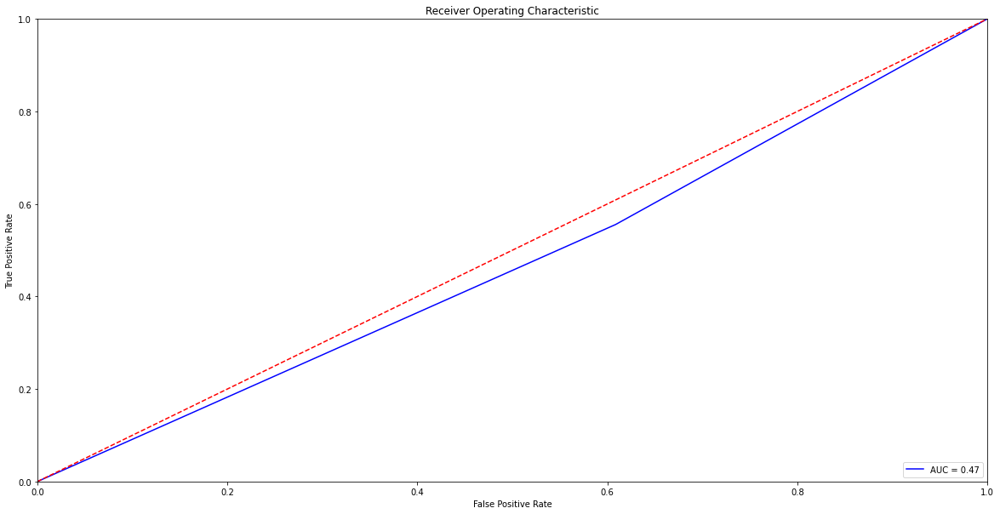

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_arbol)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
A1_score = accuracy_score(Y_test, y_output_arbol)
f11_score = f1_score(Y_test, y_output_arbol)
r1_score = recall_score(Y_test, y_output_arbol)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_arbol))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.4634146341463415
La matriz de confusión obtenida: [[ 9 14]
 [ 8 10]]
El valor de f1_score obtenido: 0.4761904761904762
El valor de recall es 0.5555555555555556


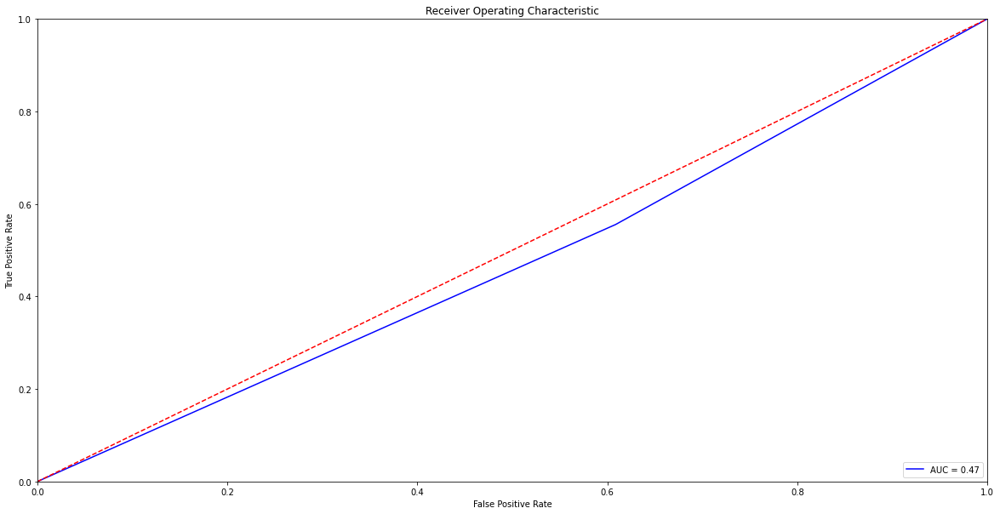

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_arbol)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# ***SVC***

In [ ]:
# Regresión logística con regularización 
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection   
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

svc=SVC(decision_function_shape='ovo')

# logreg= LogisticRegression(solver='liblinear')
parameters = {'kernel': ['rbf','poly'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
                     'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]}# l1 lasso l2 ridge
# valor_C=np.array([1e-8,1e-4,1,10,100])
svc=GridSearchCV(svc, parameters, scoring='roc_auc', cv=5, return_train_score=True)

svc.fit(X_train_filt, Y_train) #Entrenamos

# #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
roc_log_train = np.array(svc.cv_results_['mean_train_score']) 
roc_loc_val = np.array(svc.cv_results_['mean_test_score'])

# #Pintamos la evolución de nuestro modelo tanto en train como en validación para ver cuál es el mejor hiperparámetro para generalizar
# plt.plot(valor_C,roc_log_train,'-o',label="train", linewidth=2)
# plt.plot(valor_C,roc_loc_val,'-*b',label="val", linewidth=2)
# plt.xlabel('C',fontsize=14)
# plt.ylabel('Roc_auc',fontsize=14)
# plt.legend()
# plt.show()

# Mostramos el mejor valor del parámetro y el score
print("Valor correspondiente para el hiperparámetro: {}".format(svc.best_params_))
print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(svc.best_score_))


Valor correspondiente para el hiperparámetro: {'C': 10, 'gamma': 0.01, 'kernel': 'poly'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.645


In [ ]:


svc=SVC(C=10,kernel='poly',gamma=0.01,decision_function_shape='ovo')
svc.fit(X_train_filt,Y_train)
y_test_pred=svc.predict(X_test_filt)

In [ ]:
A1_score = accuracy_score(Y_test, y_test_pred)
f11_score = f1_score(Y_test, y_test_pred)
r1_score = recall_score(Y_test, y_test_pred)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_test_pred))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.43902439024390244
La matriz de confusión obtenida: [[ 0 23]
 [ 0 18]]
El valor de f1_score obtenido: 0.6101694915254238
El valor de recall es 1.0


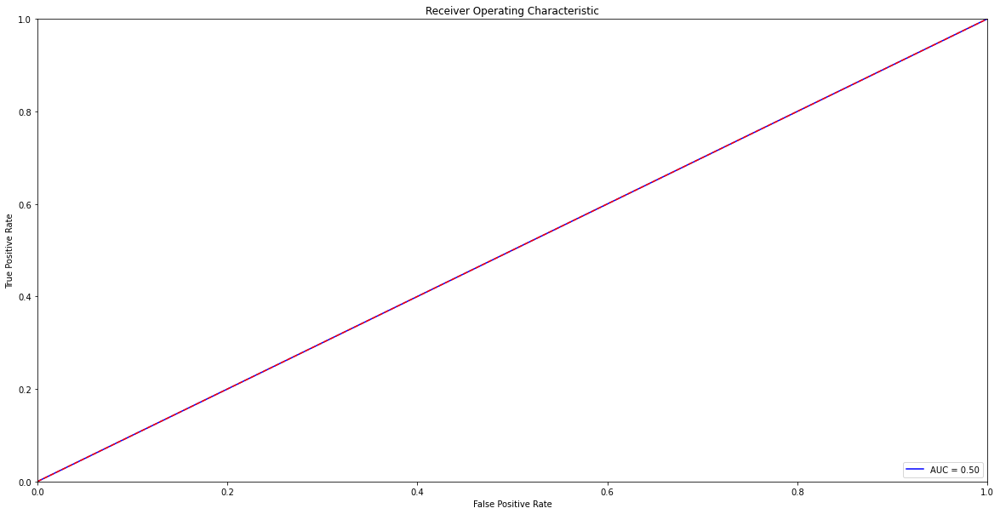

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_test_pred)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# **Métodos wrapper con k-nn**

# Sequential Forward Selection

In [ ]:
!pip install mlxtend
import joblib
import sys
sys.modules['sklearn.externals.joblib'] = joblib
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

In [ ]:

from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from sklearn.neighbors import KNeighborsClassifier

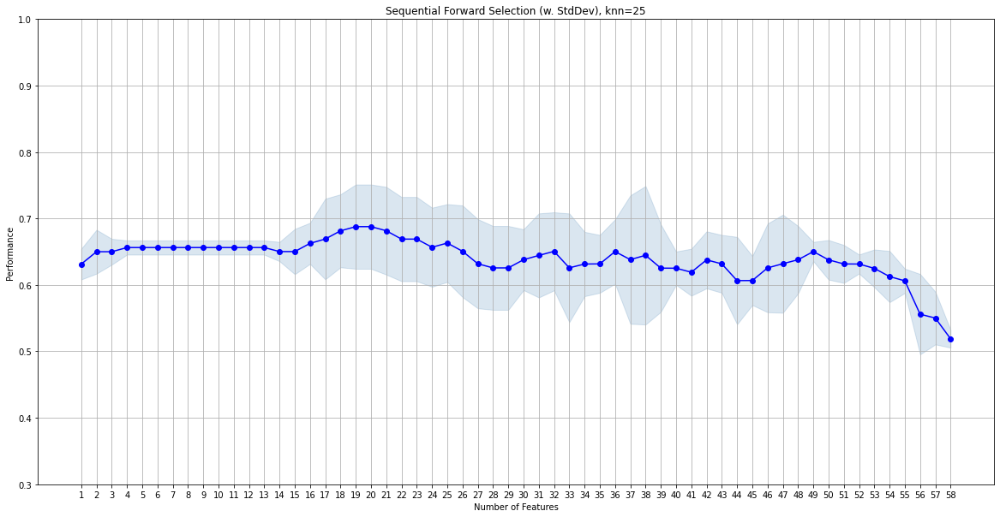

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(29,)","[0.6296296296296297, 0.6037735849056604, 0.660...",0.63126,"(29,)",0.052066,0.023137,0.01636
2,"(24, 29)","[0.6666666666666666, 0.6037735849056604, 0.679...",0.649895,"(24, 29)",0.074294,0.033015,0.023345
3,"(19, 24, 29)","[0.6666666666666666, 0.6226415094339622, 0.660...",0.649895,"(19, 24, 29)",0.04375,0.019442,0.013747
4,"(19, 24, 29, 44)","[0.6666666666666666, 0.6415094339622641, 0.660...",0.656184,"(19, 24, 29, 44)",0.024055,0.01069,0.007559
5,"(17, 19, 24, 29, 44)","[0.6666666666666666, 0.6415094339622641, 0.660...",0.656184,"(17, 19, 24, 29, 44)",0.024055,0.01069,0.007559
6,"(17, 19, 23, 24, 29, 44)","[0.6666666666666666, 0.6415094339622641, 0.660...",0.656184,"(17, 19, 23, 24, 29, 44)",0.024055,0.01069,0.007559
7,"(17, 19, 23, 24, 28, 29, 44)","[0.6666666666666666, 0.6415094339622641, 0.660...",0.656184,"(17, 19, 23, 24, 28, 29, 44)",0.024055,0.01069,0.007559
8,"(17, 19, 23, 24, 28, 29, 31, 44)","[0.6666666666666666, 0.6415094339622641, 0.660...",0.656184,"(17, 19, 23, 24, 28, 29, 31, 44)",0.024055,0.01069,0.007559
9,"(17, 19, 23, 24, 28, 29, 31, 40, 44)","[0.6666666666666666, 0.6415094339622641, 0.660...",0.656184,"(17, 19, 23, 24, 28, 29, 31, 40, 44)",0.024055,0.01069,0.007559
10,"(17, 19, 23, 24, 28, 29, 31, 40, 42, 44)","[0.6666666666666666, 0.6415094339622641, 0.660...",0.656184,"(17, 19, 23, 24, 28, 29, 31, 40, 42, 44)",0.024055,0.01069,0.007559


In [ ]:
valor_k = 25
knn = KNeighborsClassifier(n_neighbors=valor_k)
sfs = SFS(knn, 
           k_features=58, #Queremos llegar a 30 caracteristicas
           forward=True, 
           floating=False, 
           scoring='accuracy',
           cv=3)

sfs = sfs.fit(X_std_train2, Y_train)

# Representar los resultados
fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_dev')
plt.ylim([0.3, 1])
plt.title('Sequential Forward Selection (w. StdDev), knn=' + str(valor_k))
plt.grid()
plt.show()

pd.DataFrame.from_dict(sfs.get_metric_dict()).T


In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score

# Según SFS, escogería f0, f1, f5 y f7 
X_train_norm_SFS = X_std_train2[:,[17, 19, 24, 29, 44]]
X_test_norm_SFS = X_std_test2[:,[17, 19, 24, 29, 44]]


# ***Regresión logística con regularización***

In [ ]:
# Regresión logística con regularización 
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection   
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

logreg= LogisticRegression(solver='liblinear')
parameters = {"C":[1e-8,1e-4,10,100],"penalty":["l1","l2"]}# l1 lasso l2 ridge
valor_C=np.array([1e-8,1e-4,10,100])
log_regression=GridSearchCV(logreg, parameters, scoring='roc_auc', cv=5, return_train_score=True)

log_regression.fit(X_train_norm_SFS, Y_train) #Entrenamos

# #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
roc_log_train = np.array(log_regression.cv_results_['mean_train_score']) 
roc_loc_val = np.array(log_regression.cv_results_['mean_test_score'])

# #Pintamos la evolución de nuestro modelo tanto en train como en validación para ver cuál es el mejor hiperparámetro para generalizar
# plt.plot(valor_C,roc_log_train,'-o',label="train", linewidth=2)
# plt.plot(valor_C,roc_loc_val,'-*b',label="val", linewidth=2)
# plt.xlabel('C',fontsize=14)
# plt.ylabel('Roc_auc',fontsize=14)
# plt.legend()
# plt.show()

# Mostramos el mejor valor del parámetro y el score
print("Valor correspondiente para el hiperparámetro: {}".format(log_regression.best_params_))
print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(log_regression.best_score_))


Valor correspondiente para el hiperparámetro: {'C': 10, 'penalty': 'l2'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.646


In [ ]:
from sklearn.linear_model import Lasso

logridge=LogisticRegression(solver='liblinear', penalty='l2', C=10)
modelo_rid_log=logridge.fit(X_train_norm_SFS, Y_train)

# Obtenemos la salida predicha
y_pred_ridlog = modelo_rid_log.predict(X_test_norm_SFS)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score

#  Calculamos la matriz de confusión
cm = confusion_matrix(Y_test, y_pred_ridlog)
print(cm)

tn, fp, fn, tp = confusion_matrix(Y_test, y_pred_ridlog).ravel()
print(f'tn: {tn}, fp:{fp}, fn:{fn}, tp:{tp}')

# Calcumos accuracy_score
Accuracy=accuracy_score(Y_test, y_pred_ridlog)
print(f'Accuracy: {Accuracy}')

target_names = ['Paciente control', 'Paciente caso']
print(classification_report(Y_test, y_pred_ridlog, target_names=target_names))
              
#Sensibilidad
Sensibilidad_3 = recall_score(Y_test, y_pred_ridlog)
# S_results.append(Sensibilidad_3)
print(f'Sensibilidad: {Sensibilidad_3}')

[[11 12]
 [ 7 11]]
tn: 11, fp:12, fn:7, tp:11
Accuracy: 0.5365853658536586
                  precision    recall  f1-score   support

Paciente control       0.61      0.48      0.54        23
   Paciente caso       0.48      0.61      0.54        18

        accuracy                           0.54        41
       macro avg       0.54      0.54      0.54        41
    weighted avg       0.55      0.54      0.54        41

Sensibilidad: 0.6111111111111112


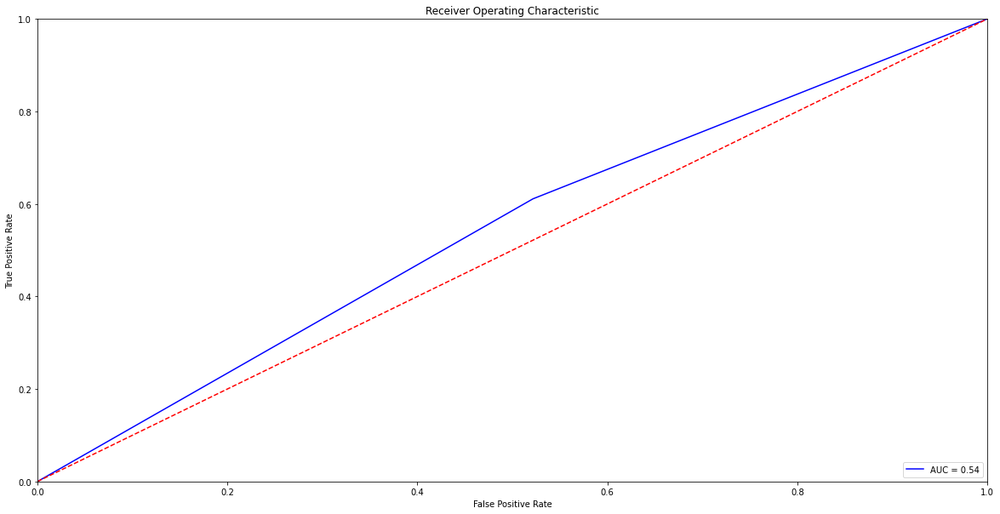

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_pred_ridlog)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:

A1_score = accuracy_score(Y_test, y_pred_ridlog)
f11_score = f1_score(Y_test, y_pred_ridlog)
r1_score = recall_score(Y_test, y_pred_ridlog)
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_pred_ridlog)
roc_auc_1 = metrics.auc(fpr, tpr)
print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_pred_ridlog))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.5365853658536586
La matriz de confusión obtenida: [[11 12]
 [ 7 11]]
El valor de f1_score obtenido: 0.5365853658536586
El valor de recall es 0.6111111111111112


In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# **Knn por votación**

In [ ]:

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn import preprocessing
#from mlxtend.plotting import plot_learning_curves

In [ ]:
def knn (figura):
  # 5. Selección del hiper-parámetro haciendo uso del conjunto de diseño con características estandarizadas. 

  param_grid = {'n_neighbors': range(1,81,2)}
  k_grid = np.array(range(1,81,2))
  grid_knn = GridSearchCV(KNeighborsClassifier(), param_grid = param_grid, scoring = figura, cv=3, return_train_score=True)
  grid_knn.fit(X_train_norm_SFS, Y_train) 

  #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
  
  auc_knn_all_train = np.array(grid_knn.cv_results_['mean_train_score'])
  auc_knn_all_val = np.array(grid_knn.cv_results_['mean_test_score'])


  plt.plot(k_grid,auc_knn_all_train,'-o',label="train", linewidth=2)
  plt.plot(k_grid,auc_knn_all_val,'-*b',label="val", linewidth=2)
  plt.xlabel('k',fontsize=14)
  plt.ylabel(figura,fontsize=14)
  plt.legend()
  plt.show()

  print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(grid_knn.best_score_))
  print("Valor correspondiente para el hiperparámetro: {}".format(grid_knn.best_params_))

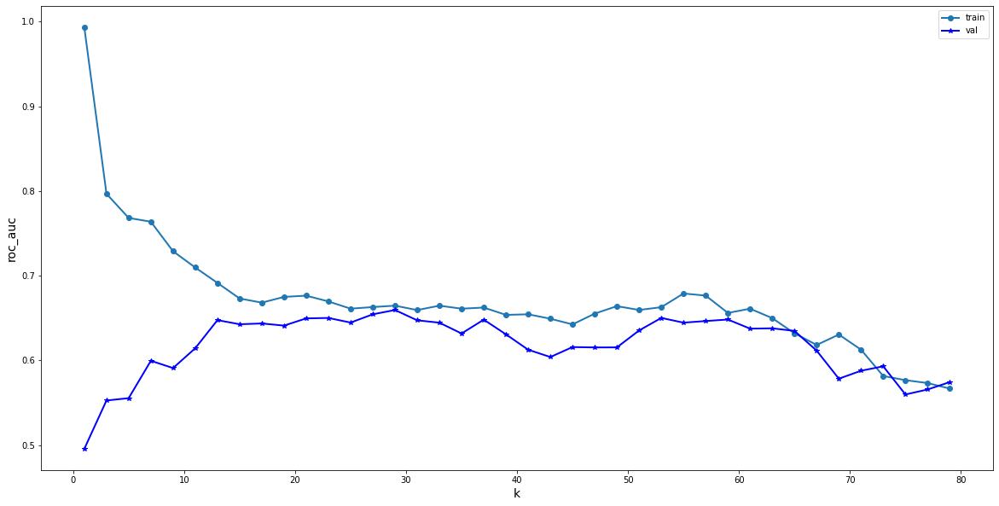

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.660
Valor correspondiente para el hiperparámetro: {'n_neighbors': 29}


In [ ]:
knn('roc_auc')

In [ ]:
kNN_clasif_all = KNeighborsClassifier(n_neighbors = 29)
modelo_knn_clasif2 = kNN_clasif_all.fit(X_train_norm_SFS, Y_train) 
y_output_knn2 = modelo_knn_clasif2.predict(X_test_norm_SFS)
A1_score = accuracy_score(Y_test, y_output_knn2)
f11_score = f1_score(Y_test, y_output_knn2)
r1_score = recall_score(Y_test, y_output_knn2)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_knn2))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.4878048780487805
La matriz de confusión obtenida: [[13 10]
 [11  7]]
El valor de f1_score obtenido: 0.39999999999999997
El valor de recall es 0.3888888888888889


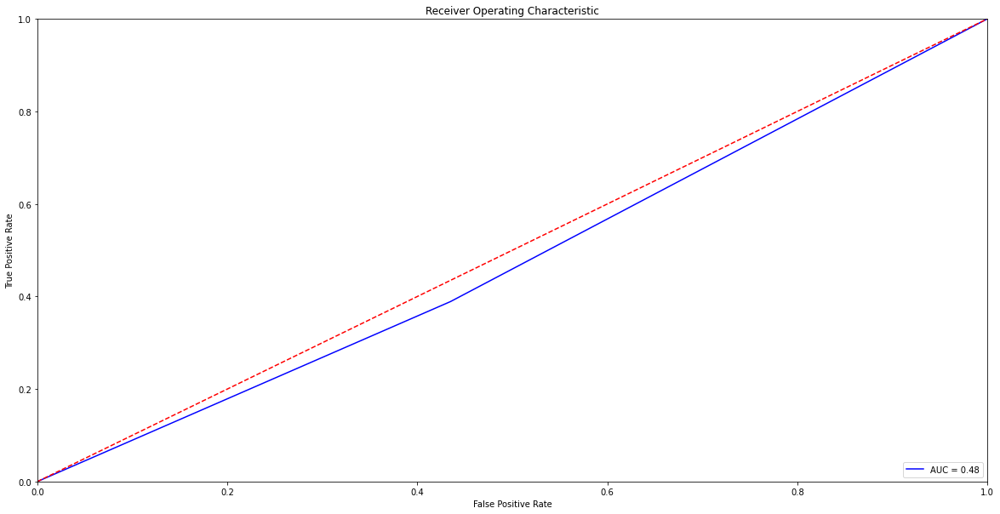

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_knn2)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:

A1_score = accuracy_score(Y_test, y_output_knn2)
f11_score = f1_score(Y_test, y_output_knn2)
r1_score = recall_score(Y_test, y_output_knn2)
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_knn2)
roc_auc_1 = metrics.auc(fpr, tpr)
print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_knn2))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.4878048780487805
La matriz de confusión obtenida: [[13 10]
 [11  7]]
El valor de f1_score obtenido: 0.39999999999999997
El valor de recall es 0.3888888888888889


In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# ***ÁRBOLES***

In [ ]:
from sklearn.tree import DecisionTreeClassifier

def arbol(figura):
  # 1. Selección de hiper-parámetros del árbol. En principio, consideraremos sólo la profundidad máxima
  param_grid = {'max_depth': range(1,6)}
  profundidad_grid = np.array(range(1,6))


  grid_arbol_clasif = GridSearchCV(DecisionTreeClassifier(random_state=0), param_grid = param_grid, scoring = figura, cv=3, return_train_score=True)
  modelo_arbol_clasif = grid_arbol_clasif.fit(X_train_norm_SFS, Y_train)
  print(grid_arbol_clasif.best_params_)

  perf_train_arbol = np.array(grid_arbol_clasif.cv_results_['mean_train_score'])
  perf_val_arbol = np.array(grid_arbol_clasif.cv_results_['mean_test_score'])

  plt.plot(profundidad_grid,perf_train_arbol,'-o',label="train", linewidth=2)
  plt.plot(profundidad_grid,perf_val_arbol,'-*b',label="val", linewidth=2)
  plt.xlabel('Profundidad',fontsize=14)
  plt.ylabel(figura,fontsize=14)
  plt.legend()
  plt.show()

  print("Mejor valor de la figura de mérito en validación cruzada: {:.3f}".format(grid_arbol_clasif.best_score_))
  print("Mejor valor del hiperparámetro: {}".format(grid_arbol_clasif.best_params_))


{'max_depth': 2}


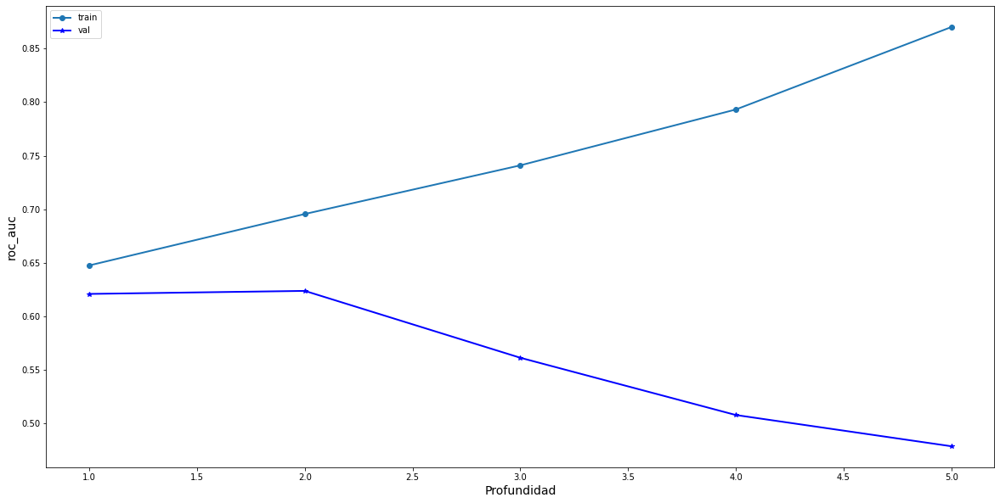

Mejor valor de la figura de mérito en validación cruzada: 0.624
Mejor valor del hiperparámetro: {'max_depth': 2}


In [ ]:
arbol('roc_auc')

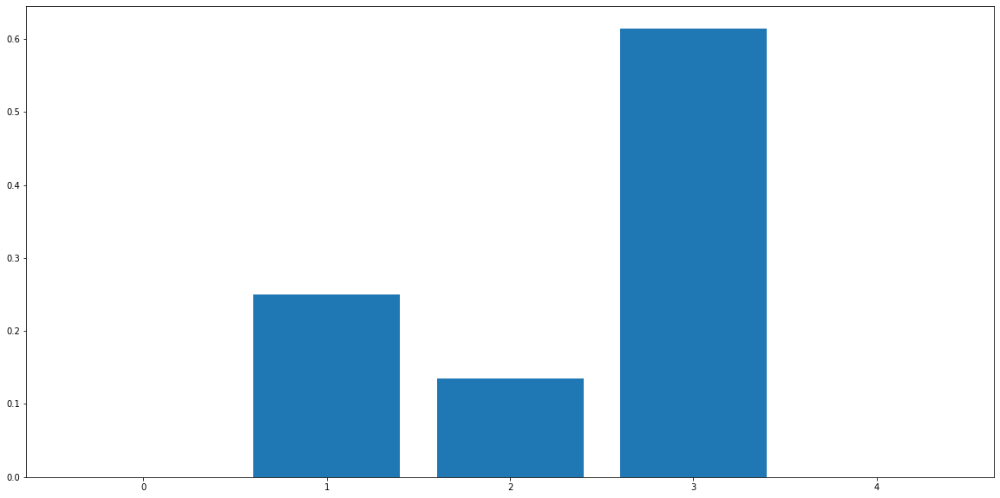

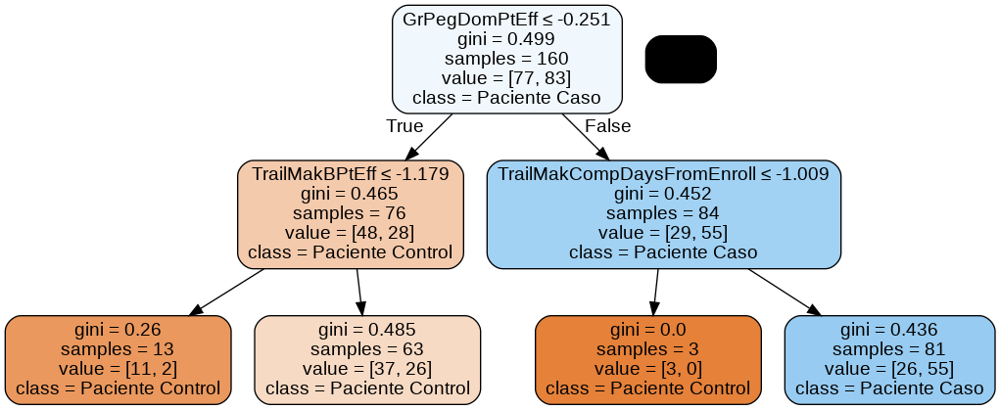

In [ ]:
# 4. Se representa la importancia de cada característica para el árbol diseñado
from matplotlib import pyplot
Arbol_clasif_all = DecisionTreeClassifier(max_depth=2)
modelo_arbol_clasif = Arbol_clasif_all.fit(X_train_norm_SFS, Y_train)
y_output_arbol = modelo_arbol_clasif.predict(X_test_norm_SFS)
importance_arbol = modelo_arbol_clasif.feature_importances_
pyplot.bar([x for x in range(len(importance_arbol))], importance_arbol)
pyplot.show()

# 5. Se representa gráficamente el modelo de clasificación
from sklearn.tree import export_graphviz
#from sklearn.externals.six import StringIO  
from six import StringIO
from IPython.display import Image  
import pydotplus

dot_data = StringIO()

export_graphviz(modelo_arbol_clasif, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = data.columns[[17, 19, 24, 29, 44]],class_names=['Paciente Control','Paciente Caso'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Tree_Clasif_all.png')
Image(graph.create_png())

In [ ]:
print("El valor de precisión obtenido:", accuracy_score(Y_test, y_output_arbol))
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_arbol))
print("El valor de f1_score obtenido:", f1_score(Y_test, y_output_arbol))
print("El valor de sensibilidad es", recall_score(Y_test, y_output_arbol))

El valor de precisión obtenido: 0.5853658536585366
La matriz de confusión obtenida: [[14  9]
 [ 8 10]]
El valor de f1_score obtenido: 0.5405405405405405
El valor de sensibilidad es 0.5555555555555556


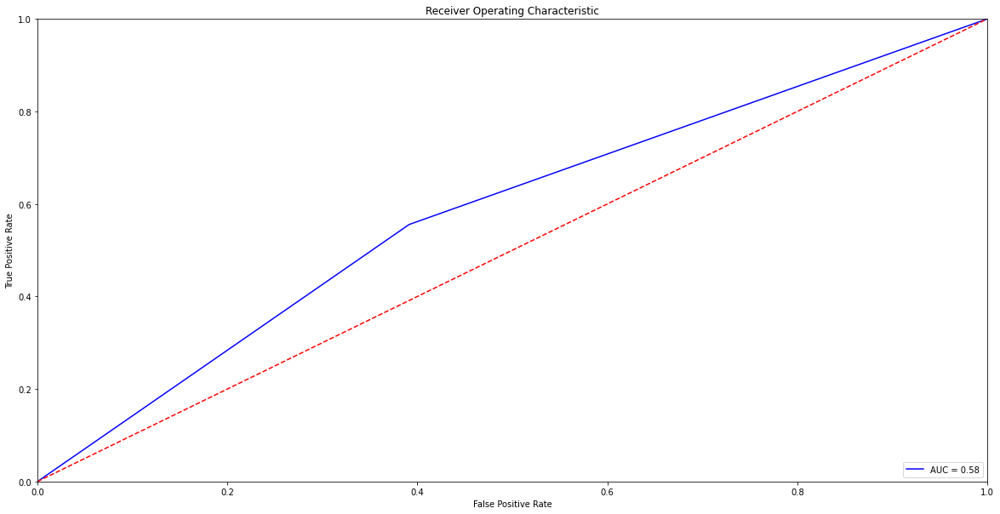

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_arbol)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
A1_score = accuracy_score(Y_test, y_output_arbol)
f11_score = f1_score(Y_test, y_output_arbol)
r1_score = recall_score(Y_test, y_output_arbol)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_arbol))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.5853658536585366
La matriz de confusión obtenida: [[14  9]
 [ 8 10]]
El valor de f1_score obtenido: 0.5405405405405405
El valor de recall es 0.5555555555555556


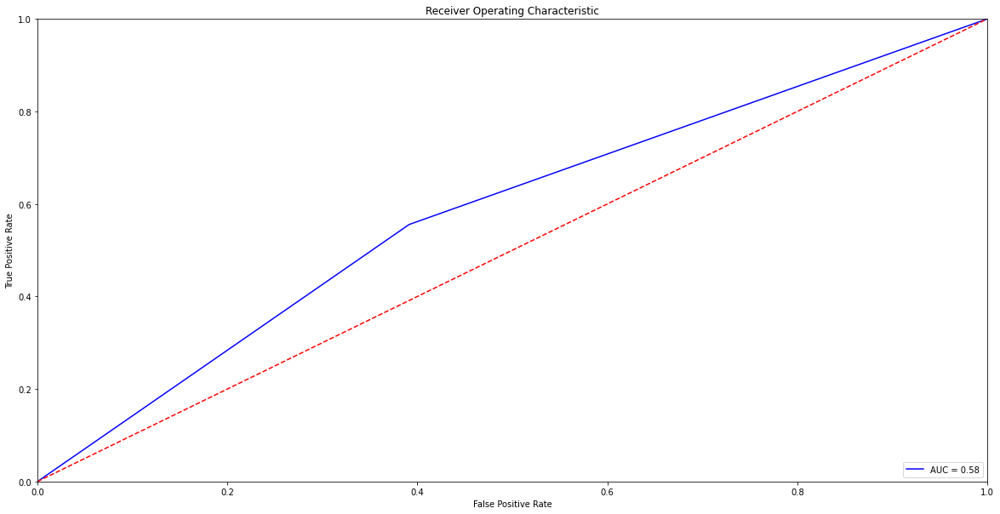

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_arbol)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# ***SVC***

In [ ]:
# Regresión logística con regularización 
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection   
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

svc=SVC(decision_function_shape='ovo')

# logreg= LogisticRegression(solver='liblinear')
parameters = {'kernel': ['rbf','poly'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
                     'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]}# l1 lasso l2 ridge
# valor_C=np.array([1e-8,1e-4,1,10,100])
svc=GridSearchCV(svc, parameters, scoring='roc_auc', cv=5, return_train_score=True)

svc.fit(X_train_norm_SFS, Y_train) #Entrenamos

# #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
roc_log_train = np.array(svc.cv_results_['mean_train_score']) 
roc_loc_val = np.array(svc.cv_results_['mean_test_score'])

# #Pintamos la evolución de nuestro modelo tanto en train como en validación para ver cuál es el mejor hiperparámetro para generalizar
# plt.plot(valor_C,roc_log_train,'-o',label="train", linewidth=2)
# plt.plot(valor_C,roc_loc_val,'-*b',label="val", linewidth=2)
# plt.xlabel('C',fontsize=14)
# plt.ylabel('Roc_auc',fontsize=14)
# plt.legend()
# plt.show()

# Mostramos el mejor valor del parámetro y el score
print("Valor correspondiente para el hiperparámetro: {}".format(svc.best_params_))
print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(svc.best_score_))


Valor correspondiente para el hiperparámetro: {'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.655


In [ ]:


svc=SVC(C=0.1,kernel='rbf',gamma=0.001,decision_function_shape='ovo')
svc.fit(X_train_norm_SFS,Y_train)
y_test_pred=svc.predict(X_test_norm_SFS)

In [ ]:
A1_score = accuracy_score(Y_test, y_test_pred)
f11_score = f1_score(Y_test, y_test_pred)
r1_score = recall_score(Y_test, y_test_pred)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_test_pred))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.43902439024390244
La matriz de confusión obtenida: [[ 0 23]
 [ 0 18]]
El valor de f1_score obtenido: 0.6101694915254238
El valor de recall es 1.0


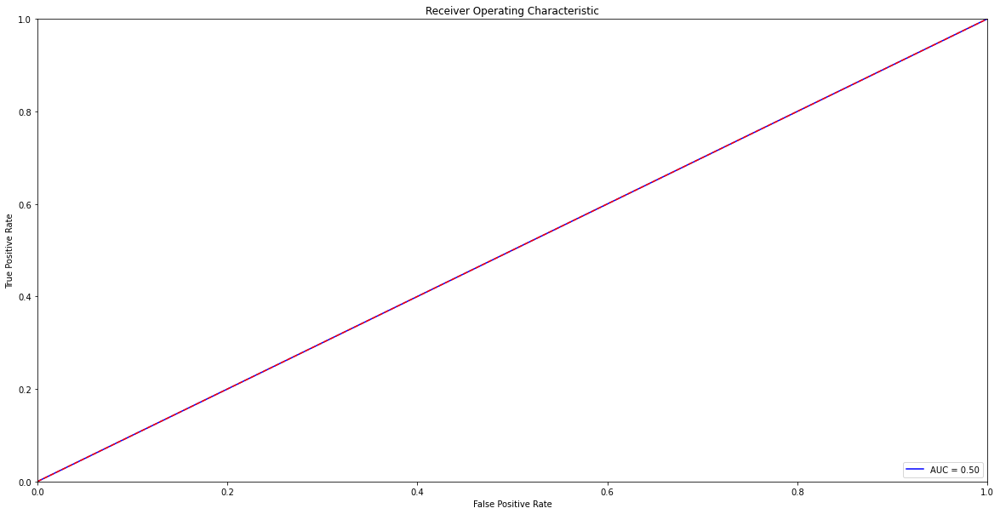

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_test_pred)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# Sequential Backward Elimination

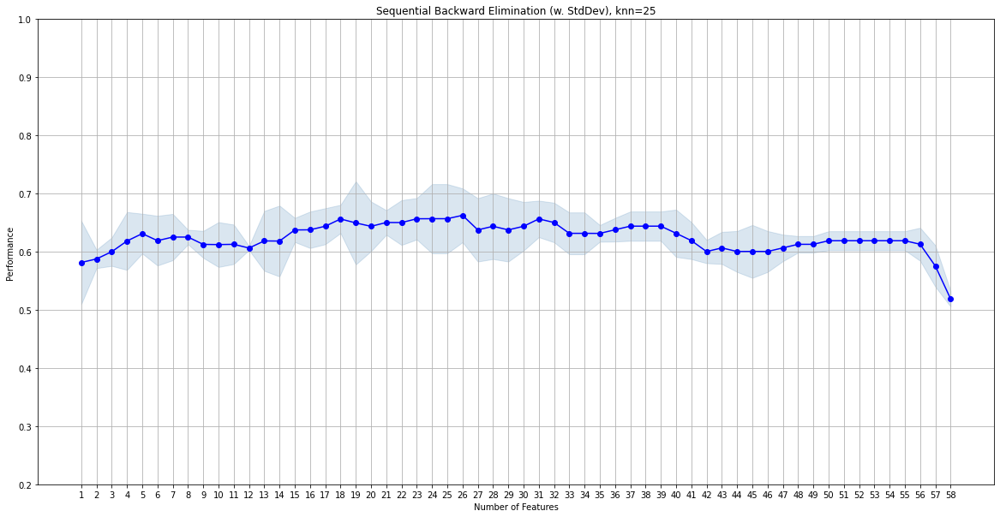

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
58,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.5, 0.5283018867924528, 0.5283018867924528]",0.518868,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.030023,0.013342,0.009434
57,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.5370370370370371, 0.6226415094339622, 0.566...",0.575239,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.079995,0.035548,0.025136
56,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.5740740740740741, 0.6226415094339622, 0.641...",0.612742,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.063924,0.028406,0.020086
55,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.6111111111111112, 0.6415094339622641, 0.603...",0.618798,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.036762,0.016336,0.011552
54,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.6111111111111112, 0.6415094339622641, 0.603...",0.618798,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.036762,0.016336,0.011552
53,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.6111111111111112, 0.6415094339622641, 0.603...",0.618798,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.036762,0.016336,0.011552
52,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.6111111111111112, 0.6415094339622641, 0.603...",0.618798,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.036762,0.016336,0.011552
51,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.6111111111111112, 0.6415094339622641, 0.603...",0.618798,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.036762,0.016336,0.011552
50,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14,...","[0.6111111111111112, 0.6415094339622641, 0.603...",0.618798,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14,...",0.036762,0.016336,0.011552
49,"(0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15...","[0.5925925925925926, 0.6226415094339622, 0.622...",0.612625,"(0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15...",0.031876,0.014165,0.010016


In [ ]:
# Sequential Backward Selection
valor_k = 25
knn = KNeighborsClassifier(n_neighbors=valor_k)

sbs = SFS(knn, 
          k_features=1, 
          forward=False, 
          floating=False, 
          scoring='accuracy',
          cv=3)
sbs = sbs.fit(X_std_train2, Y_train)



# Plotting the results
fig4 = plot_sfs(sbs.get_metric_dict(), kind='std_dev')
plt.ylim([0.2, 1])
plt.title('Sequential Backward Elimination (w. StdDev), knn=' + str(valor_k))
plt.grid()
plt.show()

pd.DataFrame.from_dict(sbs.get_metric_dict()).T

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score

# Según SFS, escogería f0, f1, f5 y f7 
X_train_SFS = X_std_train2[:,[2, 3, 4, 7, 10, 19, 32, 43, 46, 50, 52, 54]]
X_test_SFS = X_std_test2[:,[2, 3, 4, 7, 10, 19, 32, 43, 46, 50, 52, 54]]


# ***Regresión logística con regularización***

In [ ]:
# Regresión logística con regularización 
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection   
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

logreg= LogisticRegression(solver='liblinear')
parameters = {"C":[1e-8,1e-4,10,100],"penalty":["l1","l2"]}# l1 lasso l2 ridge
valor_C=np.array([1e-8,1e-4,10,100])
log_regression=GridSearchCV(logreg, parameters, scoring='roc_auc', cv=5, return_train_score=True)

log_regression.fit(X_train_SFS, Y_train) #Entrenamos

# #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
roc_log_train = np.array(log_regression.cv_results_['mean_train_score']) 
roc_loc_val = np.array(log_regression.cv_results_['mean_test_score'])

# #Pintamos la evolución de nuestro modelo tanto en train como en validación para ver cuál es el mejor hiperparámetro para generalizar
# plt.plot(valor_C,roc_log_train,'-o',label="train", linewidth=2)
# plt.plot(valor_C,roc_loc_val,'-*b',label="val", linewidth=2)
# plt.xlabel('C',fontsize=14)
# plt.ylabel('Roc_auc',fontsize=14)
# plt.legend()
# plt.show()

# Mostramos el mejor valor del parámetro y el score
print("Valor correspondiente para el hiperparámetro: {}".format(log_regression.best_params_))
print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(log_regression.best_score_))


Valor correspondiente para el hiperparámetro: {'C': 1e-08, 'penalty': 'l2'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.619


In [ ]:
from sklearn.linear_model import Lasso

logridge=LogisticRegression(solver='liblinear', penalty='l2', C=1e-08)
modelo_rid_log=logridge.fit(X_train_SFS, Y_train)

# Obtenemos la salida predicha
y_pred_ridlog = modelo_rid_log.predict(X_test_SFS)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score

#  Calculamos la matriz de confusión
cm = confusion_matrix(Y_test, y_pred_ridlog)
print(cm)

tn, fp, fn, tp = confusion_matrix(Y_test, y_pred_ridlog).ravel()
print(f'tn: {tn}, fp:{fp}, fn:{fn}, tp:{tp}')

# Calcumos accuracy_score
Accuracy=accuracy_score(Y_test, y_pred_ridlog)
print(f'Accuracy: {Accuracy}')

target_names = ['Paciente control', 'Paciente caso']
print(classification_report(Y_test, y_pred_ridlog, target_names=target_names))
              
#Sensibilidad
Sensibilidad_3 = recall_score(Y_test, y_pred_ridlog)
# S_results.append(Sensibilidad_3)
print(f'Sensibilidad: {Sensibilidad_3}')

[[16  7]
 [11  7]]
tn: 16, fp:7, fn:11, tp:7
Accuracy: 0.5609756097560976
                  precision    recall  f1-score   support

Paciente control       0.59      0.70      0.64        23
   Paciente caso       0.50      0.39      0.44        18

        accuracy                           0.56        41
       macro avg       0.55      0.54      0.54        41
    weighted avg       0.55      0.56      0.55        41

Sensibilidad: 0.3888888888888889


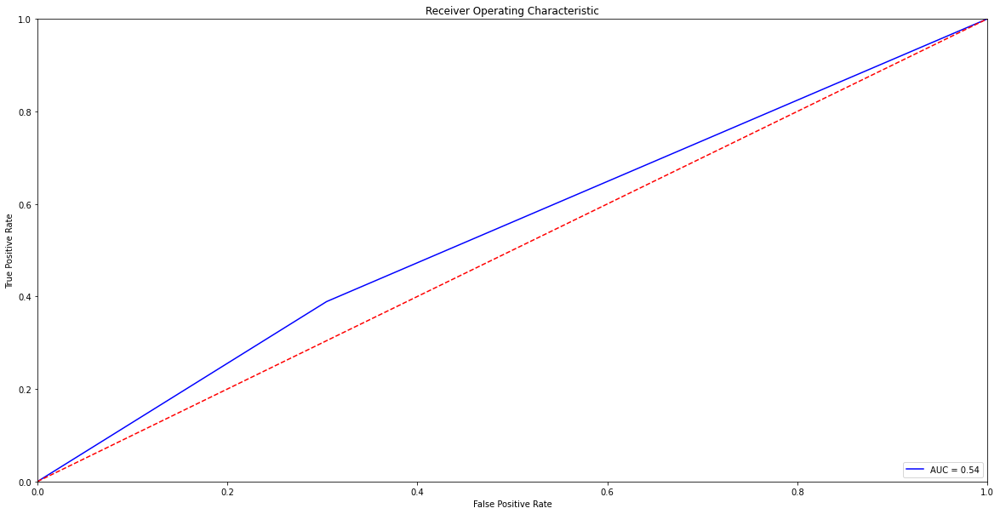

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_pred_ridlog)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:

A1_score = accuracy_score(Y_test, y_pred_ridlog)
f11_score = f1_score(Y_test, y_pred_ridlog)
r1_score = recall_score(Y_test, y_pred_ridlog)
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_pred_ridlog)
roc_auc_1 = metrics.auc(fpr, tpr)
print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_pred_ridlog))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.5609756097560976
La matriz de confusión obtenida: [[16  7]
 [11  7]]
El valor de f1_score obtenido: 0.43750000000000006
El valor de recall es 0.3888888888888889


In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# **Knn por votación**

In [ ]:

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn import preprocessing
#from mlxtend.plotting import plot_learning_curves

In [ ]:
def knn (figura):
  # 5. Selección del hiper-parámetro haciendo uso del conjunto de diseño con características estandarizadas. 

  param_grid = {'n_neighbors': range(1,81,2)}
  k_grid = np.array(range(1,81,2))
  grid_knn = GridSearchCV(KNeighborsClassifier(), param_grid = param_grid, scoring = figura, cv=3, return_train_score=True)
  grid_knn.fit(X_train_SFS, Y_train) 

  #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
  
  auc_knn_all_train = np.array(grid_knn.cv_results_['mean_train_score'])
  auc_knn_all_val = np.array(grid_knn.cv_results_['mean_test_score'])


  plt.plot(k_grid,auc_knn_all_train,'-o',label="train", linewidth=2)
  plt.plot(k_grid,auc_knn_all_val,'-*b',label="val", linewidth=2)
  plt.xlabel('k',fontsize=14)
  plt.ylabel(figura,fontsize=14)
  plt.legend()
  plt.show()

  print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(grid_knn.best_score_))
  print("Valor correspondiente para el hiperparámetro: {}".format(grid_knn.best_params_))

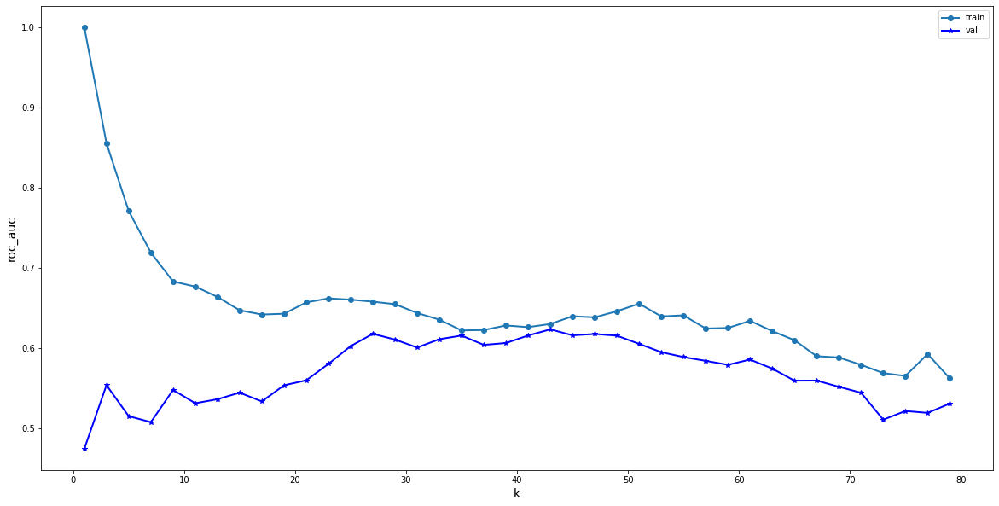

Mayor valor de la figura de mérito en validación con características estandarizadas: 0.624
Valor correspondiente para el hiperparámetro: {'n_neighbors': 43}


In [ ]:
knn('roc_auc')

In [ ]:
kNN_clasif_all = KNeighborsClassifier(n_neighbors = 43)
modelo_knn_clasif2 = kNN_clasif_all.fit(X_train_SFS, Y_train) 
y_output_knn2 = modelo_knn_clasif2.predict(X_test_SFS)
A1_score = accuracy_score(Y_test, y_output_knn2)
f11_score = f1_score(Y_test, y_output_knn2)
r1_score = recall_score(Y_test, y_output_knn2)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_knn2))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.5609756097560976
La matriz de confusión obtenida: [[20  3]
 [15  3]]
El valor de f1_score obtenido: 0.25
El valor de recall es 0.16666666666666666


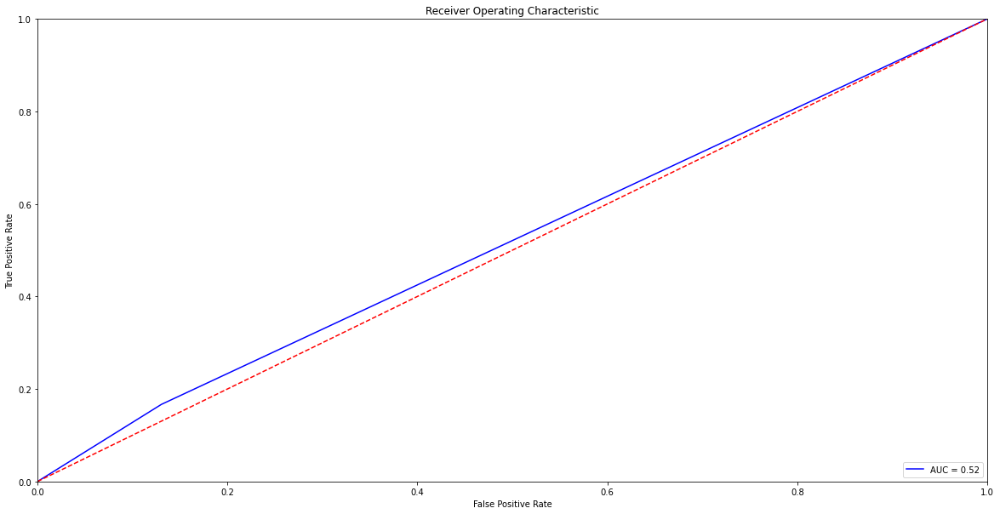

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_knn2)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:

A1_score = accuracy_score(Y_test, y_output_knn2)
f11_score = f1_score(Y_test, y_output_knn2)
r1_score = recall_score(Y_test, y_output_knn2)
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_knn2)
roc_auc_1 = metrics.auc(fpr, tpr)
print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_knn2))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.5609756097560976
La matriz de confusión obtenida: [[20  3]
 [15  3]]
El valor de f1_score obtenido: 0.25
El valor de recall es 0.16666666666666666


In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# ***ÁRBOLES***

In [ ]:
from sklearn.tree import DecisionTreeClassifier

def arbol(figura):
  # 1. Selección de hiper-parámetros del árbol. En principio, consideraremos sólo la profundidad máxima
  param_grid = {'max_depth': range(1,13)}
  profundidad_grid = np.array(range(1,13))


  grid_arbol_clasif = GridSearchCV(DecisionTreeClassifier(random_state=0), param_grid = param_grid, scoring = figura, cv=3, return_train_score=True)
  modelo_arbol_clasif = grid_arbol_clasif.fit(X_train_SFS, Y_train)
  print(grid_arbol_clasif.best_params_)

  perf_train_arbol = np.array(grid_arbol_clasif.cv_results_['mean_train_score'])
  perf_val_arbol = np.array(grid_arbol_clasif.cv_results_['mean_test_score'])

  plt.plot(profundidad_grid,perf_train_arbol,'-o',label="train", linewidth=2)
  plt.plot(profundidad_grid,perf_val_arbol,'-*b',label="val", linewidth=2)
  plt.xlabel('Profundidad',fontsize=14)
  plt.ylabel(figura,fontsize=14)
  plt.legend()
  plt.show()

  print("Mejor valor de la figura de mérito en validación cruzada: {:.3f}".format(grid_arbol_clasif.best_score_))
  print("Mejor valor del hiperparámetro: {}".format(grid_arbol_clasif.best_params_))


{'max_depth': 2}


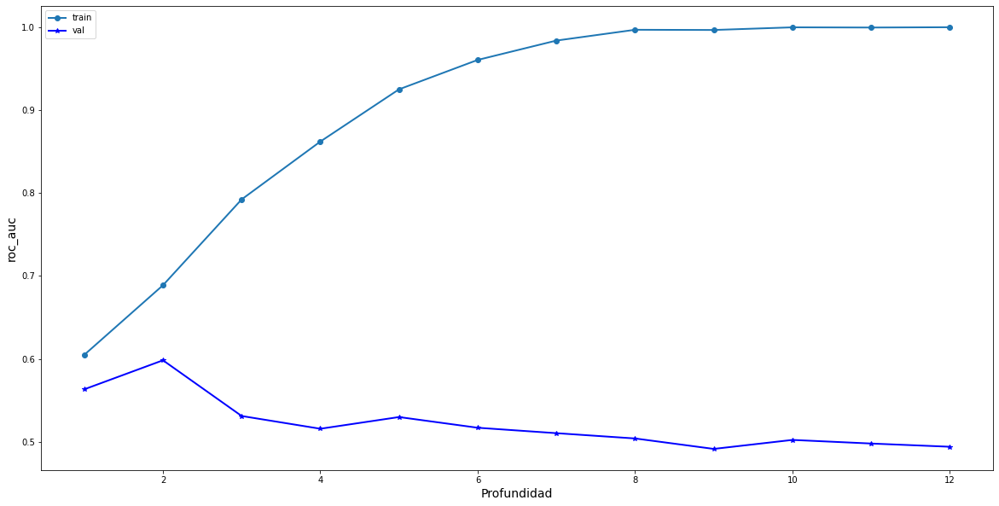

Mejor valor de la figura de mérito en validación cruzada: 0.598
Mejor valor del hiperparámetro: {'max_depth': 2}


In [ ]:
arbol('roc_auc')

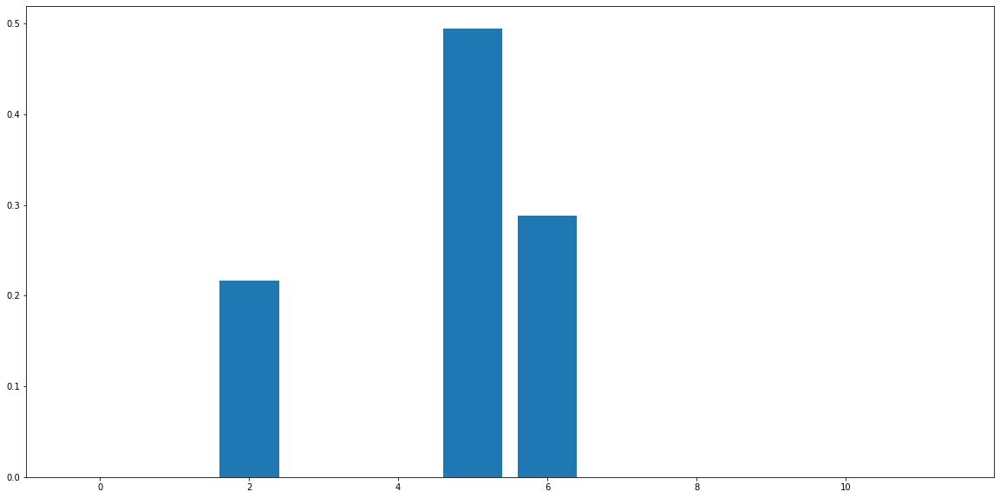

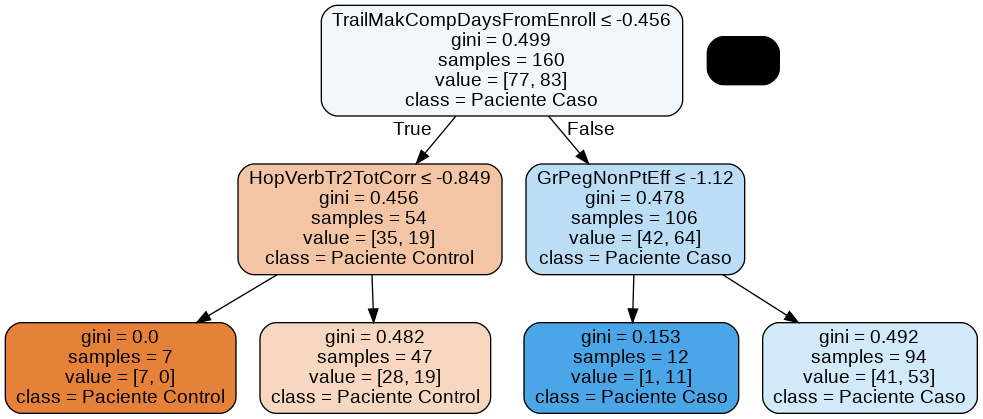

In [ ]:
# 4. Se representa la importancia de cada característica para el árbol diseñado
from matplotlib import pyplot
Arbol_clasif_all = DecisionTreeClassifier(max_depth=2)
modelo_arbol_clasif = Arbol_clasif_all.fit(X_train_SFS, Y_train)
y_output_arbol = modelo_arbol_clasif.predict(X_test_SFS)
importance_arbol = modelo_arbol_clasif.feature_importances_
pyplot.bar([x for x in range(len(importance_arbol))], importance_arbol)
pyplot.show()

# 5. Se representa gráficamente el modelo de clasificación
from sklearn.tree import export_graphviz
#from sklearn.externals.six import StringIO  
from six import StringIO
from IPython.display import Image  
import pydotplus

dot_data = StringIO()

export_graphviz(modelo_arbol_clasif, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = data.columns[[2, 3, 4, 7, 10, 19, 32, 43, 46, 50, 52, 54]],class_names=['Paciente Control','Paciente Caso'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Tree_Clasif_all.png')
Image(graph.create_png())

In [ ]:
print("El valor de precisión obtenido:", accuracy_score(Y_test, y_output_arbol))
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_arbol))
print("El valor de f1_score obtenido:", f1_score(Y_test, y_output_arbol))
print("El valor de sensibilidad es", recall_score(Y_test, y_output_arbol))

El valor de precisión obtenido: 0.4878048780487805
La matriz de confusión obtenida: [[13 10]
 [11  7]]
El valor de f1_score obtenido: 0.39999999999999997
El valor de sensibilidad es 0.3888888888888889


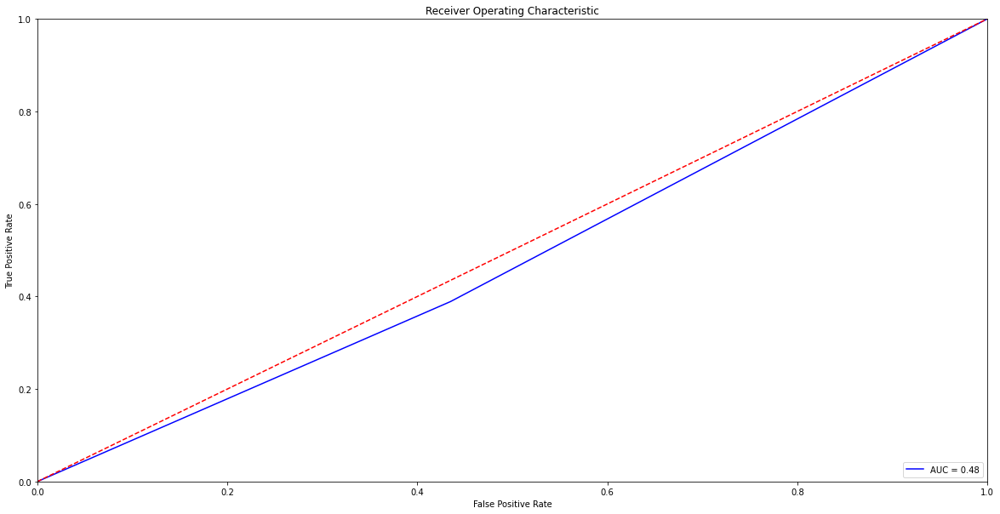

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_arbol)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
A1_score = accuracy_score(Y_test, y_output_arbol)
f11_score = f1_score(Y_test, y_output_arbol)
r1_score = recall_score(Y_test, y_output_arbol)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_output_arbol))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.4878048780487805
La matriz de confusión obtenida: [[13 10]
 [11  7]]
El valor de f1_score obtenido: 0.39999999999999997
El valor de recall es 0.3888888888888889


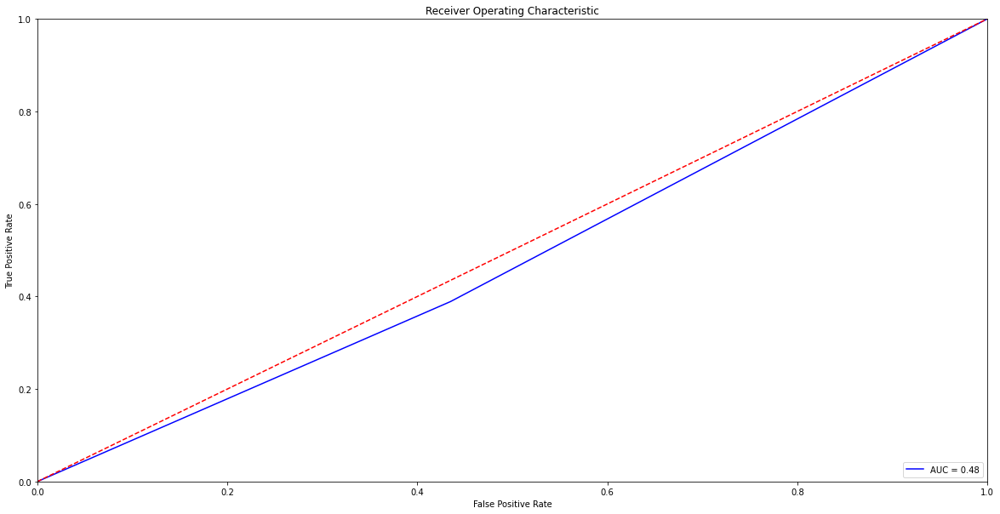

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_output_arbol)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

# ***SVC***

In [ ]:
# Regresión logística con regularización 
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection   
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

svc=SVC(decision_function_shape='ovo')

# logreg= LogisticRegression(solver='liblinear')
parameters = {'kernel': ['rbf','poly'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
                     'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]}# l1 lasso l2 ridge
# valor_C=np.array([1e-8,1e-4,1,10,100])
svc=GridSearchCV(svc, parameters, scoring='roc_auc', cv=5, return_train_score=True)

svc.fit(X_train_SFS, Y_train) #Entrenamos

# #Evaluamos las prestaciones para el conjunto de entrenamiento, de validación y representamos
roc_log_train = np.array(svc.cv_results_['mean_train_score']) 
roc_loc_val = np.array(svc.cv_results_['mean_test_score'])

# #Pintamos la evolución de nuestro modelo tanto en train como en validación para ver cuál es el mejor hiperparámetro para generalizar
# plt.plot(valor_C,roc_log_train,'-o',label="train", linewidth=2)
# plt.plot(valor_C,roc_loc_val,'-*b',label="val", linewidth=2)
# plt.xlabel('C',fontsize=14)
# plt.ylabel('Roc_auc',fontsize=14)
# plt.legend()
# plt.show()

# Mostramos el mejor valor del parámetro y el score
print("Valor correspondiente para el hiperparámetro: {}".format(svc.best_params_))
print("Mayor valor de la figura de mérito en validación con características estandarizadas: {:.3f}".format(svc.best_score_))


Valor correspondiente para el hiperparámetro: {'C': 0.001, 'gamma': 0.001, 'kernel': 'rbf'}
Mayor valor de la figura de mérito en validación con características estandarizadas: 0.647


In [ ]:


svc=SVC(C=0.001,kernel='rbf',gamma=0.001,decision_function_shape='ovo')
svc.fit(X_train_SFS,Y_train)
y_test_pred=svc.predict(X_test_SFS)

In [ ]:
A1_score = accuracy_score(Y_test, y_test_pred)
f11_score = f1_score(Y_test, y_test_pred)
r1_score = recall_score(Y_test, y_test_pred)

print("El valor de accuracy obtenido:", A1_score)
print("La matriz de confusión obtenida:", confusion_matrix(Y_test, y_test_pred))
print("El valor de f1_score obtenido:", f11_score)
print("El valor de recall es", r1_score)

El valor de accuracy obtenido: 0.43902439024390244
La matriz de confusión obtenida: [[ 0 23]
 [ 0 18]]
El valor de f1_score obtenido: 0.6101694915254238
El valor de recall es 1.0


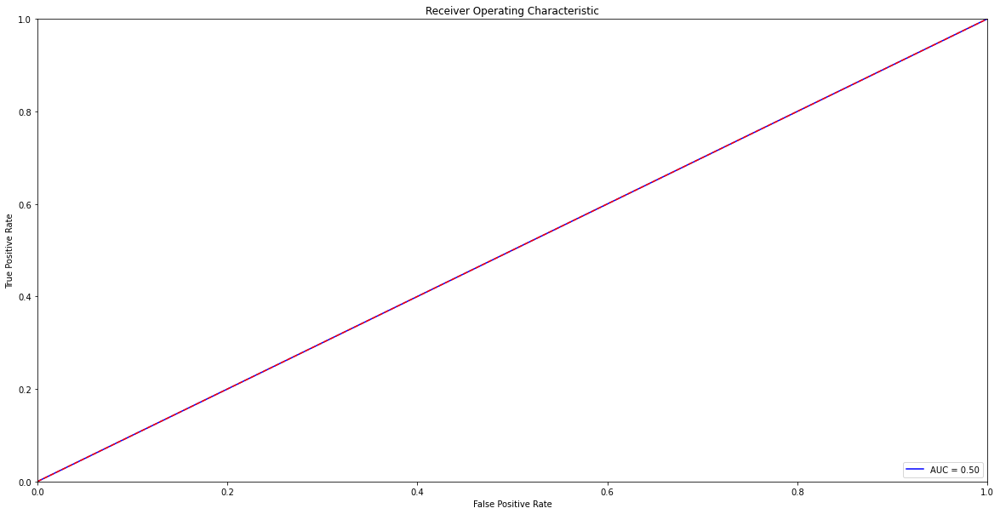

In [ ]:
fpr, tpr, threshold = metrics.roc_curve(Y_test, y_test_pred)
roc_auc_1 = metrics.auc(fpr, tpr)
# AUC_results.append(roc_auc_1)

# Plot the ROC curve
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc_1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
res_accuracy.append(A1_score)
res_recall.append(r1_score)
res_f1.append(f11_score)
res_roc.append(roc_auc_1)

In [ ]:
results = pd.DataFrame()

results["Accuracy"]=res_accuracy
results["Recall"]=res_recall
results["F1-score"]=res_f1
results["Auc"]=res_roc

#results
results["Modelos"] = ["Regresión logística-árbol", "Knn-árbol","Árbol-arbol","SVC-árbol","Regresión logística-ANOVA", "Knn-ANOVA","Árbol-ANOVA","SVC-ANOVA","Regresión logística-SFS-knn", "Knn-SFS-knn","Árbol-SFS-knn","SVC-SFS-knn","Regresión logística-SBE-knn", "Knn-SBE-knn","Árbol-SBE-knn","SVC-SBE-knn"]
results.set_index("Modelos", inplace = True)

In [ ]:
results

,Accuracy,Recall,F1-score,Auc
Modelos,,,,
Regresión logística-árbol,0.609756,0.388889,0.466667,0.585749
Knn-árbol,0.609756,0.277778,0.384615,0.573671
Árbol-arbol,0.487805,0.500000,0.461538,0.489130
SVC-árbol,0.560976,0.222222,0.307692,0.524155
Regresión logística-ANOVA,0.585366,0.500000,0.514286,0.576087
Knn-ANOVA,0.560976,0.555556,0.526316,0.560386
Árbol-ANOVA,0.463415,0.555556,0.476190,0.473430
SVC-ANOVA,0.439024,1.000000,0.610169,0.500000
Regresión logística-SFS-knn,0.536585,0.611111,0.536585,0.544686
